In [16]:
install.packages('raster', lib="/stor/home/fri_esanchez")

In [17]:
require('raster', lib.loc= "/stor/home/fri_esanchez")


In [92]:
write.csv(df, file = "coord.csv")

In [91]:
df<-df[,c(3,12,11)]

In [2]:
require('raster', lib.loc= "/stor/home/fri_esanchez")

Loading required package: raster
Loading required package: sp


In [18]:
r <- getData("worldclim",var="bio",res=10)

In [20]:
r <- r[[c(1,12)]]
names(r) <- c("Temp","Prec")

In [334]:
d_f[c(3,2)]

class       : RasterStack 
dimensions  : 900, 2160, 1944000, 2  (nrow, ncol, ncell, nlayers)
resolution  : 0.1666667, 0.1666667  (x, y)
extent      : -180, 180, -60, 90  (xmin, xmax, ymin, ymax)
coord. ref. : +proj=longlat +datum=WGS84 
names       : Temp, Prec 


In [335]:
values <- extract(r,d_f[c(3,2)])

In [338]:
d_f<-cbind(d_f,values)

In [3]:
require("randomForest")
require("e1071")
require('penalizedSVM', lib.loc="/stor/home/fri_esanchez")
require('party', lib.loc= "/stor/home/fri_esanchez")
require('caret', lib.loc= "/stor/home/fri_esanchez")
library(ggplot2)
library(caret)
library(plyr)
library(dplyr)

Loading required package: randomForest
randomForest 4.6-14
Type rfNews() to see new features/changes/bug fixes.
Loading required package: e1071

Attaching package: 'e1071'

The following object is masked from 'package:raster':

    interpolate

Loading required package: penalizedSVM
Loading required package: MASS

Attaching package: 'MASS'

The following objects are masked from 'package:raster':

    area, select

Loading required package: corpcor
Loading required package: statmod
Loading required package: party
Loading required package: grid
Loading required package: mvtnorm
Loading required package: modeltools
Loading required package: stats4
Loading required package: strucchange
Loading required package: zoo

Attaching package: 'zoo'

The following objects are masked from 'package:base':

    as.Date, as.Date.numeric

Loading required package: sandwich
Loading required package: caret
Loading required package: lattice
Loading required package: ggplot2

Attaching package: 'ggplot2'

T

In [4]:
#Merge elevations with language df
dsf = read.csv("Phon_DS.csv", header = TRUE, stringsAsFactors = FALSE)

elev <- read.csv("elevations.csv", header = TRUE, stringsAsFactors = FALSE)

elev<-elev[,c(4,5)]

names(elev)[2]<-'Glottolog'

m<-merge(m,elev, all = FALSE)

In [13]:
#For elevation crreate a triquantile for analysis
m$Climate<-as.factor(as.character(m$Climate))

m %>% mutate(tritile = ntile(elevation, 3)) -> m_tri

In [15]:
m_tri<-m_tri[,c(9:ncol(m_tri),2)]

In [72]:
m_tri[,c(1:(ncol(m_tri)-3))]<- apply(m_tri[,c(1:(ncol(m_tri)-3))], 2, as.character)

m_tri[,c(1:(ncol(m_tri)-3))]<- apply(m_tri[,c(1:(ncol(m_tri)-3))], 2, as.numeric)

In [76]:
m_tri<-m_tri[,c(1:(ncol(m_tri)-3),ncol(m_tri)-1,ncol(m_tri))]

In [77]:
high_m <-subset(m_tri, tritile == 3)

med_m <-subset(m_tri, tritile == 2)

l_m <-subset(m_tri, tritile == 1)

In [82]:
high_m <- high_m[,-(ncol(high_m)-1)]
med_m <- med_m[,-(ncol(med_m)-1)]
l_m <- l_m[,-(ncol(l_m)-1)]

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.829585798816568
[1] "RF Confusion Matrix:"
   
      A   X
  A 307  66
  X  78 394
[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.828571428571429
[1] "RF Confusion Matrix:"
   
      A   X
  A 317  70
  X  68 350


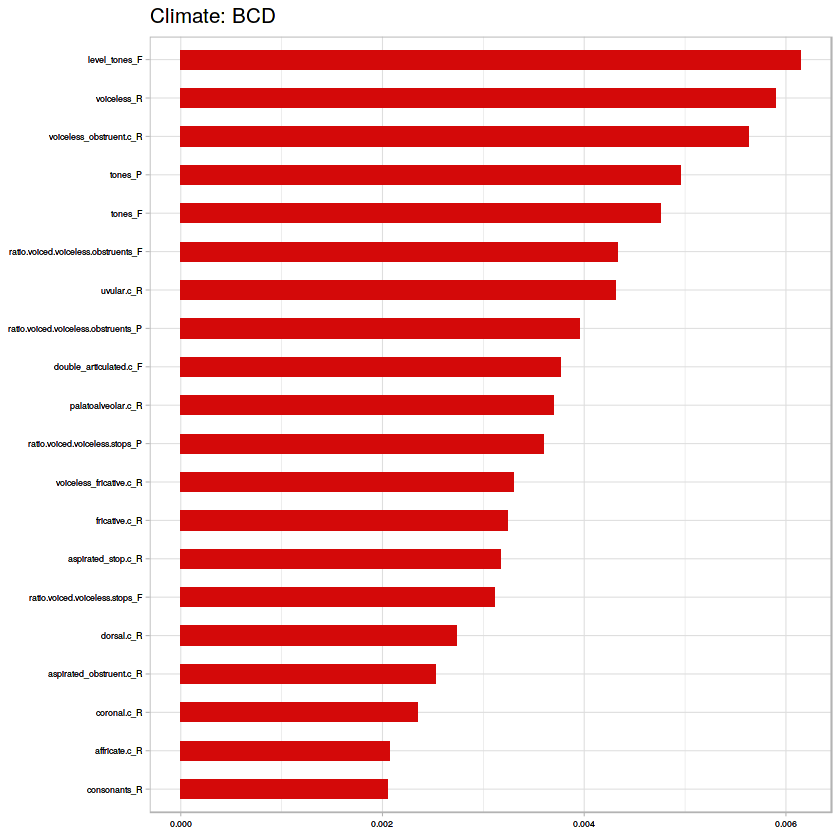

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.855241264559068
[1] "RF Confusion Matrix:"
   
      A   X
  A 375  77
  X  10 139


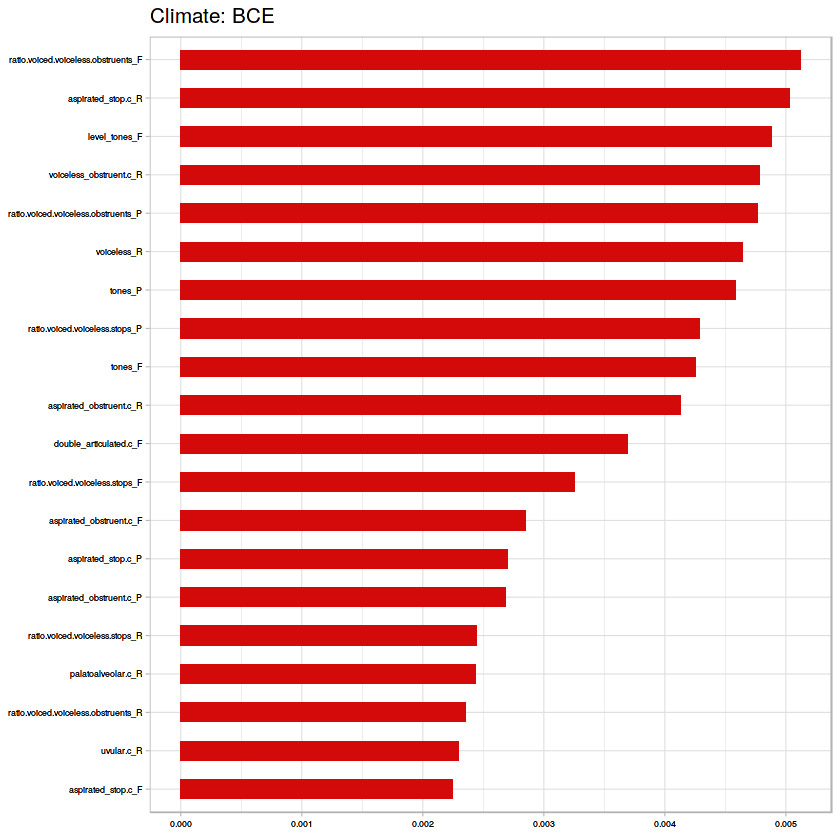

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.826666666666667
[1] "RF Confusion Matrix:"
   
      A   X
  A 339  84
  X  46 281


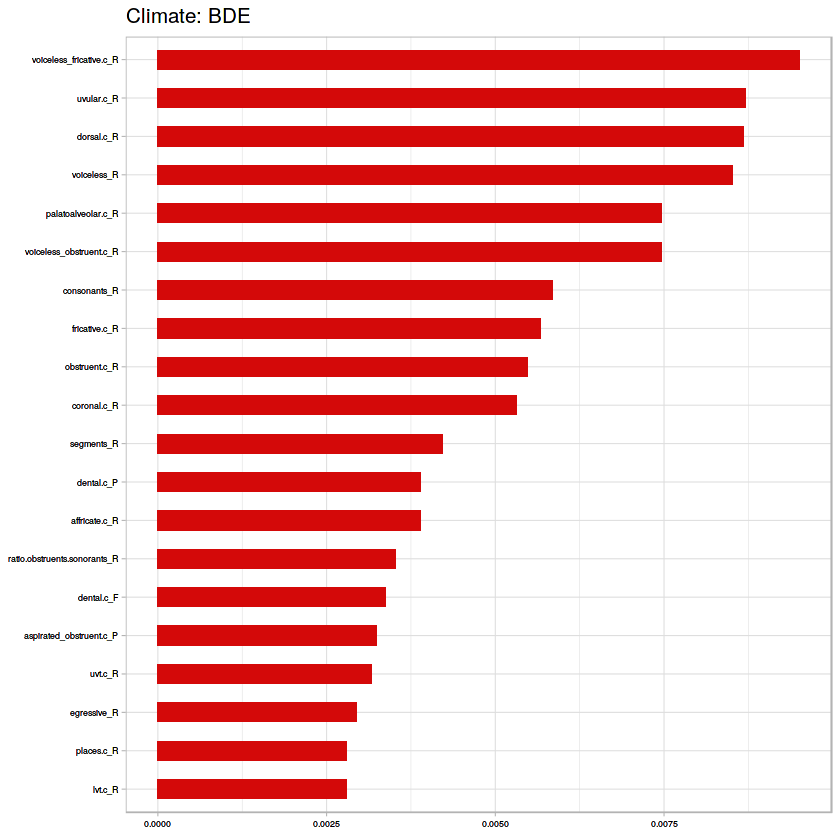

[1] "B" "C"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.825192802056555
[1] "RF Confusion Matrix:"
   
      A   X
  A 321  72
  X  64 321


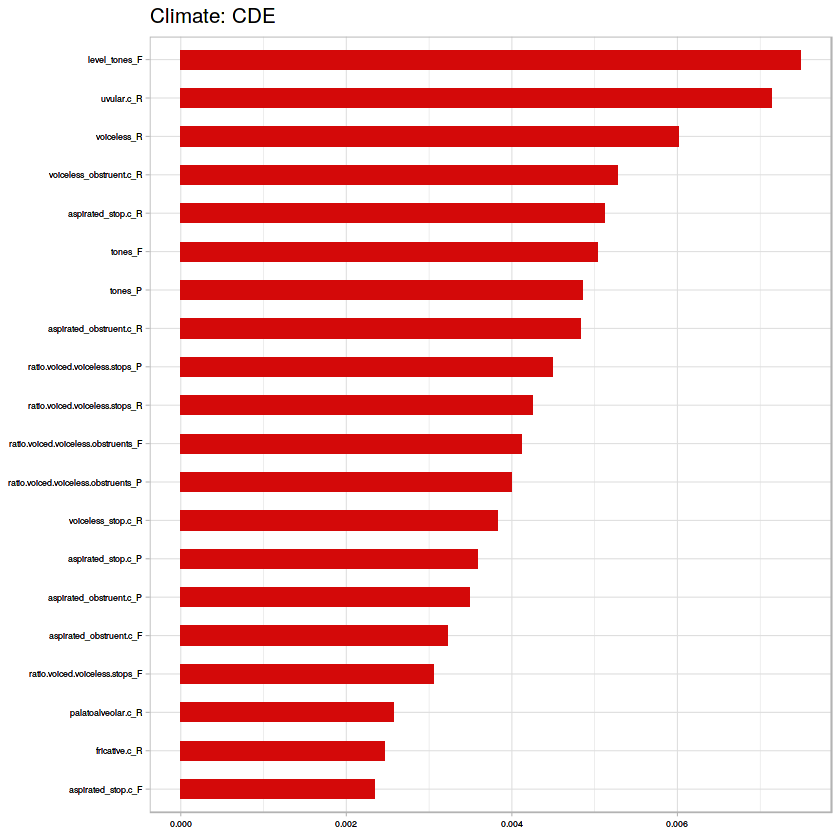

[1] "B" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.857142857142857
[1] "RF Confusion Matrix:"
   
      A   X
  A 377  74
  X   8 115


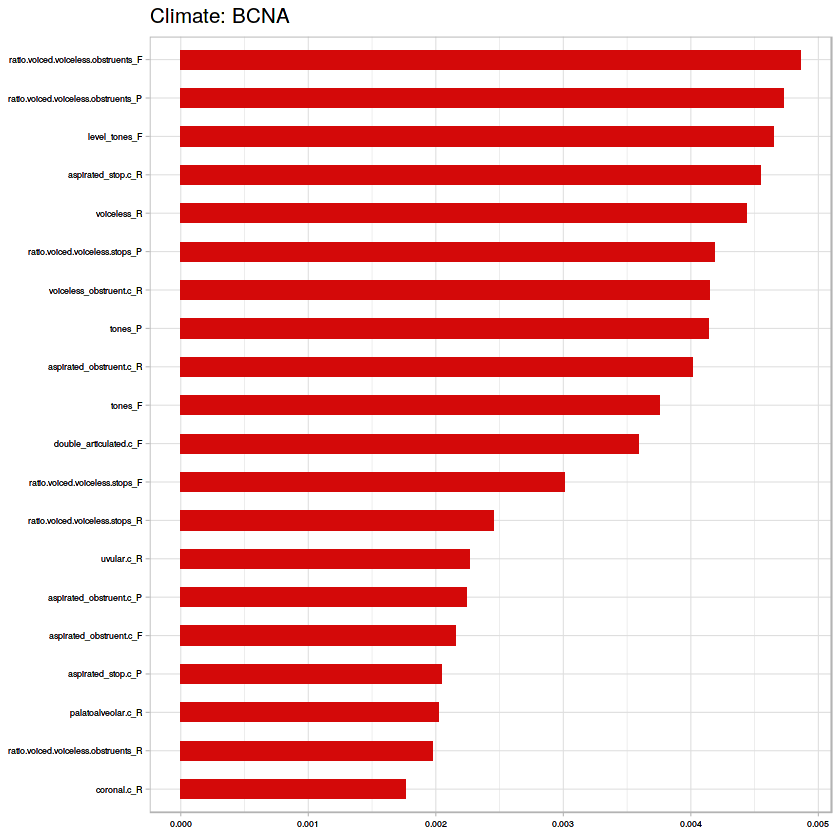

[1] "B" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.857677902621723
[1] "RF Confusion Matrix:"
   
      A   X
  A 384  75
  X   1  74


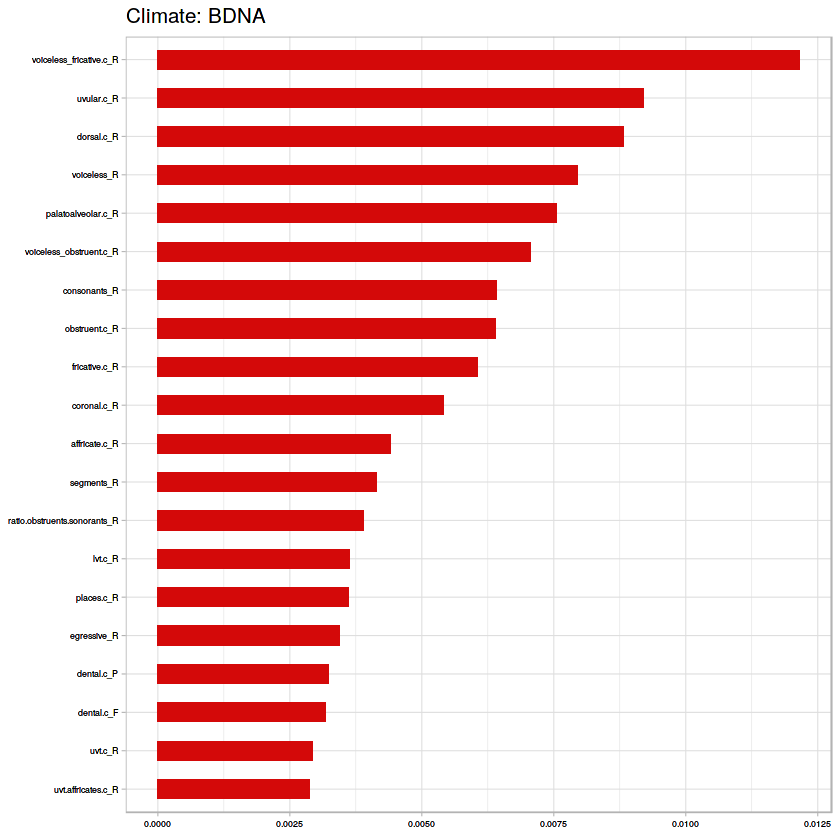

[1] "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.817427385892116
[1] "RF Confusion Matrix:"
   
      A   X
  A 345  92
  X  40 246


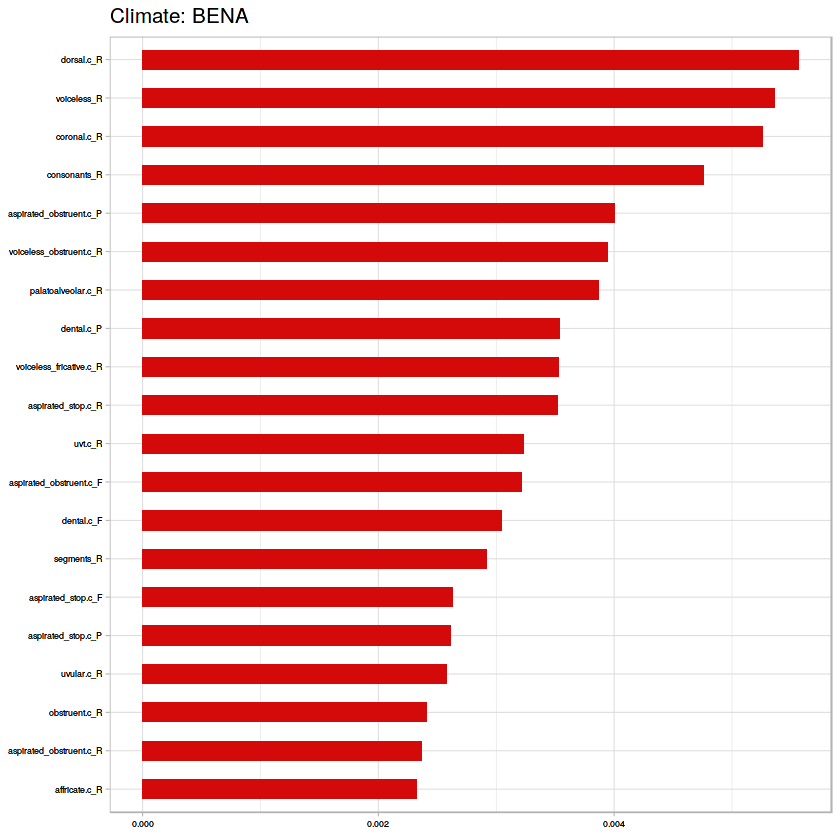

[1] "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.809663250366032
[1] "RF Confusion Matrix:"
   
      A   X
  A 356 101
  X  29 197


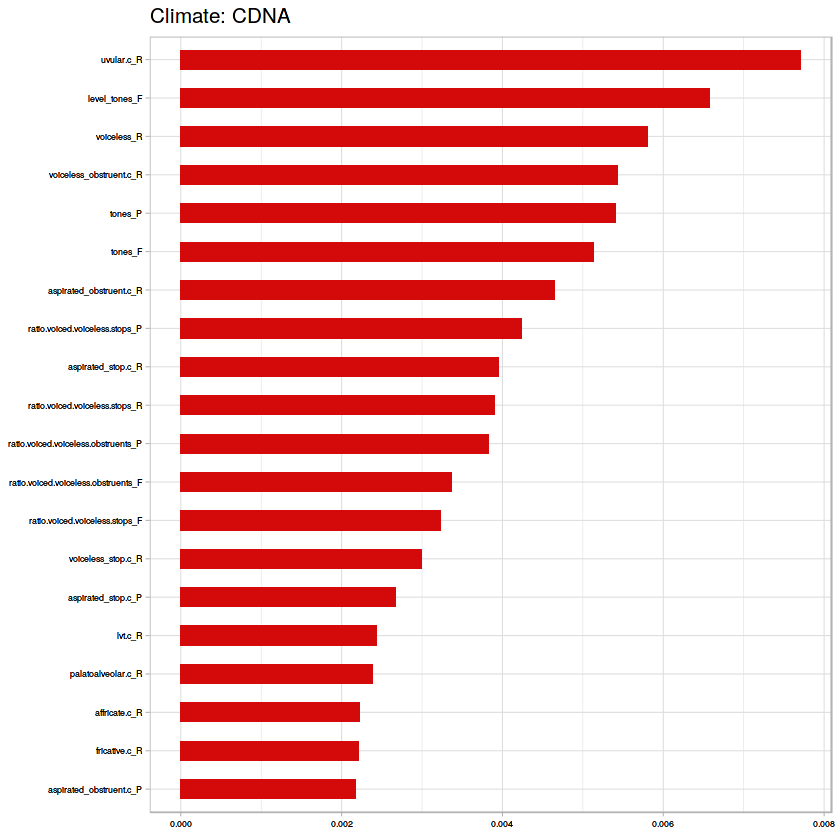

[1] "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.914405010438413
[1] "RF Confusion Matrix:"
   
      A   X
  A 384  40
  X   1  54


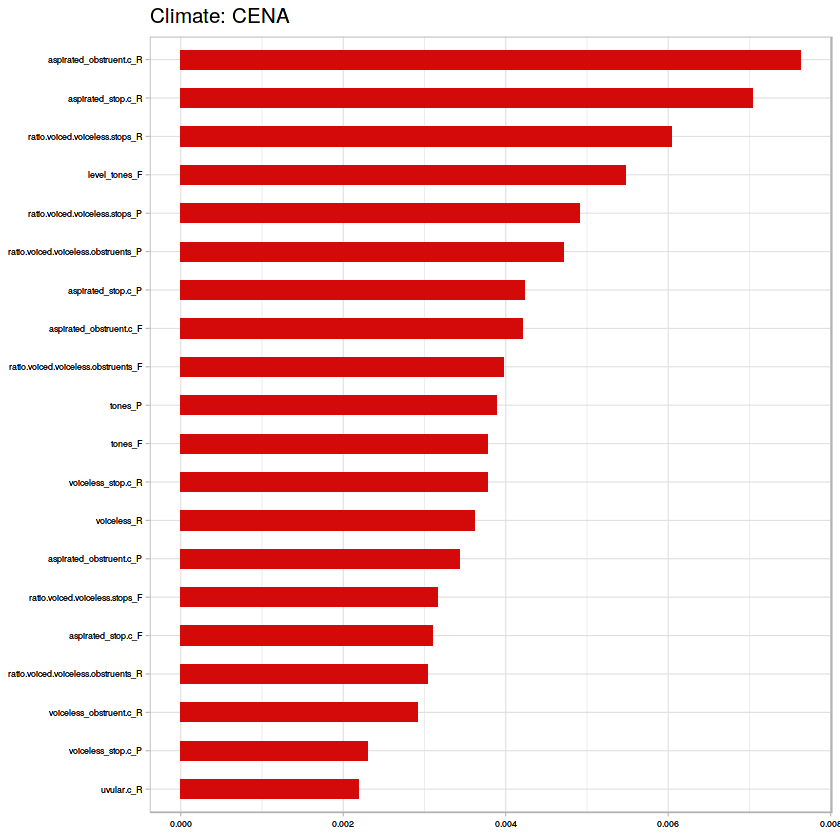

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.5064237
[1] C-V accuracy for Random Forest is 0.839449541284404
[1] "RF Confusion Matrix:"
   
      A   X
  A 303  58
  X  82 429


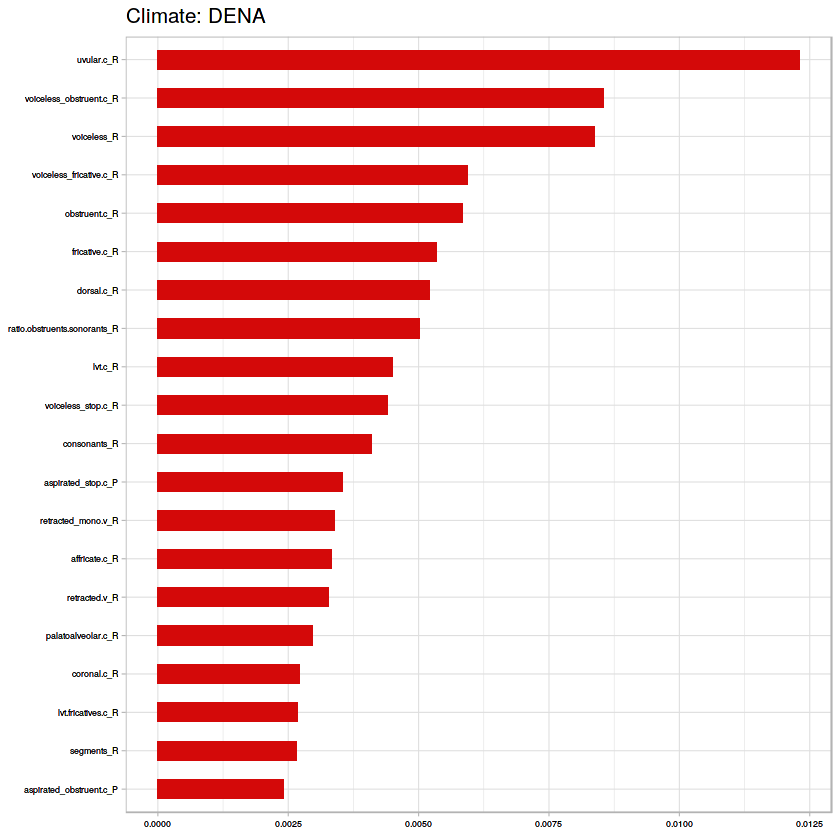

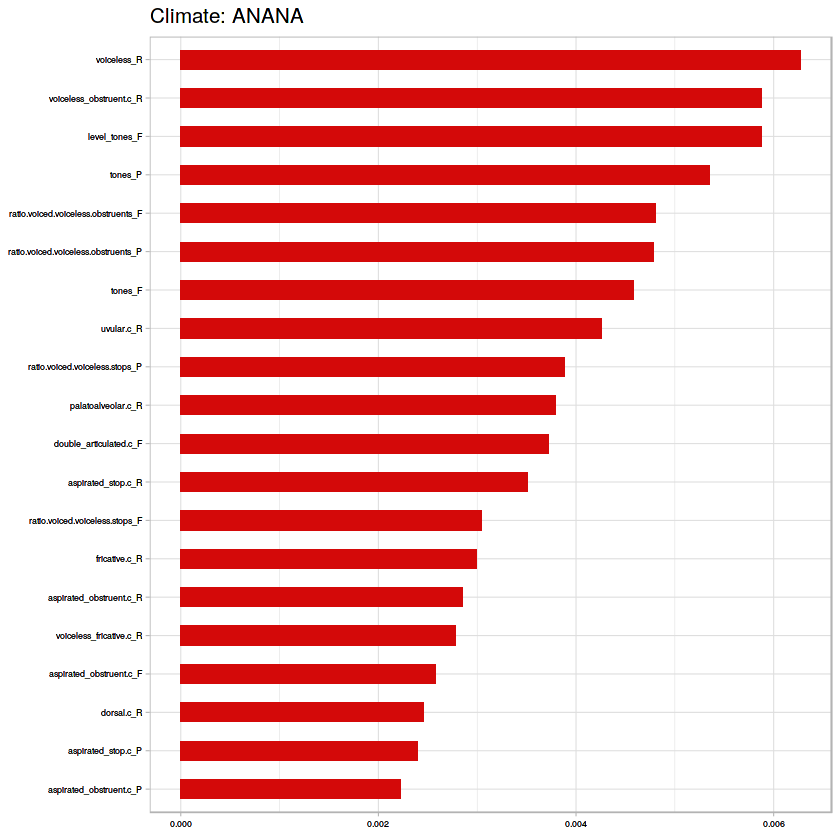

[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.7593154
[1] C-V accuracy for Random Forest is 0.879587155963303
[1] "RF Confusion Matrix:"
   
      B   X
  B  18   1
  X 104 749


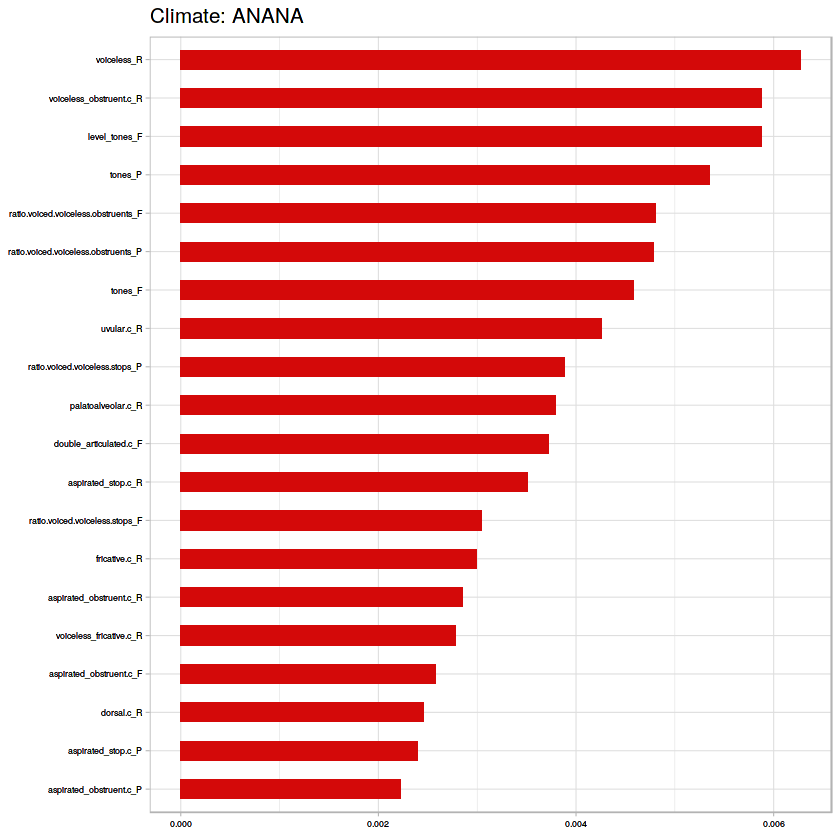

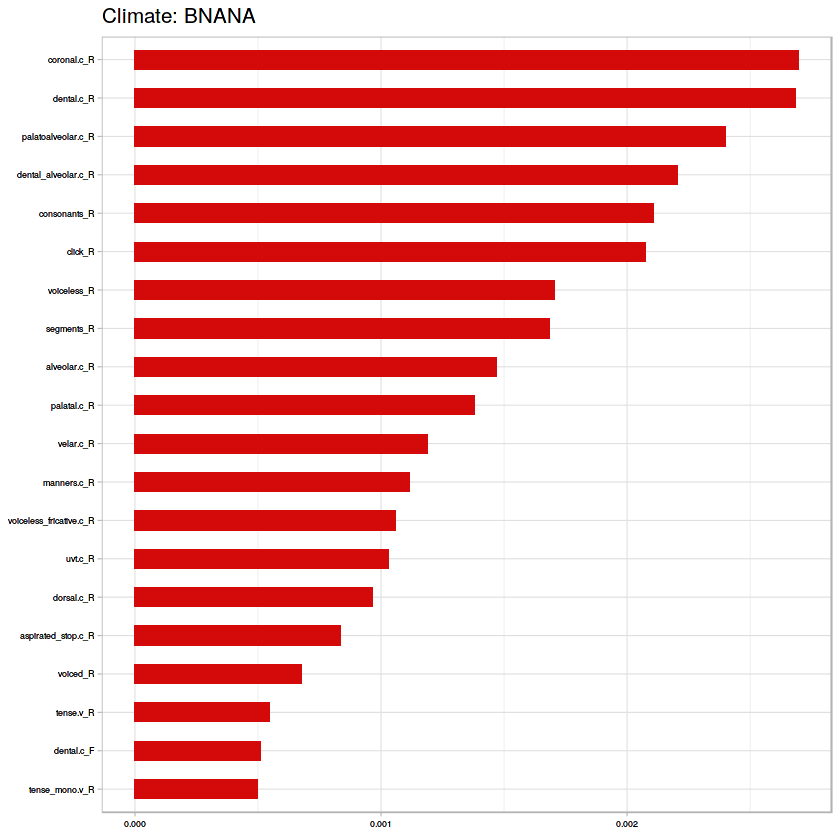

[1] "All vs Temperate"
[1] "Dummy Classifier accuracy:"
[1] 0.571344
[1] C-V accuracy for Random Forest is 0.744266055045872
[1] "RF Confusion Matrix:"
   
      C   X
  C  48   0
  X 223 601


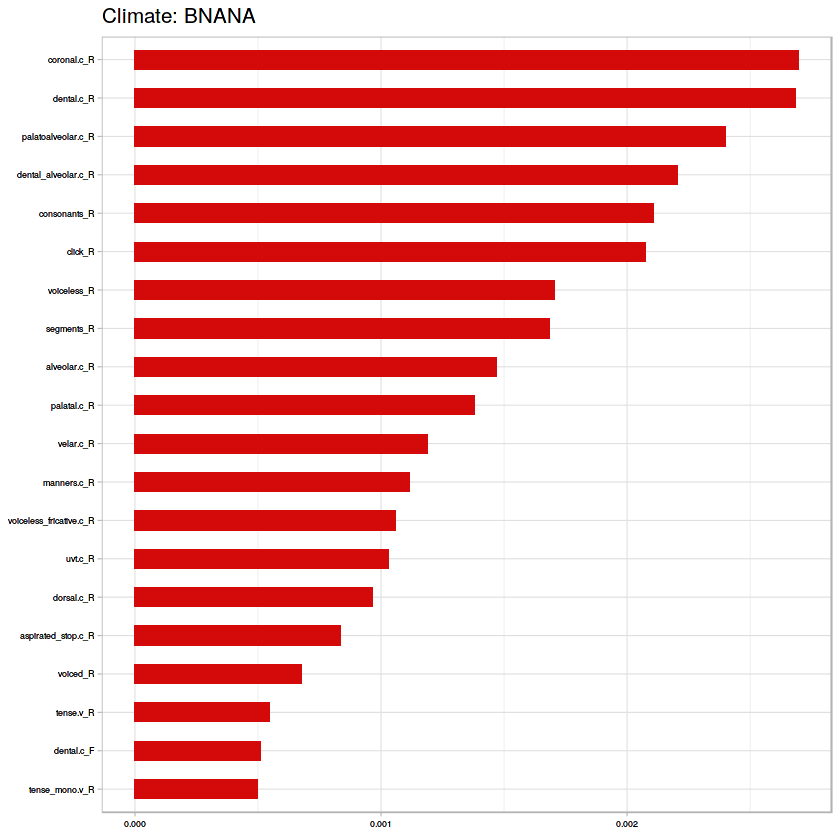

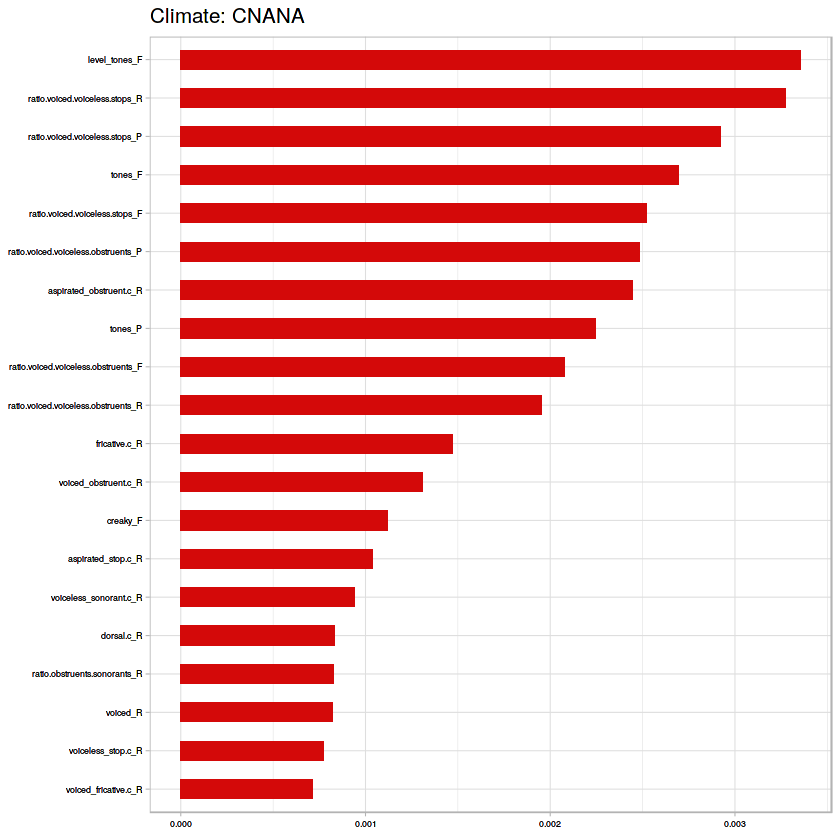

[1] "All vs Cold"
[1] "Dummy Classifier accuracy:"
[1] 0.8580946
[1] C-V accuracy for Random Forest is 0.942660550458716
[1] "RF Confusion Matrix:"
   
      D   X
  D  17   0
  X  50 805


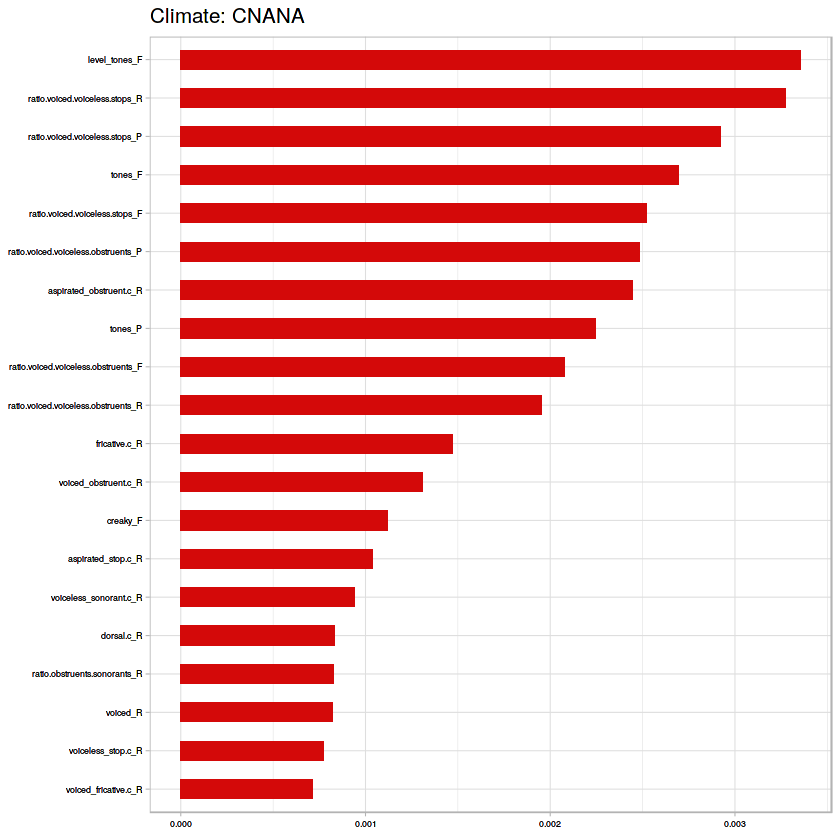

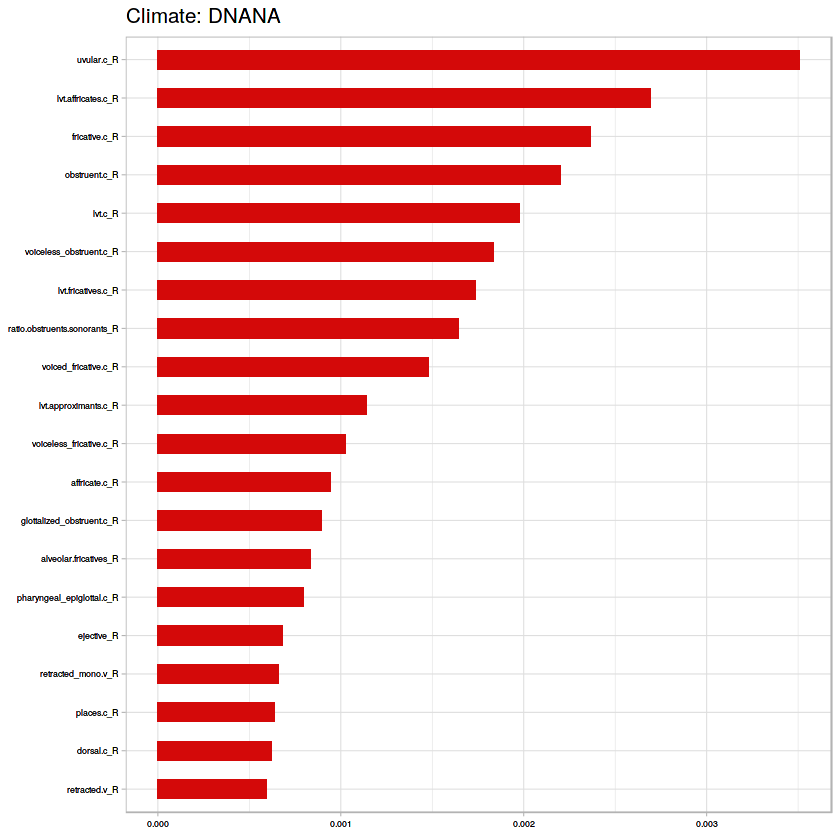

[1] "All vs Polar"
[1] "Dummy Classifier accuracy:"
[1] 0.9398607
[1] C-V accuracy for Random Forest is 0.969036697247706
[1] "RF Confusion Matrix:"
   
      E   X
  E   0   0
  X  27 845


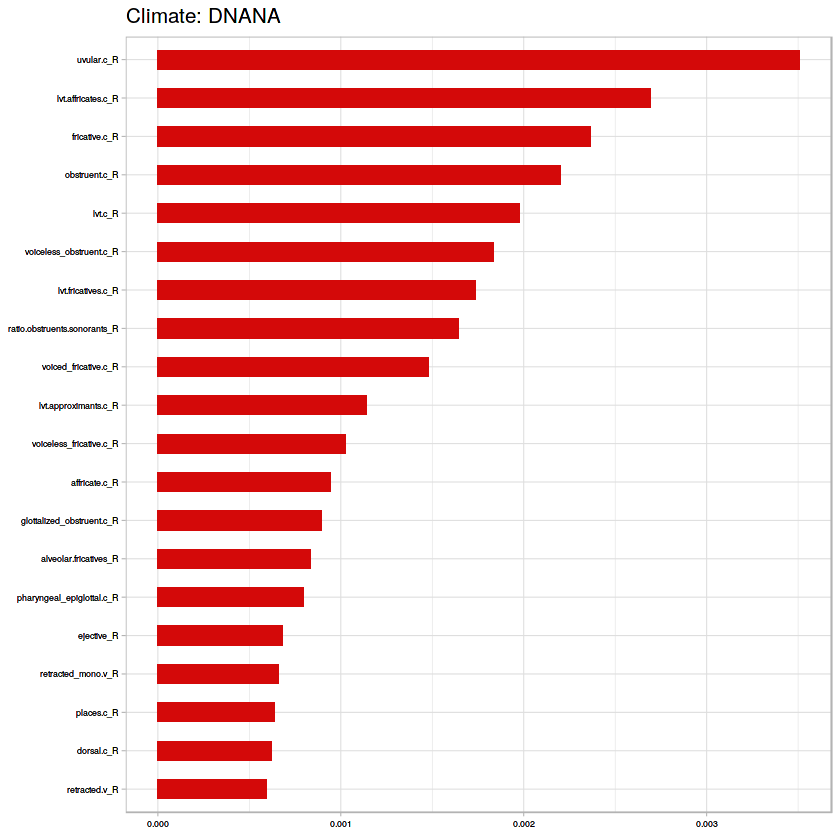

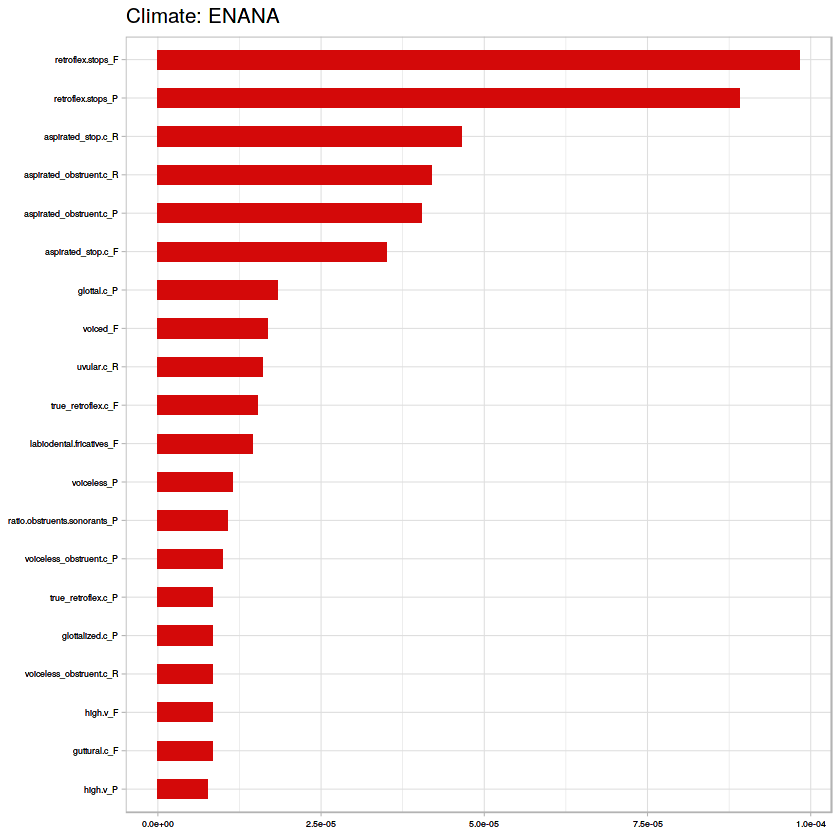

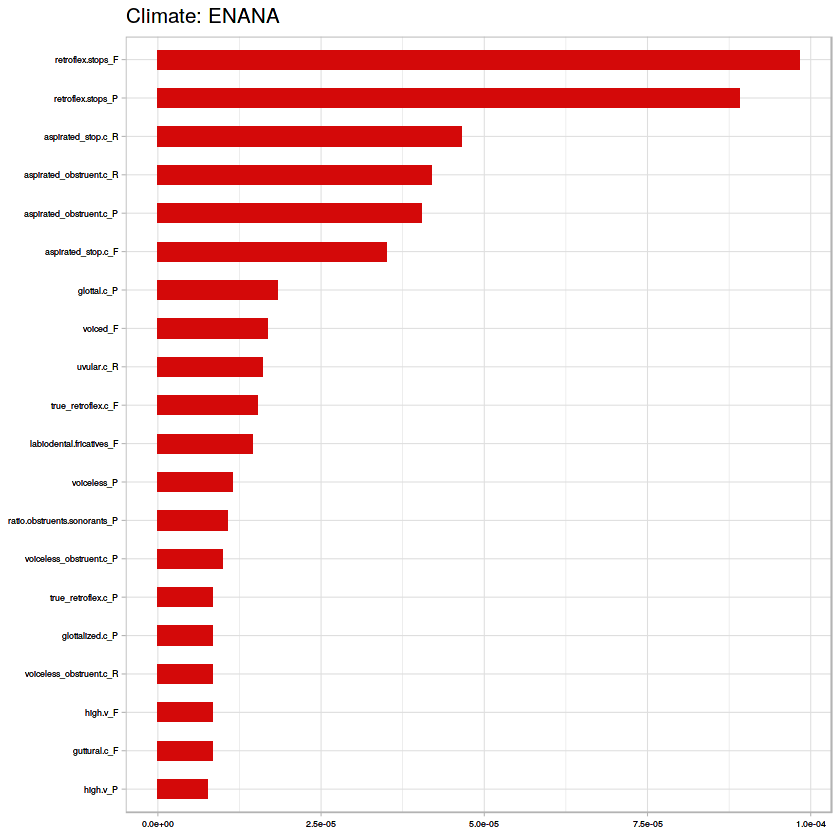

In [89]:
bin_tropvs(high_m)
ovsa(high_m)

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.852193995381062
[1] "RF Confusion Matrix:"
   
      A   X
  A 592 112
  X  16 146
[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.860576923076923
[1] "RF Confusion Matrix:"
   
      A   X
  A 595 103
  X  13 121


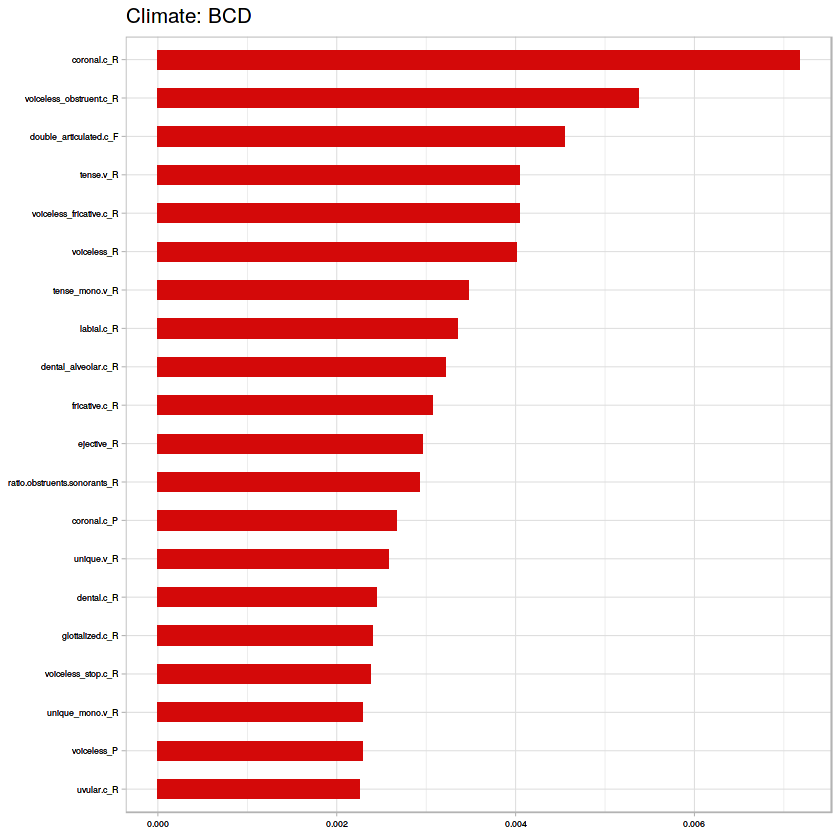

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.865979381443299
[1] "RF Confusion Matrix:"
   
      A   X
  A 603  99
  X   5  69


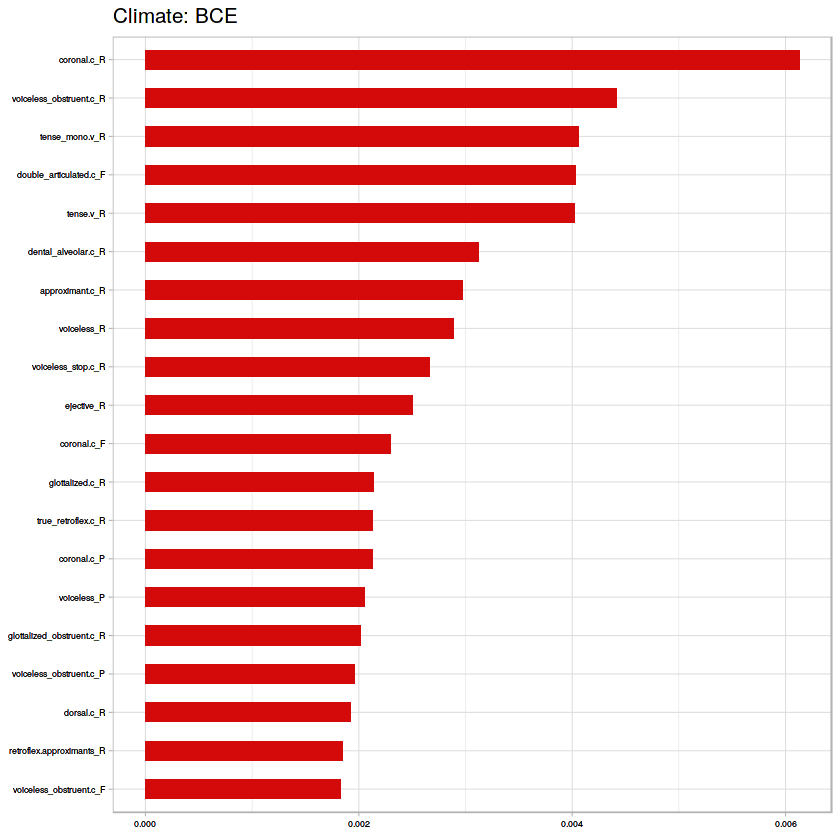

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.884462151394422
[1] "RF Confusion Matrix:"
   
      A   X
  A 603  82
  X   5  63


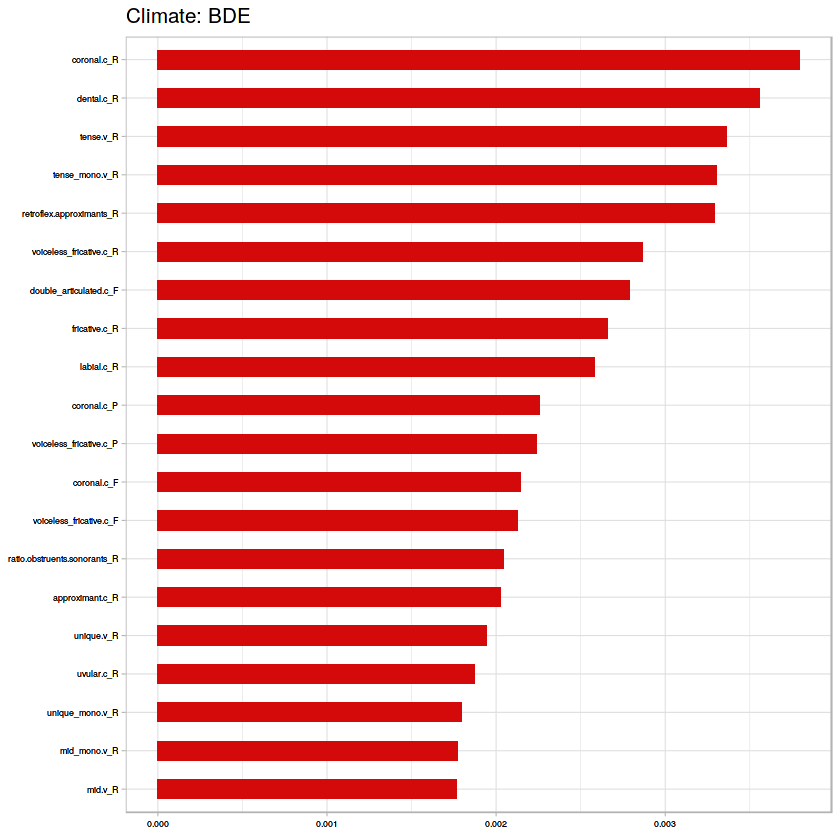

[1] "B" "C"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.854545454545454
[1] "RF Confusion Matrix:"
   
      A   X
  A 594 106
  X  14 111


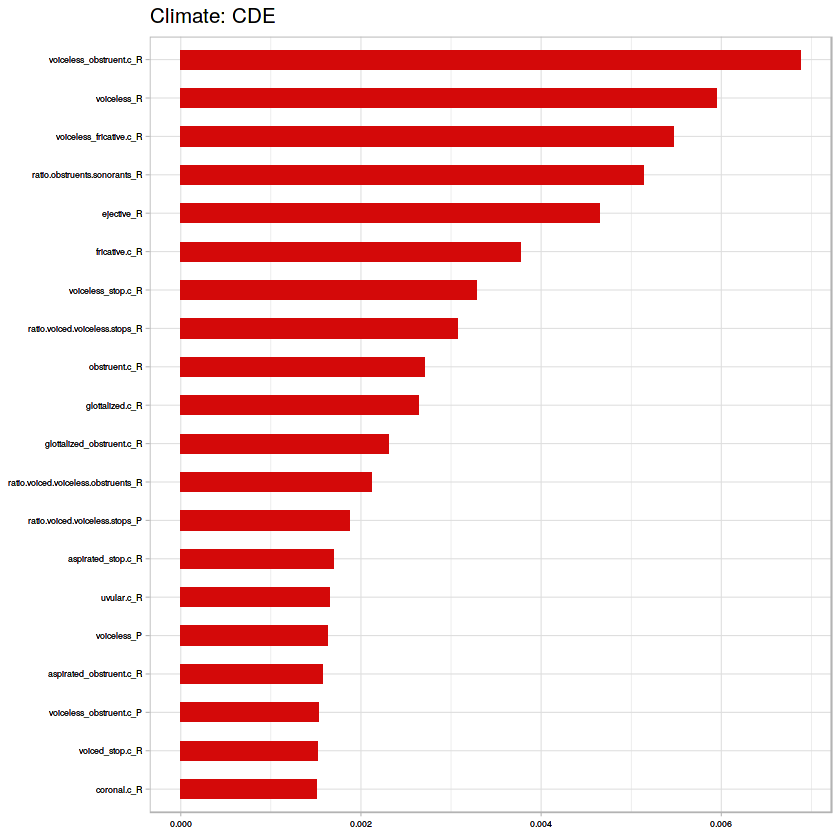

[1] "B" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.863459037711313
[1] "RF Confusion Matrix:"
   
      A   X
  A 603 100
  X   5  61


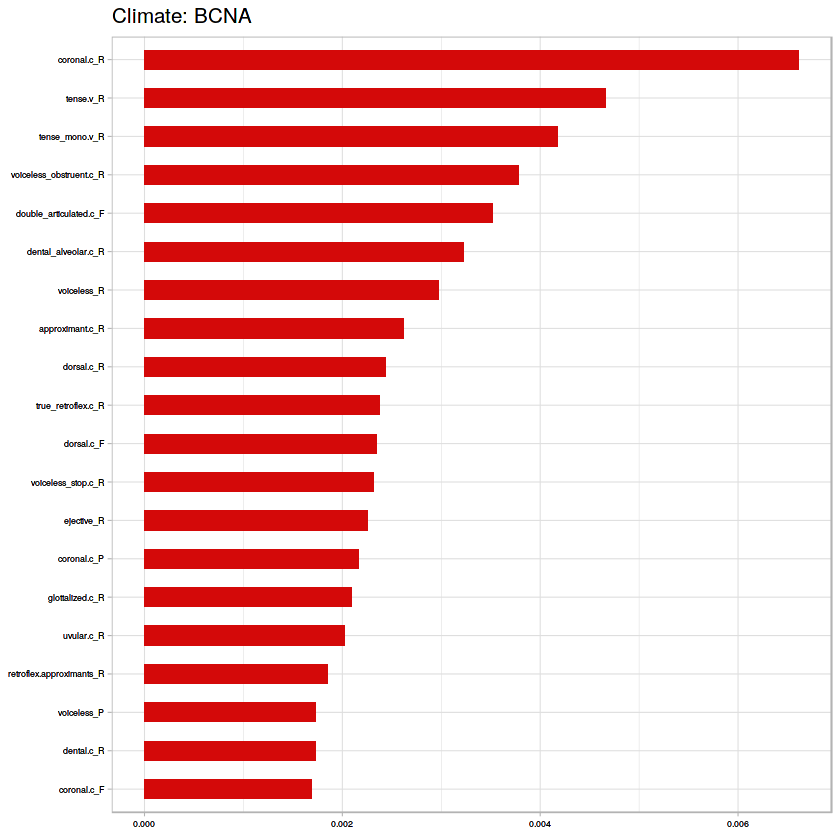

[1] "B" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.874829931972789
[1] "RF Confusion Matrix:"
   
      A   X
  A 606  90
  X   2  37


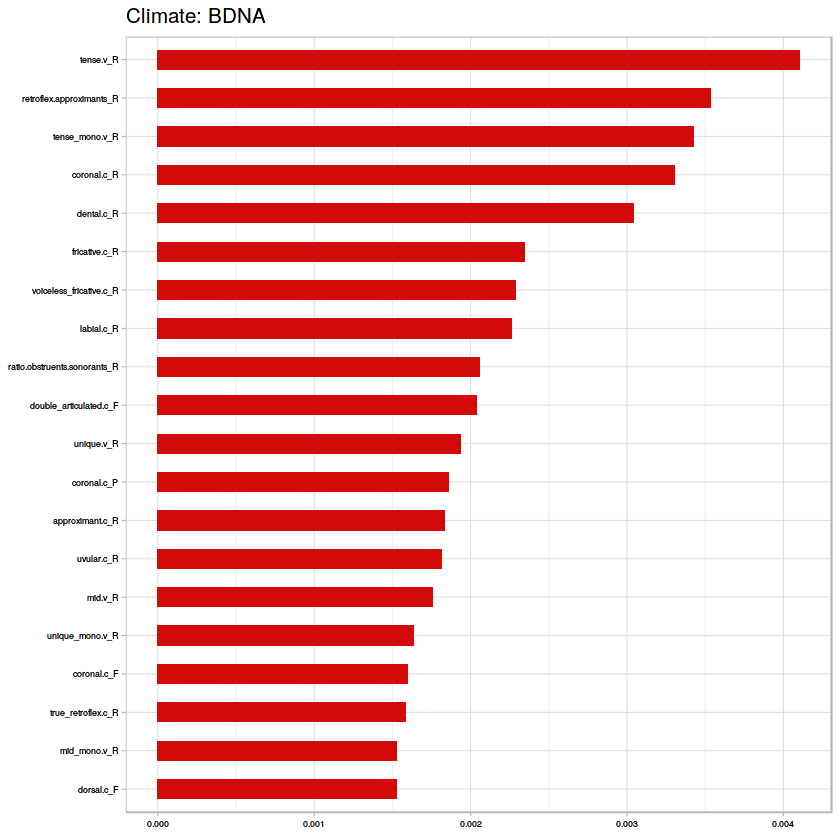

[1] "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.890080428954424
[1] "RF Confusion Matrix:"
   
      A   X
  A 603  77
  X   5  61


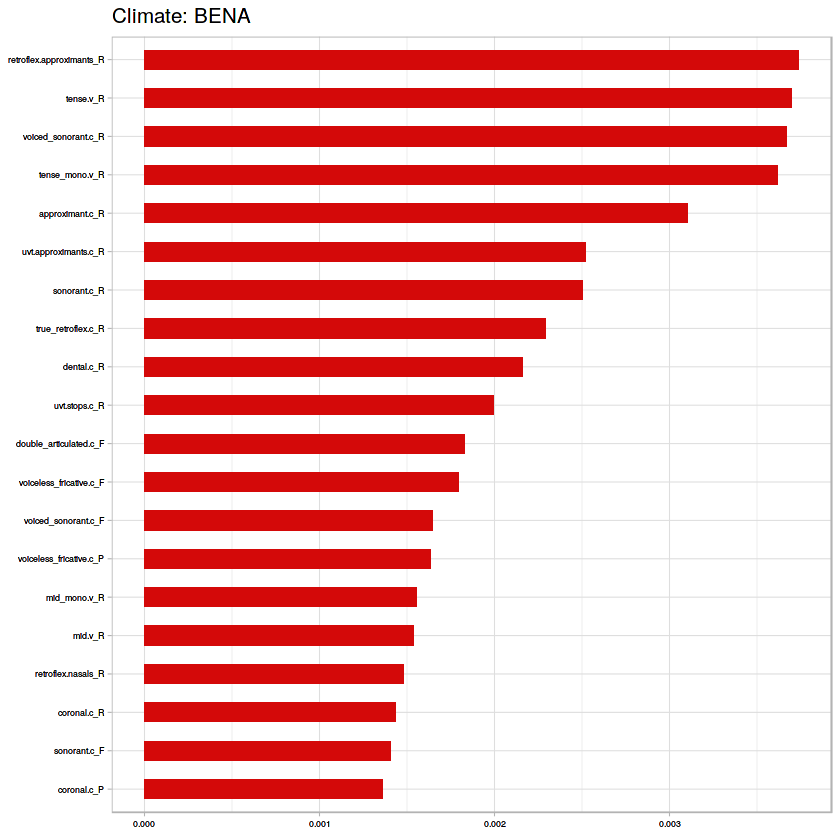

[1] "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.89185393258427
[1] "RF Confusion Matrix:"
   
      A   X
  A 606  75
  X   2  29


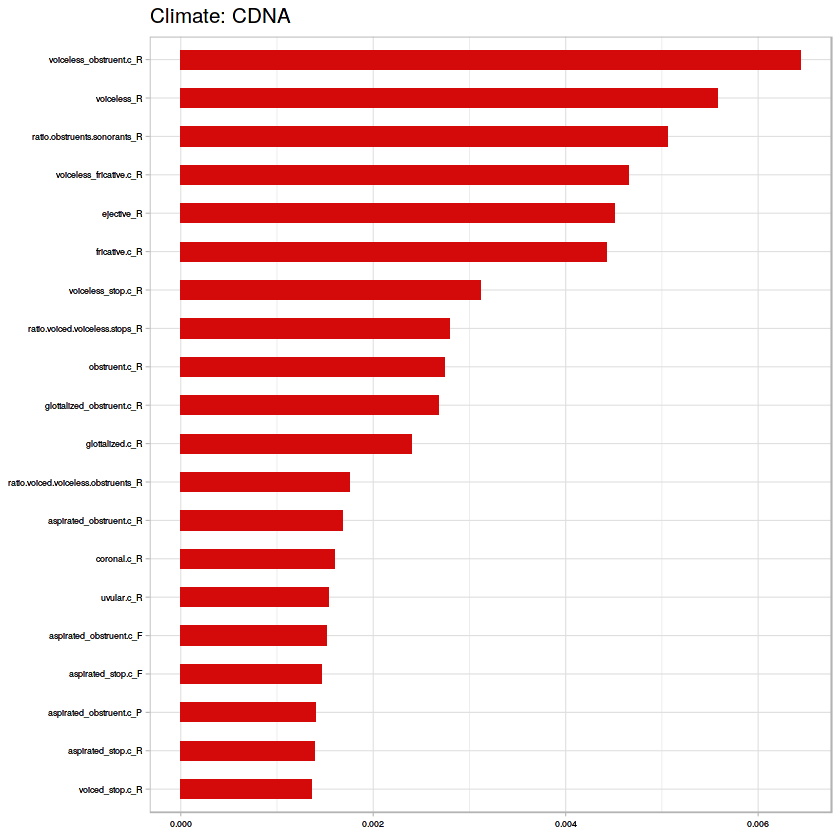

[1] "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.9375
[1] "RF Confusion Matrix:"
   
      A   X
  A 608  41
  X   0   7


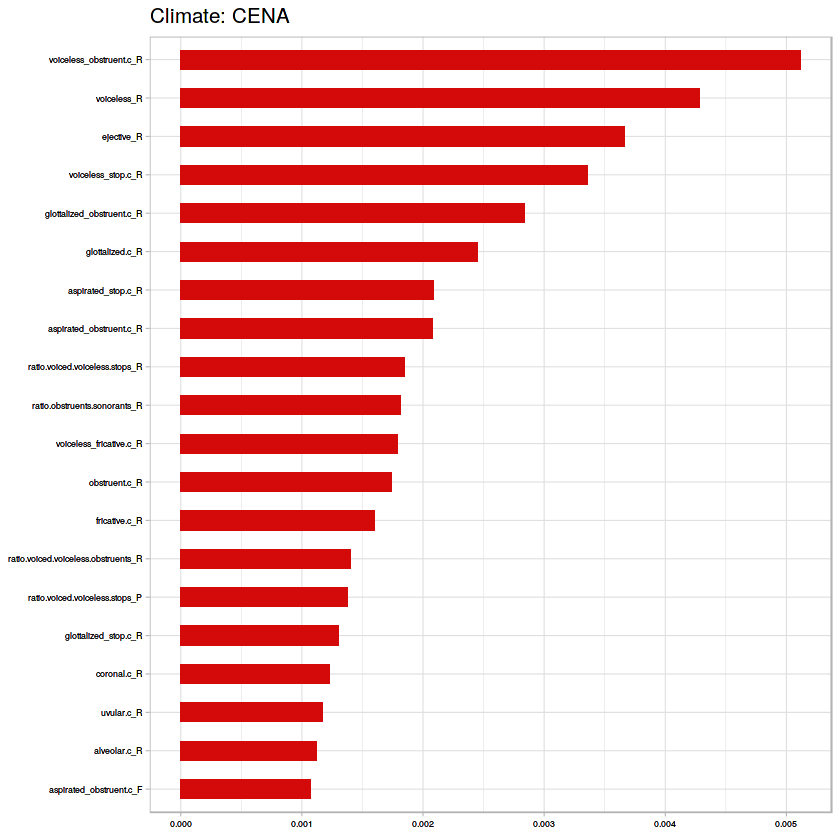

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.5767864
[1] C-V accuracy for Random Forest is 0.854524627720504
[1] "RF Confusion Matrix:"
   
      A   X
  A 591 110
  X  17 155


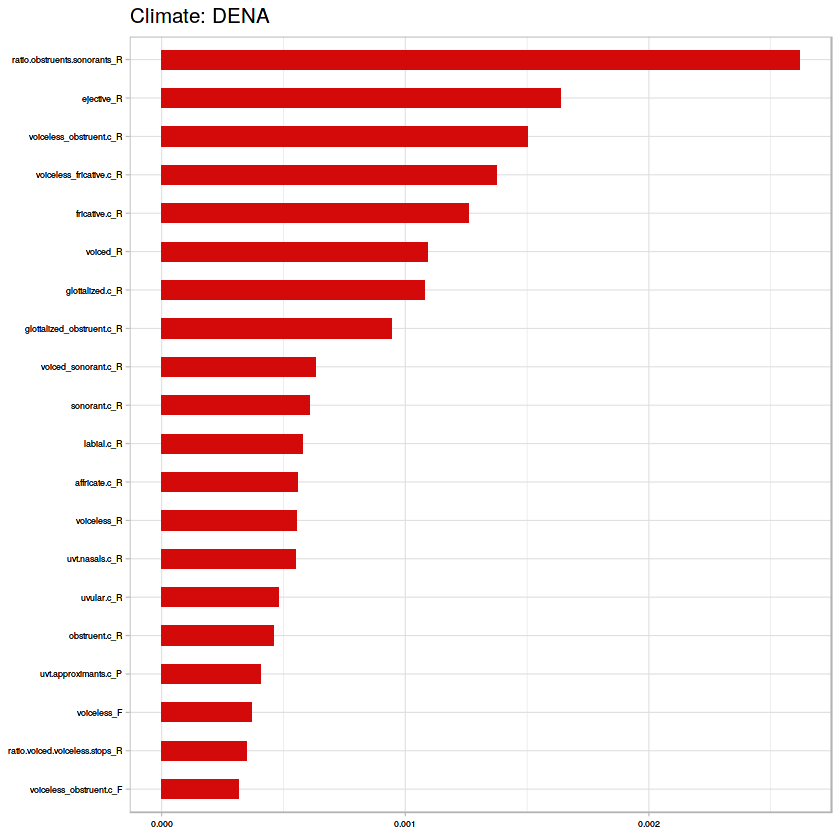

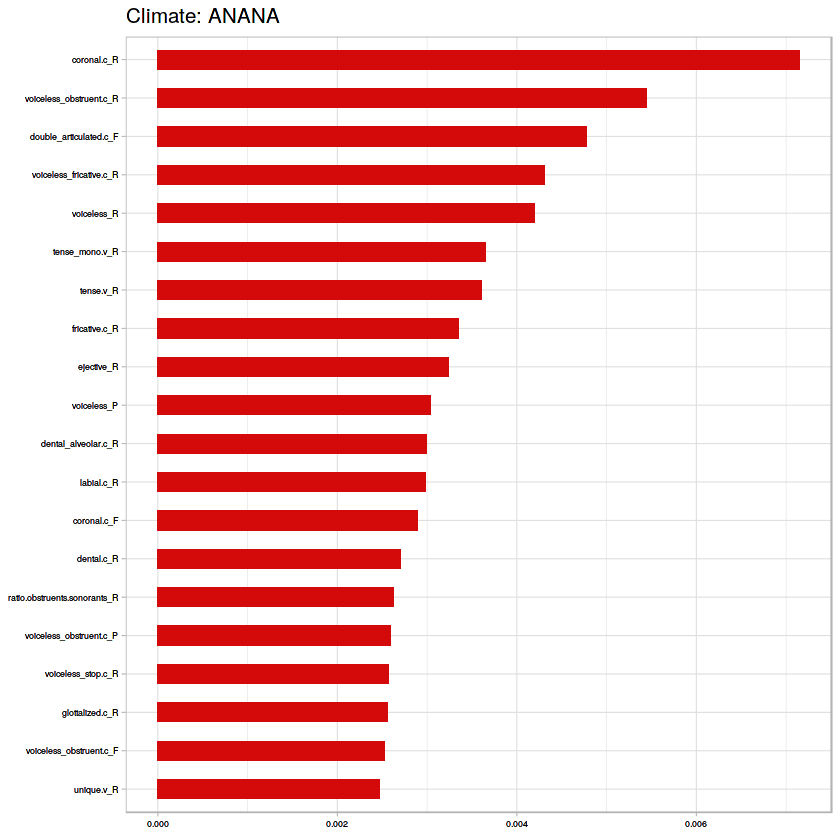

[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.7625607
[1] C-V accuracy for Random Forest is 0.892325315005727
[1] "RF Confusion Matrix:"
   
      B   X
  B  28   2
  X  92 751


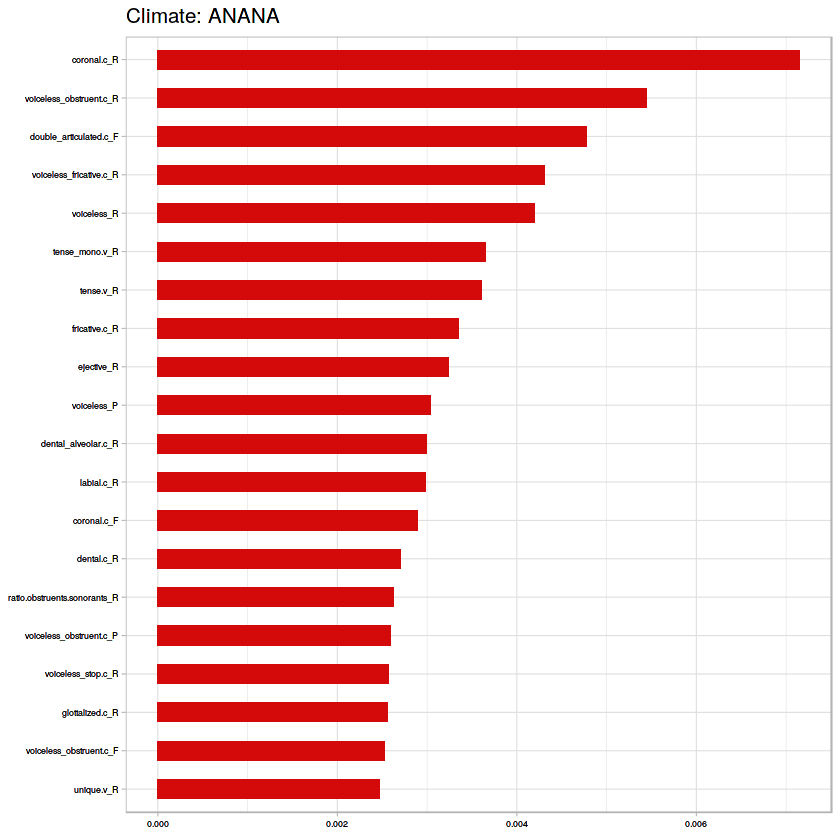

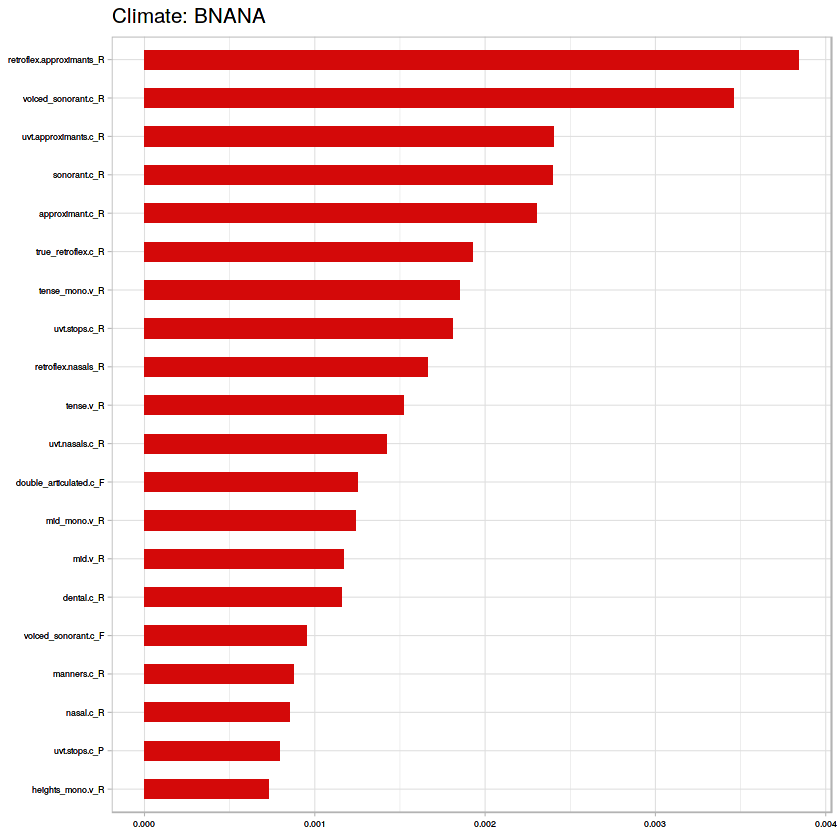

[1] "All vs Temperate"
[1] "Dummy Classifier accuracy:"
[1] 0.8021615
[1] C-V accuracy for Random Forest is 0.907216494845361
[1] "RF Confusion Matrix:"
   
      C   X
  C  18   2
  X  79 774


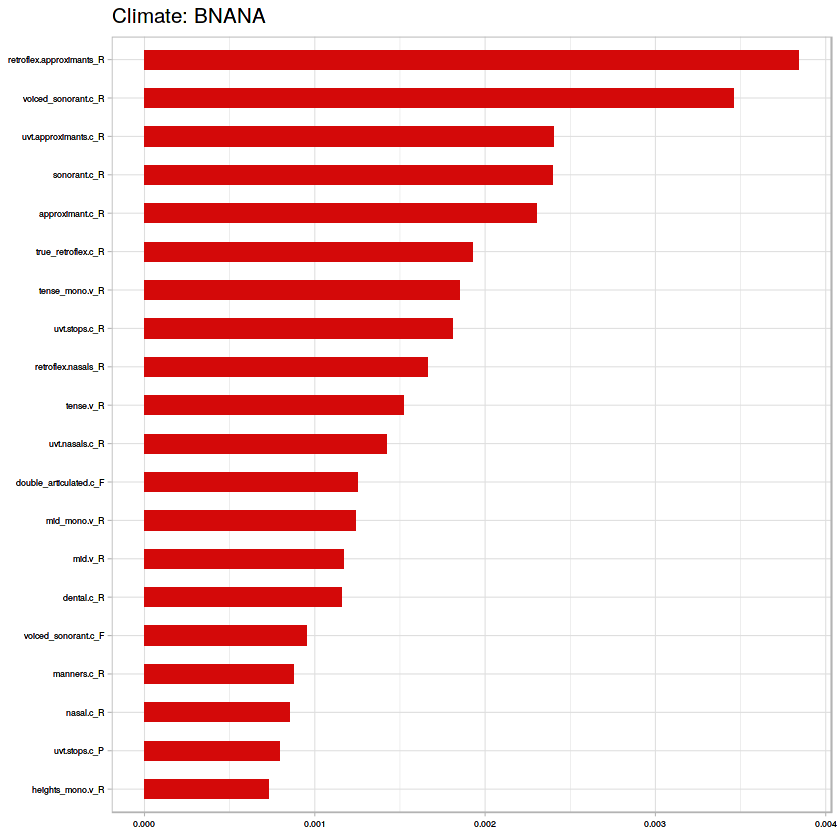

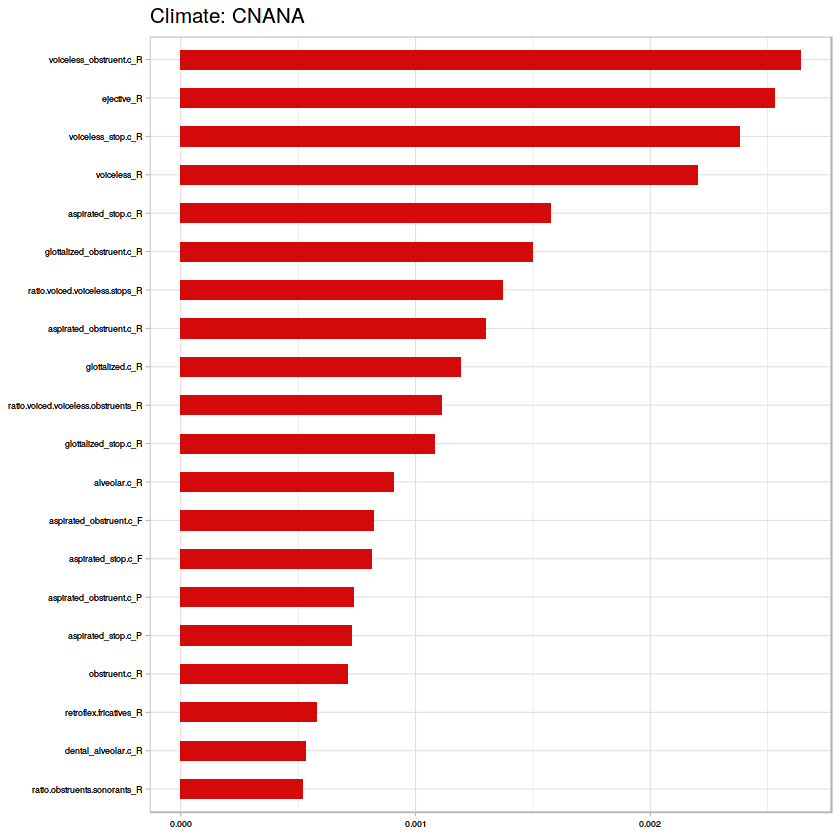

[1] "All vs Cold"
[1] "Dummy Classifier accuracy:"
[1] 0.9108259
[1] C-V accuracy for Random Forest is 0.953035509736541
[1] "RF Confusion Matrix:"
   
      D   X
  D   0   0
  X  41 832


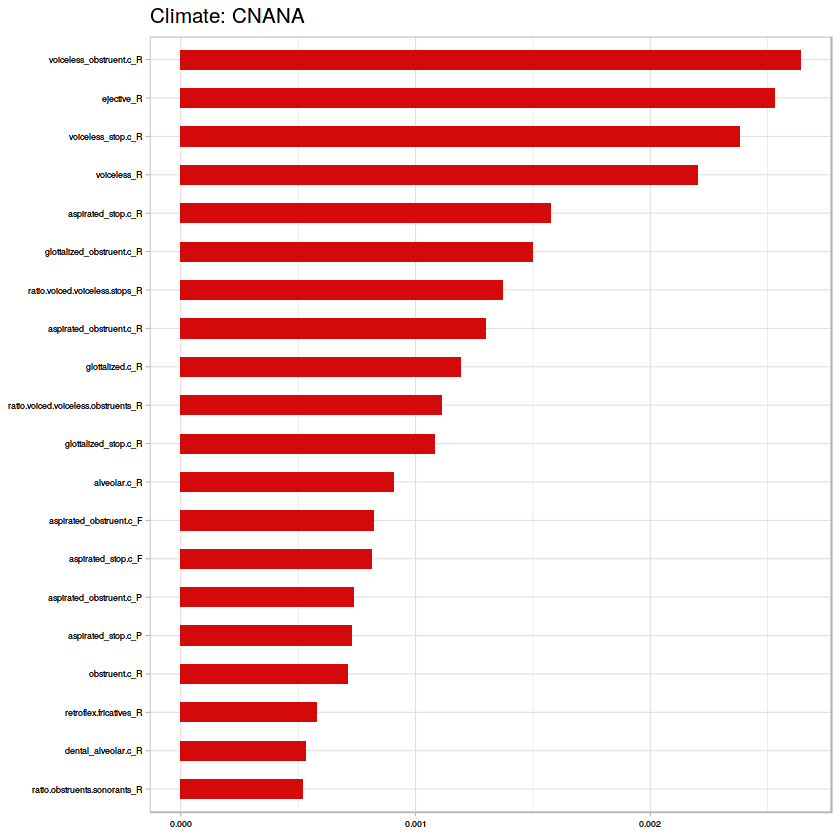

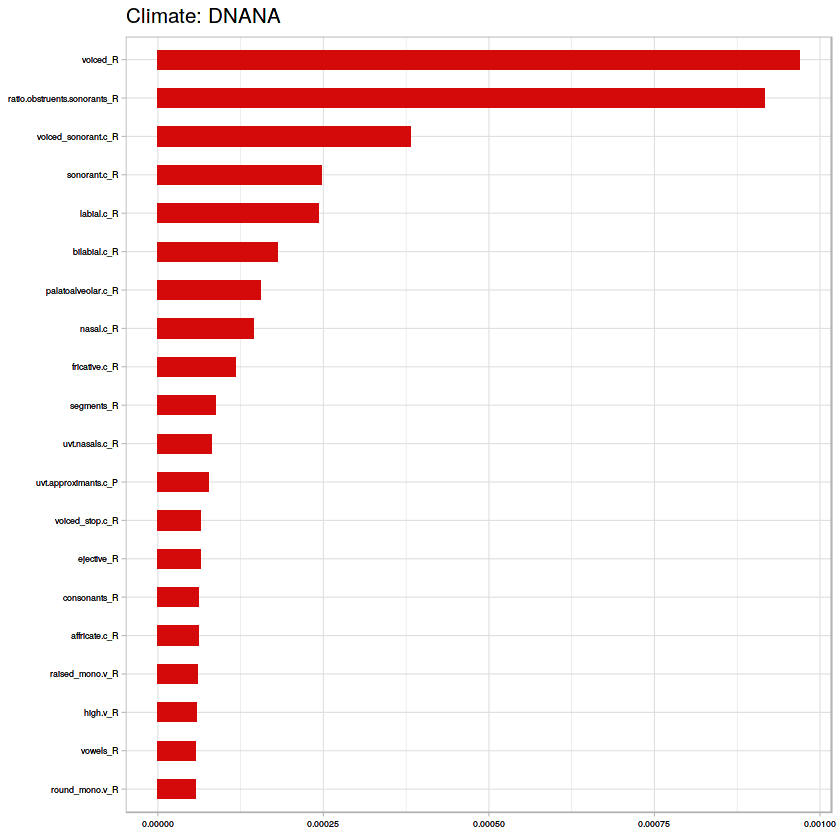

[1] "All vs Polar"
[1] "Dummy Classifier accuracy:"
[1] 0.9840859
[1] C-V accuracy for Random Forest is 0.991981672394044
[1] "RF Confusion Matrix:"
   
      E   X
  E   0   0
  X   7 866


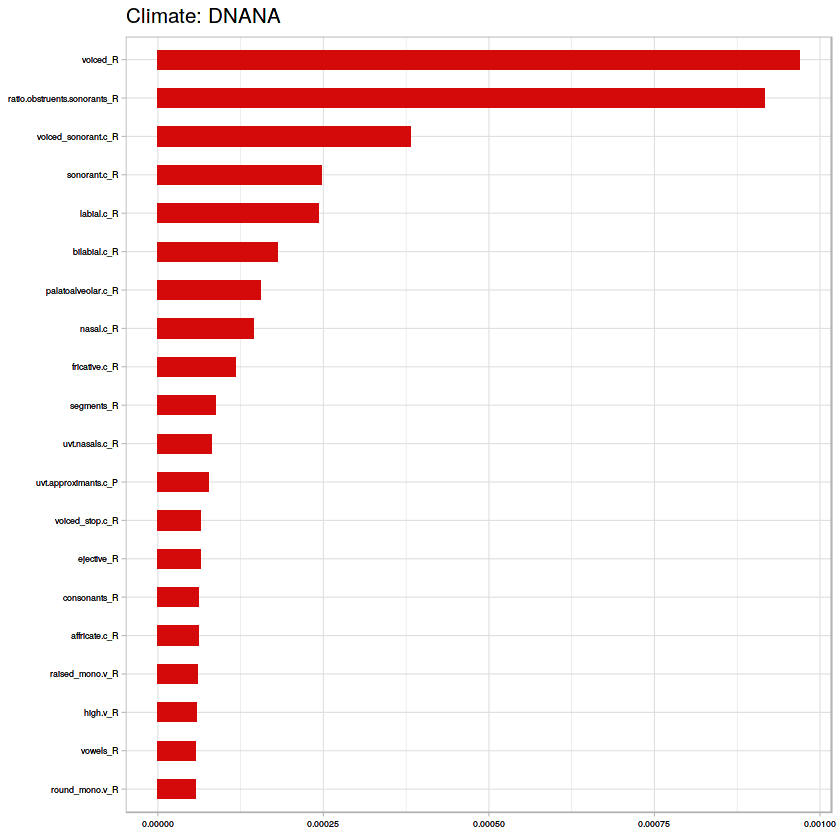

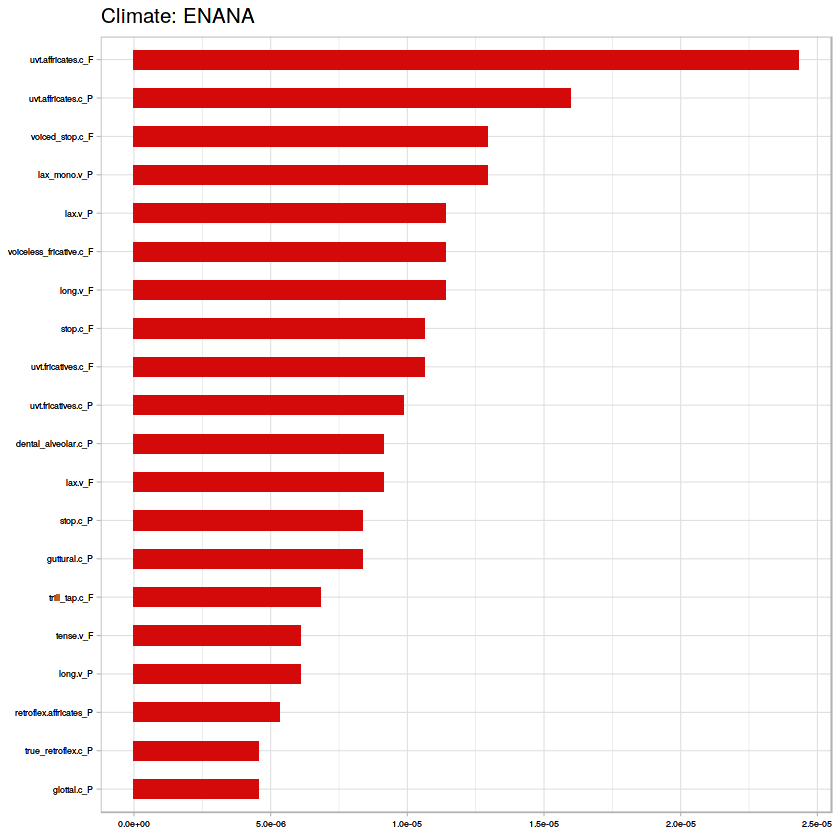

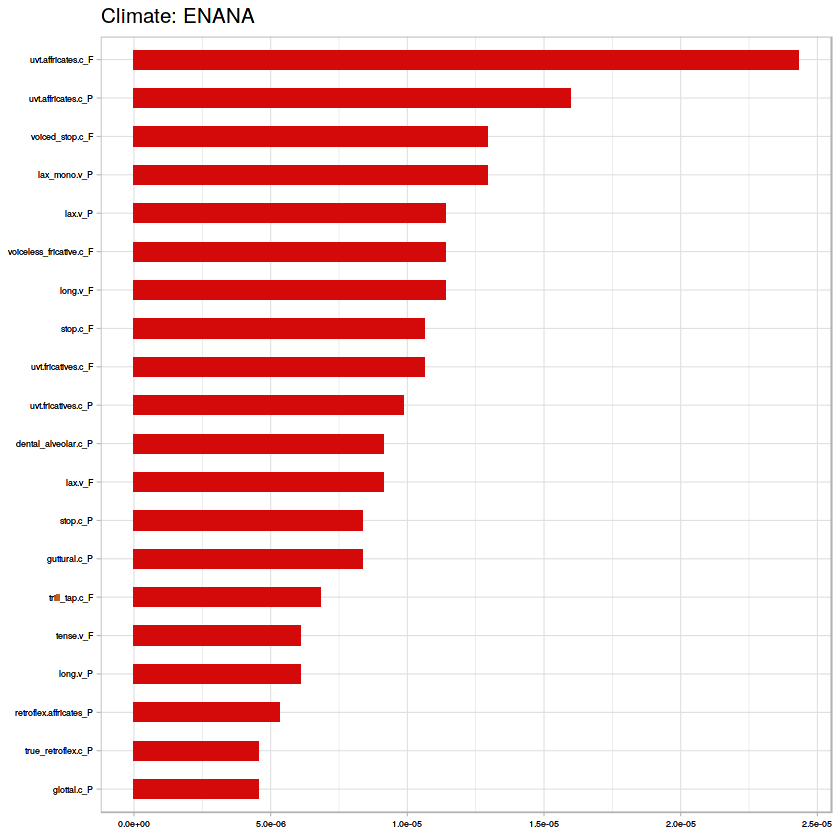

In [92]:
bin_tropvs(med_m)
ovsa(med_m)

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.863583815028902
[1] "RF Confusion Matrix:"
   
      A   X
  A 641 110
  X   8 106
[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.868453105968331
[1] "RF Confusion Matrix:"
   
      A   X
  A 645 104
  X   4  68


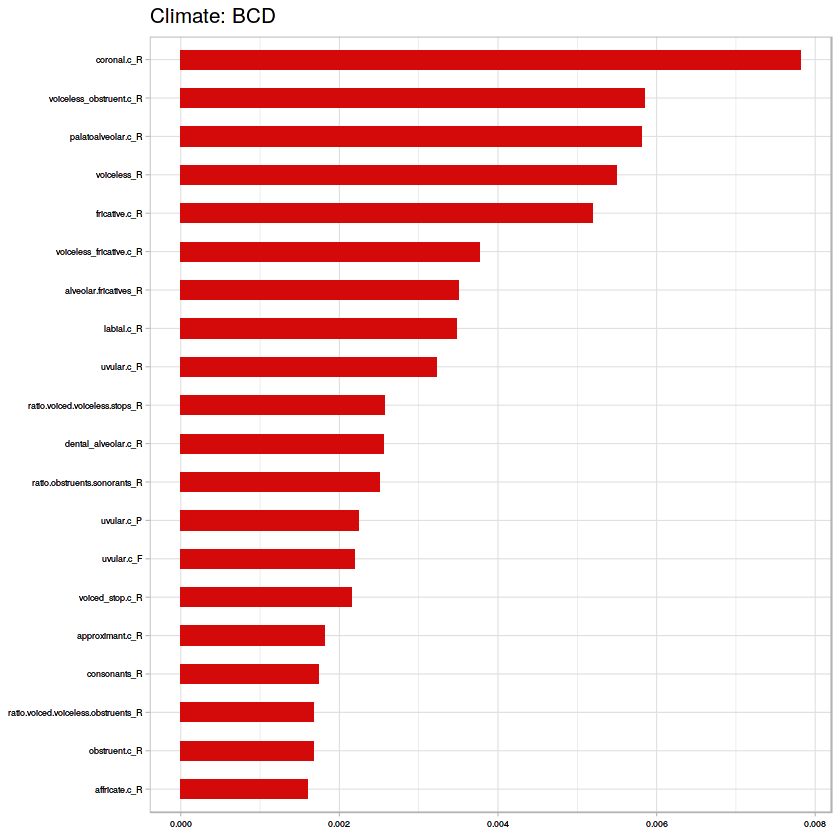

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.891218872870249
[1] "RF Confusion Matrix:"
   
      A   X
  A 648  82
  X   1  32


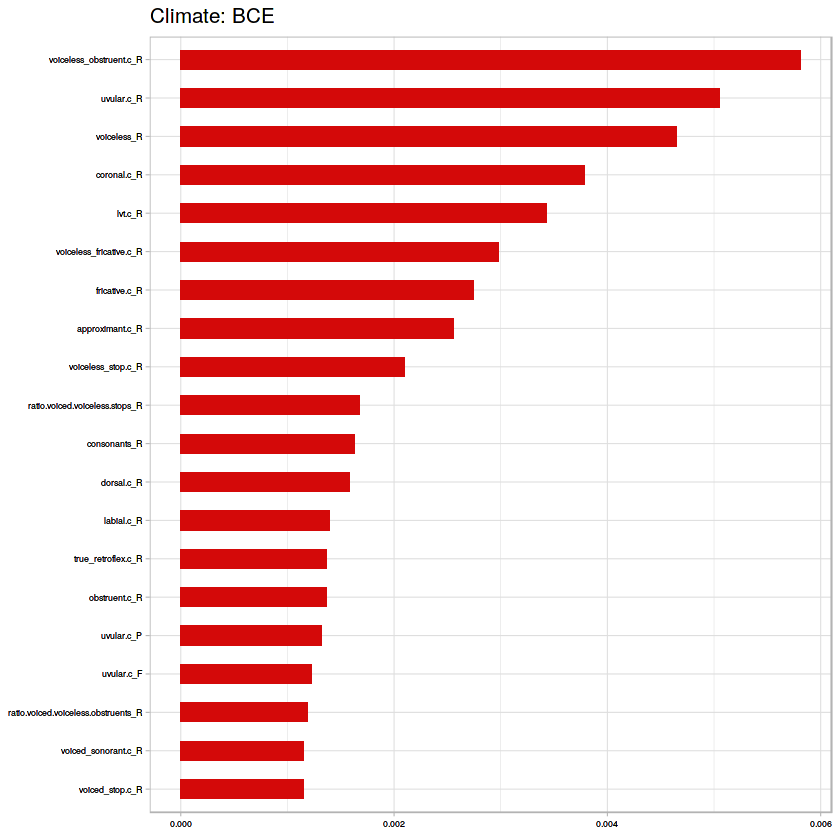

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.866910866910867
[1] "RF Confusion Matrix:"
   
      A   X
  A 645 105
  X   4  65


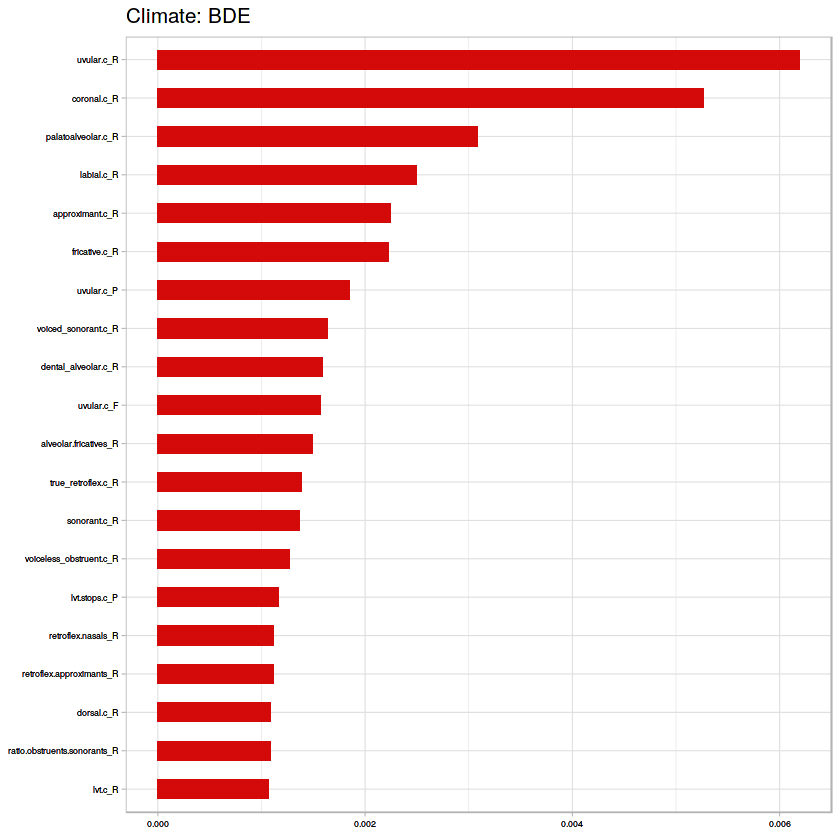

[1] "B" "C"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.869618696186962
[1] "RF Confusion Matrix:"
   
      A   X
  A 646 103
  X   3  61


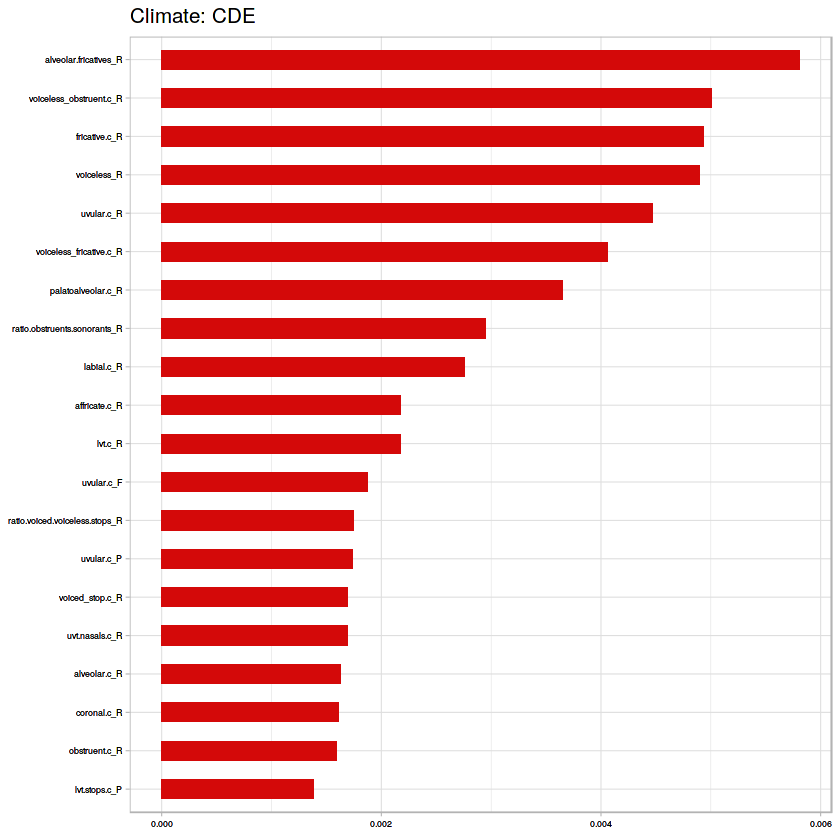

[1] "B" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.894039735099338
[1] "RF Confusion Matrix:"
   
      A   X
  A 648  79
  X   1  27


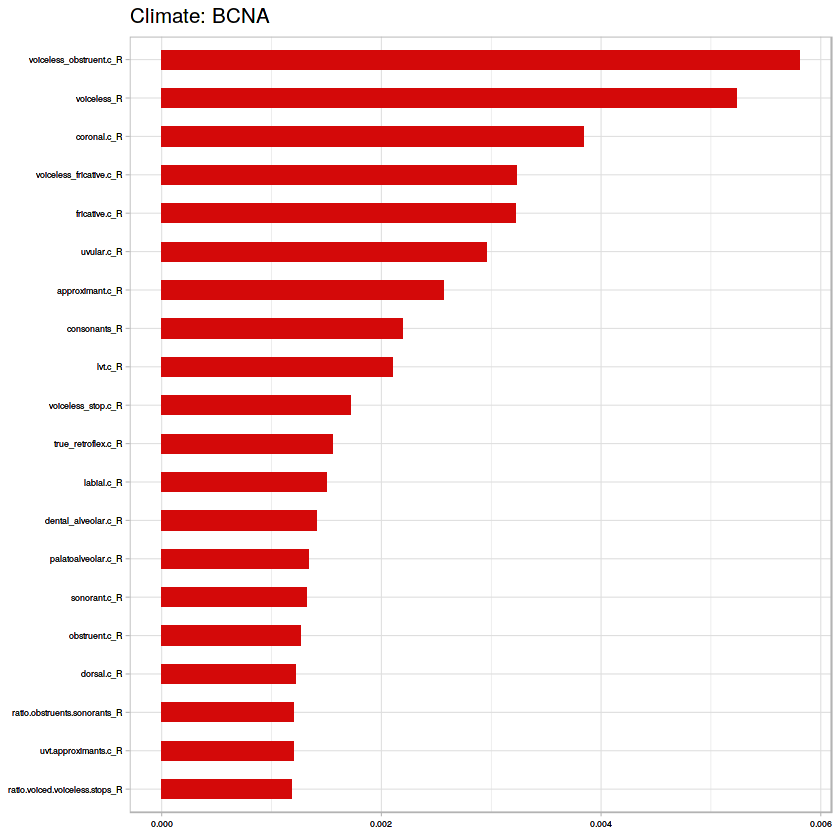

[1] "B" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.931082981715893
[1] "RF Confusion Matrix:"
   
      A   X
  A 647  47
  X   2  15


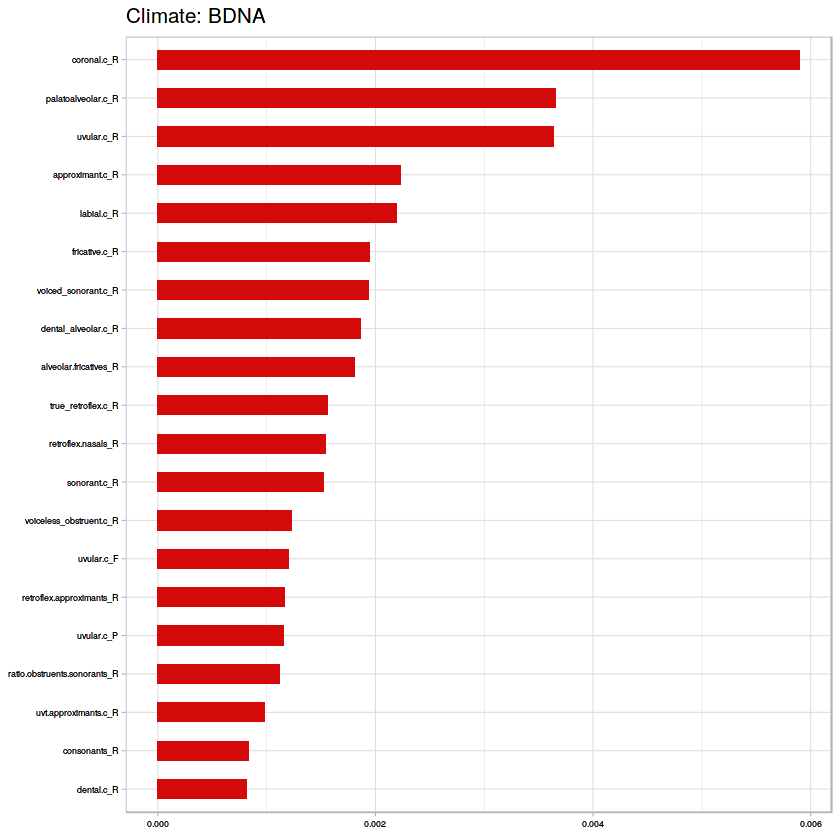

[1] "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.866831072749692
[1] "RF Confusion Matrix:"
   
      A   X
  A 645 104
  X   4  58


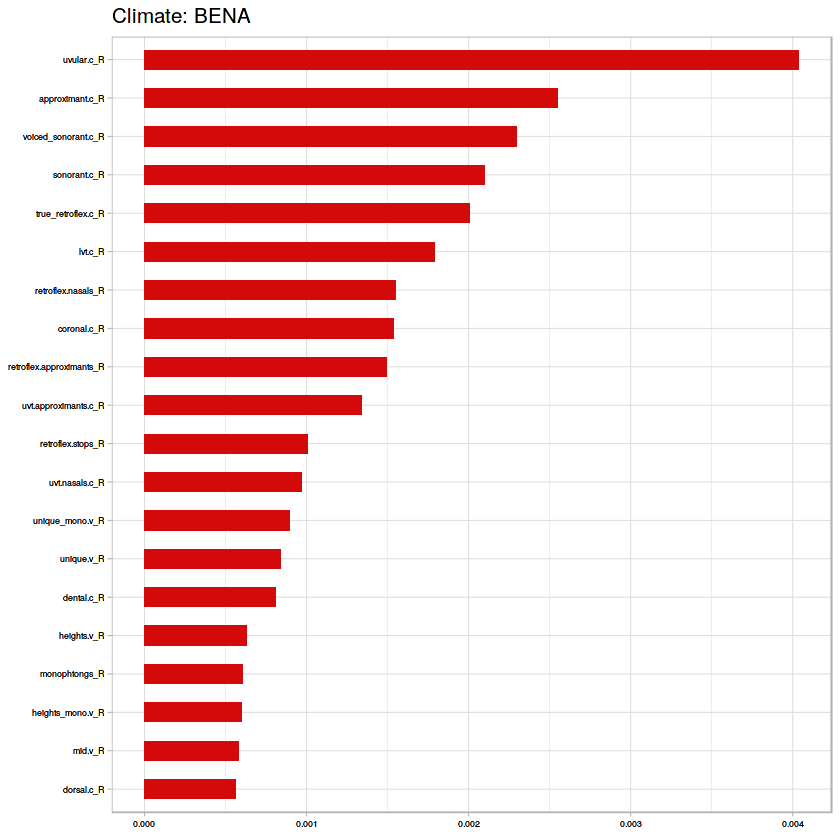

[1] "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.877444589308996
[1] "RF Confusion Matrix:"
   
      A   X
  A 647  92
  X   2  26


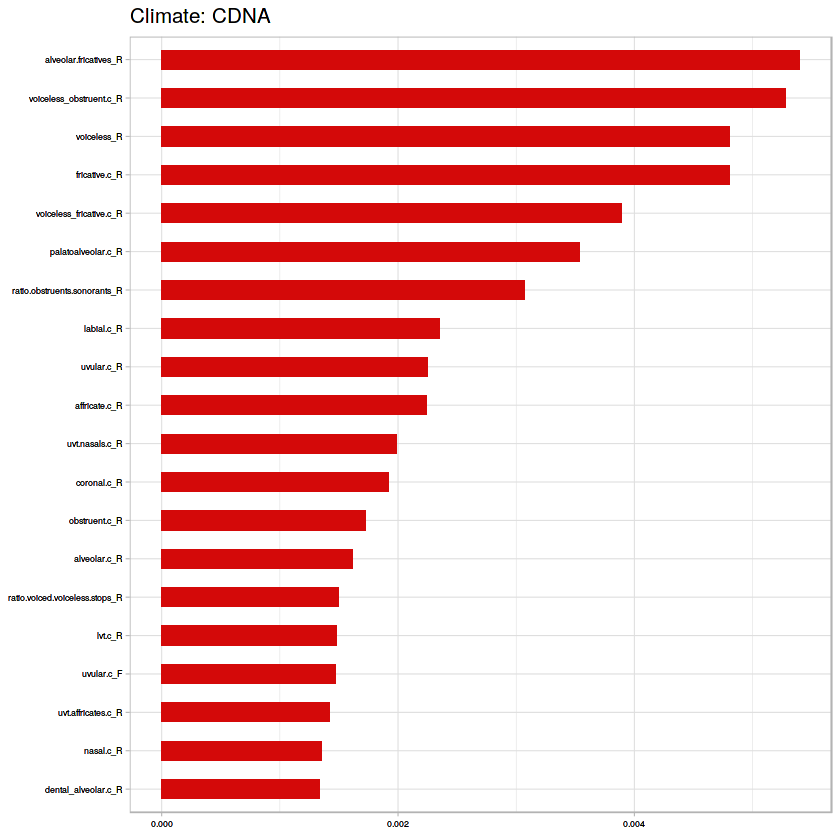

[1] "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.926657263751763
[1] "RF Confusion Matrix:"
   
      A   X
  A 649  52
  X   0   8


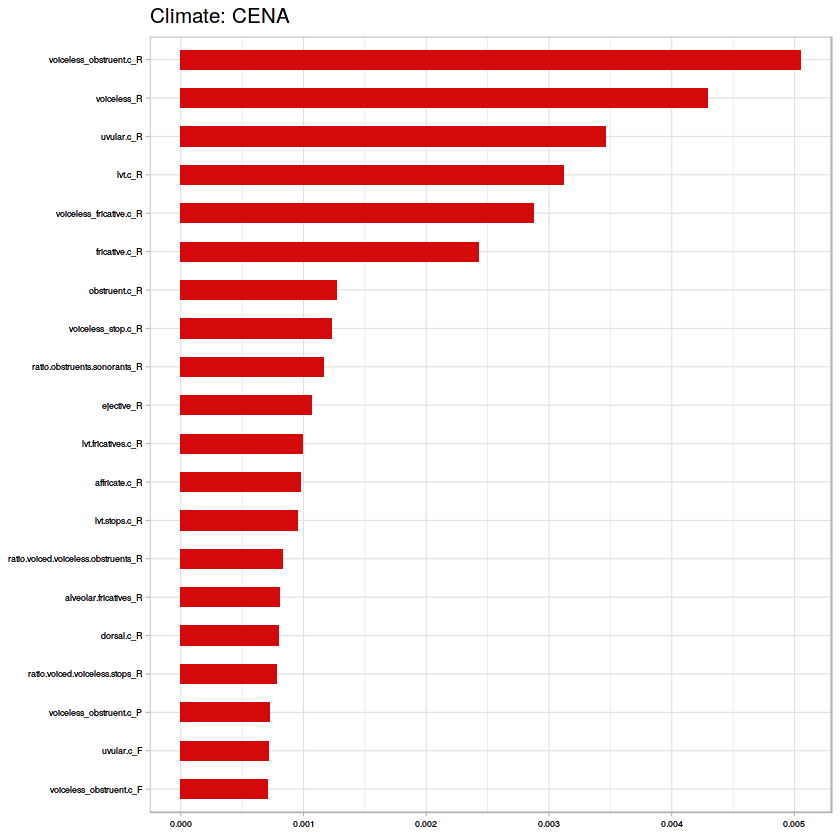

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.618295
[1] C-V accuracy for Random Forest is 0.860252004581902
[1] "RF Confusion Matrix:"
   
      A   X
  A 640 113
  X   9 111


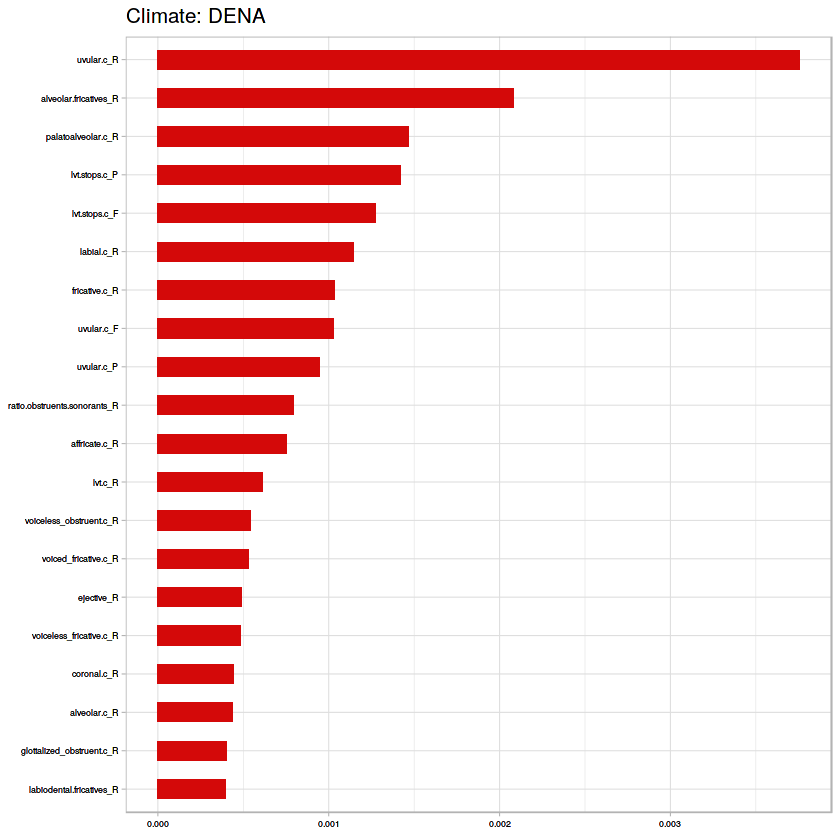

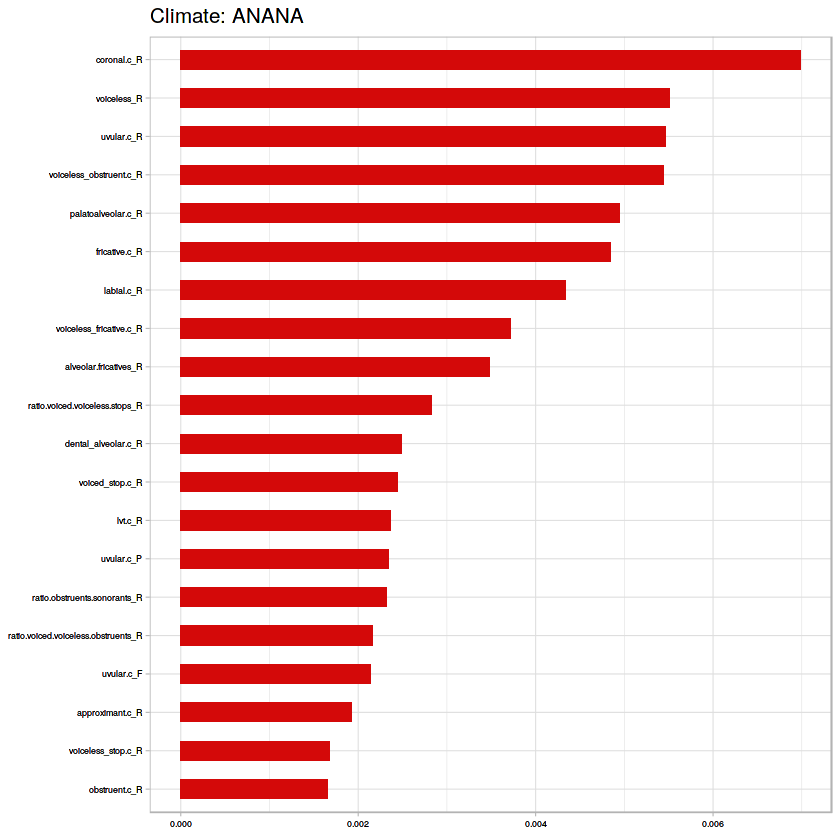

[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.8841798
[1] C-V accuracy for Random Forest is 0.950744558991982
[1] "RF Confusion Matrix:"
   
      B   X
  B  12   1
  X  42 818


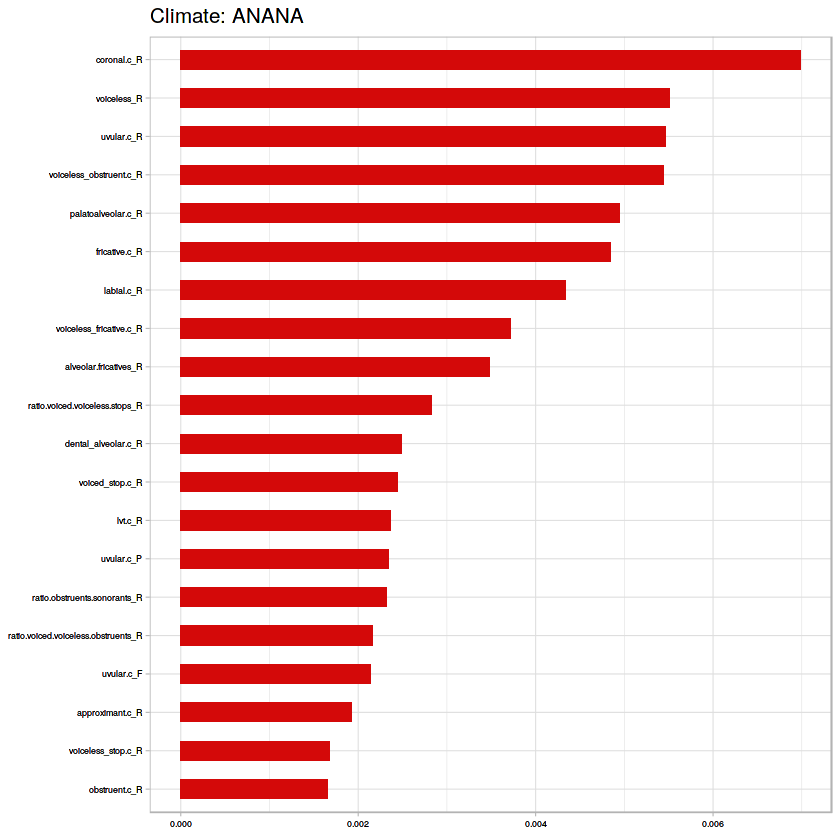

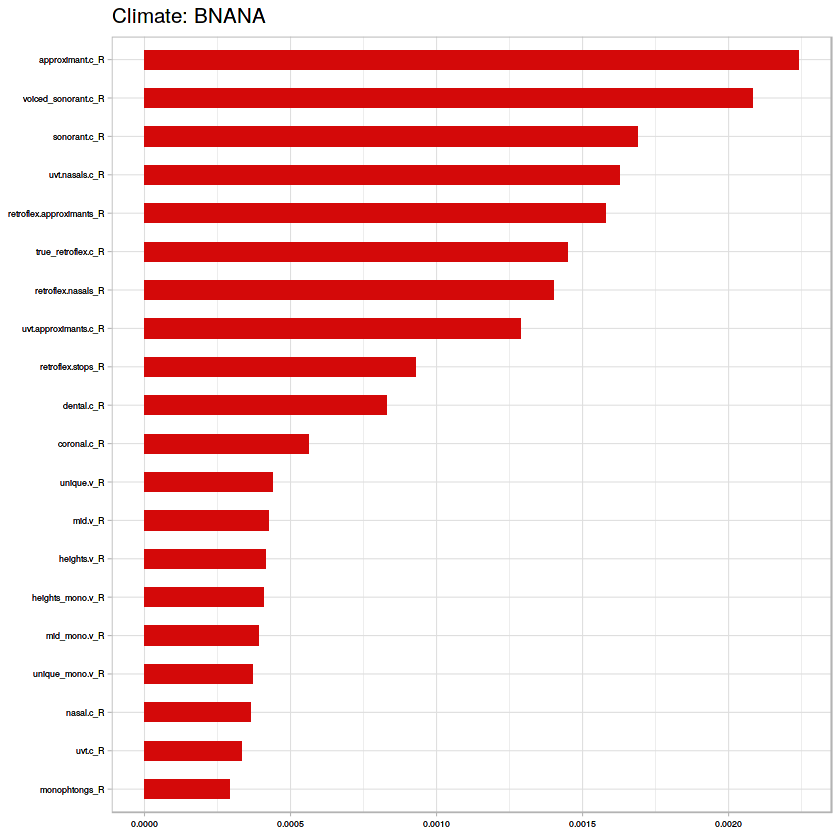

[1] "All vs Temperate"
[1] "Dummy Classifier accuracy:"
[1] 0.7800544
[1] C-V accuracy for Random Forest is 0.882016036655212
[1] "RF Confusion Matrix:"
   
      C   X
  C  10   3
  X 100 760


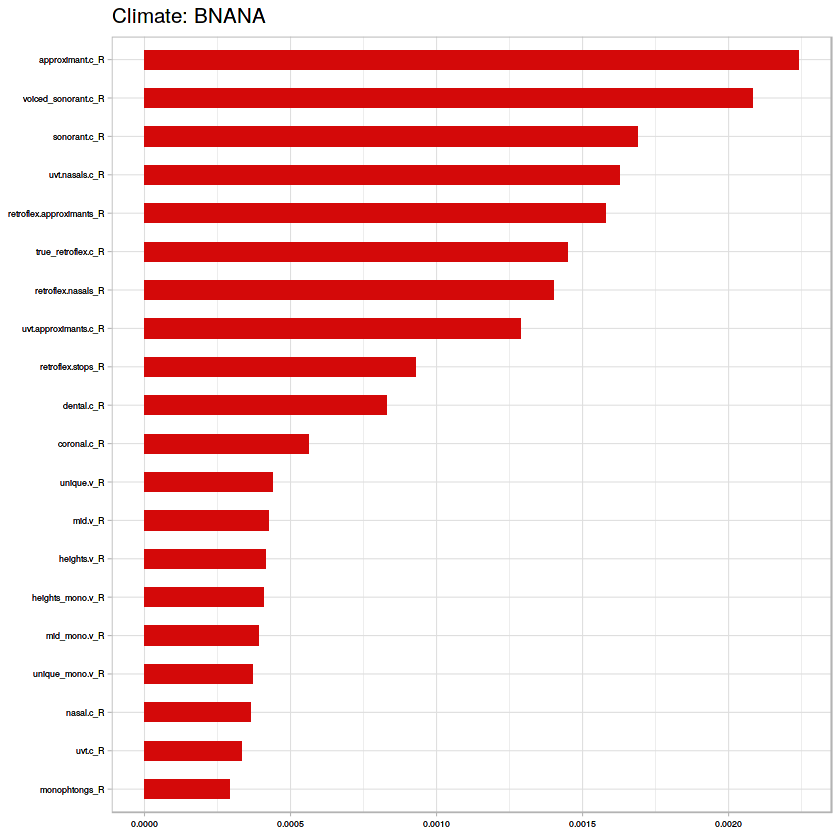

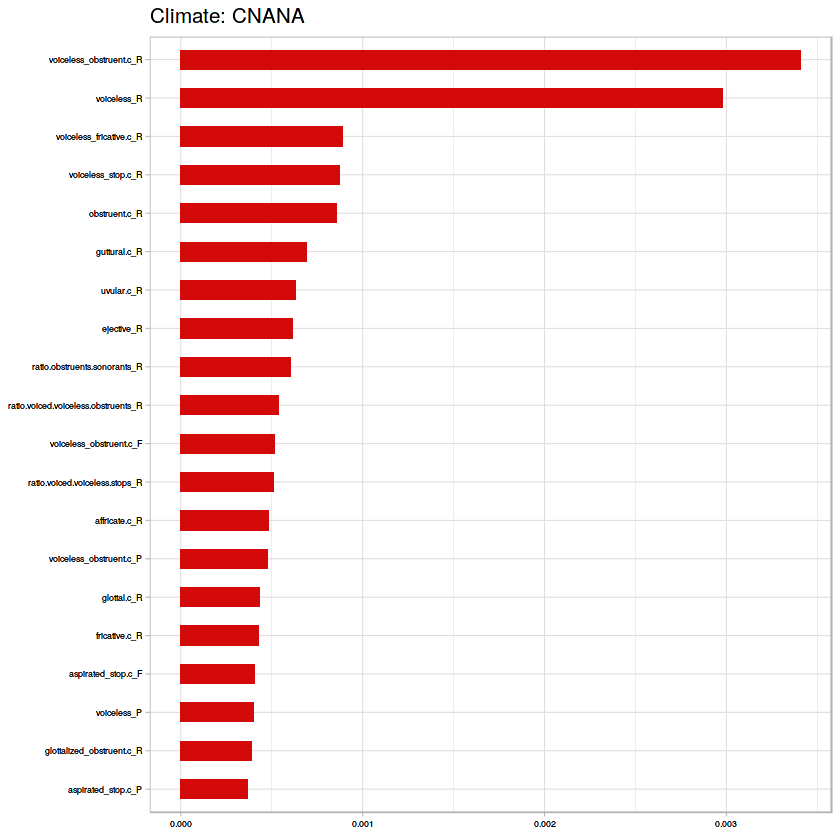

[1] "All vs Cold"
[1] "Dummy Classifier accuracy:"
[1] 0.8881529
[1] C-V accuracy for Random Forest is 0.940435280641466
[1] "RF Confusion Matrix:"
   
      D   X
  D   0   0
  X  52 821


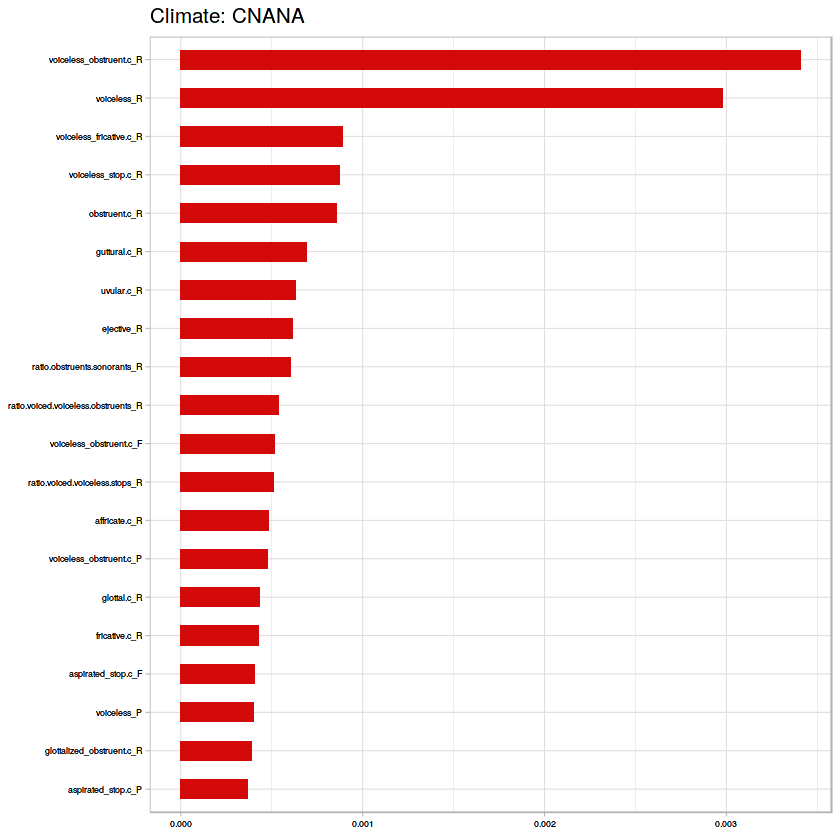

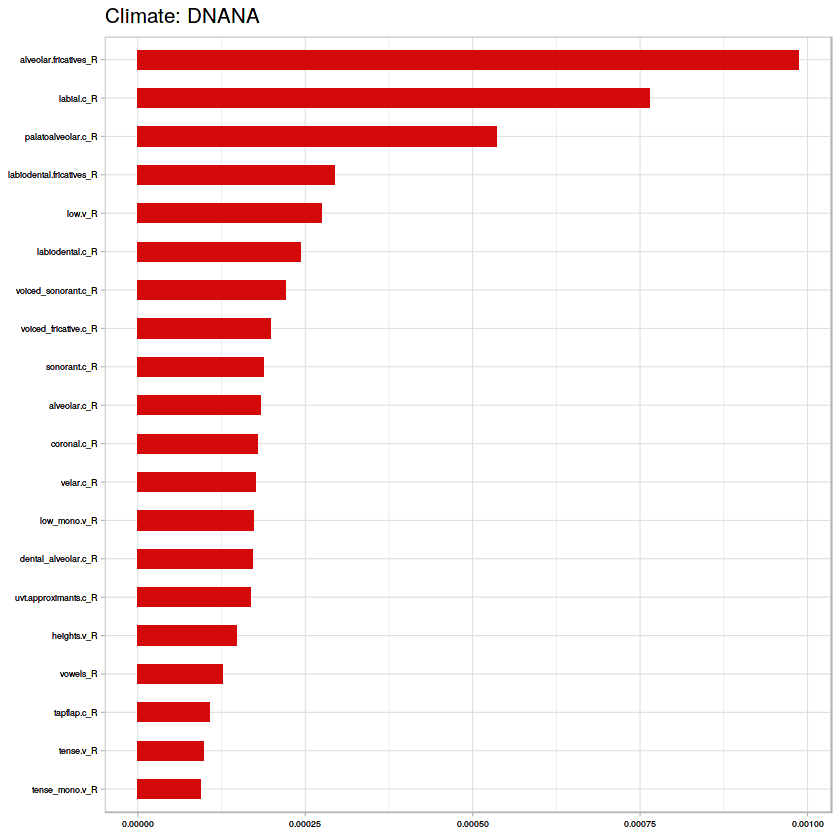

[1] "All vs Polar"
[1] "Dummy Classifier accuracy:"
[1] 0.9818454
[1] C-V accuracy for Random Forest is 0.990836197021764
[1] "RF Confusion Matrix:"
   
      E   X
  E   0   0
  X   8 865


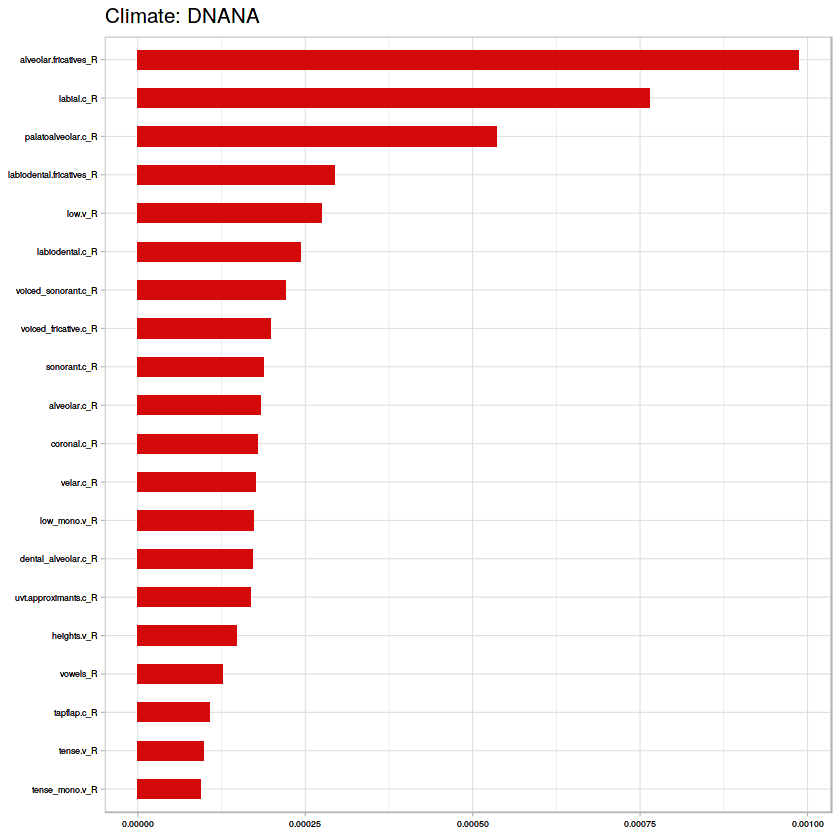

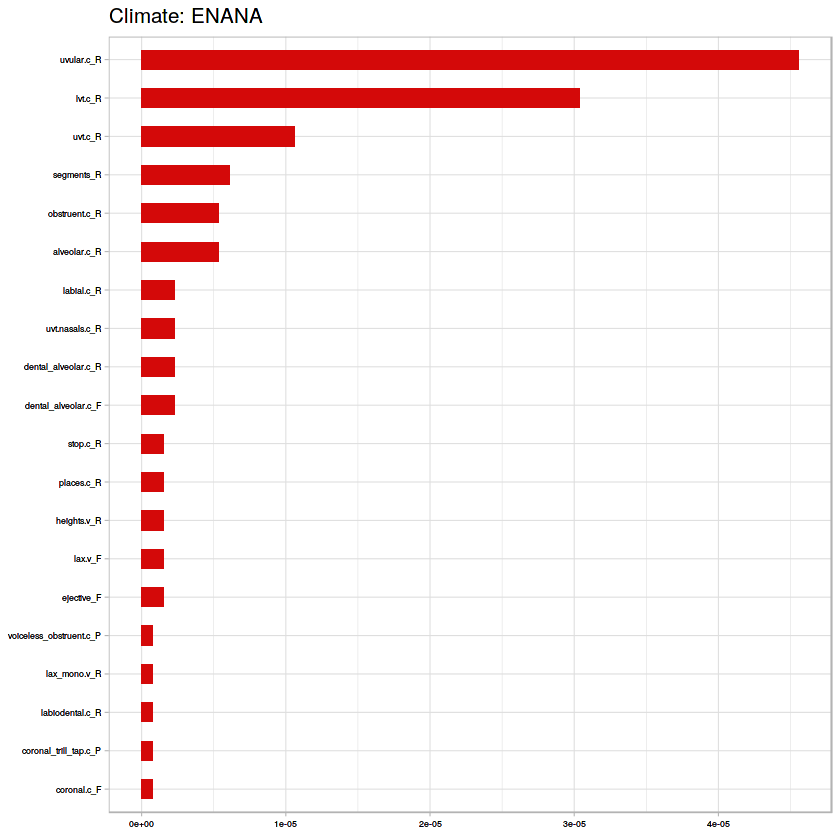

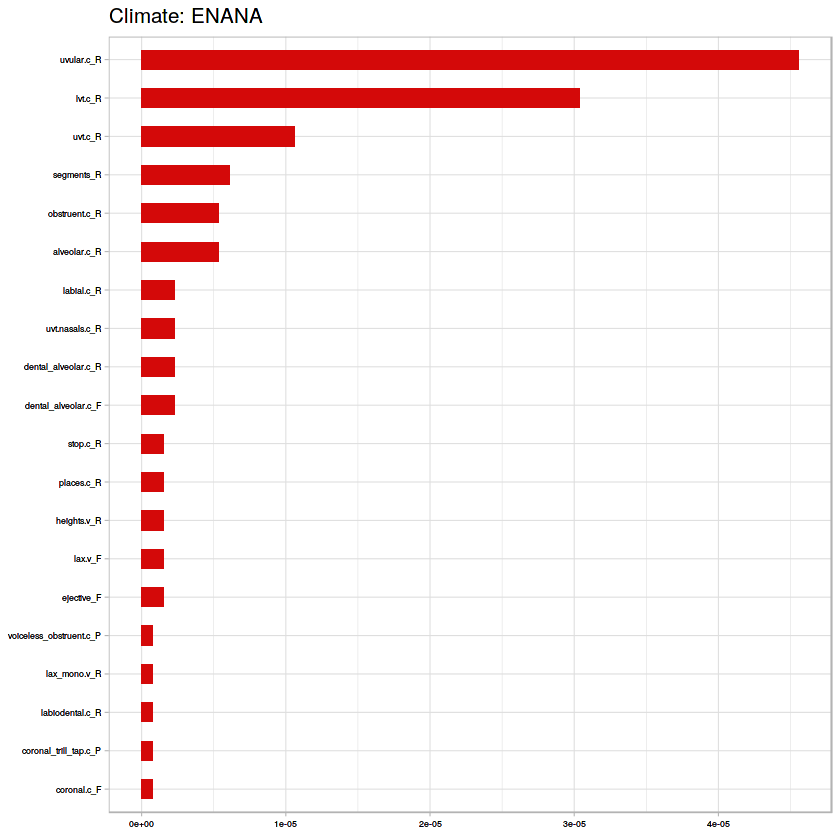

In [93]:
bin_tropvs(l_m)
ovsa(l_m)

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.828402366863905
[1] "RF Confusion Matrix:"
   
      A   X
  A 307  67
  X  78 393
[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.829813664596273
[1] "RF Confusion Matrix:"
   
      A   X
  A 315  67
  X  70 353


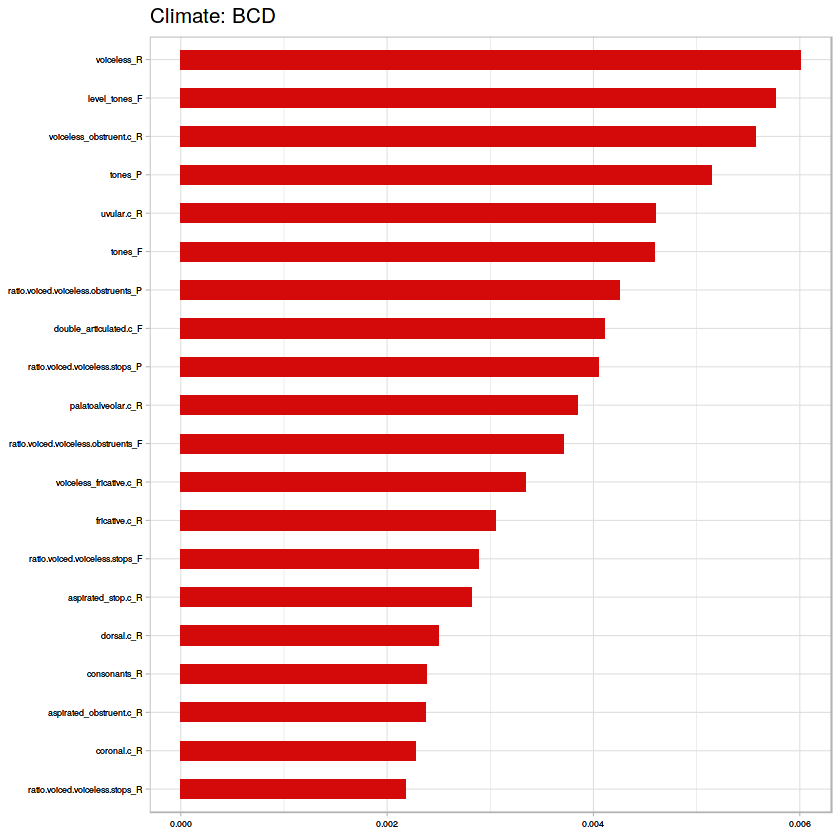

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.858569051580699
[1] "RF Confusion Matrix:"
   
      A   X
  A 376  76
  X   9 140


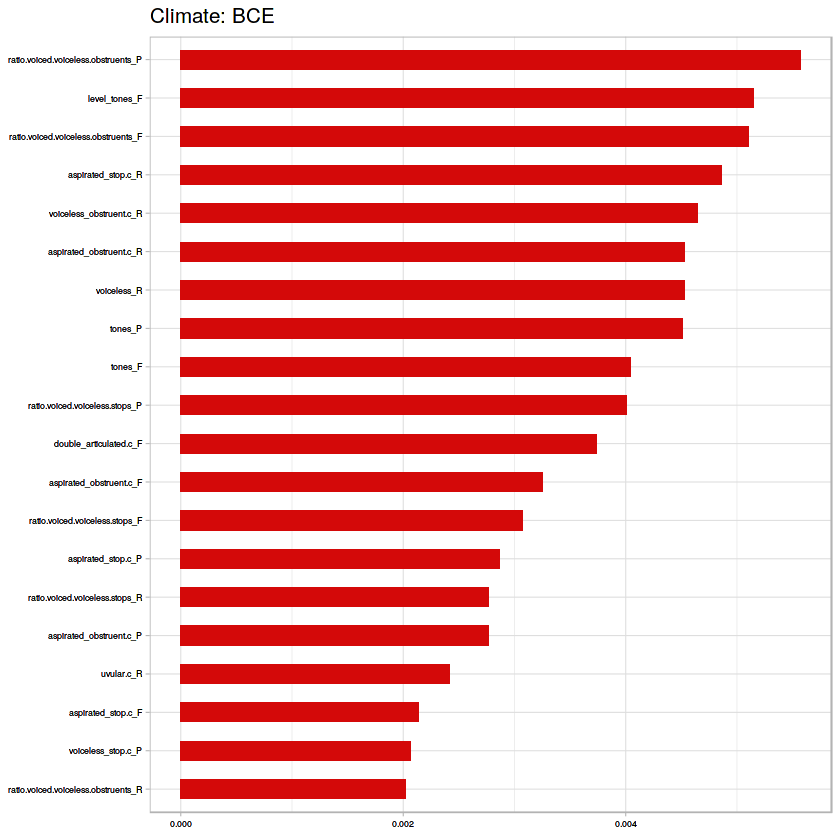

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.824
[1] "RF Confusion Matrix:"
   
      A   X
  A 340  87
  X  45 278


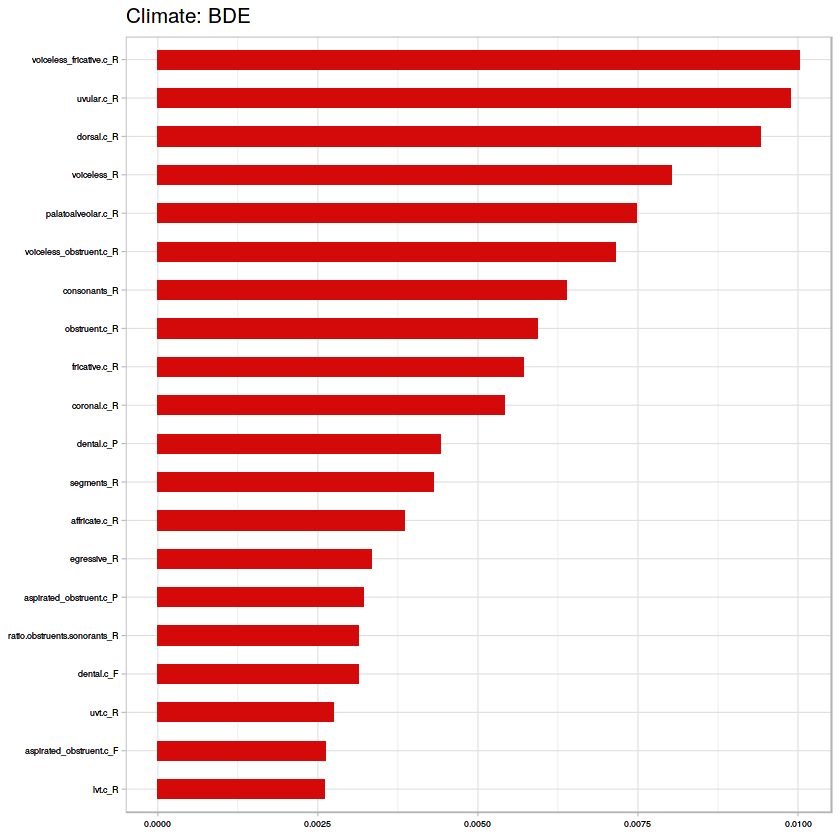

[1] "B" "C"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.822622107969152
[1] "RF Confusion Matrix:"
   
      A   X
  A 321  74
  X  64 319


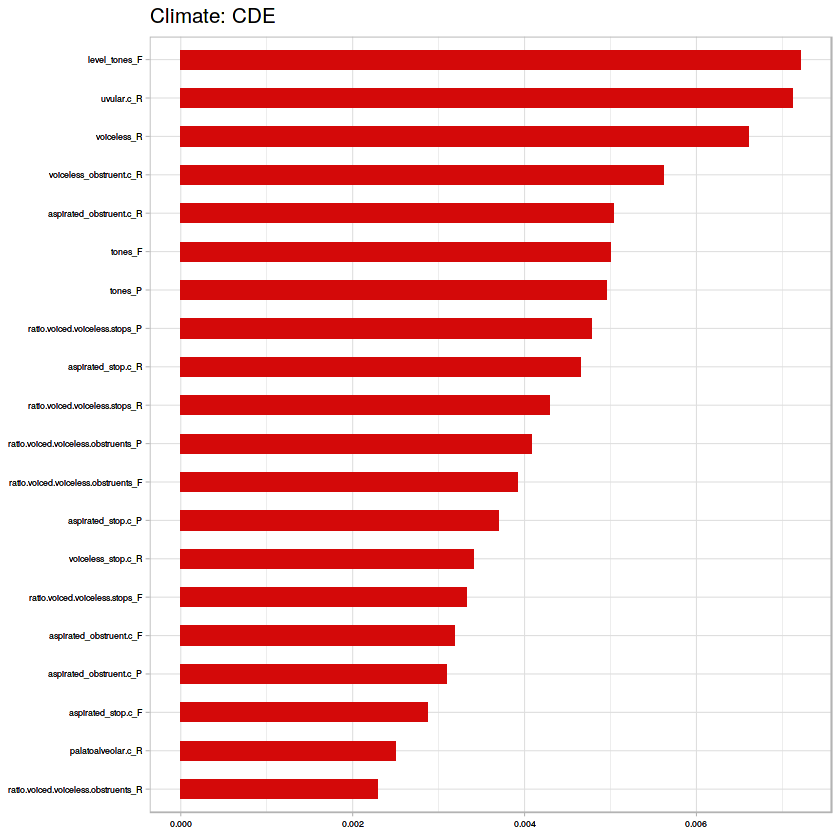

[1] "B" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.857142857142857
[1] "RF Confusion Matrix:"
   
      A   X
  A 377  74
  X   8 115


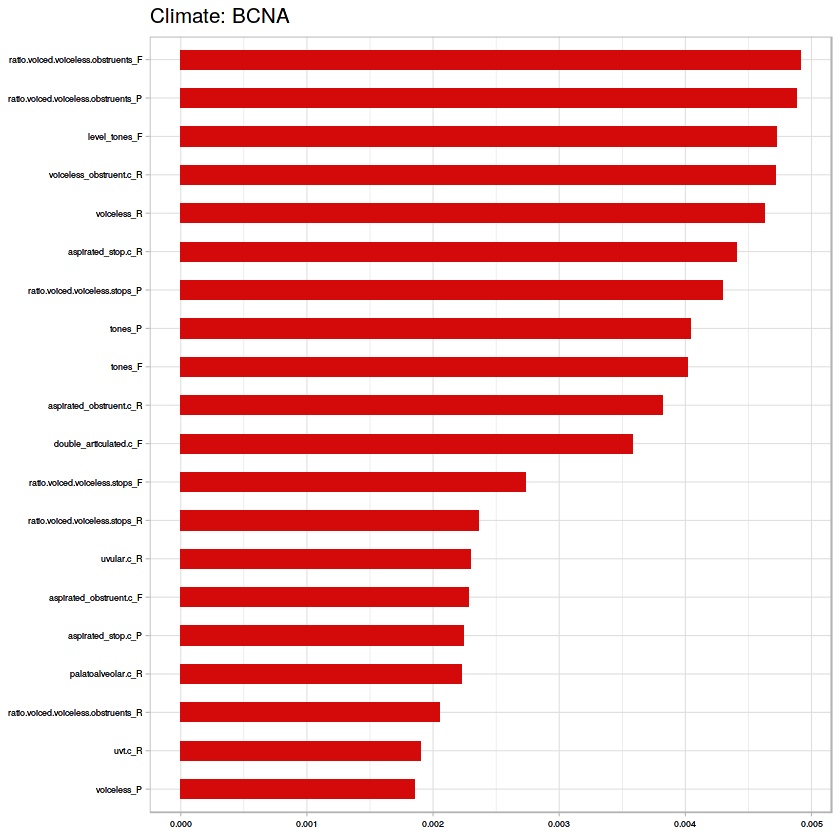

[1] "B" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.855805243445693
[1] "RF Confusion Matrix:"
   
      A   X
  A 385  77
  X   0  72


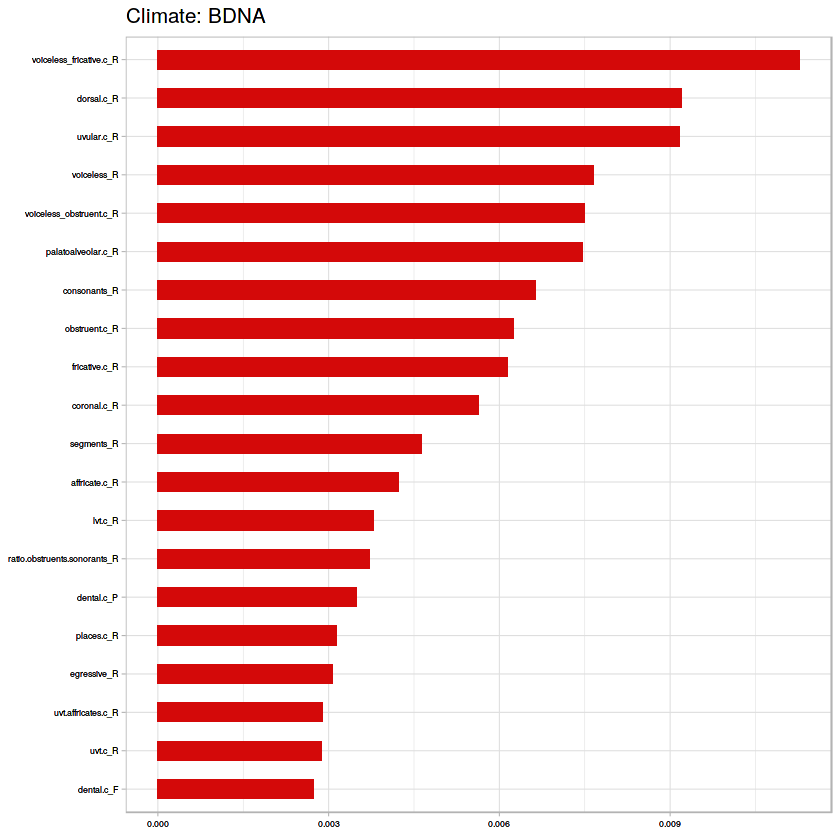

[1] "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.821576763485477
[1] "RF Confusion Matrix:"
   
      A   X
  A 348  92
  X  37 246


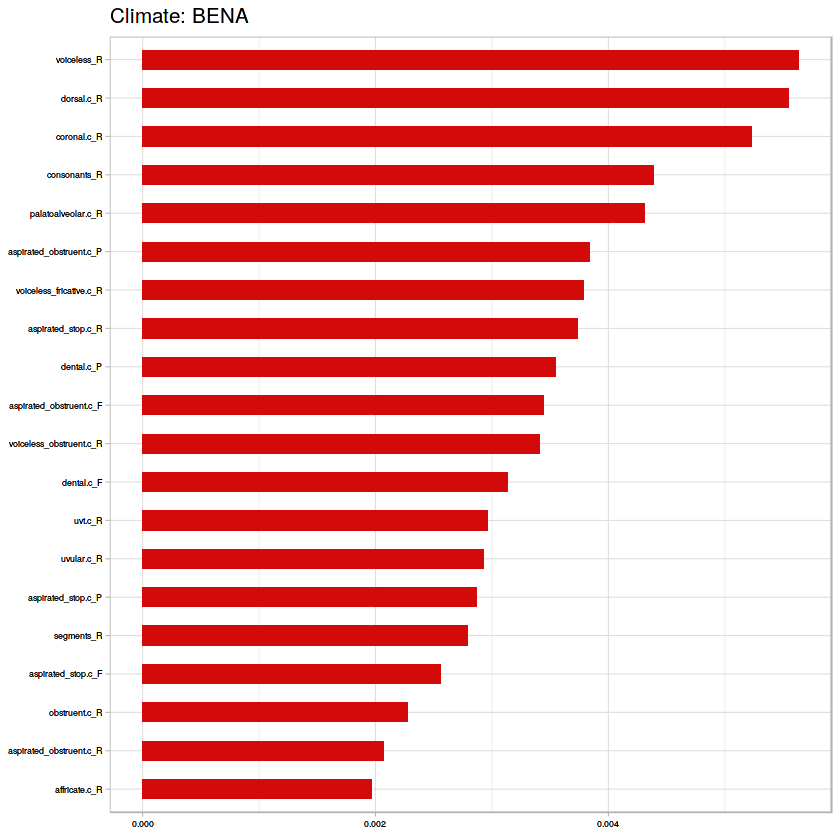

[1] "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.805270863836018
[1] "RF Confusion Matrix:"
   
      A   X
  A 355 103
  X  30 195


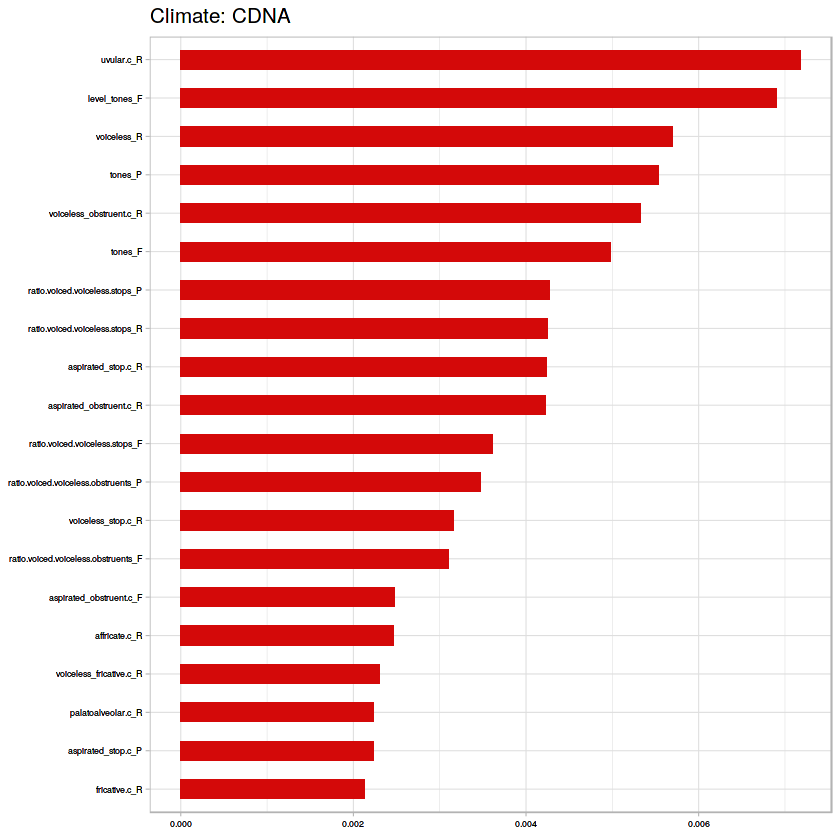

[1] "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.914405010438413
[1] "RF Confusion Matrix:"
   
      A   X
  A 385  41
  X   0  53


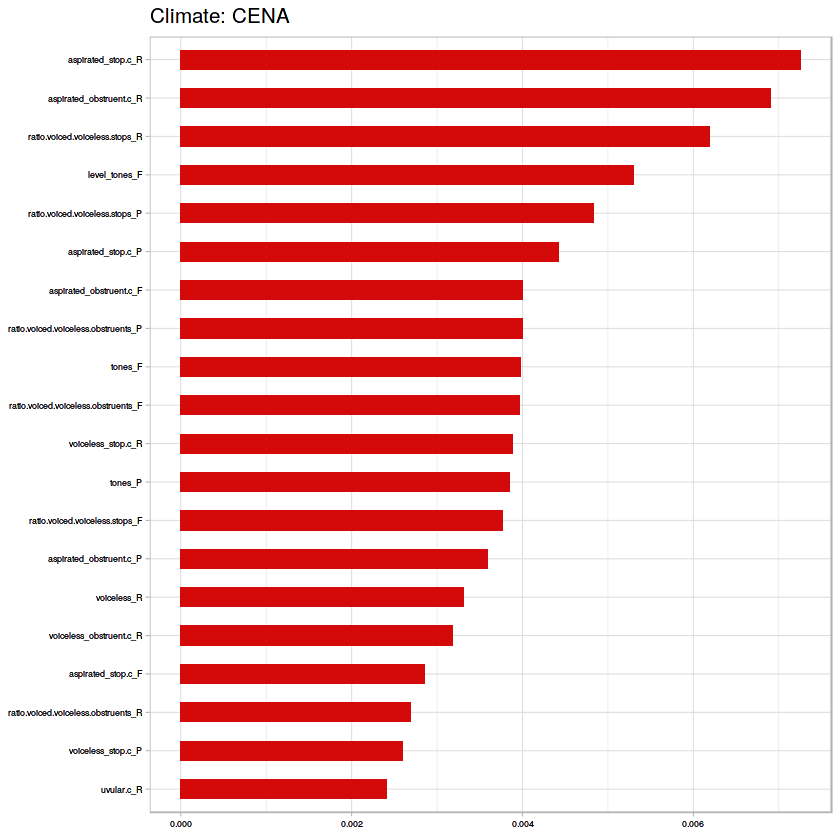

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.5076428
[1] C-V accuracy for Random Forest is 0.836009174311927
[1] "RF Confusion Matrix:"
   
      A   X
  A 302  60
  X  83 427


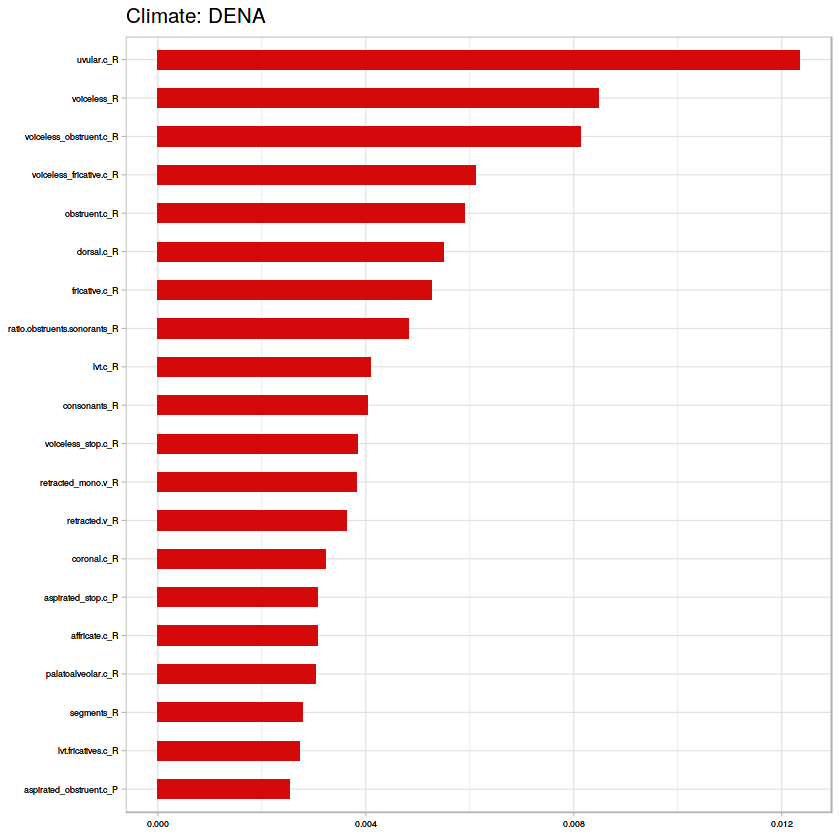

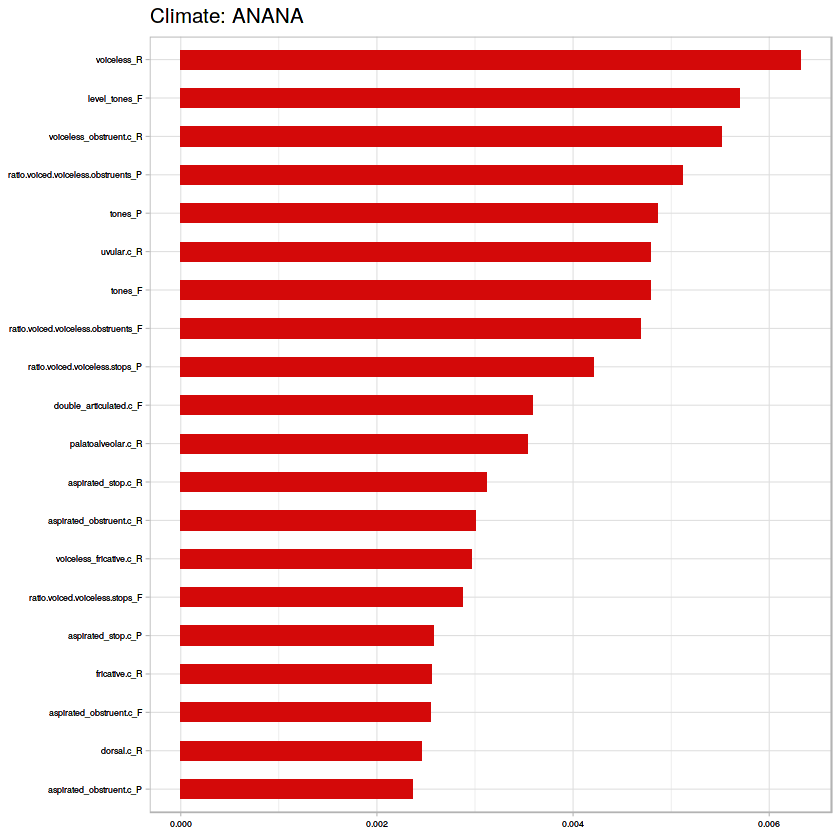

[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.7597167
[1] C-V accuracy for Random Forest is 0.879587155963303
[1] "RF Confusion Matrix:"
   
      B   X
  B  18   1
  X 104 749


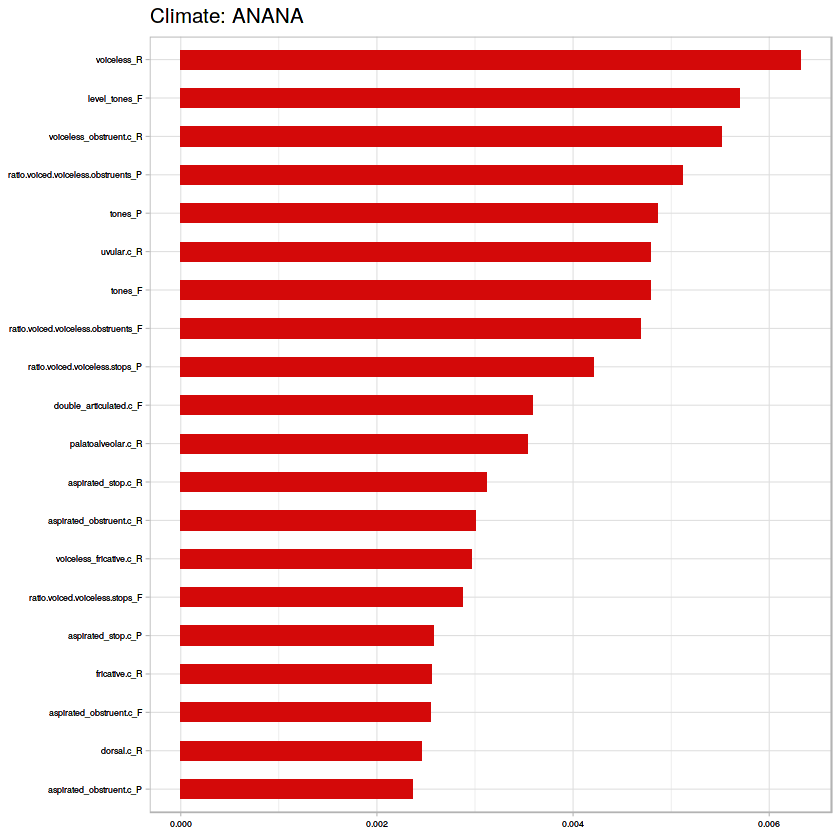

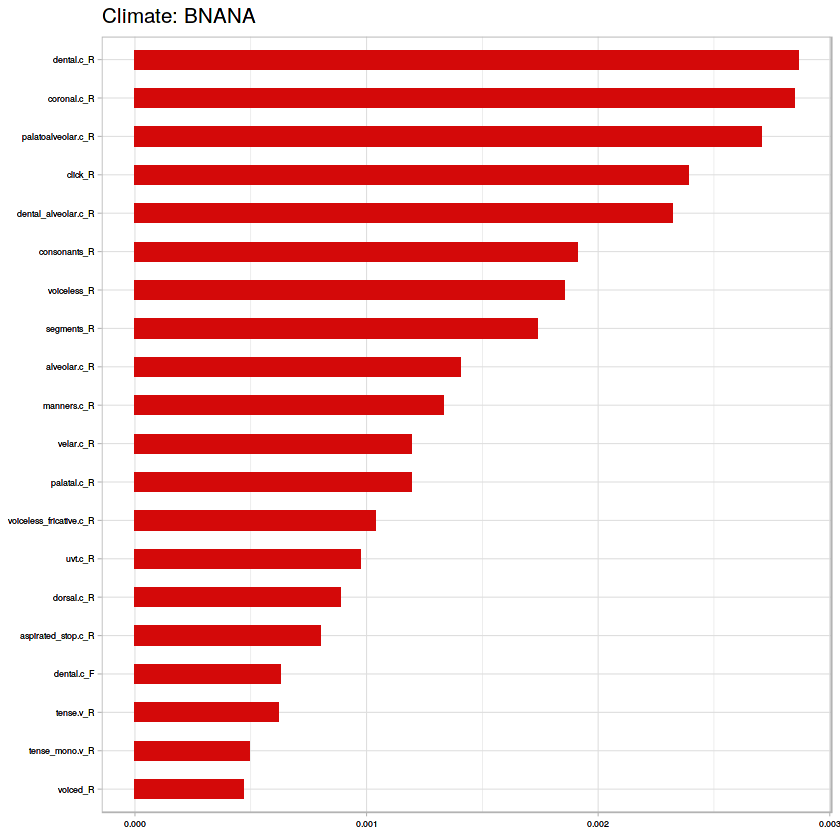

[1] "All vs Temperate"
[1] "Dummy Classifier accuracy:"
[1] 0.5719048
[1] C-V accuracy for Random Forest is 0.745412844036697
[1] "RF Confusion Matrix:"
   
      C   X
  C  49   0
  X 222 601


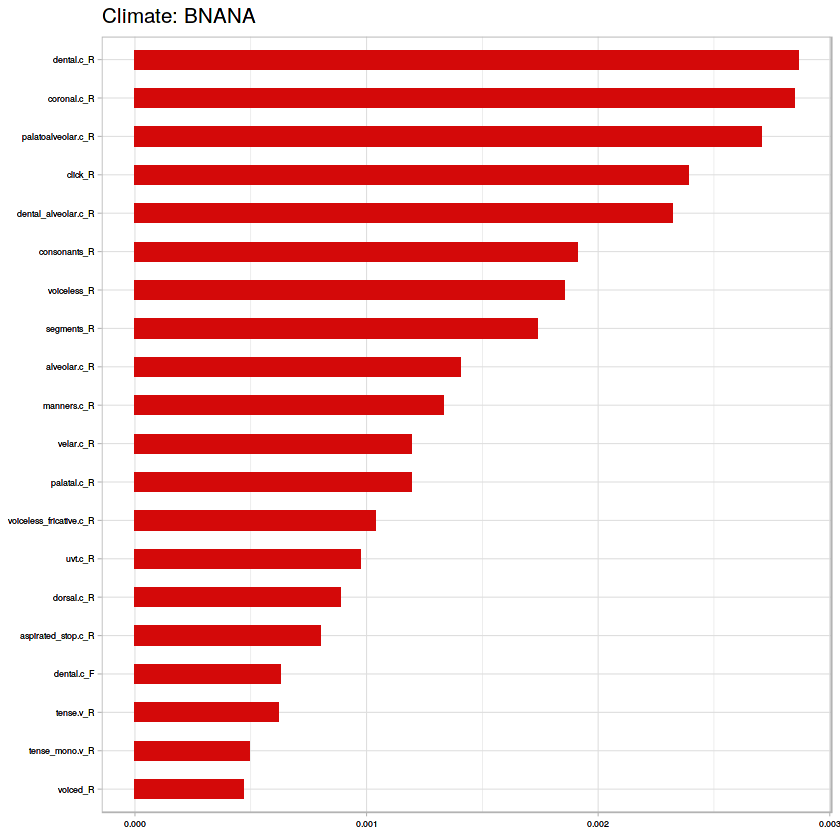

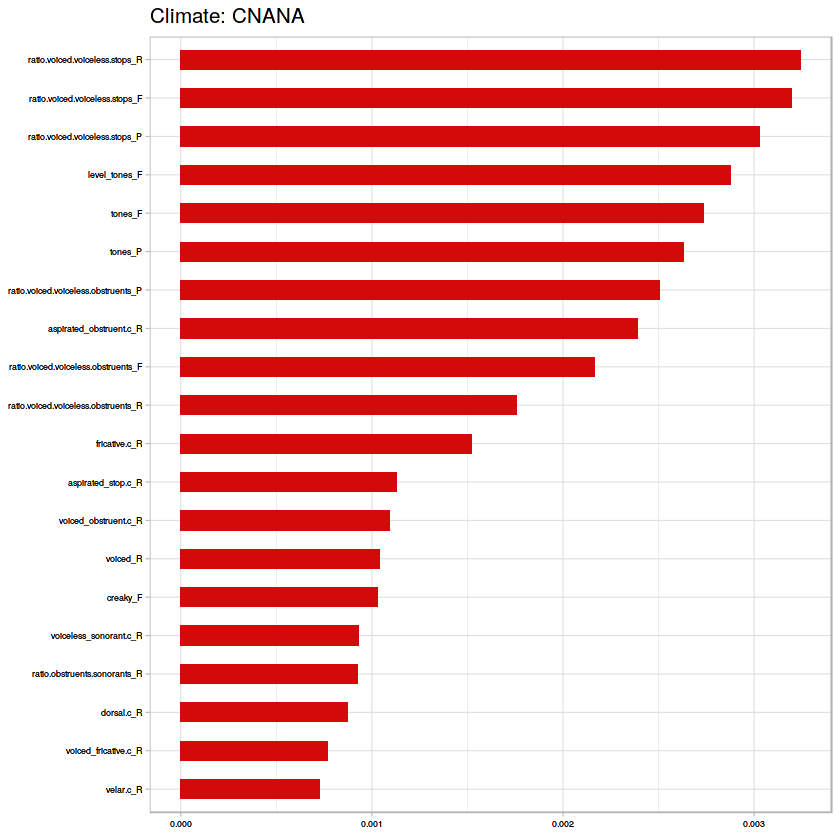

[1] "All vs Cold"
[1] "Dummy Classifier accuracy:"
[1] 0.8585235
[1] C-V accuracy for Random Forest is 0.943807339449541
[1] "RF Confusion Matrix:"
   
      D   X
  D  18   0
  X  49 805


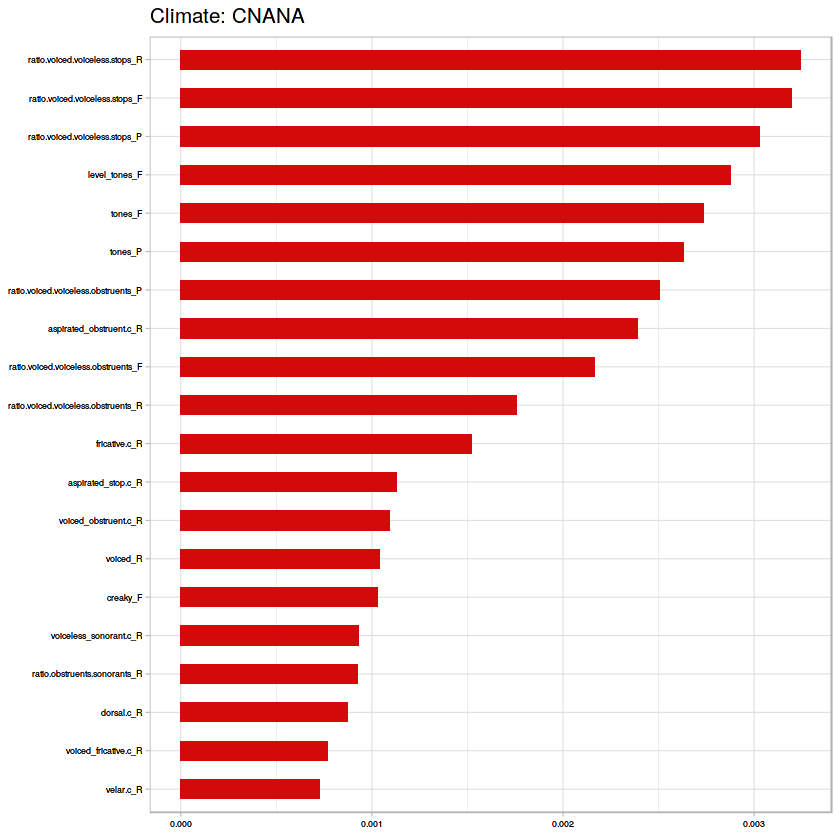

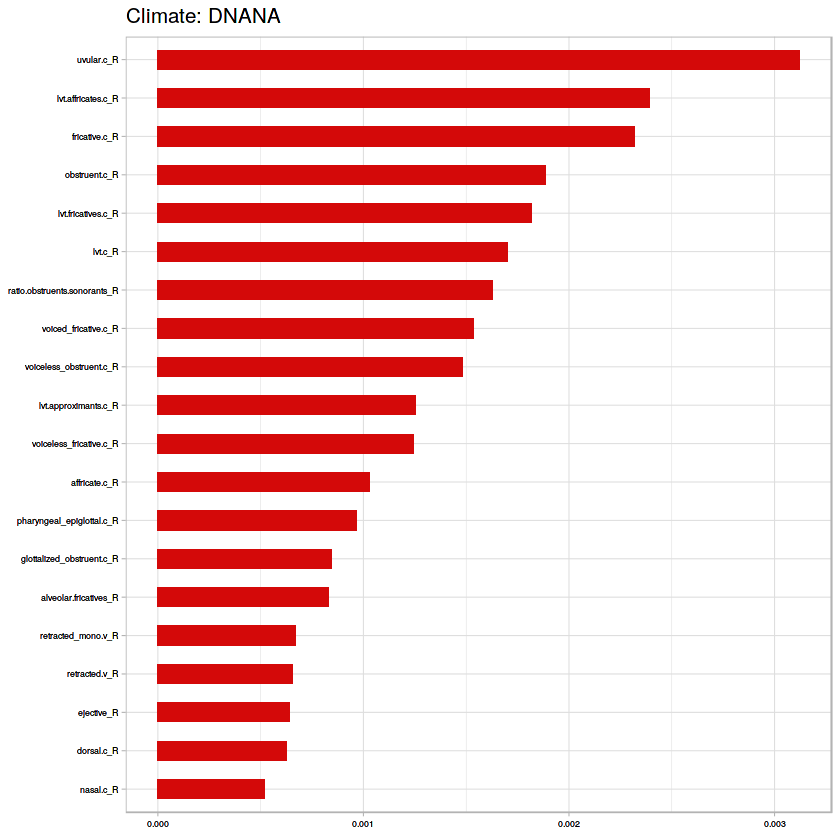

[1] "All vs Polar"
[1] "Dummy Classifier accuracy:"
[1] 0.9399558
[1] C-V accuracy for Random Forest is 0.969036697247706
[1] "RF Confusion Matrix:"
   
      E   X
  E   0   0
  X  27 845


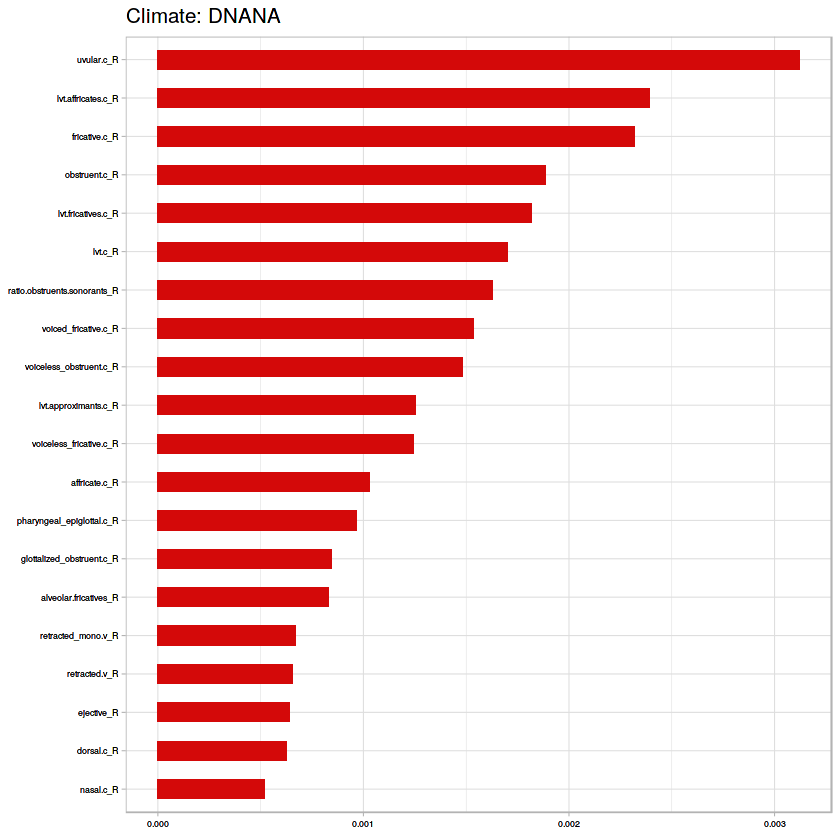

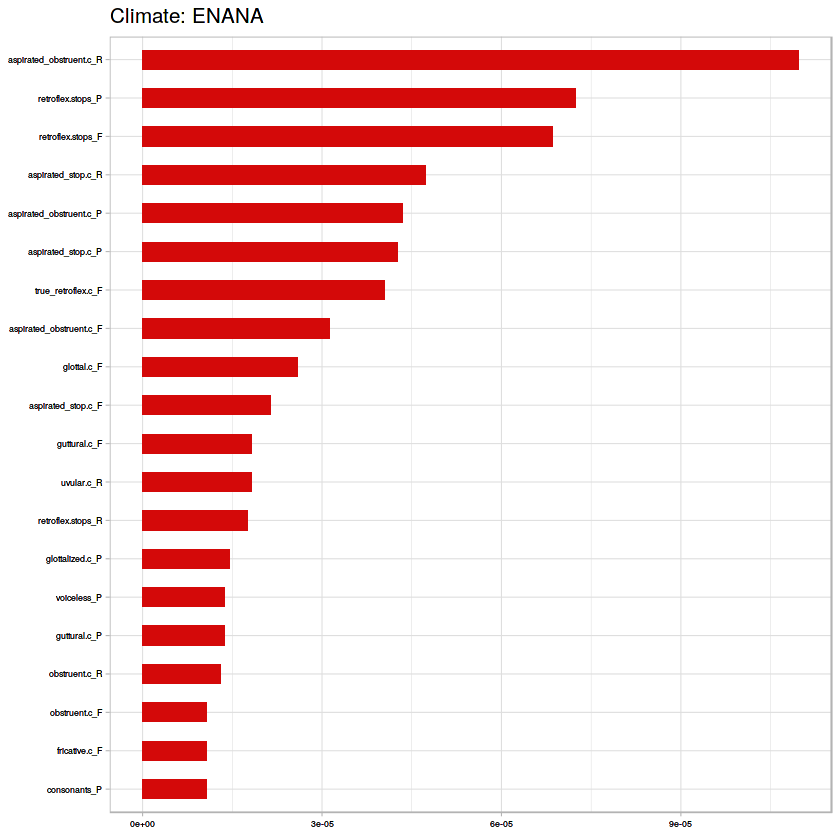

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.852193995381062
[1] "RF Confusion Matrix:"
   
      A   X
  A 591 111
  X  17 147


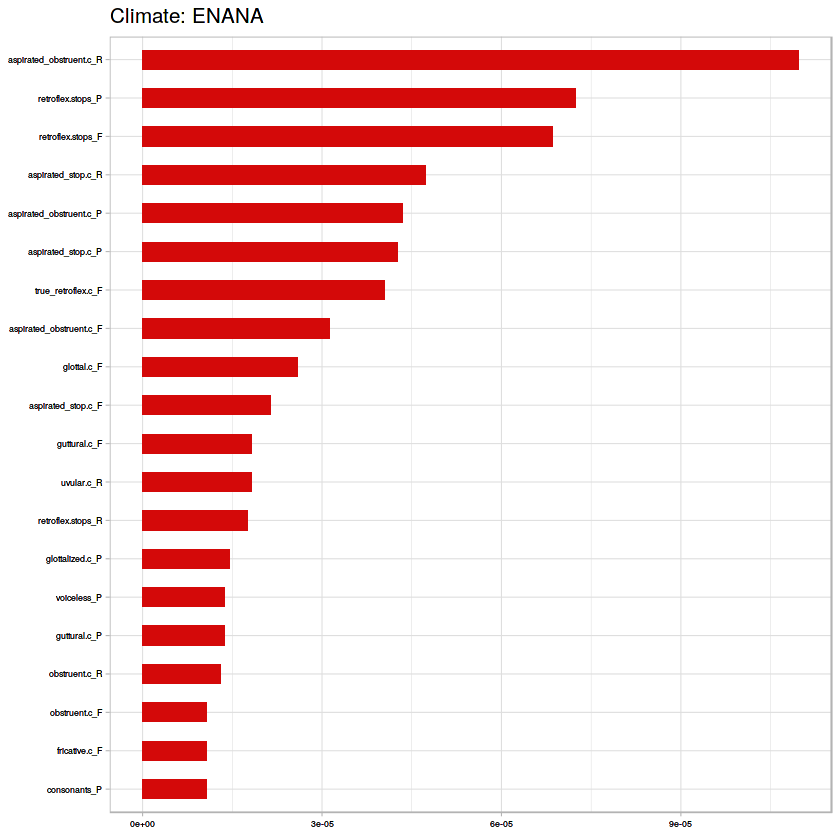

[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.856971153846154
[1] "RF Confusion Matrix:"
   
      A   X
  A 594 105
  X  14 119


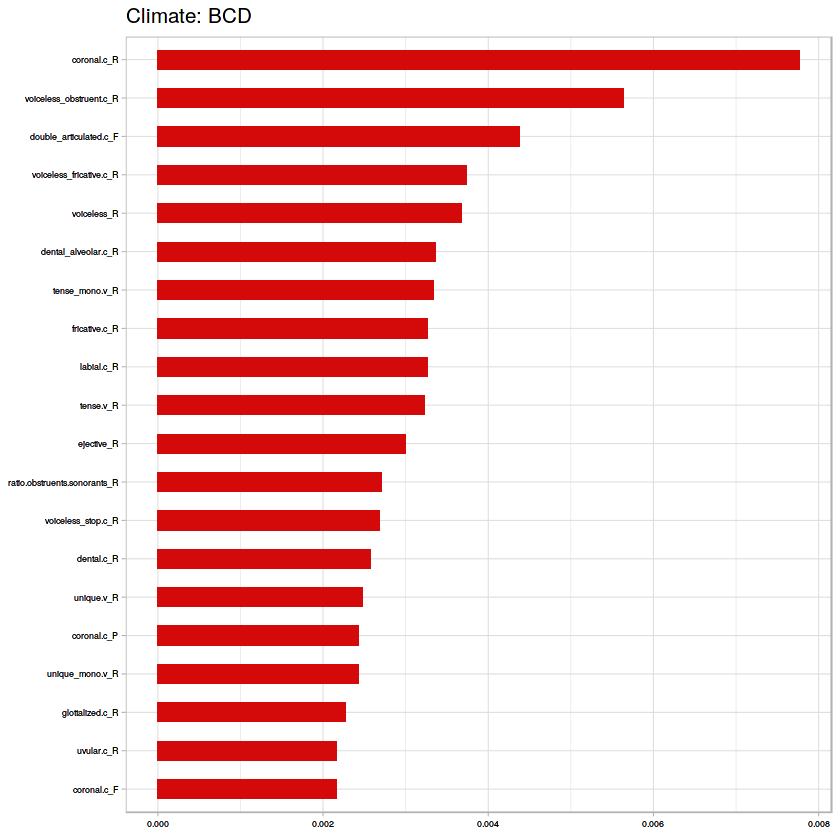

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.867268041237113
[1] "RF Confusion Matrix:"
   
      A   X
  A 603  98
  X   5  70


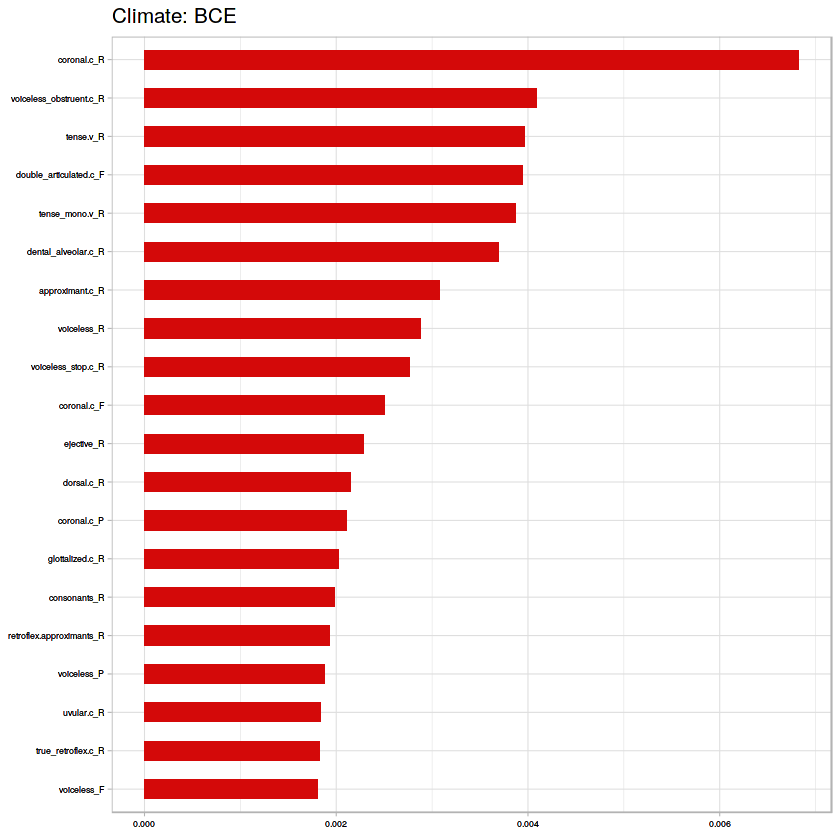

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.884462151394422
[1] "RF Confusion Matrix:"
   
      A   X
  A 603  82
  X   5  63


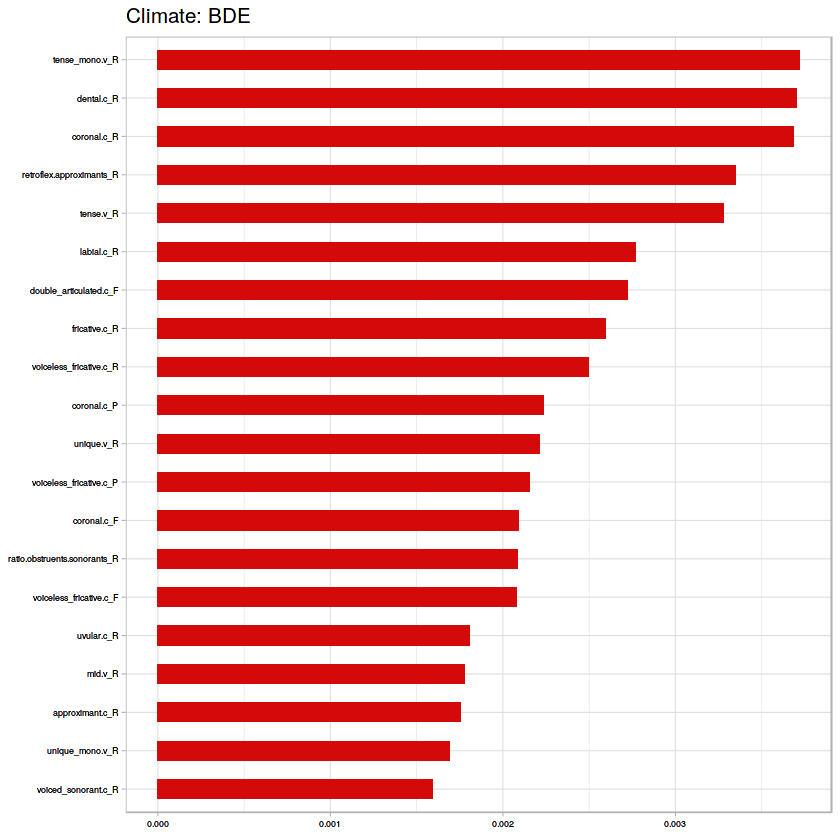

[1] "B" "C"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.856969696969697
[1] "RF Confusion Matrix:"
   
      A   X
  A 596 106
  X  12 111


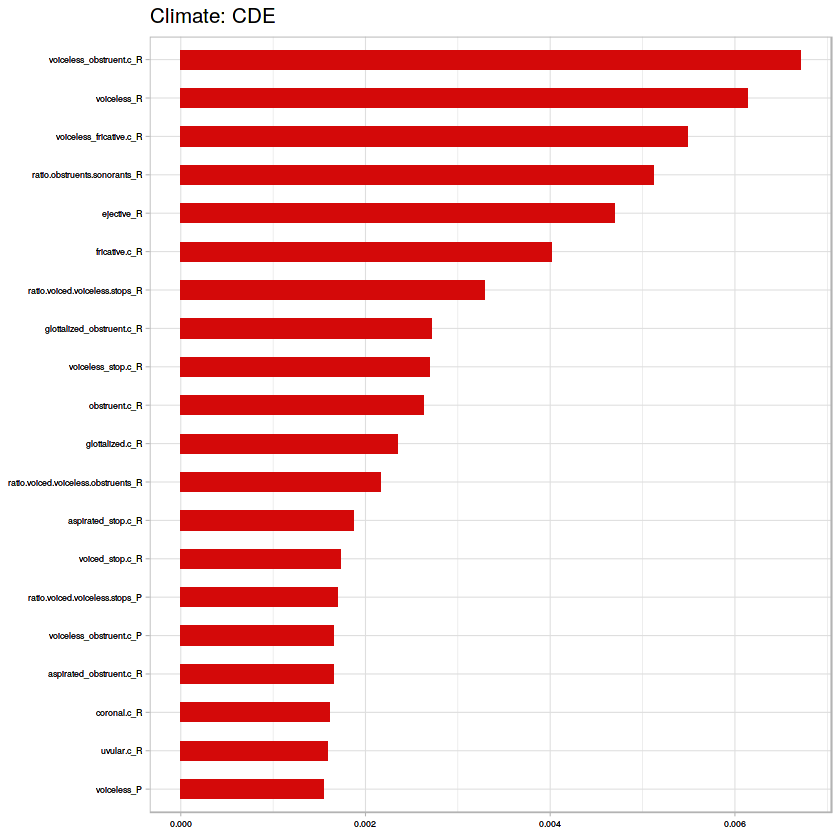

[1] "B" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.864759427828348
[1] "RF Confusion Matrix:"
   
      A   X
  A 603  99
  X   5  62


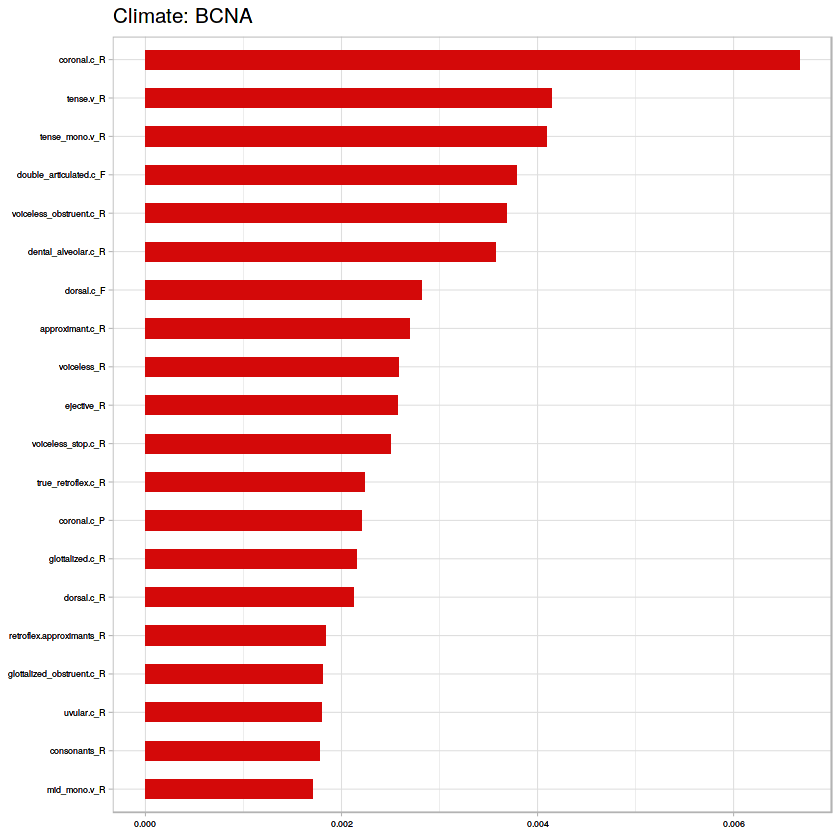

[1] "B" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.874829931972789
[1] "RF Confusion Matrix:"
   
      A   X
  A 606  90
  X   2  37


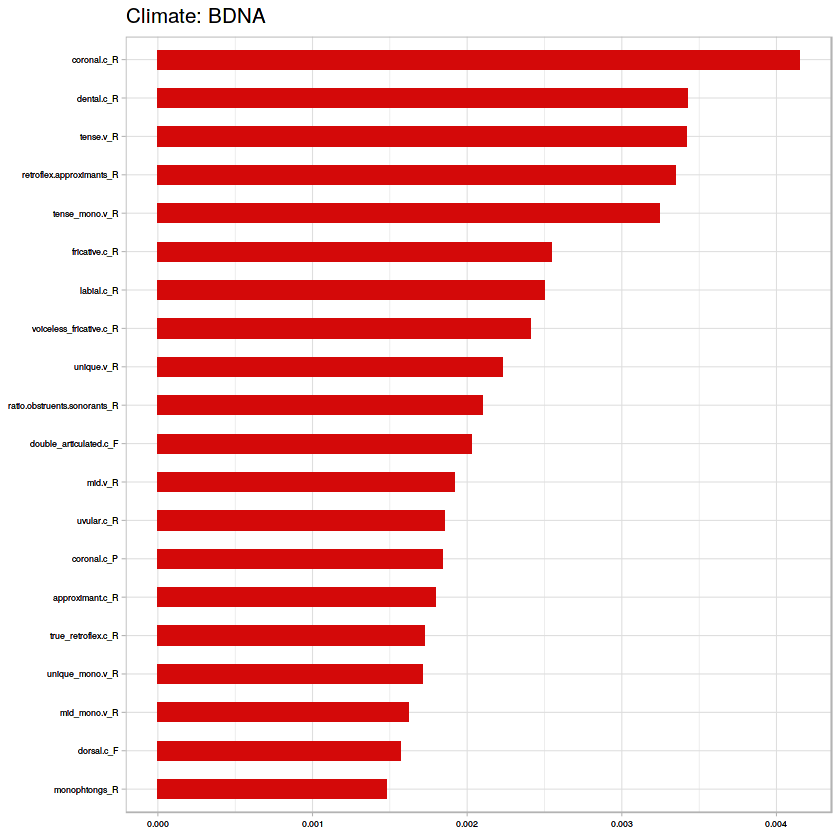

[1] "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.89142091152815
[1] "RF Confusion Matrix:"
   
      A   X
  A 603  76
  X   5  62


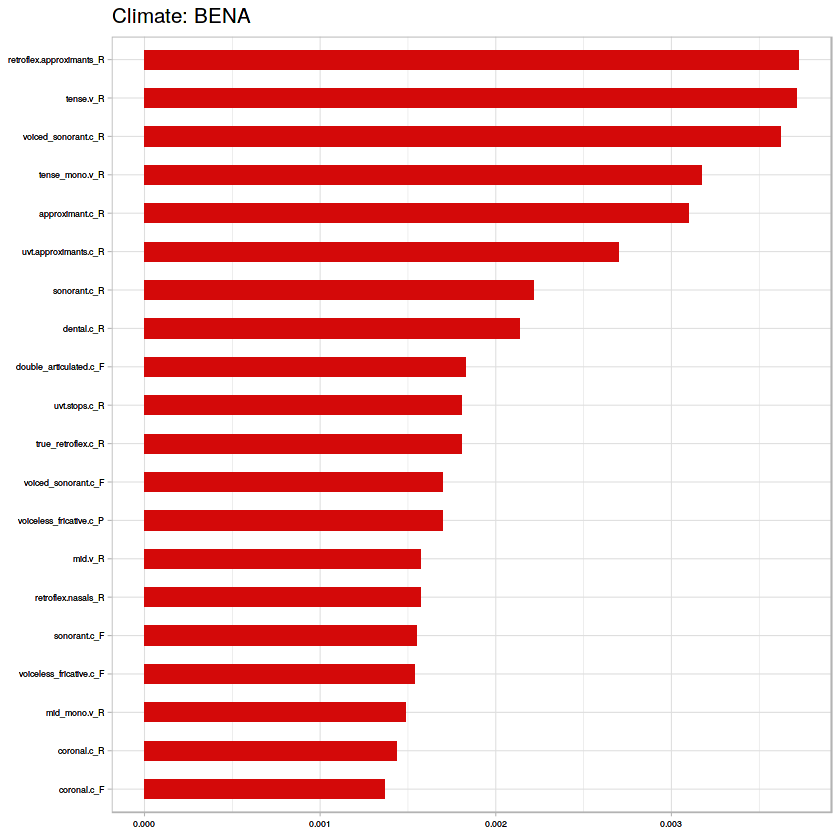

[1] "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.89185393258427
[1] "RF Confusion Matrix:"
   
      A   X
  A 606  75
  X   2  29


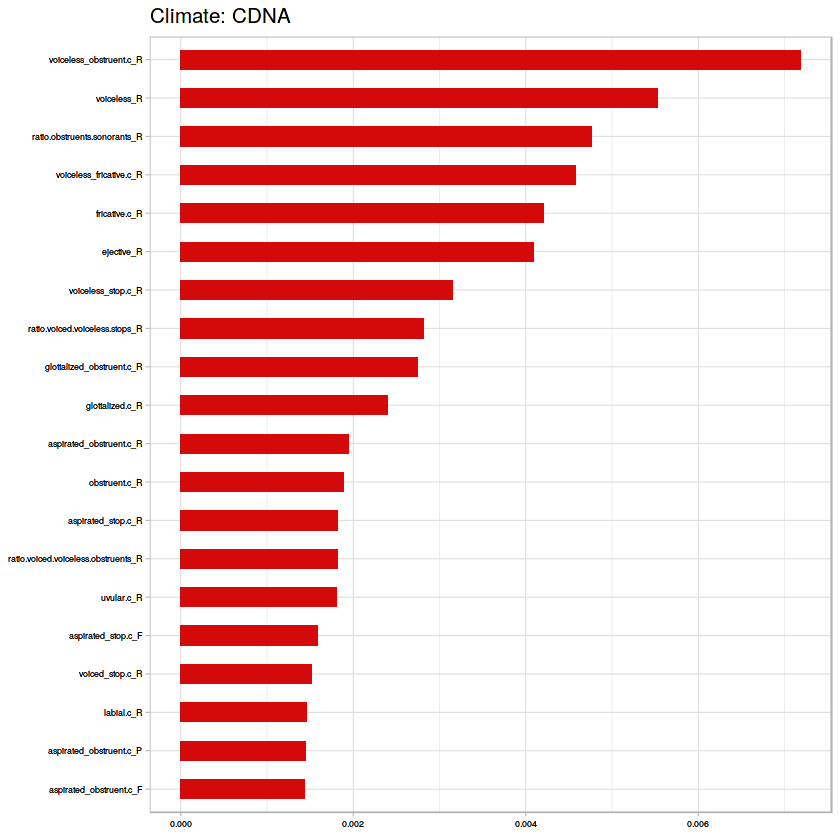

[1] "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.9375
[1] "RF Confusion Matrix:"
   
      A   X
  A 608  41
  X   0   7


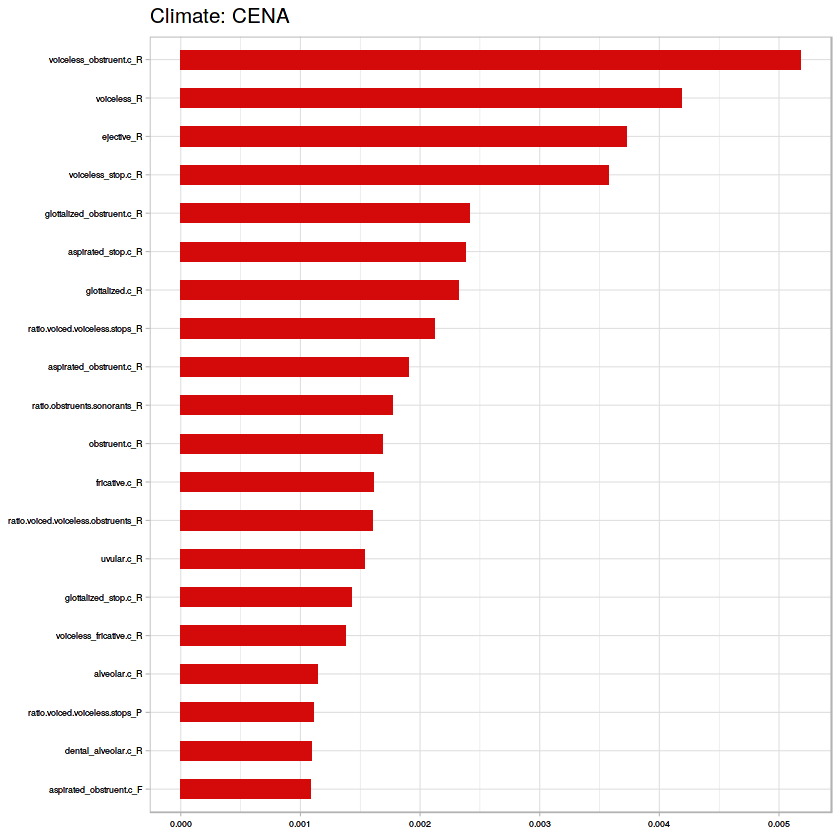

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.5775149
[1] C-V accuracy for Random Forest is 0.854524627720504
[1] "RF Confusion Matrix:"
   
      A   X
  A 591 110
  X  17 155


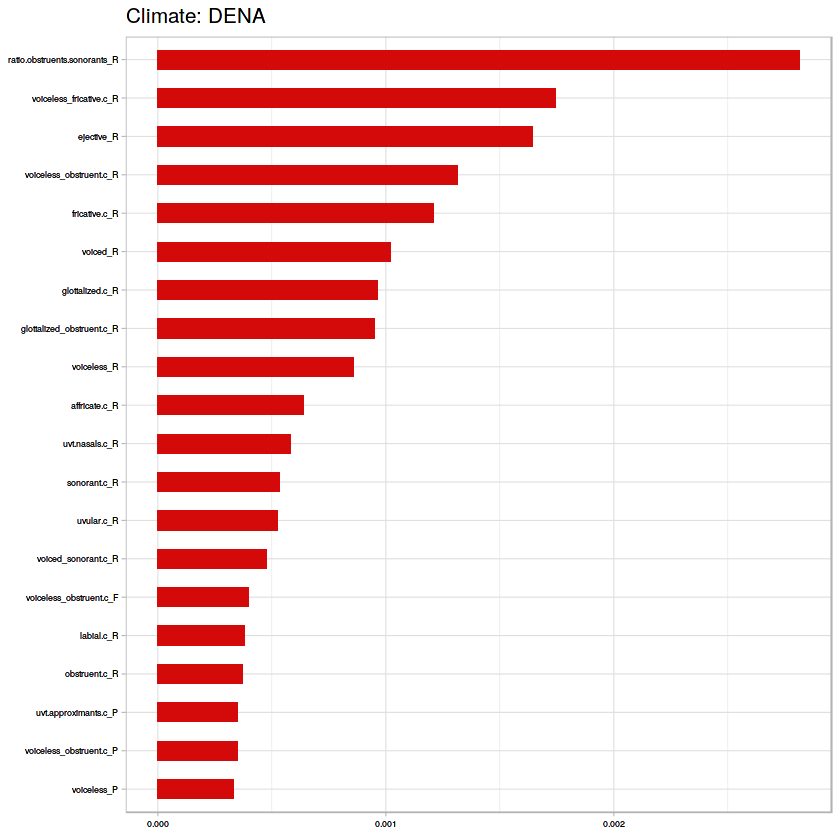

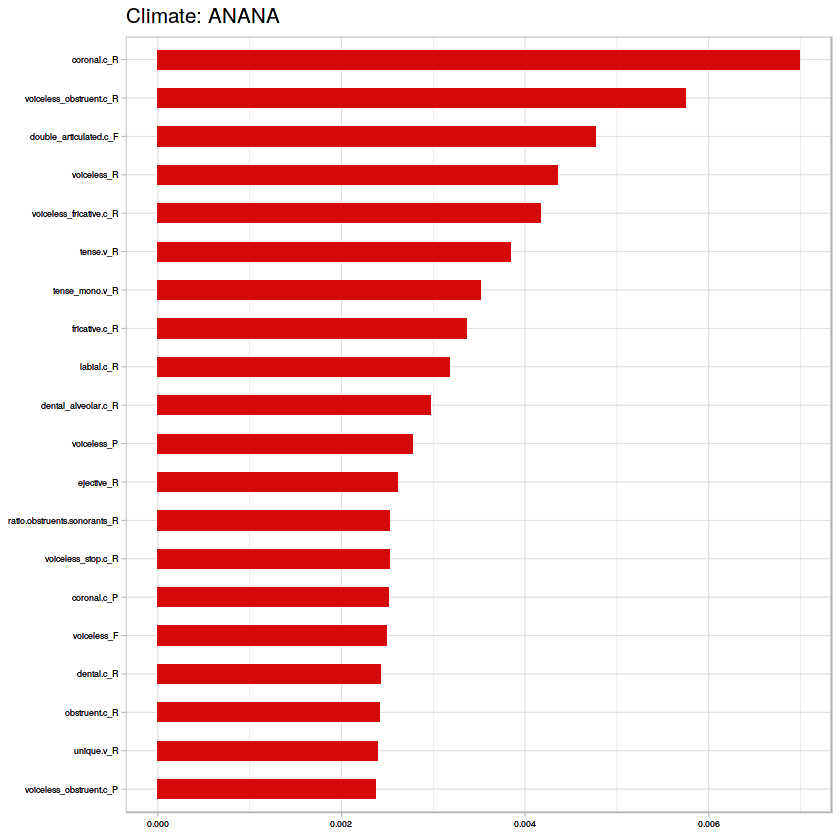

[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.7630235
[1] C-V accuracy for Random Forest is 0.892325315005727
[1] "RF Confusion Matrix:"
   
      B   X
  B  28   2
  X  92 751


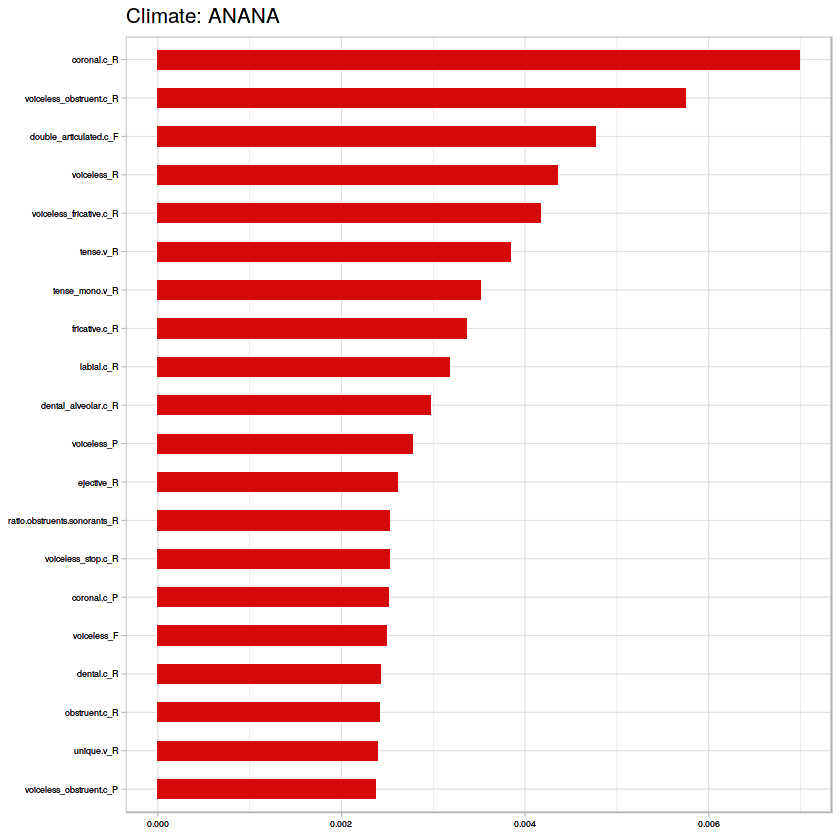

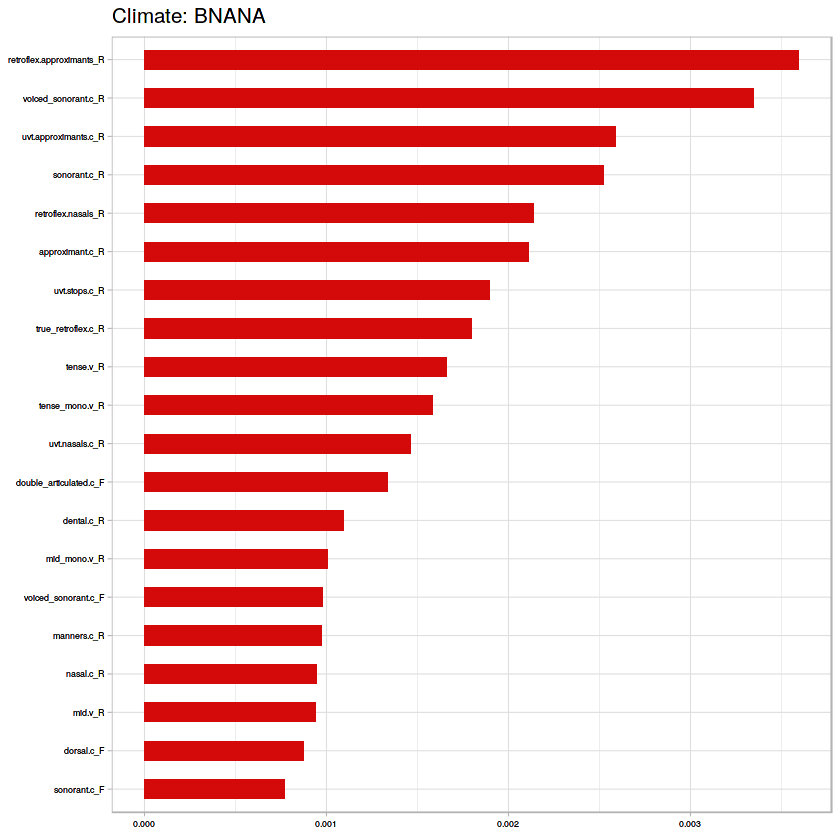

[1] "All vs Temperate"
[1] "Dummy Classifier accuracy:"
[1] 0.8022308
[1] C-V accuracy for Random Forest is 0.907216494845361
[1] "RF Confusion Matrix:"
   
      C   X
  C  18   2
  X  79 774


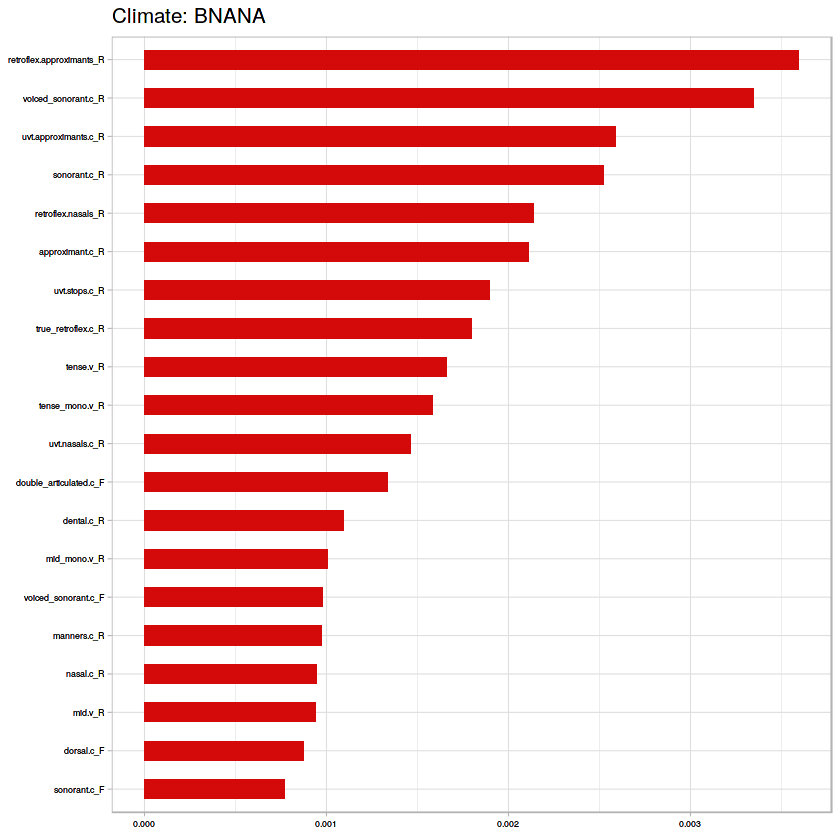

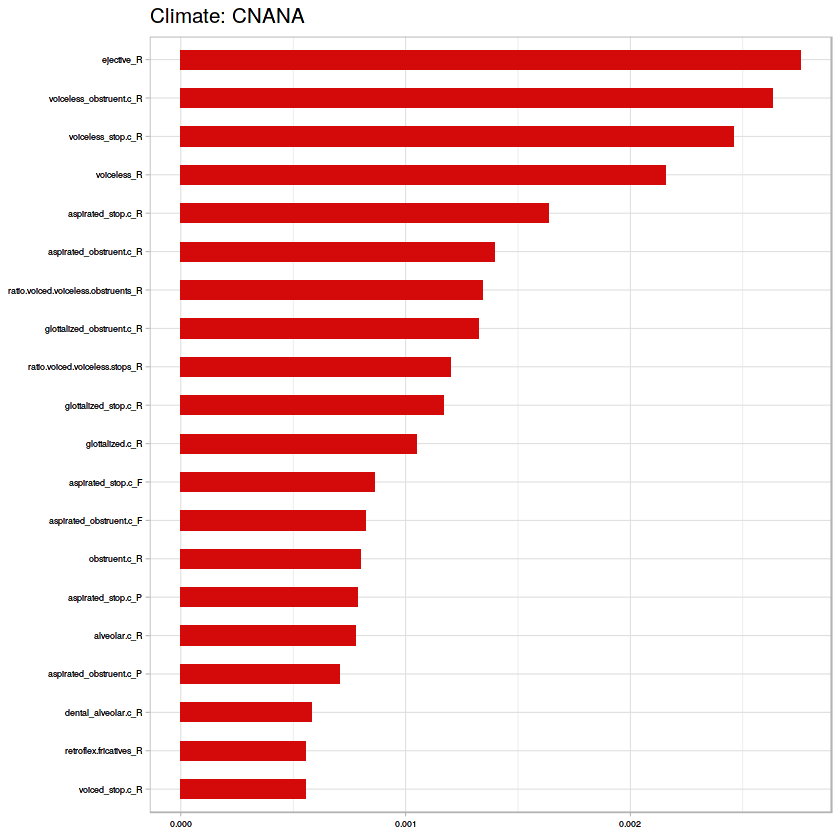

[1] "All vs Cold"
[1] "Dummy Classifier accuracy:"
[1] 0.9106495
[1] C-V accuracy for Random Forest is 0.953035509736541
[1] "RF Confusion Matrix:"
   
      D   X
  D   0   0
  X  41 832


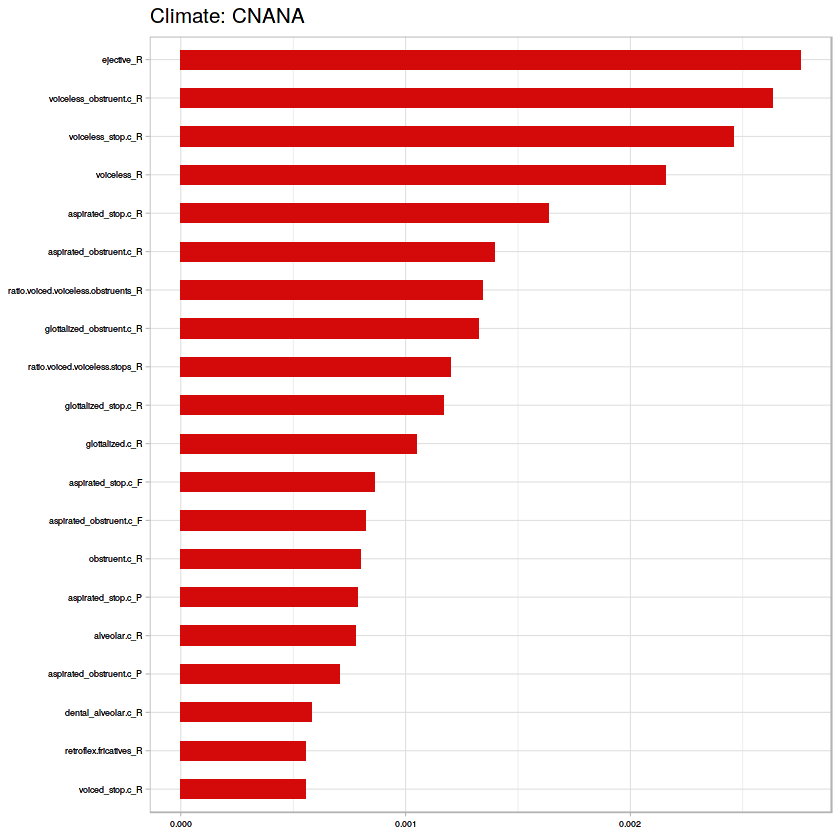

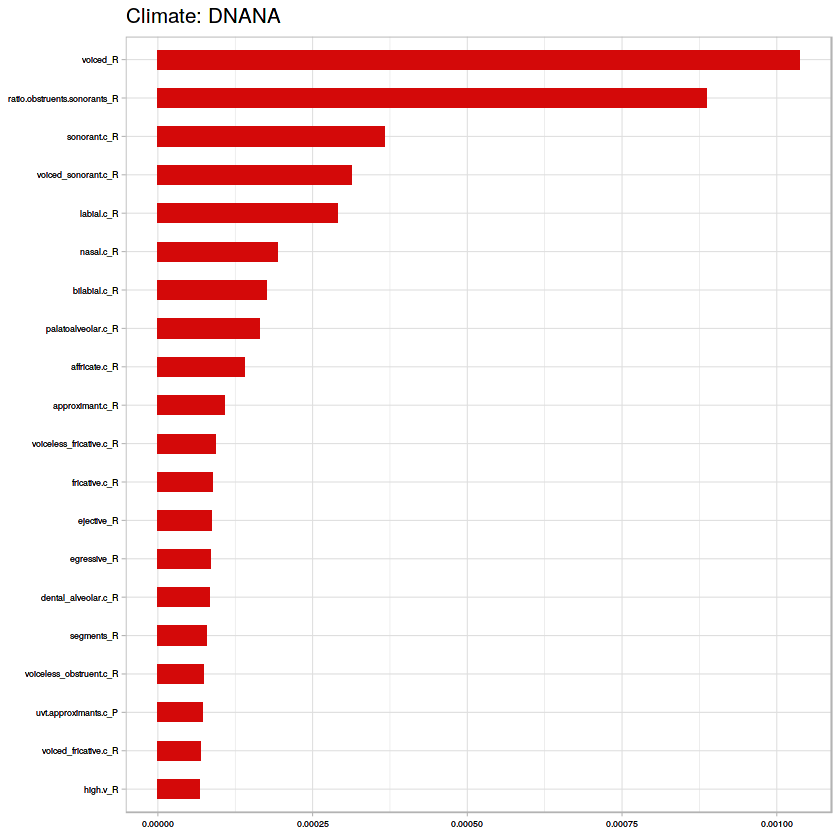

[1] "All vs Polar"
[1] "Dummy Classifier accuracy:"
[1] 0.9839948
[1] C-V accuracy for Random Forest is 0.991981672394044
[1] "RF Confusion Matrix:"
   
      E   X
  E   0   0
  X   7 866


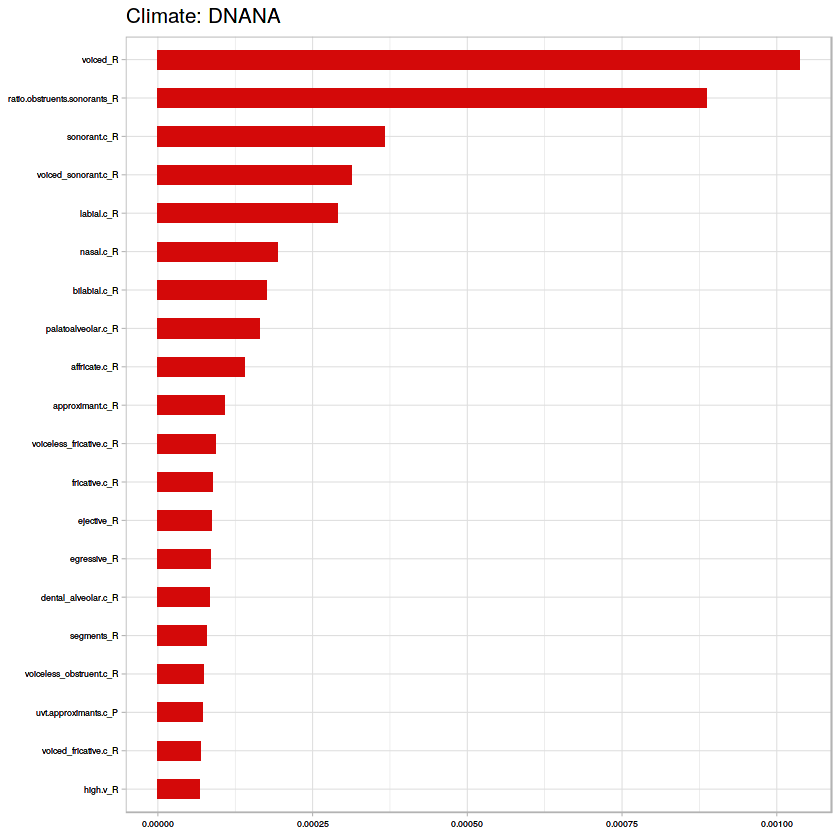

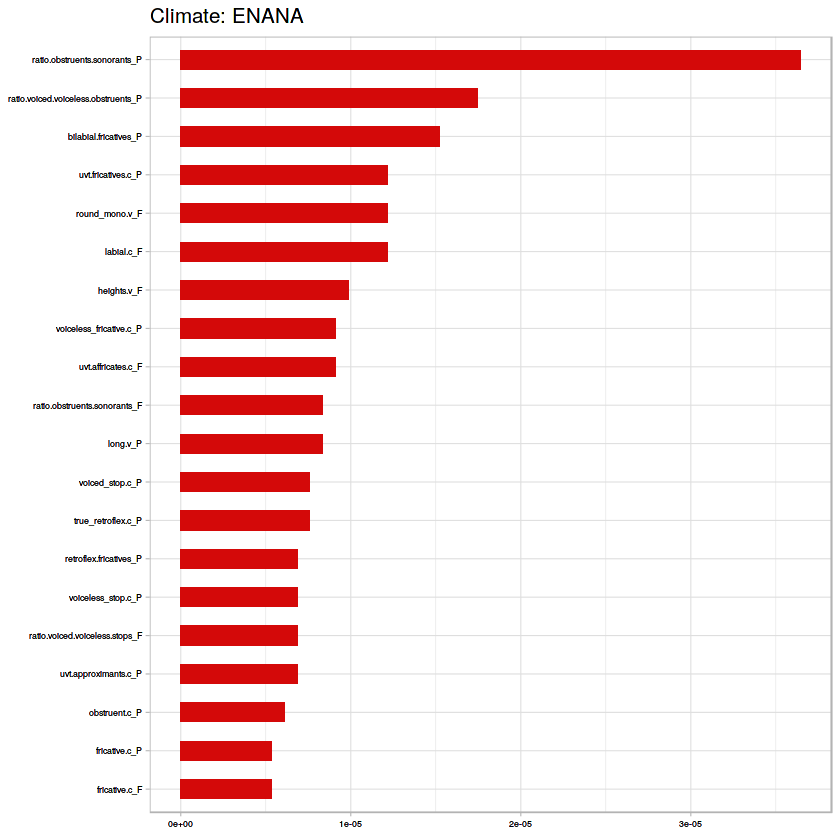

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.851039260969977
[1] "RF Confusion Matrix:"
   
      A   X
  A 591 112
  X  17 146


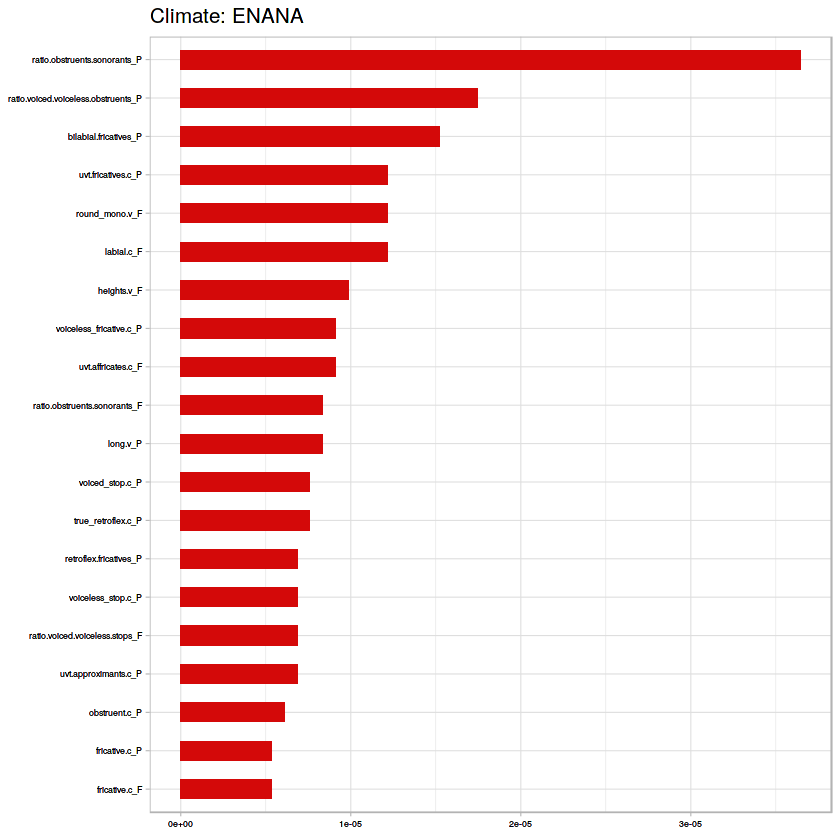

[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.856971153846154
[1] "RF Confusion Matrix:"
   
      A   X
  A 594 105
  X  14 119


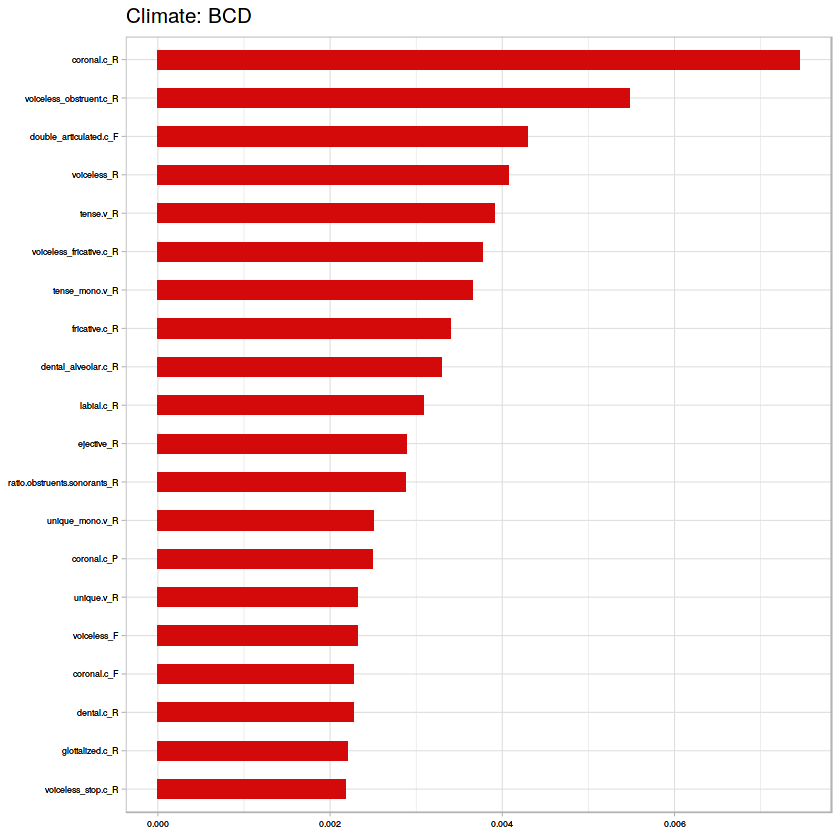

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.865979381443299
[1] "RF Confusion Matrix:"
   
      A   X
  A 603  99
  X   5  69


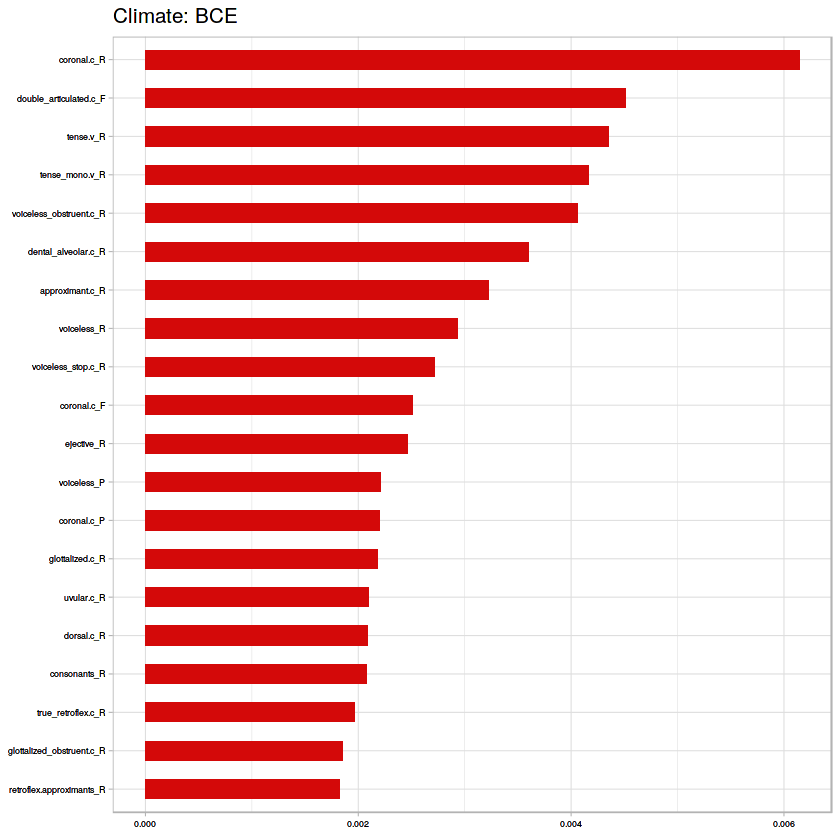

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.884462151394422
[1] "RF Confusion Matrix:"
   
      A   X
  A 603  82
  X   5  63


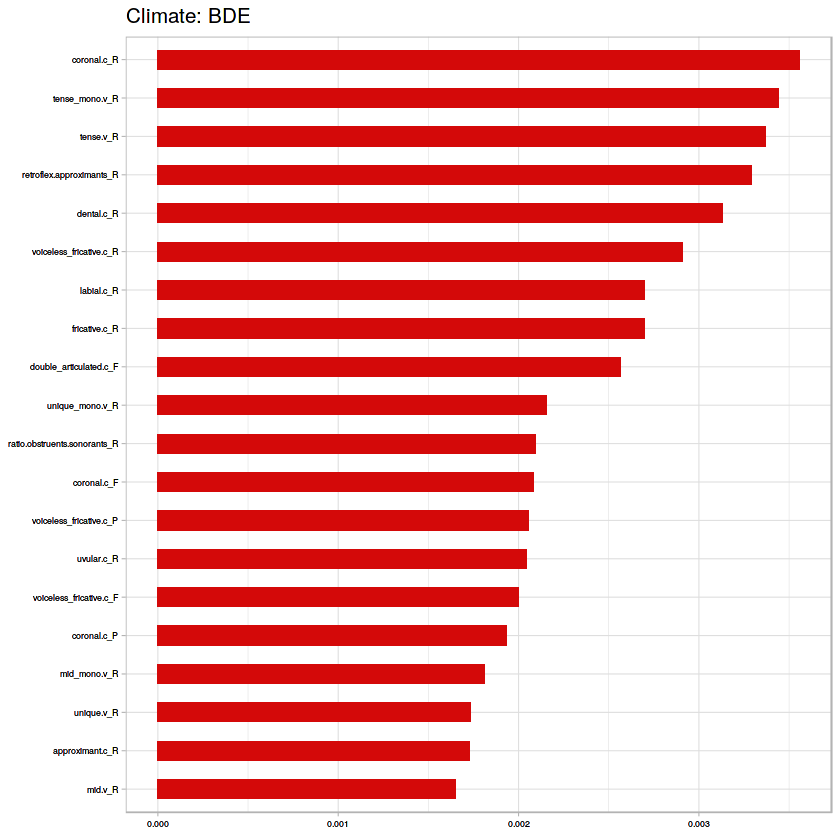

[1] "B" "C"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.858181818181818
[1] "RF Confusion Matrix:"
   
      A   X
  A 596 105
  X  12 112


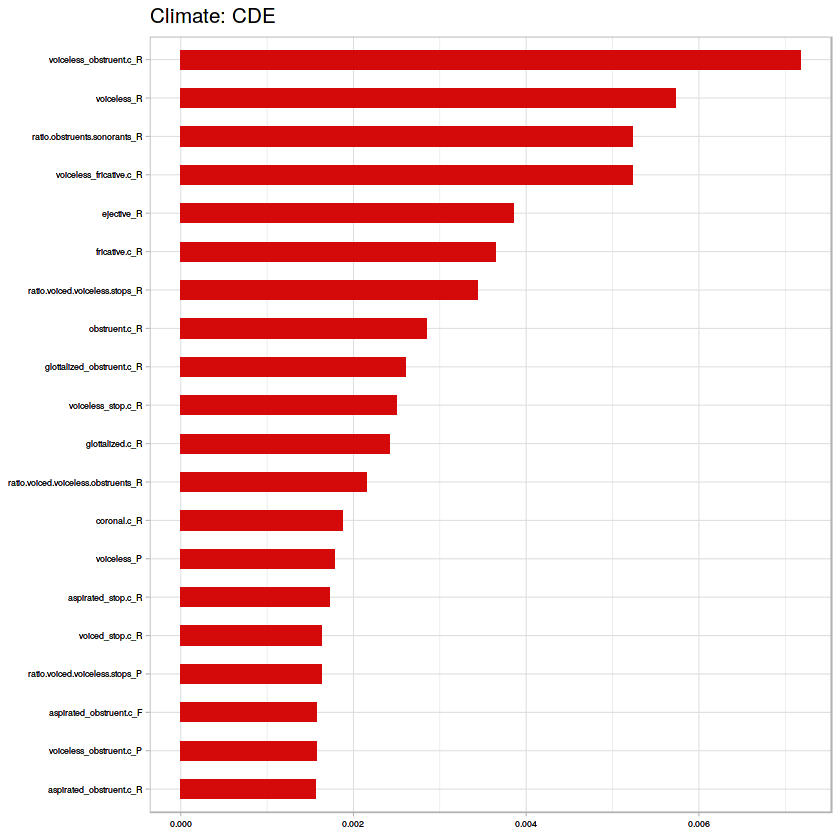

[1] "B" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.864759427828348
[1] "RF Confusion Matrix:"
   
      A   X
  A 603  99
  X   5  62


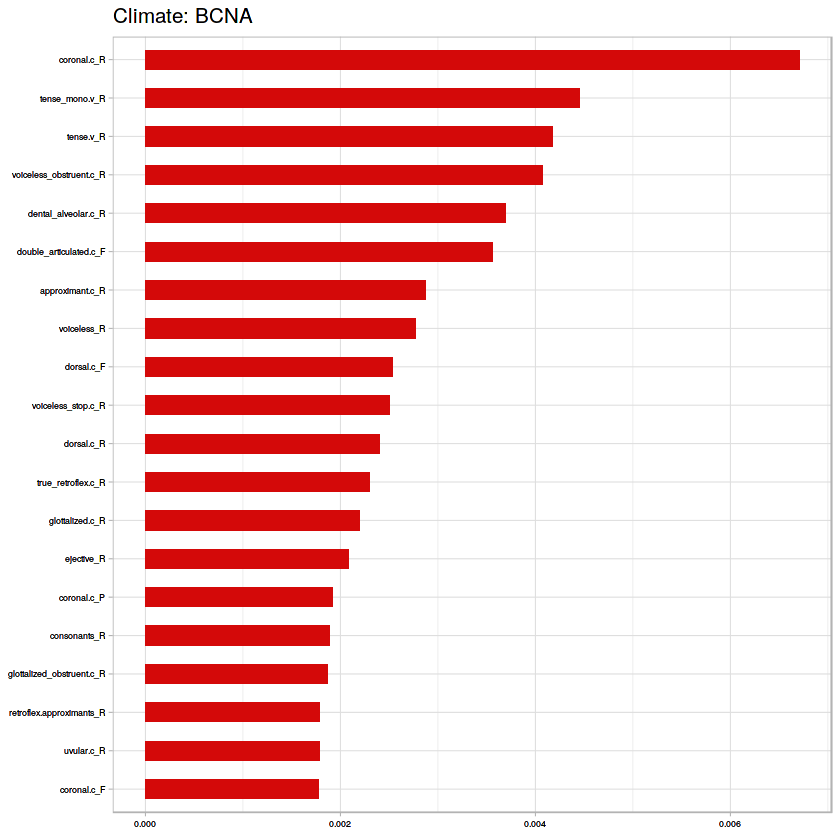

[1] "B" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.874829931972789
[1] "RF Confusion Matrix:"
   
      A   X
  A 606  90
  X   2  37


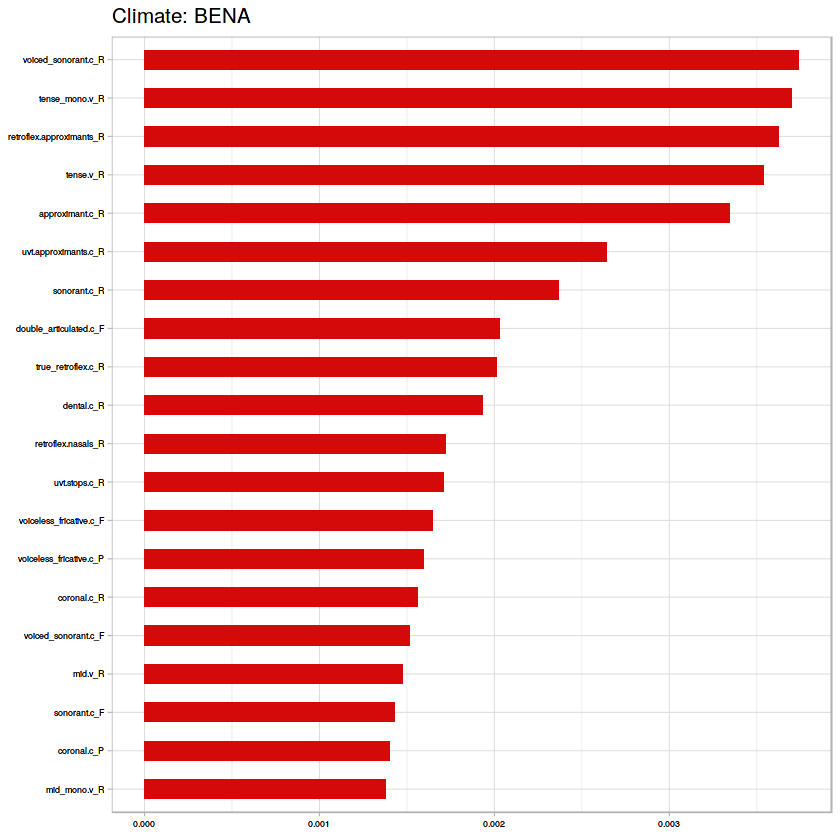

[1] "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.89185393258427
[1] "RF Confusion Matrix:"
   
      A   X
  A 606  75
  X   2  29


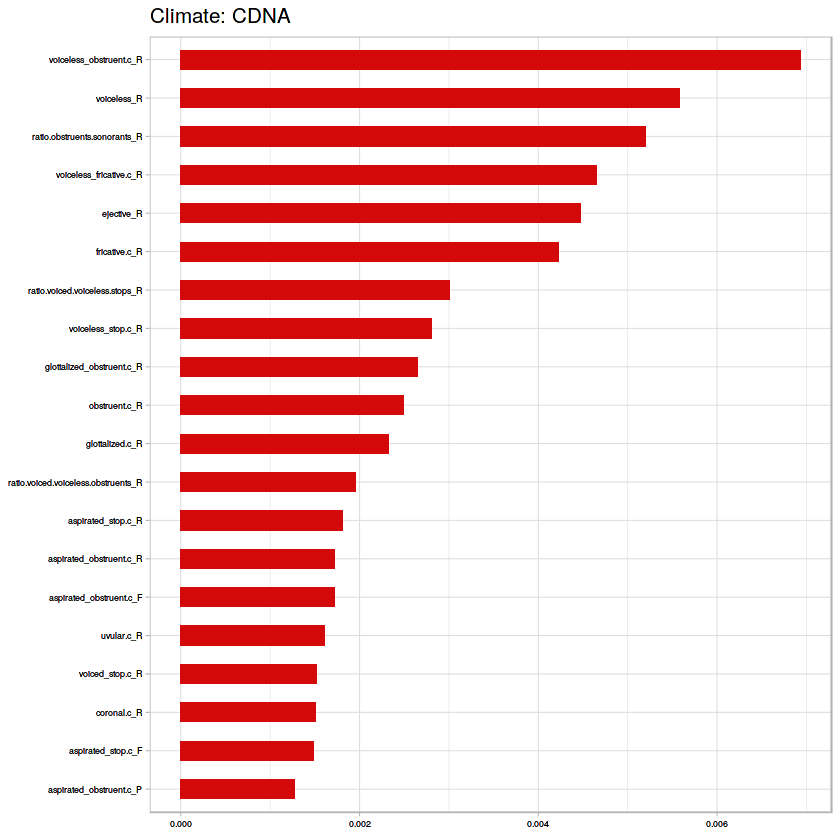

[1] "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.9375
[1] "RF Confusion Matrix:"
   
      A   X
  A 608  41
  X   0   7


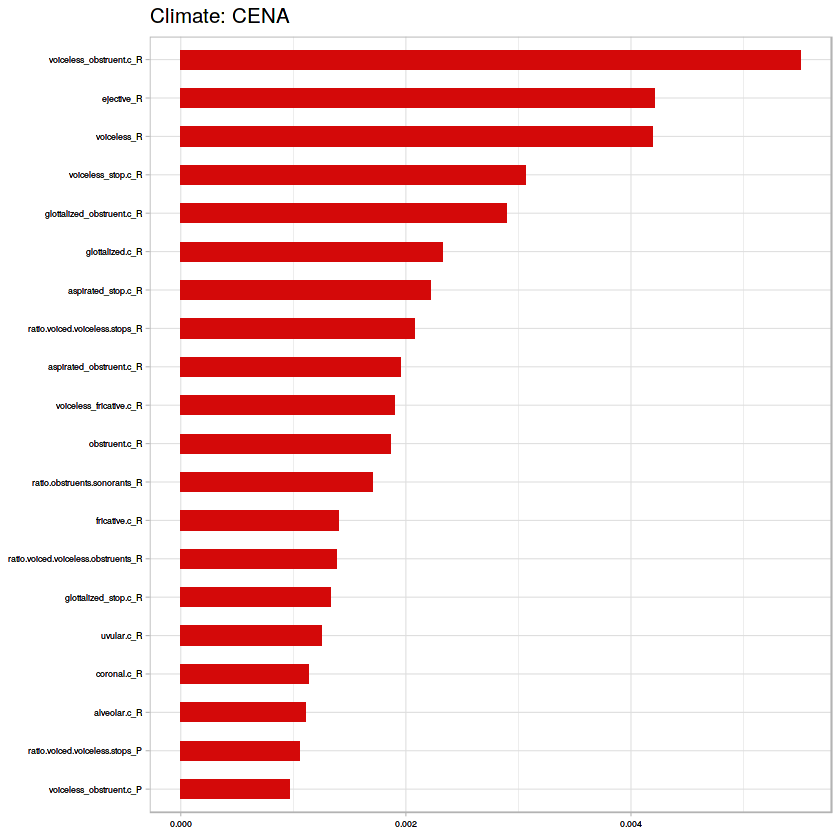

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.5771357
[1] C-V accuracy for Random Forest is 0.854524627720504
[1] "RF Confusion Matrix:"
   
      A   X
  A 591 110
  X  17 155


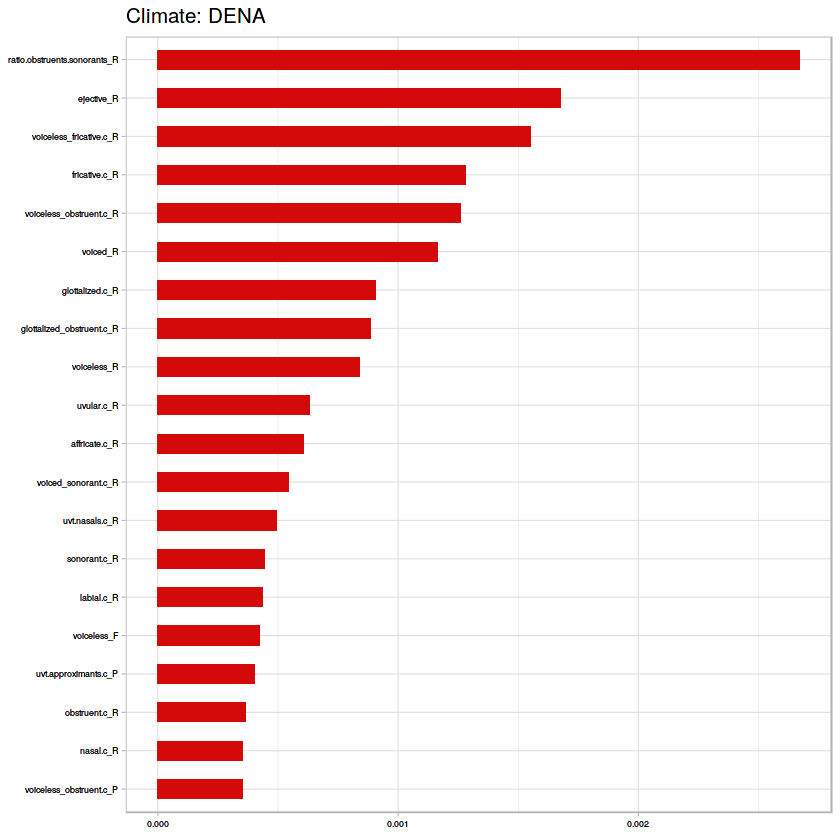

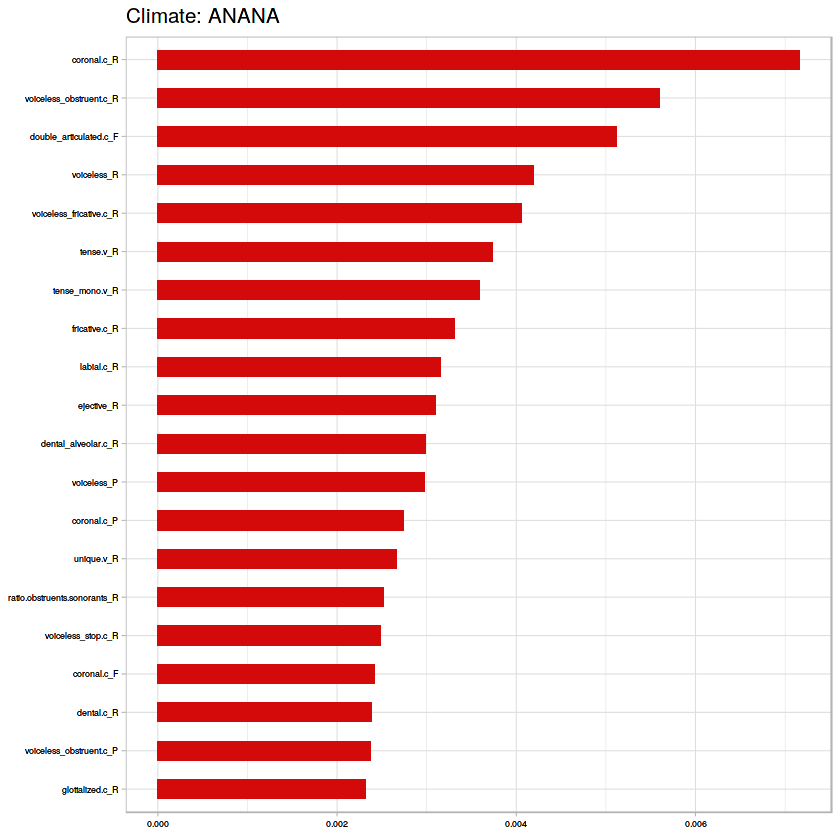

[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.7628866
[1] C-V accuracy for Random Forest is 0.892325315005727
[1] "RF Confusion Matrix:"
   
      B   X
  B  28   2
  X  92 751


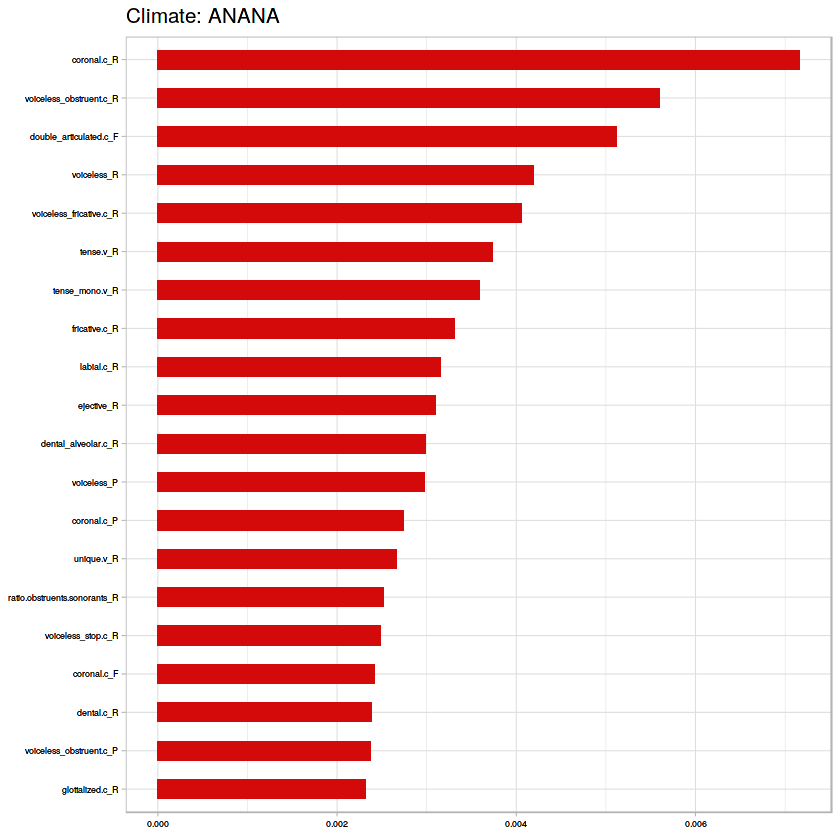

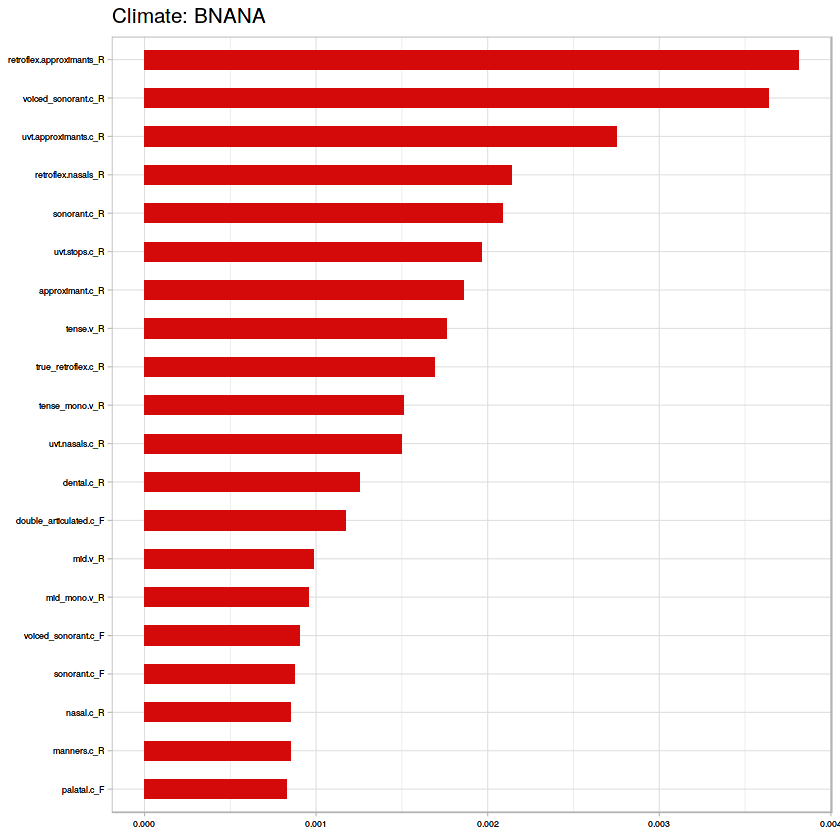

[1] "All vs Temperate"
[1] "Dummy Classifier accuracy:"
[1] 0.8020882
[1] C-V accuracy for Random Forest is 0.907216494845361
[1] "RF Confusion Matrix:"
   
      C   X
  C  18   2
  X  79 774


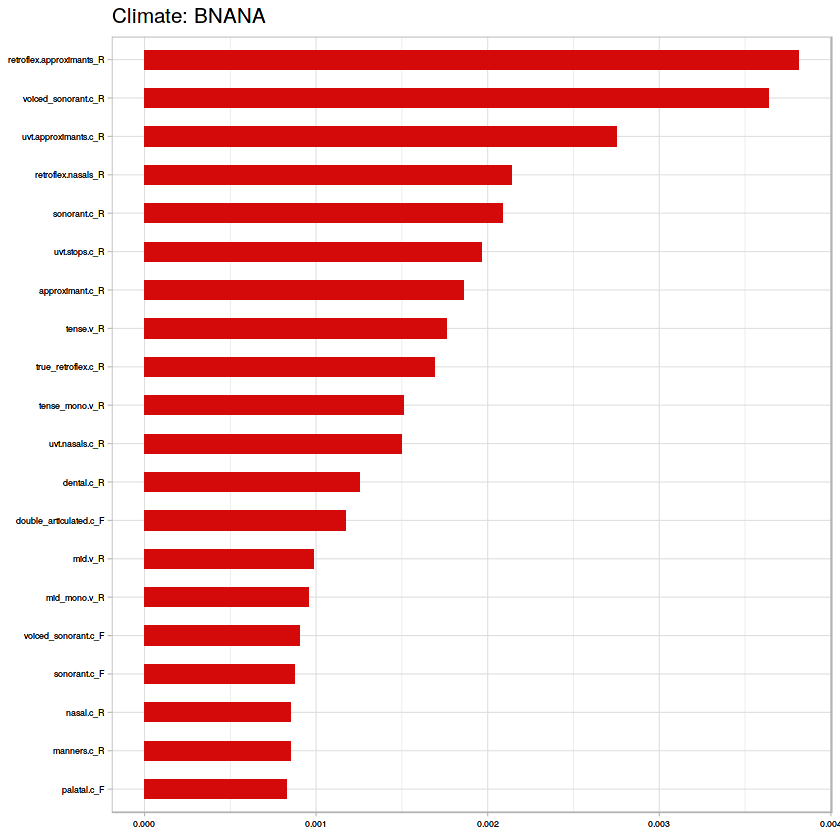

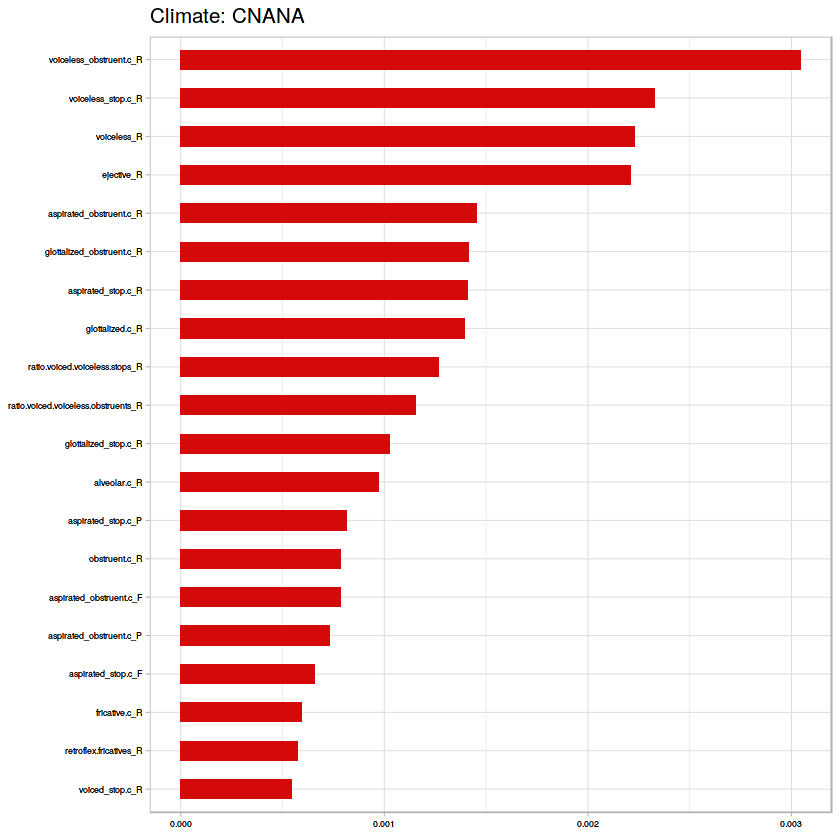

[1] "All vs Cold"
[1] "Dummy Classifier accuracy:"
[1] 0.9104152
[1] C-V accuracy for Random Forest is 0.953035509736541
[1] "RF Confusion Matrix:"
   
      D   X
  D   0   0
  X  41 832


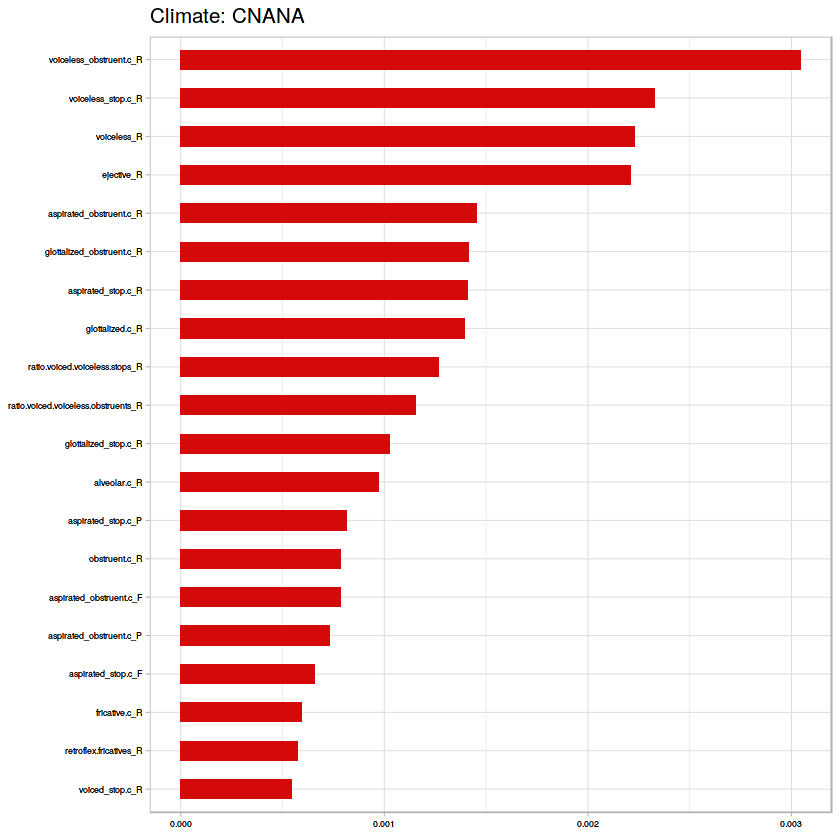

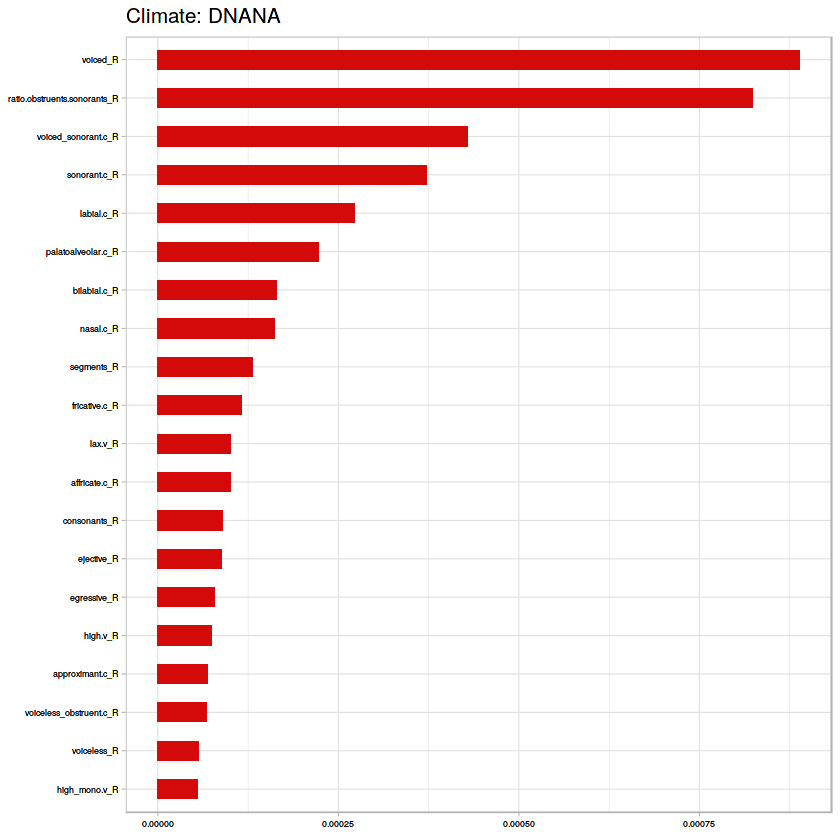

[1] "All vs Polar"
[1] "Dummy Classifier accuracy:"
[1] 0.9840888
[1] C-V accuracy for Random Forest is 0.991981672394044
[1] "RF Confusion Matrix:"
   
      E   X
  E   0   0
  X   7 866


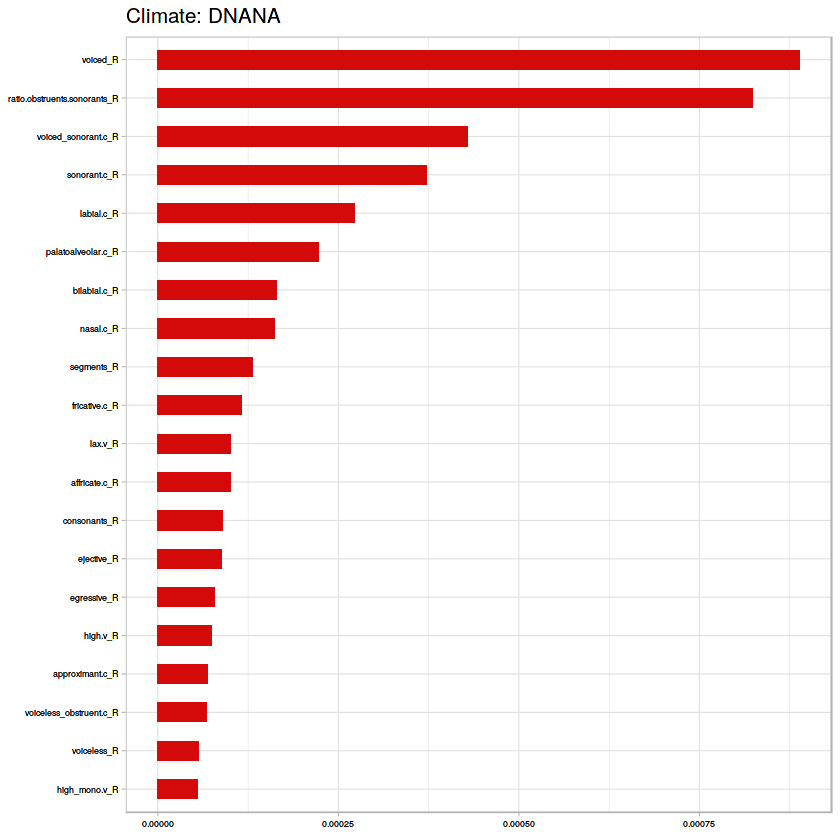

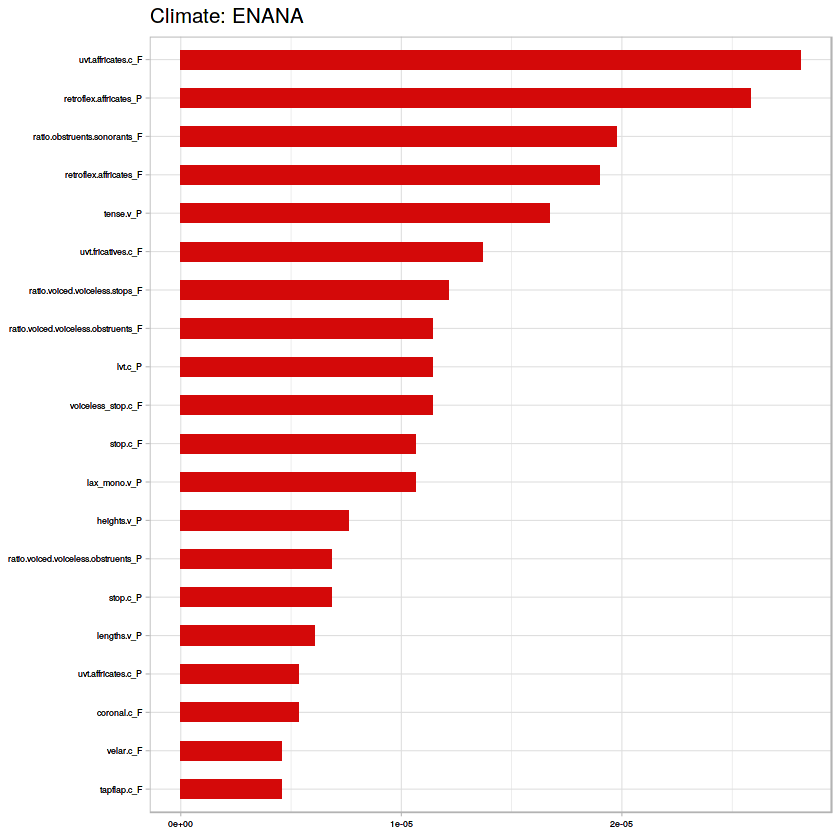

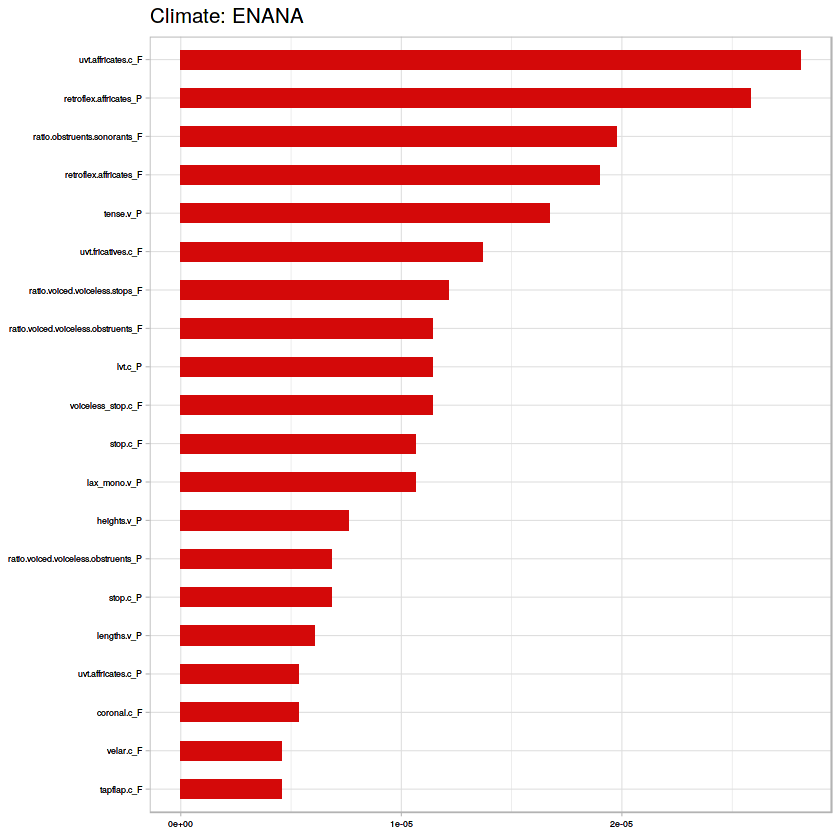

In [94]:
#2nd run
bin_tropvs(high_m)
ovsa(high_m)

bin_tropvs(med_m)
ovsa(med_m)

bin_tropvs(med_m)
ovsa(med_m)

In [35]:
dist(high_m)


         A          B          C          D          E 
0.44151376 0.13990826 0.31077982 0.07683486 0.03096330 

In [38]:
dist(med_m)


          A           B           C           D           E 
0.696449026 0.137457045 0.111111111 0.046964490 0.008018328 

In [40]:
dist(l_m)


          A           B           C           D           E 
0.743413517 0.061855670 0.126002291 0.059564719 0.009163803 

In [27]:
low_m <-subset(m_tri, tritile = 1)

In [33]:
ddiscrete(high_m$Climate)

ERROR: Error in ddiscrete(high_m$Climate): argument "probs" is missing, with no default


In [46]:
nrow(getData('ISO3'))

[1] 256

In [158]:
glot = read.csv("Glotto_lang.csv", header = TRUE, stringsAsFactors = FALSE)
fam = read.csv("languoid.csv", header = TRUE, stringsAsFactors = FALSE)
fam<-fam[1:2]
colnames(fam)[1]<-'Glottolog'

In [163]:
df_fam[c('Glottolog', 'Climate', 'X', 'WALS', 'AUTOTYP', 'UULID','ISO')]<-list(NULL)

In [170]:
df_fam[2:527]<-as.numeric(df_fam[2:527])

ERROR: Error in eval(expr, envir, enclos): (list) object cannot be coerced to type 'double'


In [288]:
ncol(df_fam)

[1] 535

In [343]:
d_f<-d_f[c(1,537,538)]

In [345]:
ncol(df_fam)

[1] 537

In [344]:
df_fam<-merge(df_fam, d_f)

In [350]:
med_fam<-med_fam[-2]
mean_fam<-mean_fam[-2]

med_fam<-aggregate(df_fam[c(2,10:537)], df_fam['family_id'], median, na.rm = TRUE)
mean_fam<-aggregate(df_fam[c(2,10:537)], df_fam['family_id'], mean, na.rm = TRUE)
#aggregate(d[, 3:4], list(d$Name), mean)

Warning message:
In mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]): argument is not numeric or logical: returning NAWarning message:
In mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]): argument is not numeric or logical: returning NAWarning message:
In mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]): argument is not numeric or logical: returning NAWarning message:
In mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]): argument is not numeric or logical: returning NAWarning message:
In mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]): argument is not numeric or logical: returning NAWarning message:
In mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]): argument is not numeric or logical: returning NAWarning message:
In mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]): argument is not numeric or logical: returning NAWarning message:
In mean.default(sort(x, partial = half + 0L:1L)[half + 0L:1L]): argument is not 

In [355]:
#Get the median and mean for each feature of values
mean_fam <- mean_fam[-2]
mean_fam <-merge(mean_fam, area)
med_fam <-merge(med_fam, area)

In [356]:
mean_fam<-rbind(mean_fam,na_fam[-1])
med_fam<-rbind(med_fam,na_fam[-1])

In [360]:
median_area<-aggregate(med_fam[c('Temp','Prec','elevation','voiceless_R','dorsal.c_R','uvular.c_R')],med_fam['macroareas'],median, na.rm = TRUE)

In [361]:
mean_area<-aggregate(mean_fam[c('Temp','Prec','elevation','voiceless_R','dorsal.c_R','uvular.c_R')],mean_fam['macroareas'],mean, na.rm = TRUE)

In [362]:
#Save median and mean df
write.csv(median_area, file = "median_area.csv")
write.csv(mean_area, file = "mean_area.csv")

In [363]:
median_area

macroareas,Temp,Prec,elevation,voiceless_R,dorsal.c_R,uvular.c_R
,205.00,2456.5,659.750,27.00,5.00,2
Africa,258.00,1052.0,670.500,7.00,5.00,0
Australia,268.50,738.5,110.250,4.50,5.00,0
Eurasia,110.50,996.5,494.875,8.50,6.00,0
North America,128.00,1129.0,329.500,10.00,4.75,0
Papunesia,256.00,2604.0,227.000,5.00,5.00,0
South America,250.75,2279.0,208.375,7.25,4.00,0


In [378]:
p<-ggplot(mean_area, aes(elevation, dorsal.c_R, label = macroareas))

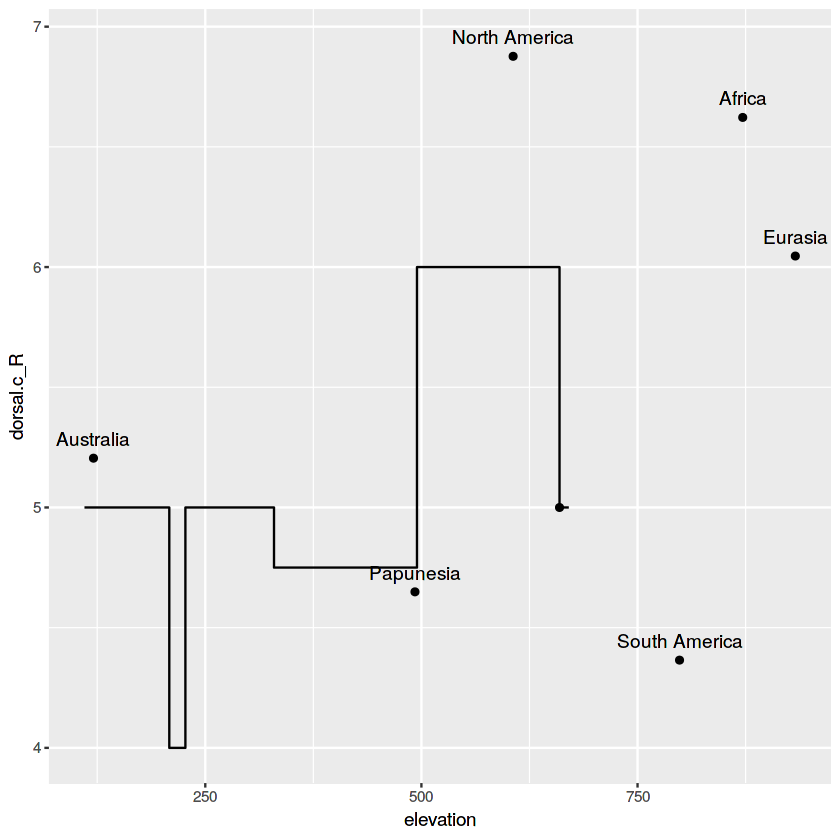

In [388]:
p + geom_point() + geom_text(vjust = 0 , nudge_y = 0.05) + geom_step(data = median_area)

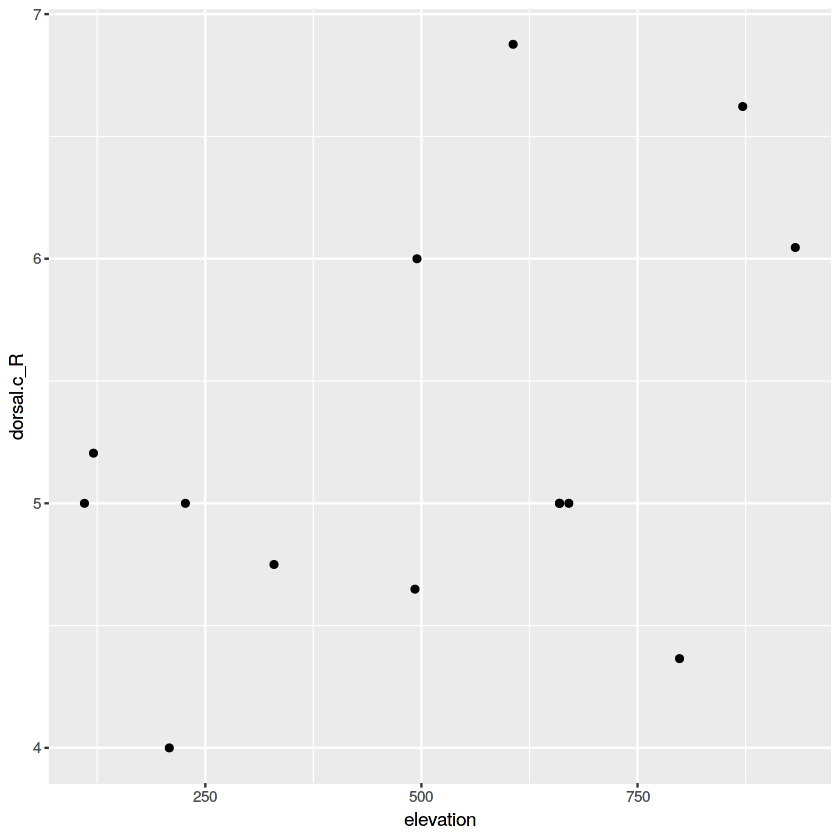

In [392]:
(plot1 <- ggplot(mean_area, aes(elevation, dorsal.c_R, label = macroareas)) + 
    geom_point() +
    geom_point(data = median_area)
)

In [293]:
med_fam<-merge(med_fam,area)

ERROR: Error in fix.by(by.x, x): 'by' must specify a uniquely valid column


In [278]:
med_fam<-rbind(med_fam,na_fam[c(2:529)])

In [284]:
aggregate(med_fam[c('elevation','voiceless_R','dorsal.c_R','uvular.c_R')],med_fam['macroareas'],median, na.rm=TRUE)

macroareas,elevation,voiceless_R,dorsal.c_R,uvular.c_R
,498.50,NA,NA,NA
Africa,712.00,7.75,5.5,0.0
Australia,86.75,4.00,5.0,0.0
Eurasia,475.50,7.50,7.0,1.5
North America,277.75,19.00,8.5,2.0
Papunesia,147.00,4.00,4.0,0.0
South America,213.50,7.50,4.0,0.0


In [348]:
na_fam<-subset(df_fam, family_id=='')

na_fam<-na_fam[c(1:3,10:537)]

In [110]:
d_f<-merge(glot[c('Glottolog','latitude','longitude','macroareas', 'family')],m)

ERROR: Error in `[.data.frame`(glot, c("Glottolog", "latitude", "longitude", : undefined columns selected


In [53]:
aggregate(d_f['elevation'], list(d_f$macroareas), median)

Group.1,elevation
Africa,367.0
Australia,112.0
Eurasia,696.0
North America,692.0
Papunesia,205.5
South America,209.5


In [52]:
aggregate(d_f['elevation'], list(d_f$macroareas), mean)

Group.1,elevation
Africa,551.8254
Australia,146.3158
Eurasia,986.8069
North America,801.3378
Papunesia,538.9280
South America,773.3833


In [69]:
#Import elevation data from API
dat<-df[,c(12,11)]
u <- "https://api.open-elevation.com/api/v1/lookup"
h <- c ("Accept" = "application/json","Content-Type" = "application/json")

jsonlite::toJSON ()

b <- paste0 ('{"locations":', dat, '}')
res <- httr::POST (u, httr::add_headers (.headers = h), body = b)
httr::content (res, as = 'text', encoding = "UTF-8",type = "application/xml") %>%

jsonlite::fromJSON()


ERROR: Error in force(x): argument "x" is missing, with no default


In [ ]:
#Import elevation data from API
get_elev <- function (npts = 10, x = -0.090706, y = 51.5005, # London
                      dx = 0.01, dy = 0.01)
{
    u <- "https://api.open-elevation.com/api/v1/lookup"
    h <- c ("Accept" = "application/json",
            "Content-Type" = "application/json")
    dat <- data.frame ("latitude" = x + runif (npts, -1, 1) * dx,
                       "longitude" = y + runif (npts, -1, 1) * dy) %>%
        jsonlite::toJSON ()
    b <- paste0 ('{"locations":', dat, '}')
    res <- httr::POST (u, httr::add_headers (.headers = h), body = b)
    httr::content (res, as = 'text', encoding = "UTF-8",
                          type = "application/xml") %>%
        jsonlite::fromJSON()
}
n <- ceiling (10 ^ (1:20 / 5))
st <- pbapply::pbsapply (seq (n), function (i) system.time (get_elev (i)) [3])


In [57]:
r <- elevation(lng = 13, lat = 47)

ERROR: Error in open.connection(con, "rb"): Empty reply from server


In [204]:
df_fam<-merge(fam,m, all=FALSE)

In [71]:
df_fam[ df_fam == ''] <- NA

In [184]:
glot<-glot[c('macroareas','id')]

In [186]:
names(glot)[2]<-'Glottolog'

In [188]:
fam<-merge(fam,glot)

In [192]:
Mode <- function(x) {
  ux <- unique(x)
  ux[which.max(tabulate(match(x, ux)))]
}

In [217]:
med_fam<-med_fam[-1,]

In [239]:
ncol(na_fam)

[1] 527

In [248]:
names(na_fam[1])<-'family_id'

In [238]:
na_fam<-cbind(l,na_fam)

In [256]:
names(na_fam)[1]<-'family_id'

In [224]:
na_fam<-na_fam[10:535]

In [213]:
area<-aggregate(fam['macroareas'],fam['family_id'],Mode)

In [79]:
df_fam<-merge(df_fam, glot)

In [87]:

df_fam<-df_fam[c('Glottolog','family_id')]

In [ ]:
library(data.table)

In [101]:
subset(df_fam, family_id == NA)

Warning message:
In cbind(parts$left, ellip_h, parts$right, deparse.level = 0L): number of rows of result is not a multiple of vector length (arg 2)Warning message:
In cbind(parts$left, ellip_h, parts$right, deparse.level = 0L): number of rows of result is not a multiple of vector length (arg 2)Warning message:
In cbind(parts$left, ellip_h, parts$right, deparse.level = 0L): number of rows of result is not a multiple of vector length (arg 2)Warning message:
In cbind(parts$left, ellip_h, parts$right, deparse.level = 0L): number of rows of result is not a multiple of vector length (arg 2)

Glottolog,family_id,Climate,X,ISO,WALS,AUTOTYP,UULID,segments_P,vowels_P,⋯,alveolar.fricatives_R,nonsibilant.dental.fricatives_R,sibilant.dental.fricatives_R,bilabiallabiodental.affricates_R,bilabial.affricates_R,retroflex.stops_R,retroflex.fricatives_R,retroflex.affricates_R,retroflex.nasals_R,retroflex.approximants_R


In [91]:
na_df_fam<-df_fam[family_id == NA]

ERROR: Error in `[.data.frame`(df_fam, family_id == NA): object 'family_id' not found


In [89]:
df_fam<-merge(df_fam, m)

In [61]:
df <- read.csv("phon_clim.csv", header = TRUE, stringsAsFactors = FALSE)
df<-df[c(3,15)]
m<-merge(df,dsf, all = FALSE)

In [7]:
df_fam[ df_fam == ''] <- NA

In [163]:
#df_fam[!is.na(df_fam['family_id'])]

In [71]:
m<-m[,c(2,8:532)]

In [178]:
f_df['Climate']<-as.factor(as.character(f_df['Climate']))

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.794736842105263
[1] "RF Confusion Matrix:"
   
     A  X
  A 98 29
  X 10 53
[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.792134831460674
[1] "RF Confusion Matrix:"
   
     A  X
  A 98 27
  X 10 43


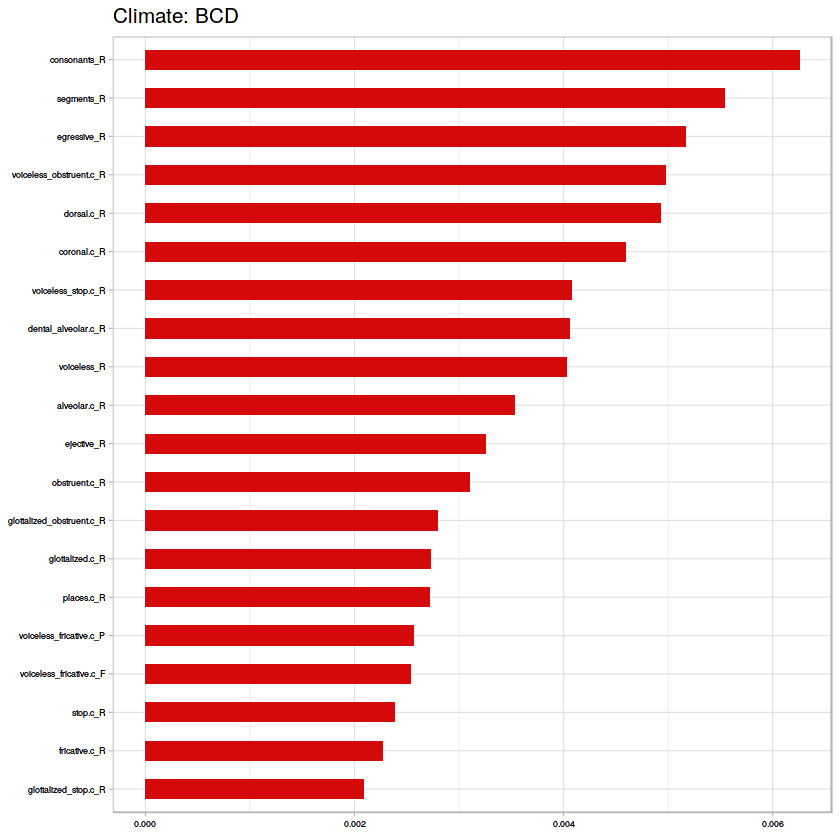

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.825806451612903
[1] "RF Confusion Matrix:"
   
      A   X
  A 106  25
  X   2  22


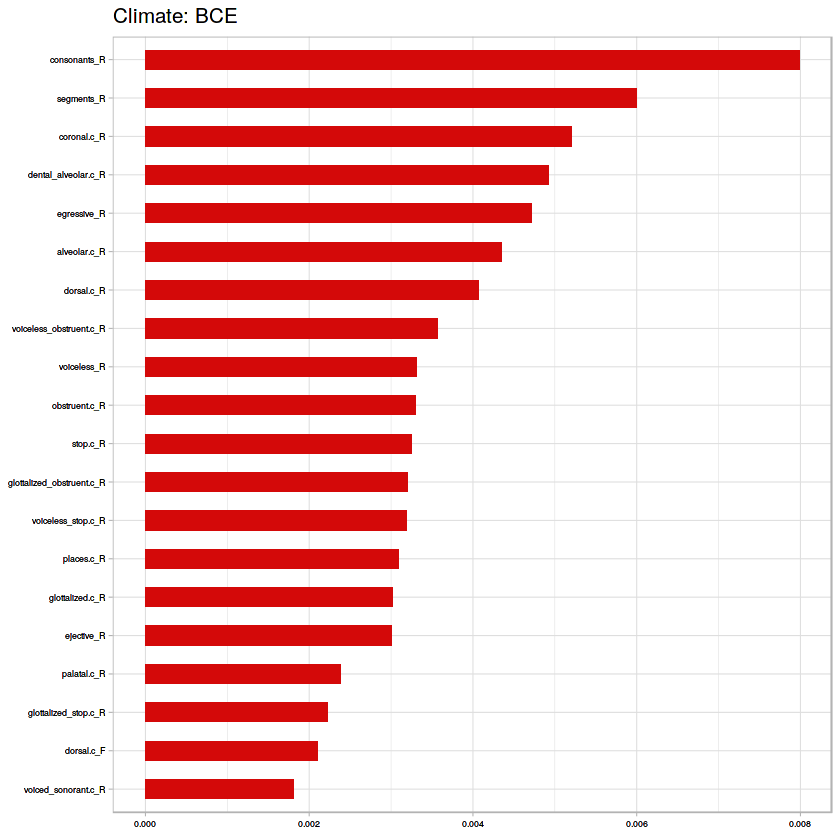

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.808383233532934
[1] "RF Confusion Matrix:"
   
      A   X
  A 103  27
  X   5  32


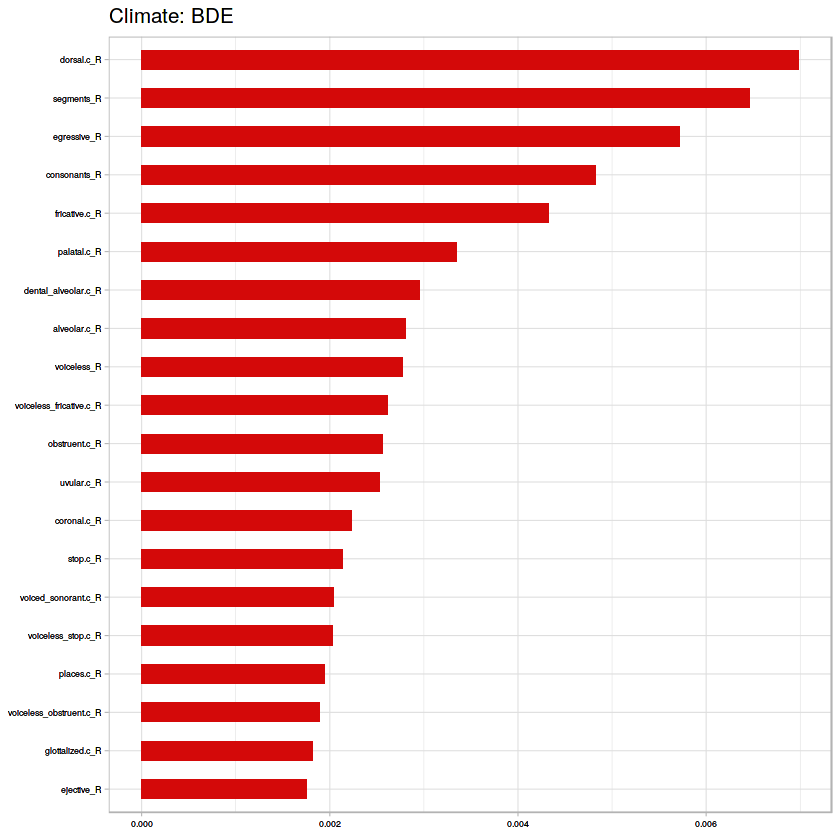

[1] "B" "C"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.781609195402299
[1] "RF Confusion Matrix:"
   
     A  X
  A 97 27
  X 11 39


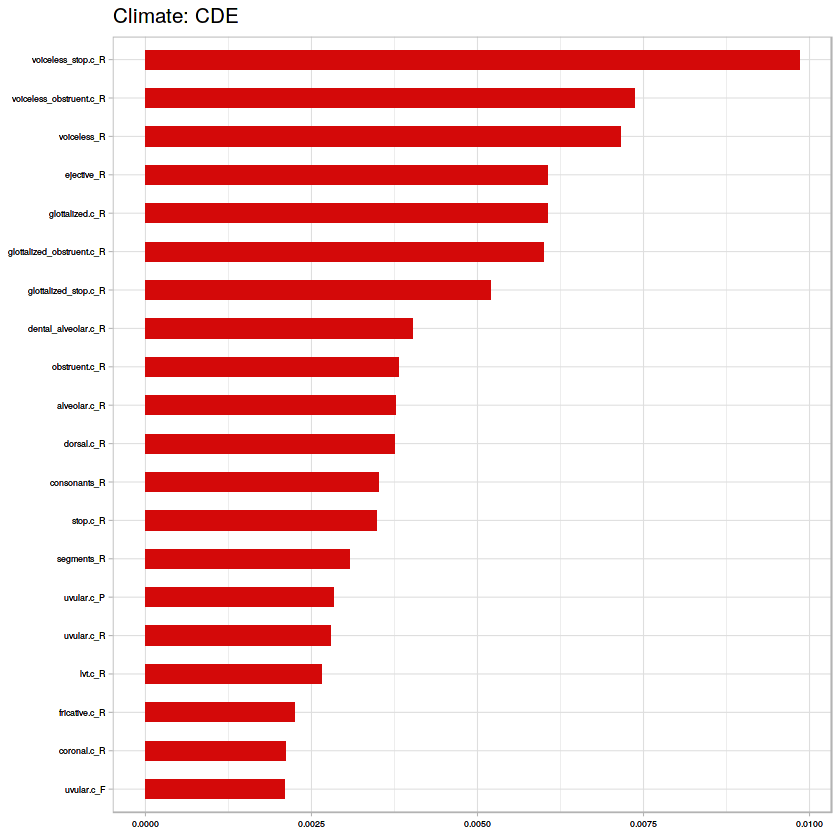

[1] "B" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.814569536423841
[1] "RF Confusion Matrix:"
   
      A   X
  A 107  27
  X   1  16


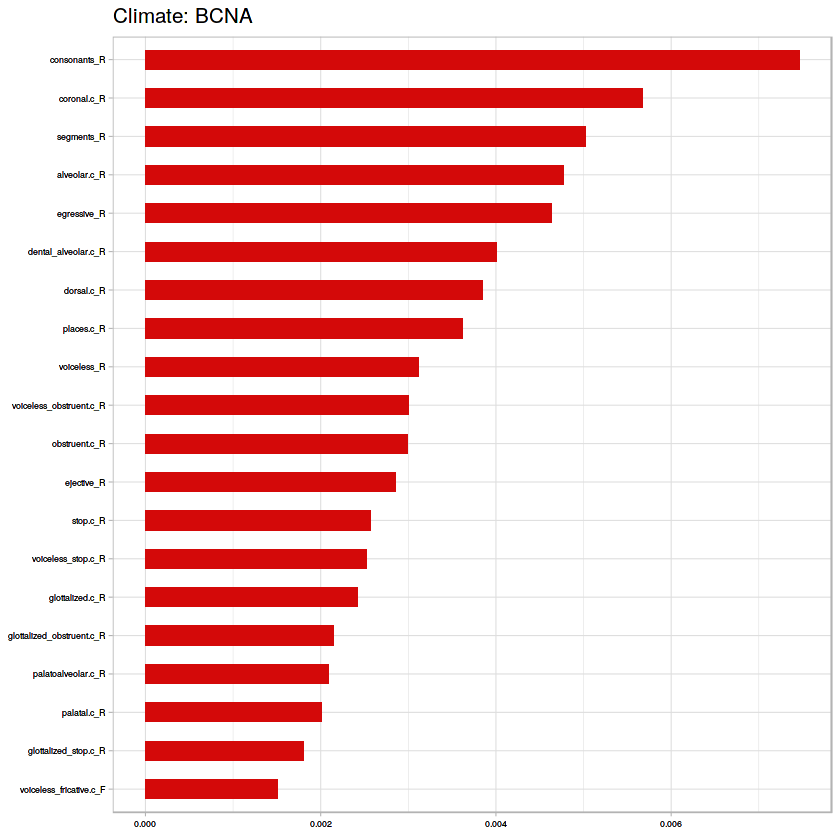

[1] "B" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.805755395683453
[1] "RF Confusion Matrix:"
   
      A   X
  A 108  27
  X   0   4


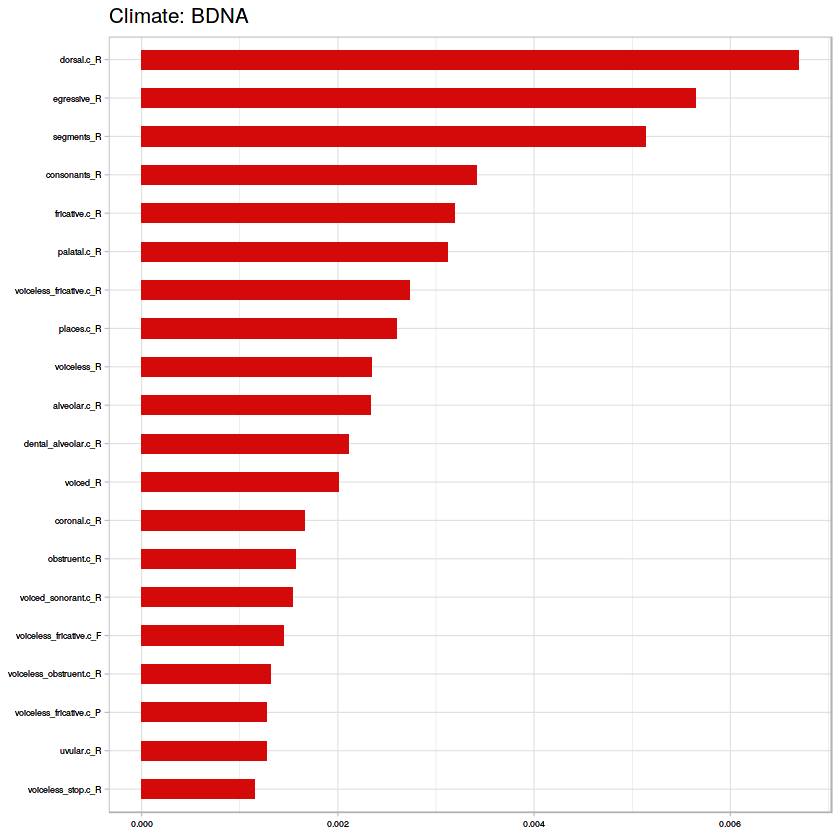

[1] "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.809815950920245
[1] "RF Confusion Matrix:"
   
      A   X
  A 104  27
  X   4  28


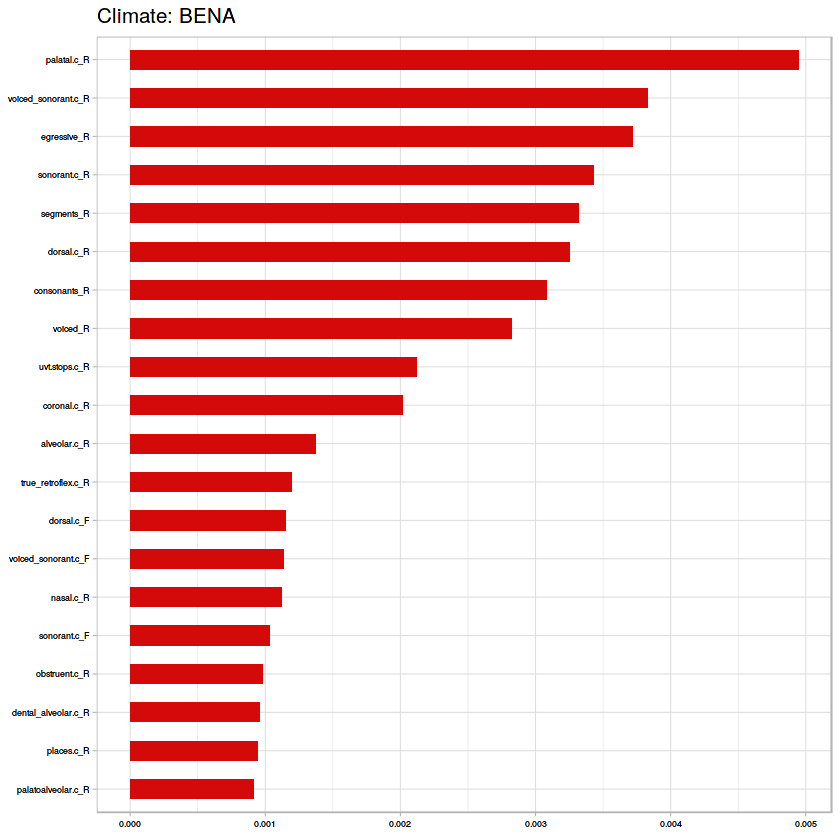

[1] "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.834437086092715
[1] "RF Confusion Matrix:"
   
      A   X
  A 105  22
  X   3  21
[1] "D" "E"
[1] "Dummy Classifier"


ERROR: Error in model@fit(data, ...): error code 1 from Lapack routine 'dgesdd'


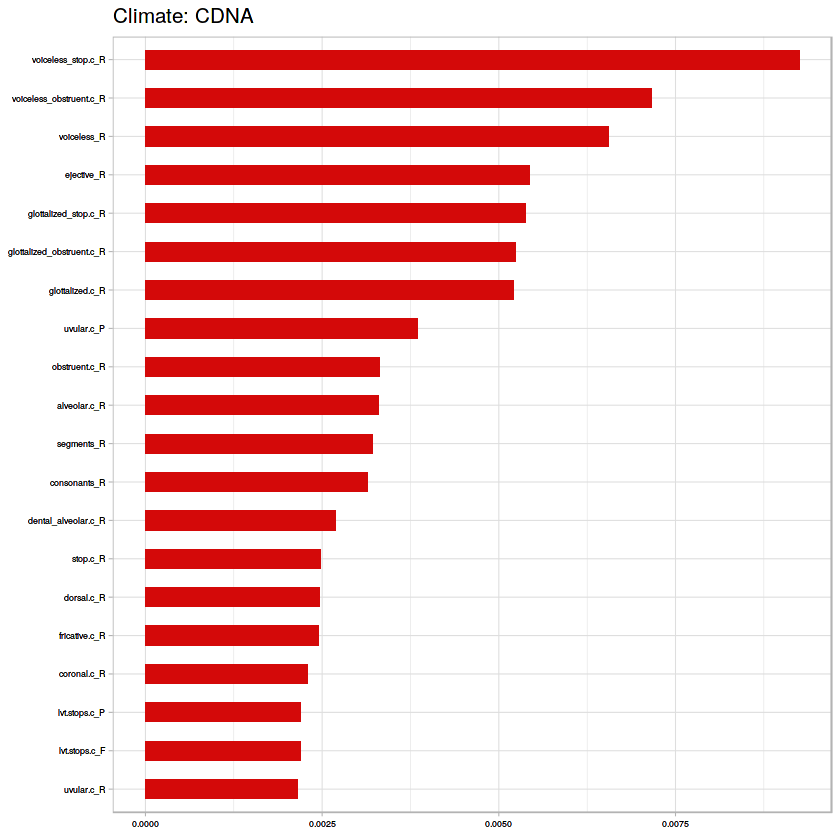

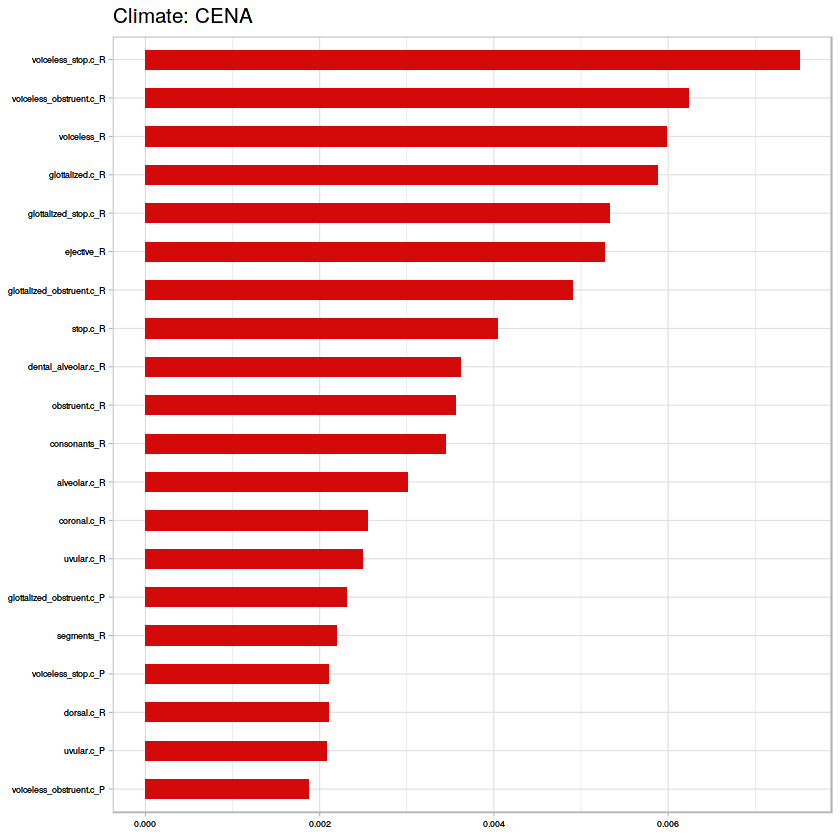

In [206]:
bin_tropvs(f_df)

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.780748663101604
[1] "RF Confusion Matrix:"
   
     A  X
  A 97 30
  X 11 49
[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.761111111111111
[1] "RF Confusion Matrix:"
   
      A   X
  A 100  35
  X   8  37


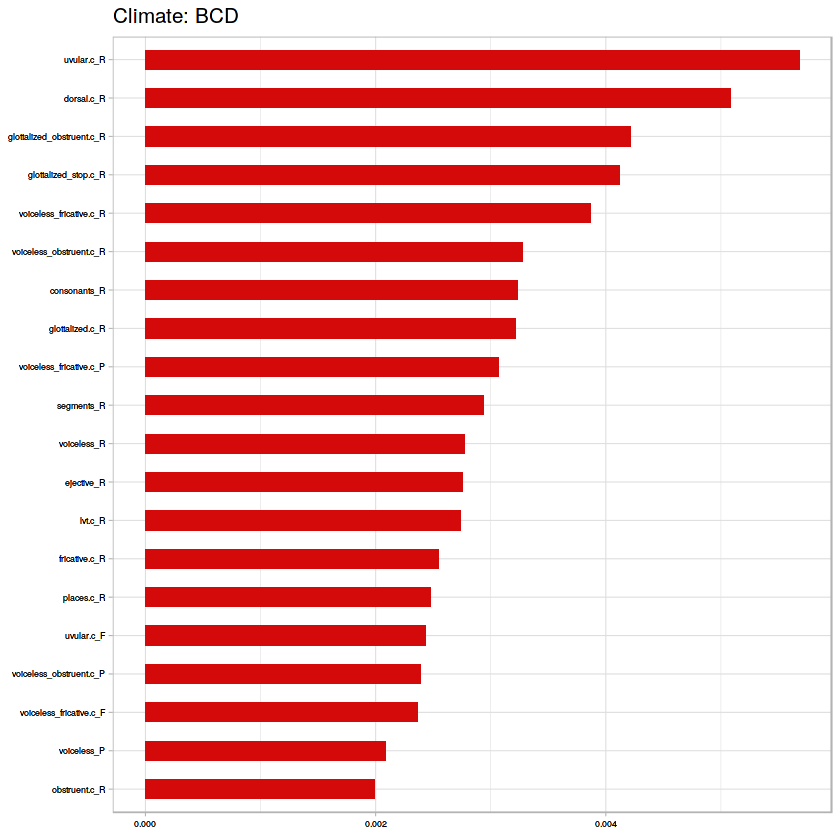

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.80379746835443
[1] "RF Confusion Matrix:"
   
      A   X
  A 106  29
  X   2  21


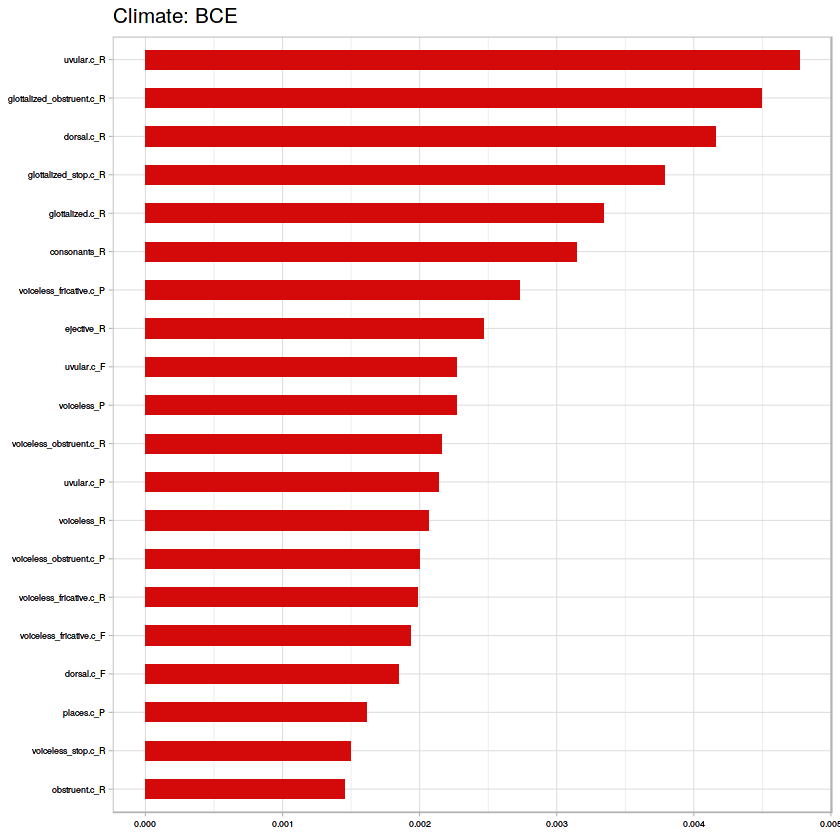

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.806060606060606
[1] "RF Confusion Matrix:"
   
      A   X
  A 104  28
  X   4  29


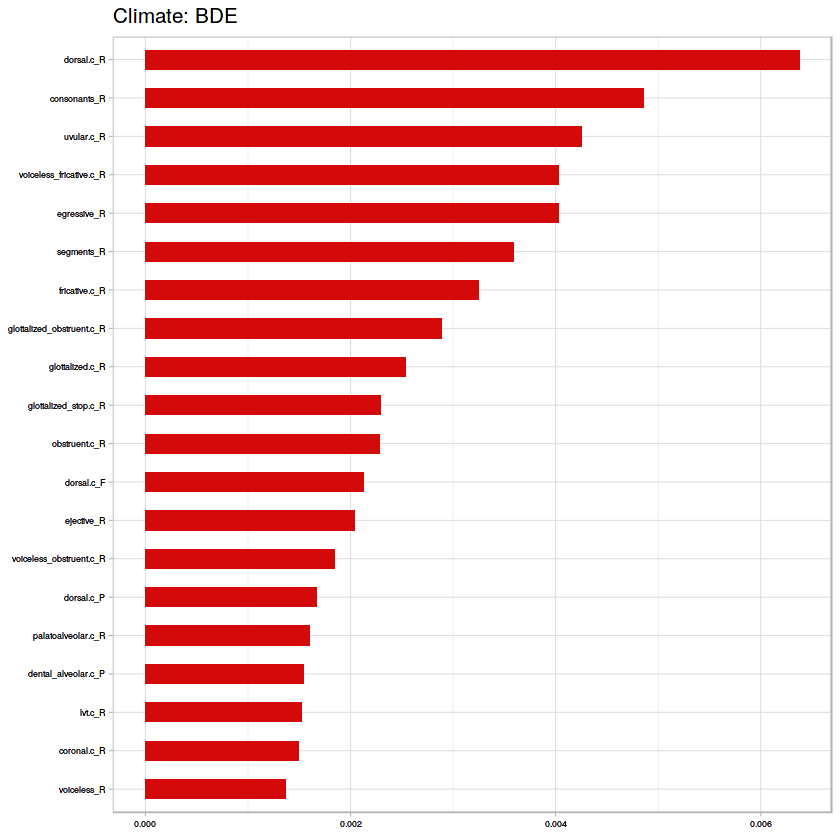

[1] "B" "C"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.763005780346821
[1] "RF Confusion Matrix:"
   
      A   X
  A 100  33
  X   8  32


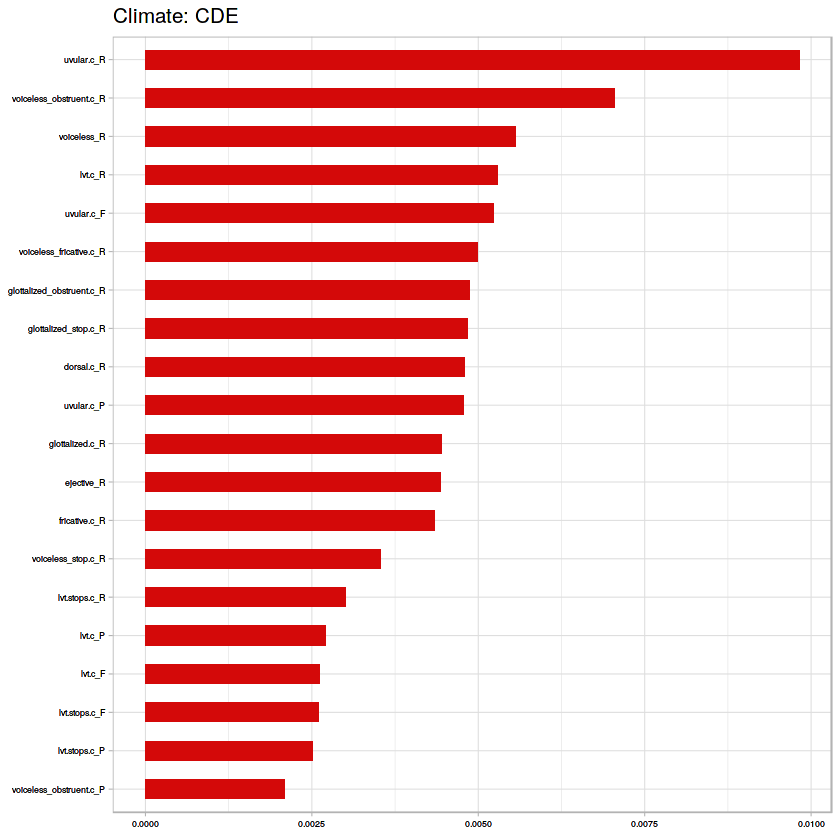

[1] "B" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.80794701986755
[1] "RF Confusion Matrix:"
   
      A   X
  A 107  28
  X   1  15


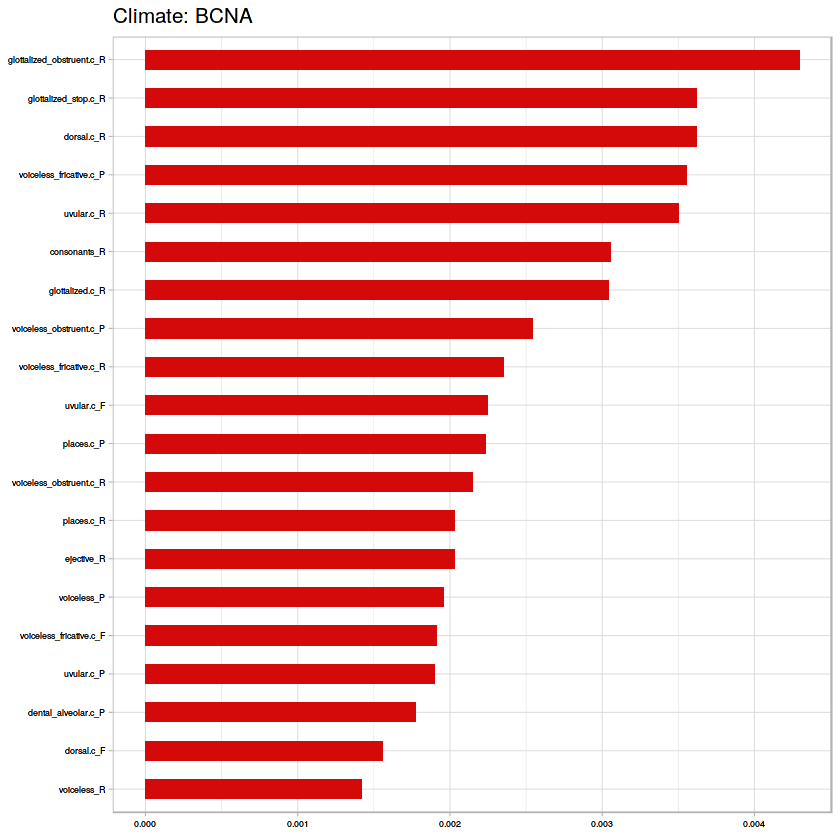

[1] "B" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.8125
[1] "RF Confusion Matrix:"
   
      A   X
  A 107  26
  X   1  10


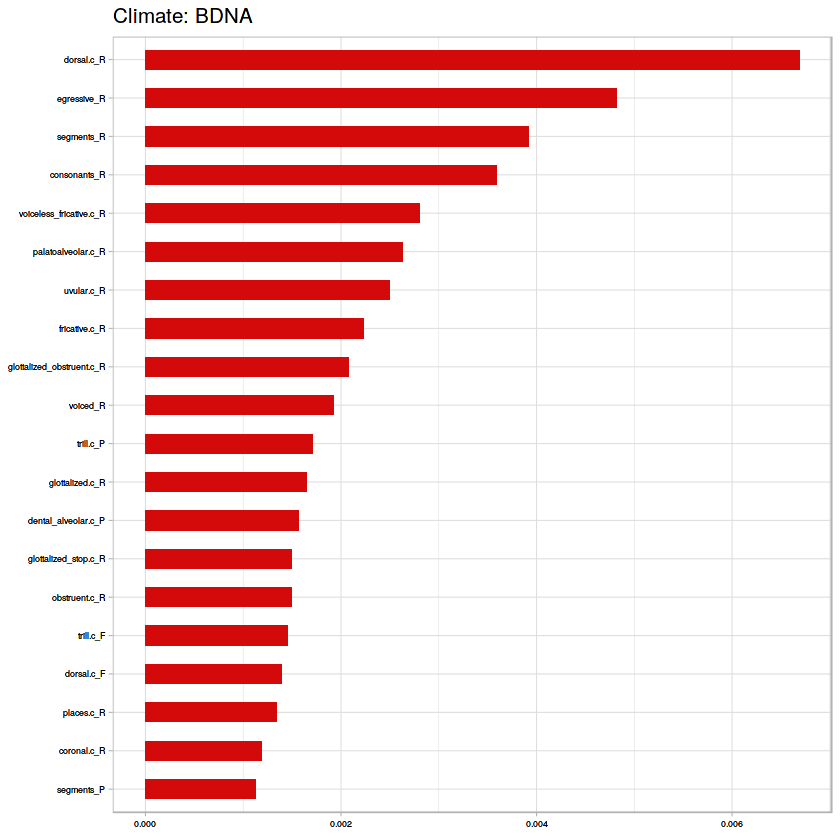

[1] "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.810126582278481
[1] "RF Confusion Matrix:"
   
      A   X
  A 104  26
  X   4  24


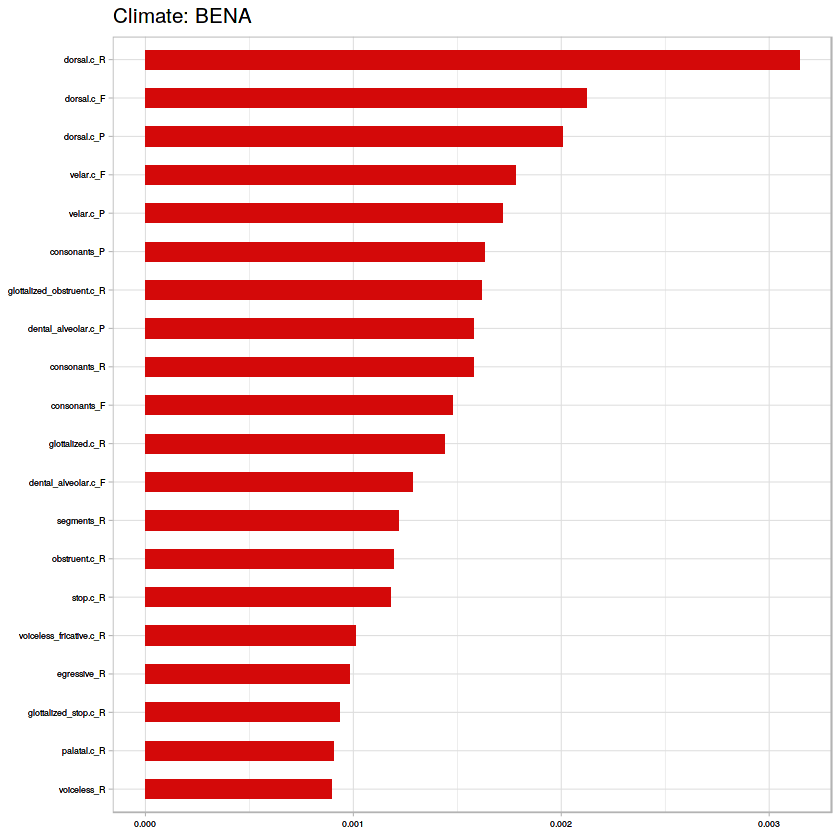

[1] "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.834437086092715
[1] "RF Confusion Matrix:"
   
      A   X
  A 108  25
  X   0  18


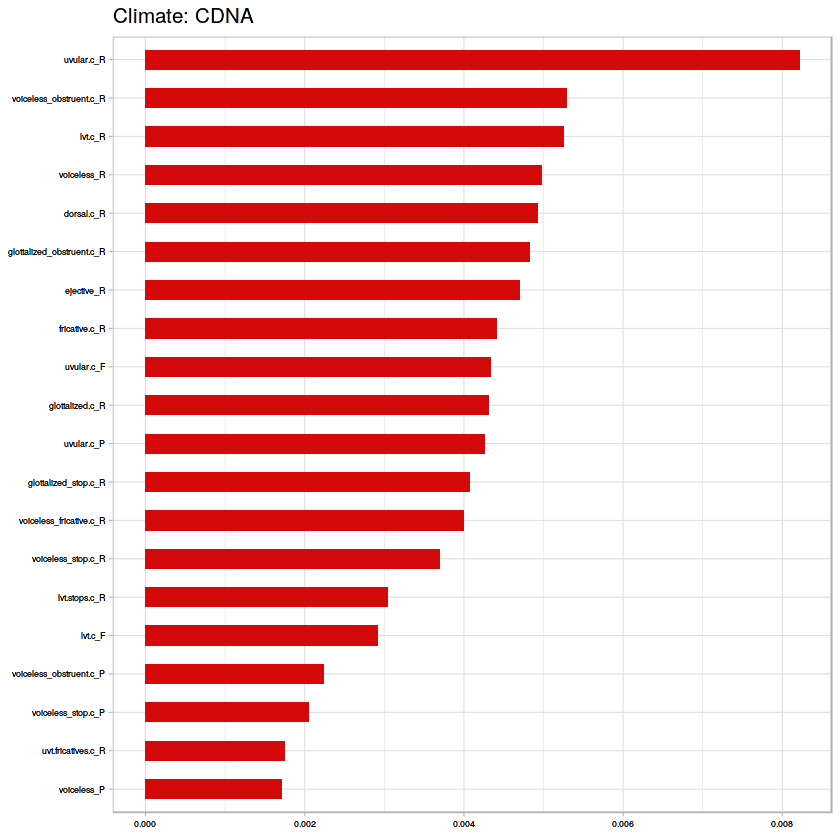

[1] "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.891472868217054
[1] "RF Confusion Matrix:"
   
      A   X
  A 108  14
  X   0   7


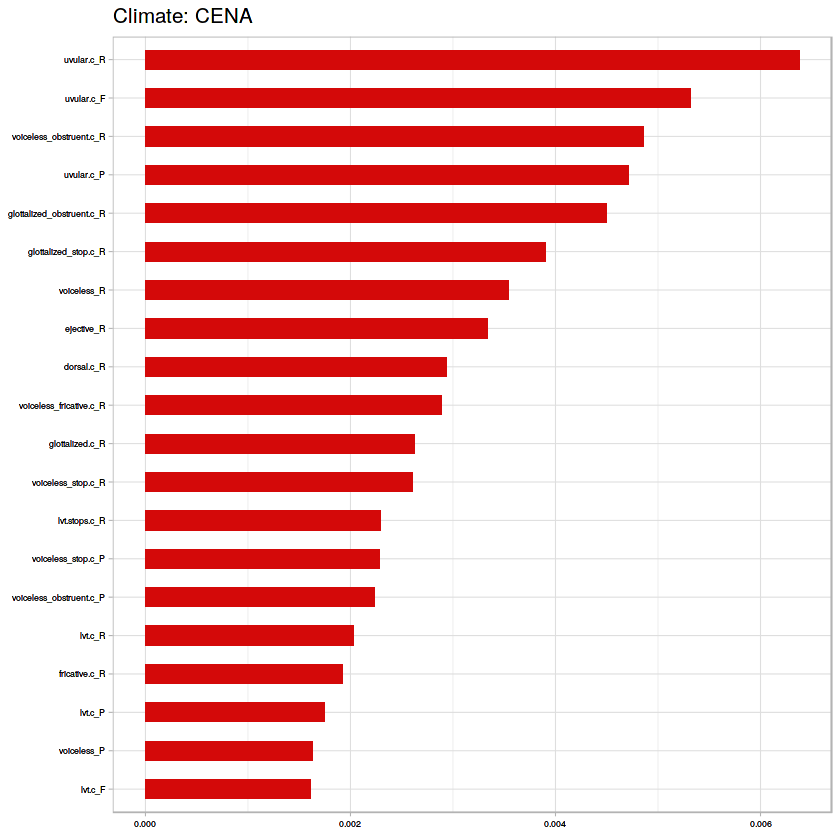

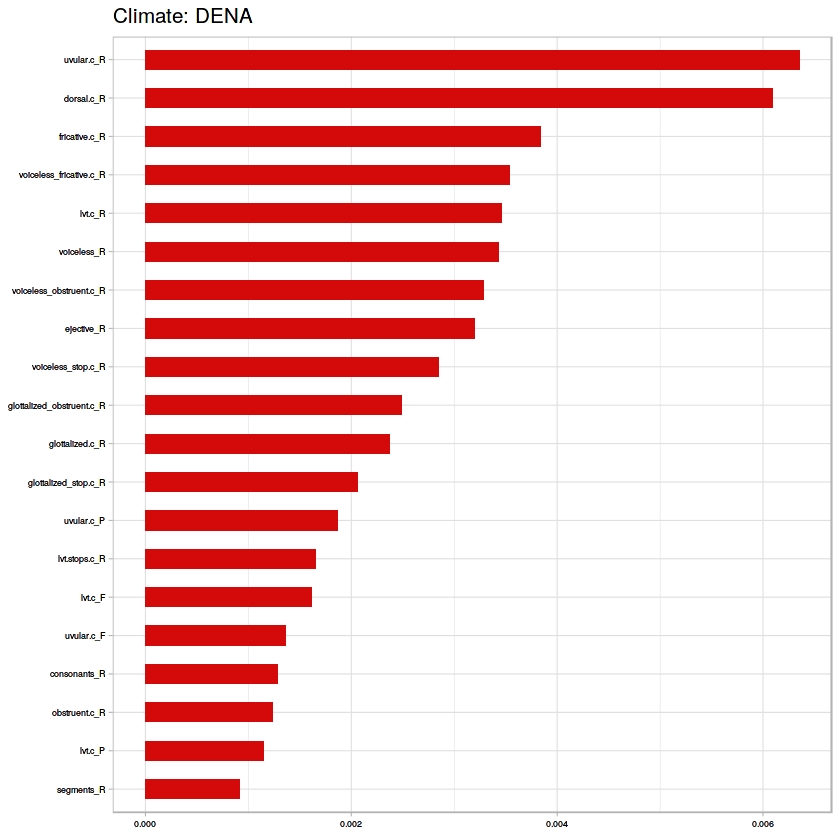

In [201]:
# Strat Language Family Run 3
bin_tropvs(f_df)

In [204]:
f_df[sapply(f_df, is.character)] <- lapply(f_df[sapply(f_df, is.character)], as.factor)

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.812834224598931
[1] "RF Confusion Matrix:"
   
     A  X
  A 93 23
  X 12 59
[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.797752808988764
[1] "RF Confusion Matrix:"
   
     A  X
  A 95 26
  X 10 47


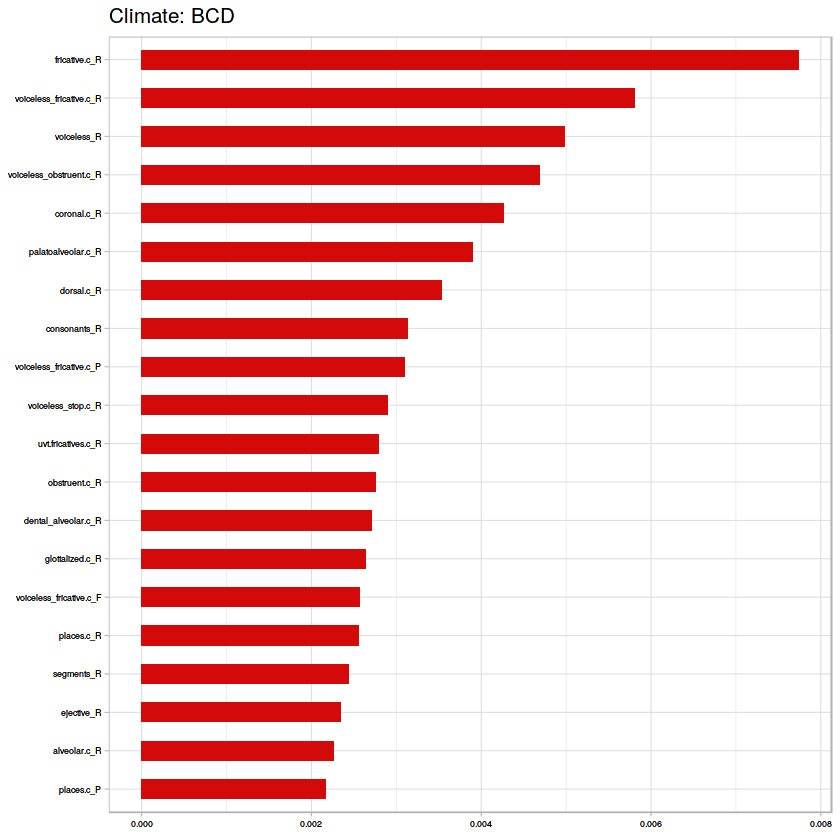

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.825806451612903
[1] "RF Confusion Matrix:"
   
      A   X
  A 101  23
  X   4  27


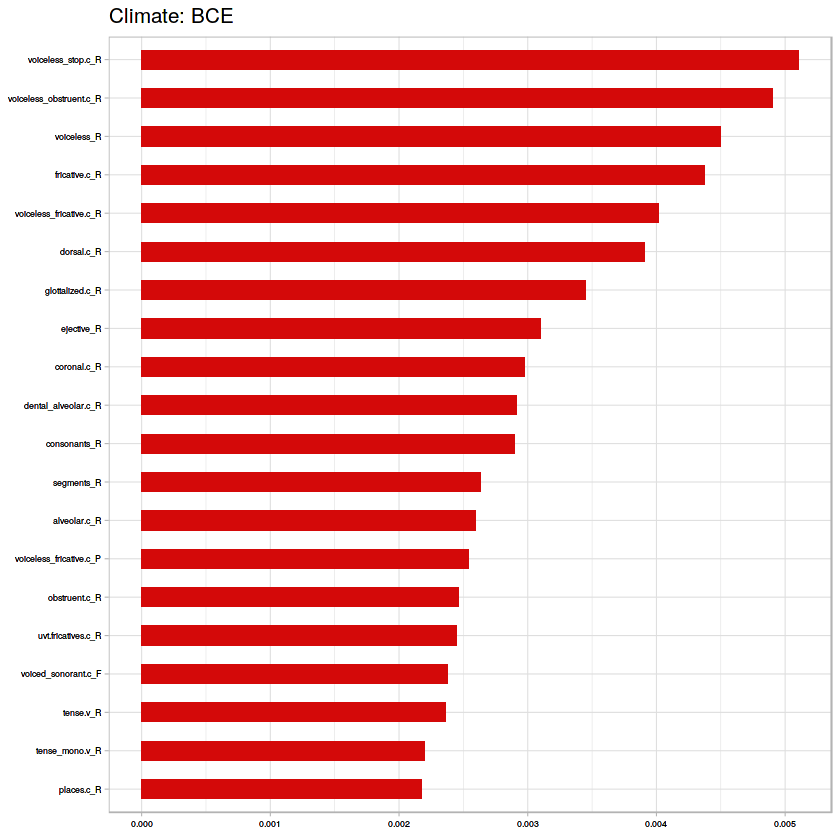

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.802395209580838
[1] "RF Confusion Matrix:"
   
     A  X
  A 99 27
  X  6 35


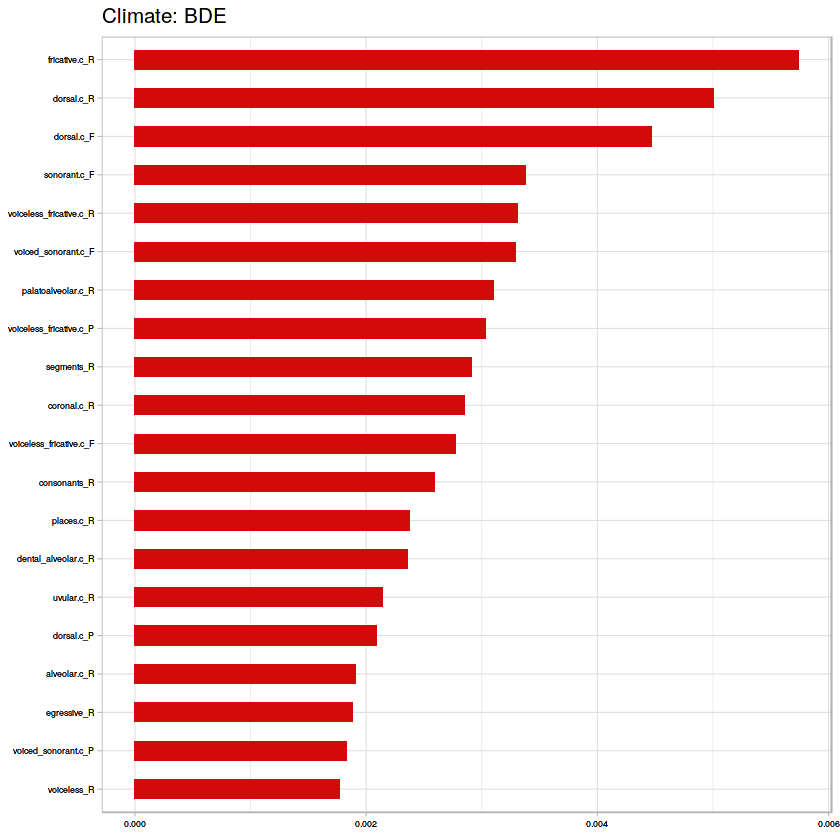

[1] "B" "C"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.812865497076023
[1] "RF Confusion Matrix:"
   
     A  X
  A 96 23
  X  9 43


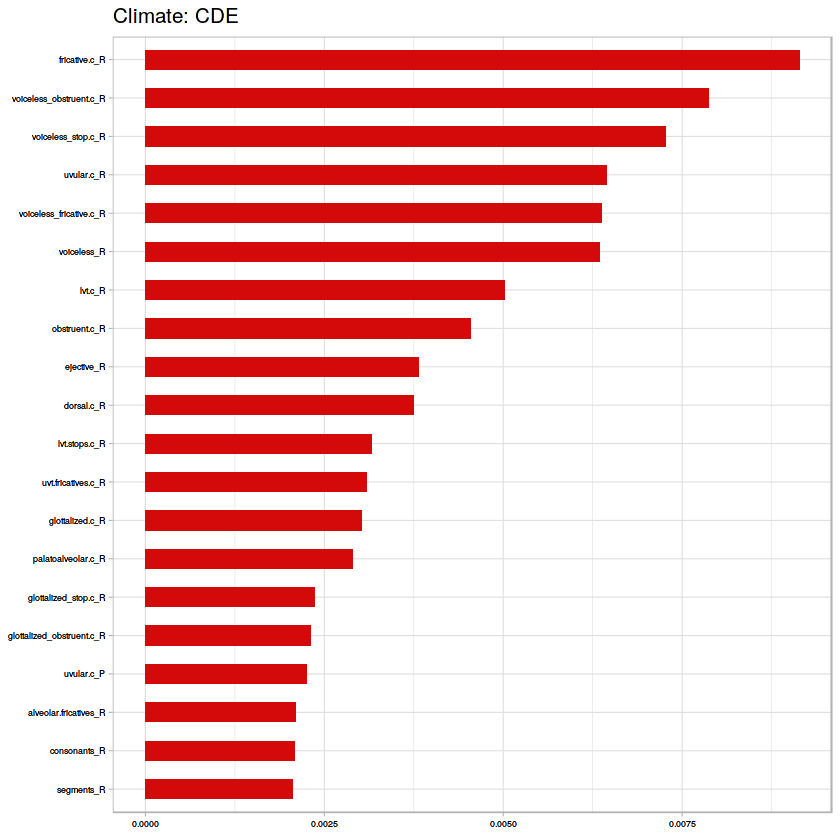

[1] "B" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.817567567567568
[1] "RF Confusion Matrix:"
   
      A   X
  A 103  25
  X   2  18


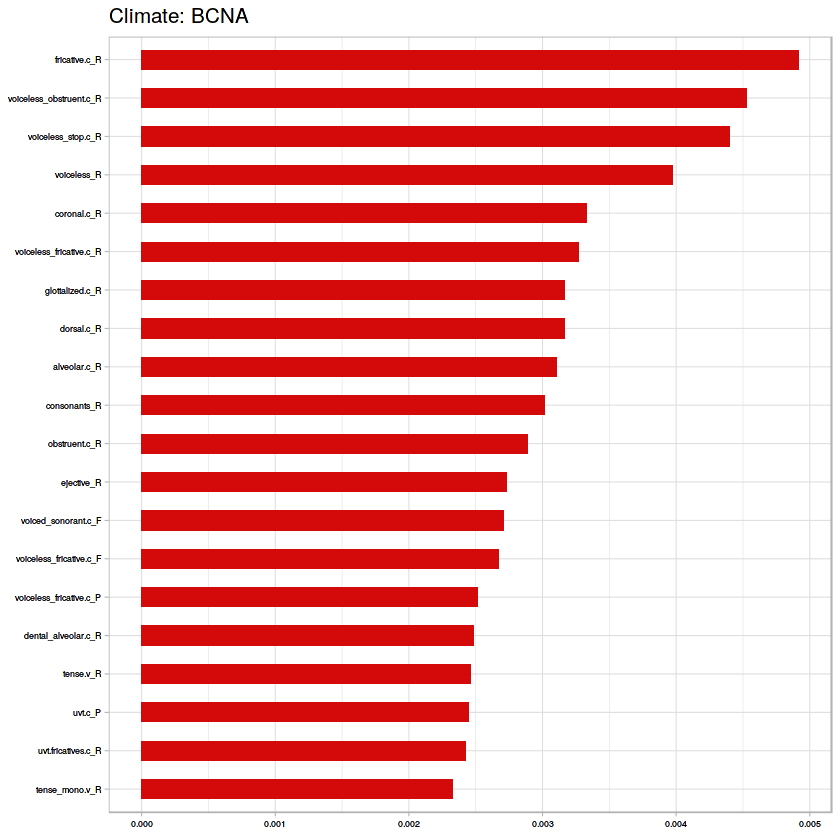

[1] "B" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.848920863309353
[1] "RF Confusion Matrix:"
   
      A   X
  A 103  19
  X   2  15


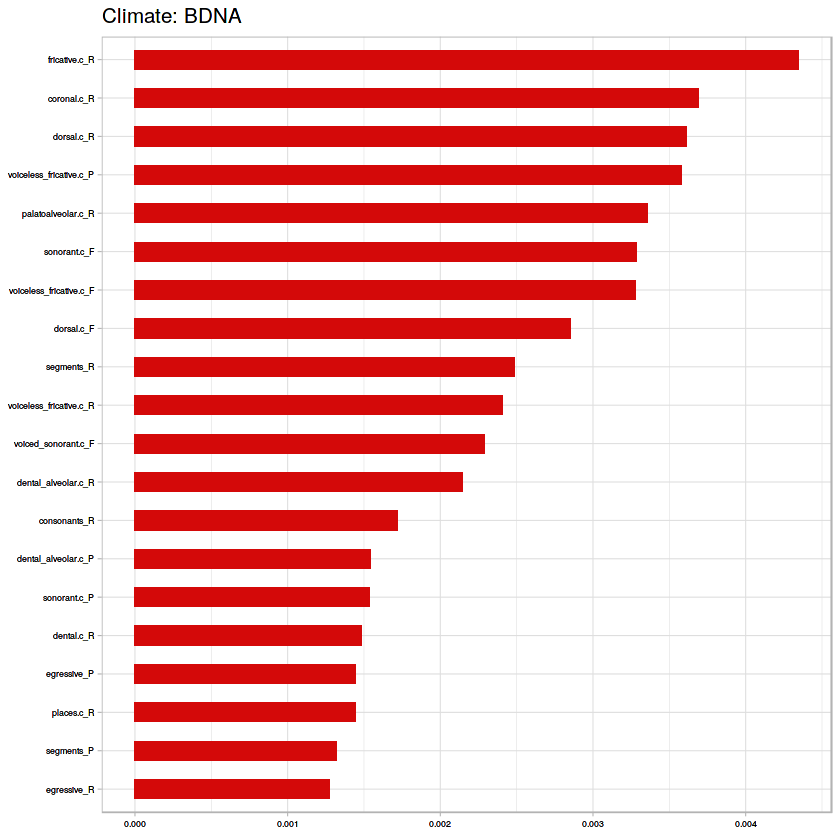

[1] "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.80625
[1] "RF Confusion Matrix:"
   
     A  X
  A 99 25
  X  6 30


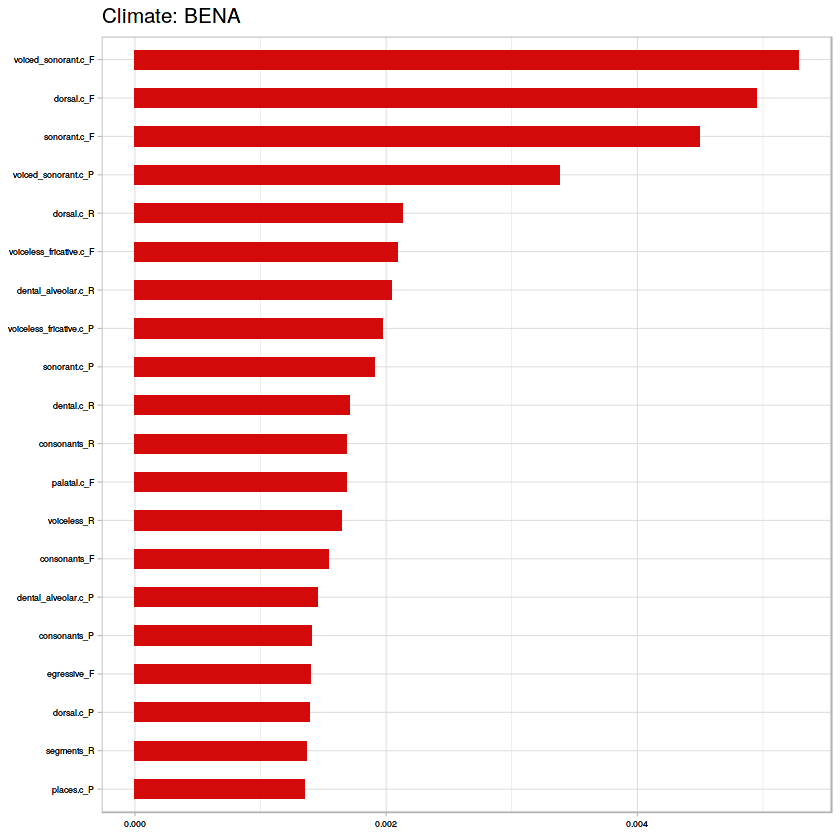

[1] "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.794701986754967
[1] "RF Confusion Matrix:"
   
      A   X
  A 100  26
  X   5  20


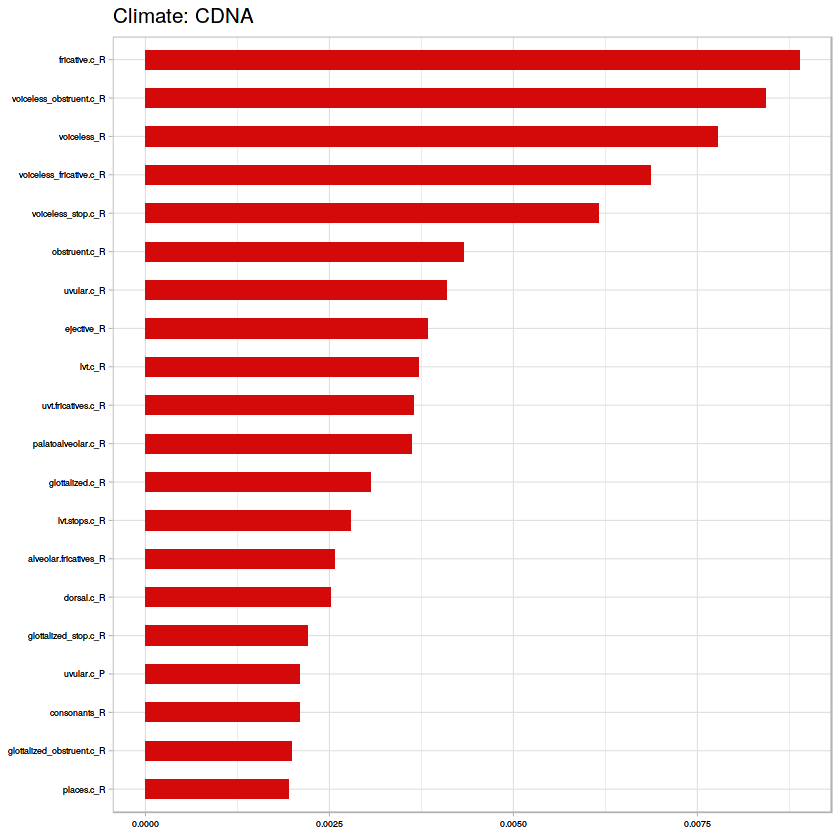

[1] "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.859375
[1] "RF Confusion Matrix:"
   
      A   X
  A 105  18
  X   0   5


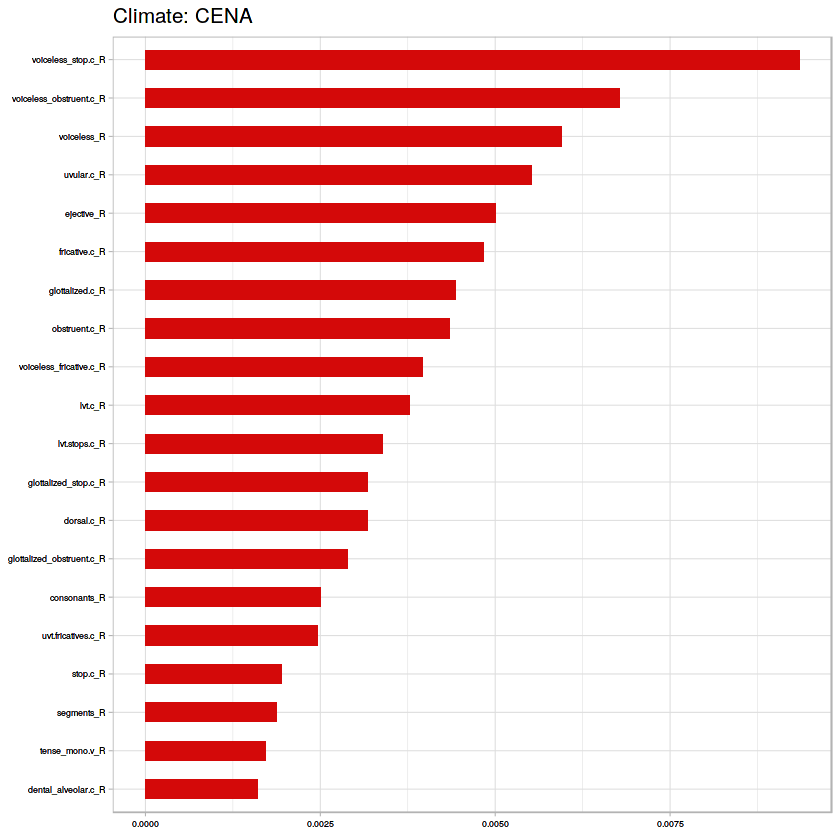

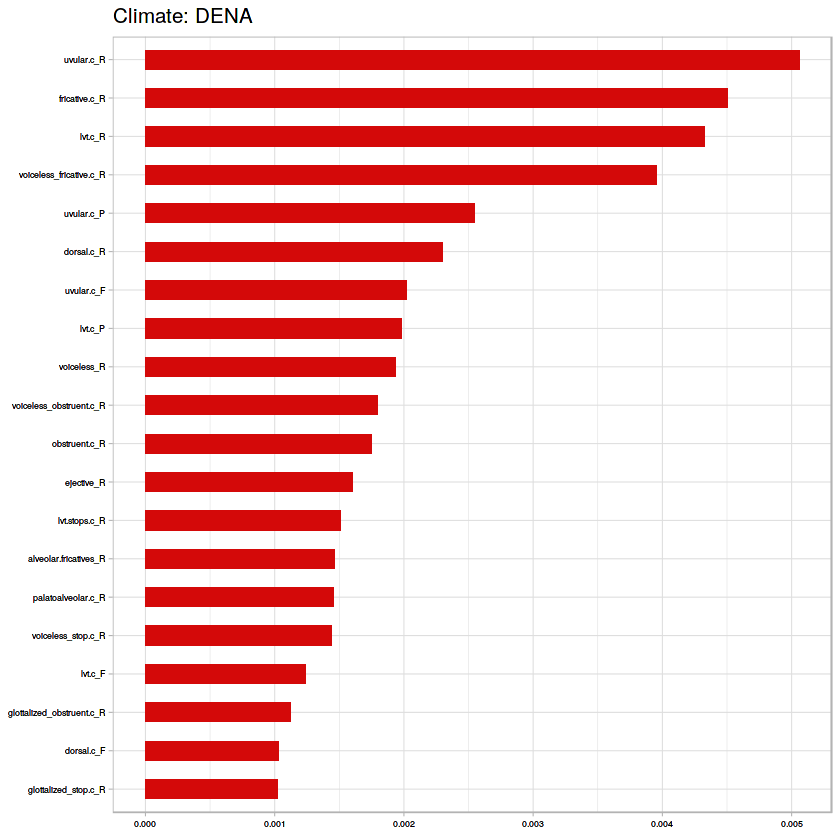

In [197]:
# Strat Language Family Run 1
bin_tropvs(f_df)

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.807486631016043
[1] "RF Confusion Matrix:"
   
     A  X
  A 97 28
  X  8 54
[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.828729281767956
[1] "RF Confusion Matrix:"
   
     A  X
  A 98 24
  X  7 52


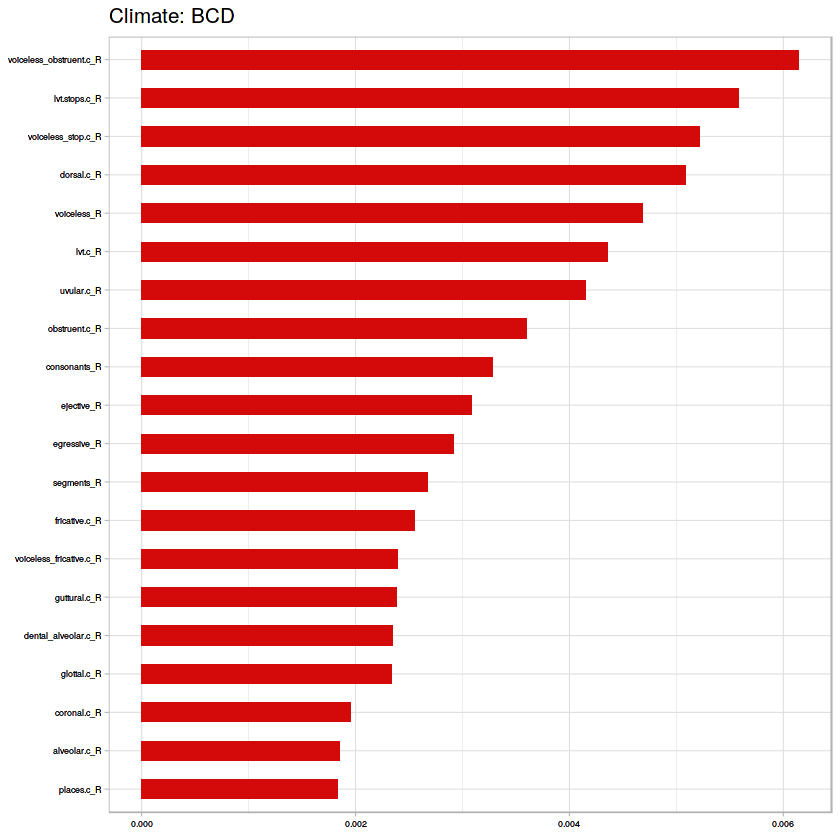

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.811688311688312
[1] "RF Confusion Matrix:"
   
      A   X
  A 101  25
  X   4  24


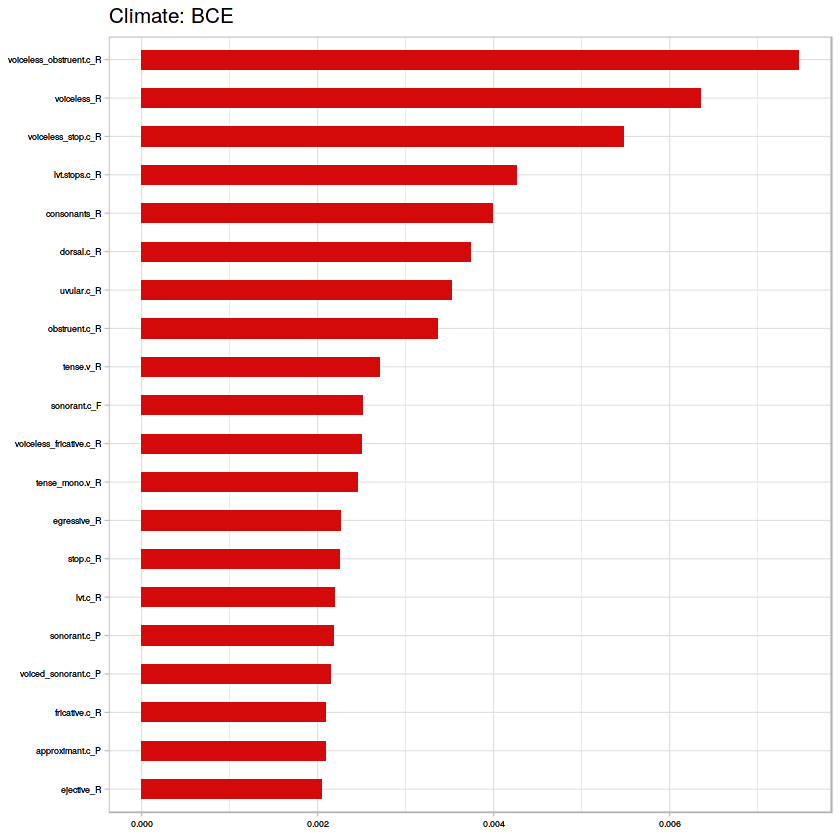

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.836363636363636
[1] "RF Confusion Matrix:"
   
      A   X
  A 102  24
  X   3  36


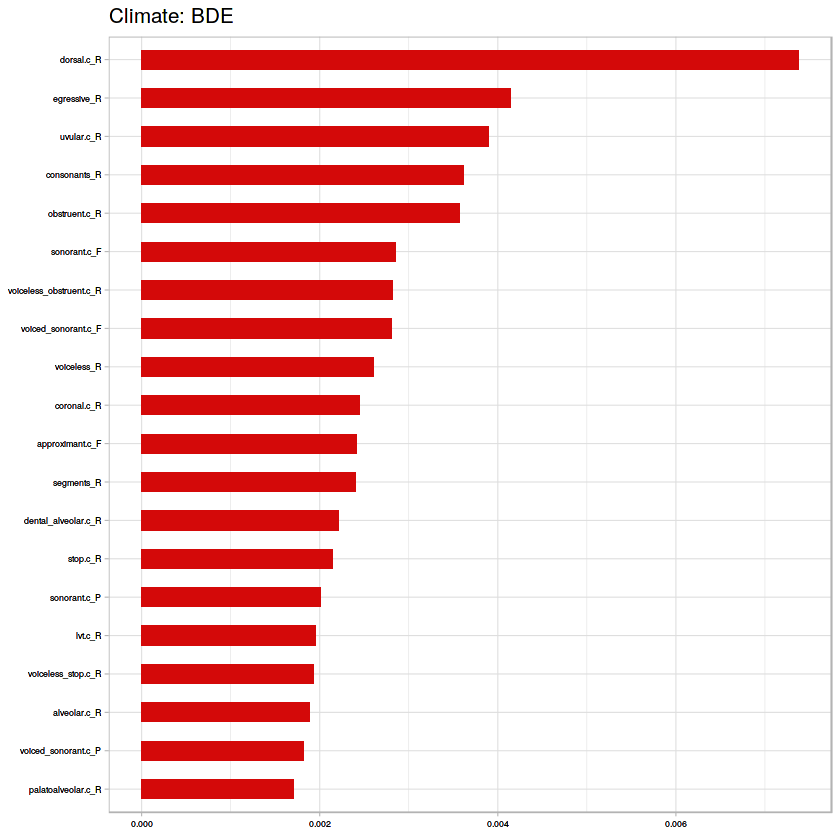

[1] "B" "C"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.810344827586207
[1] "RF Confusion Matrix:"
   
     A  X
  A 98 26
  X  7 43


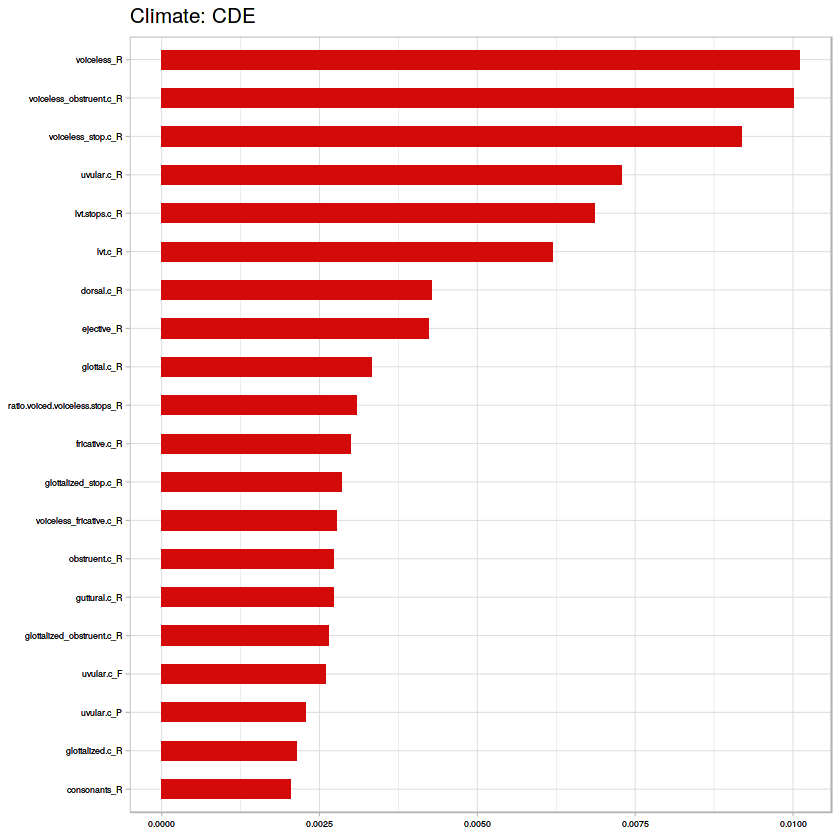

[1] "B" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.816326530612245
[1] "RF Confusion Matrix:"
   
      A   X
  A 103  25
  X   2  17


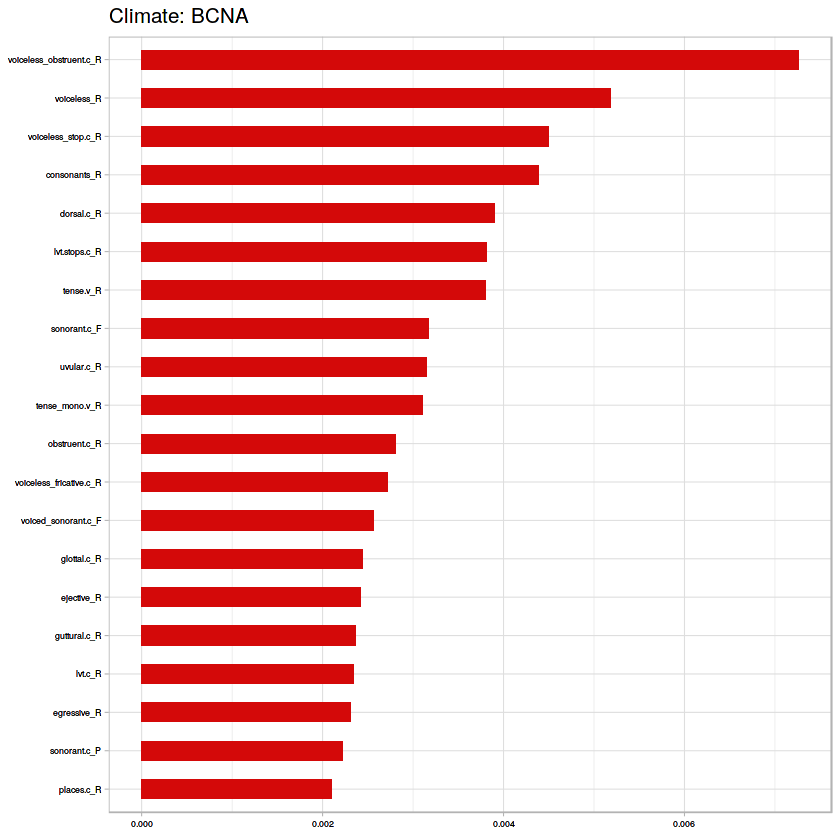

[1] "B" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.815602836879433
[1] "RF Confusion Matrix:"
   
      A   X
  A 103  24
  X   2  12


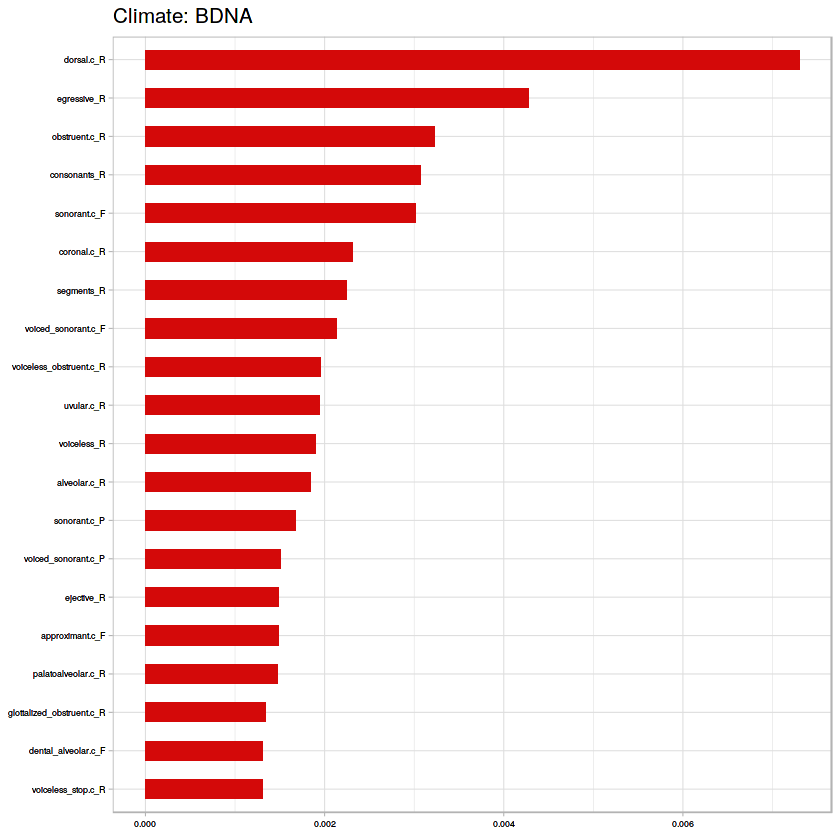

[1] "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.816455696202532
[1] "RF Confusion Matrix:"
   
      A   X
  A 102  26
  X   3  27


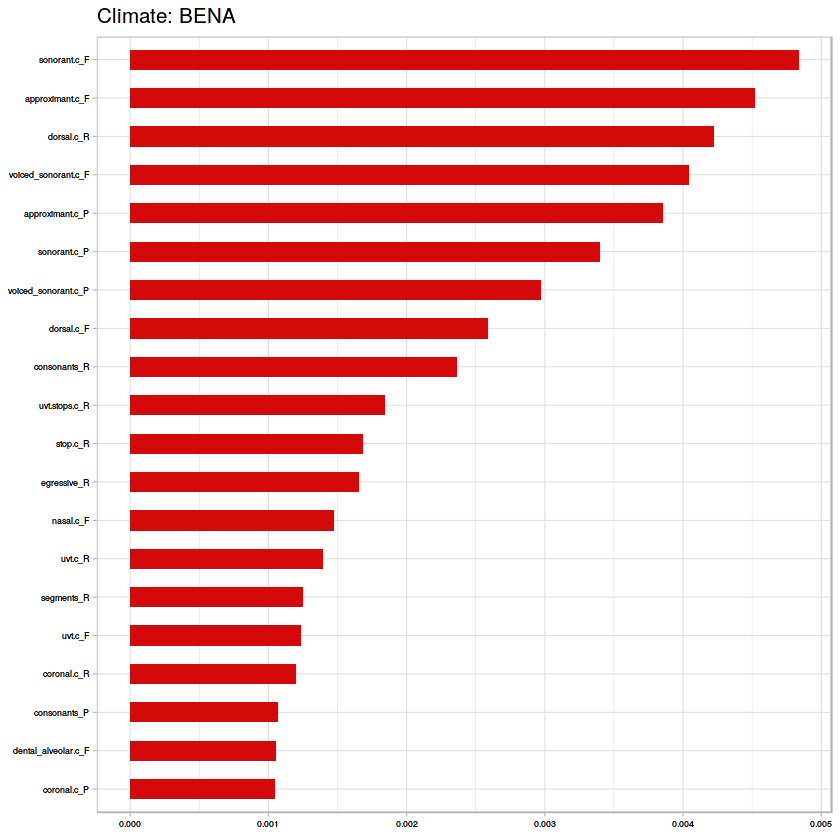

[1] "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.822368421052632
[1] "RF Confusion Matrix:"
   
      A   X
  A 103  25
  X   2  22


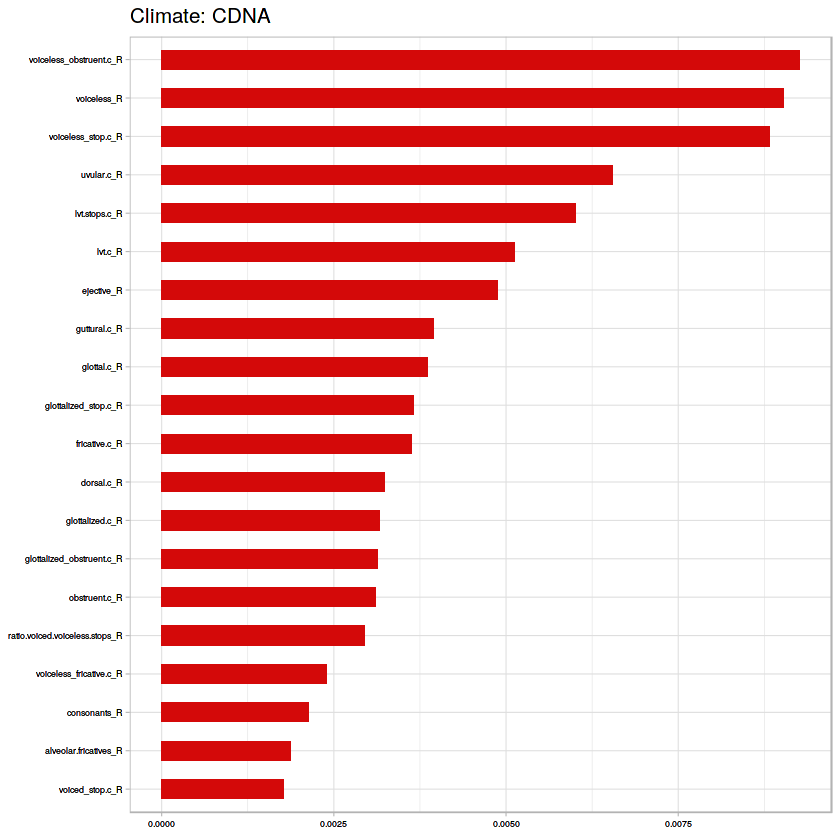

[1] "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.848
[1] "RF Confusion Matrix:"
   
      A   X
  A 105  19
  X   0   1


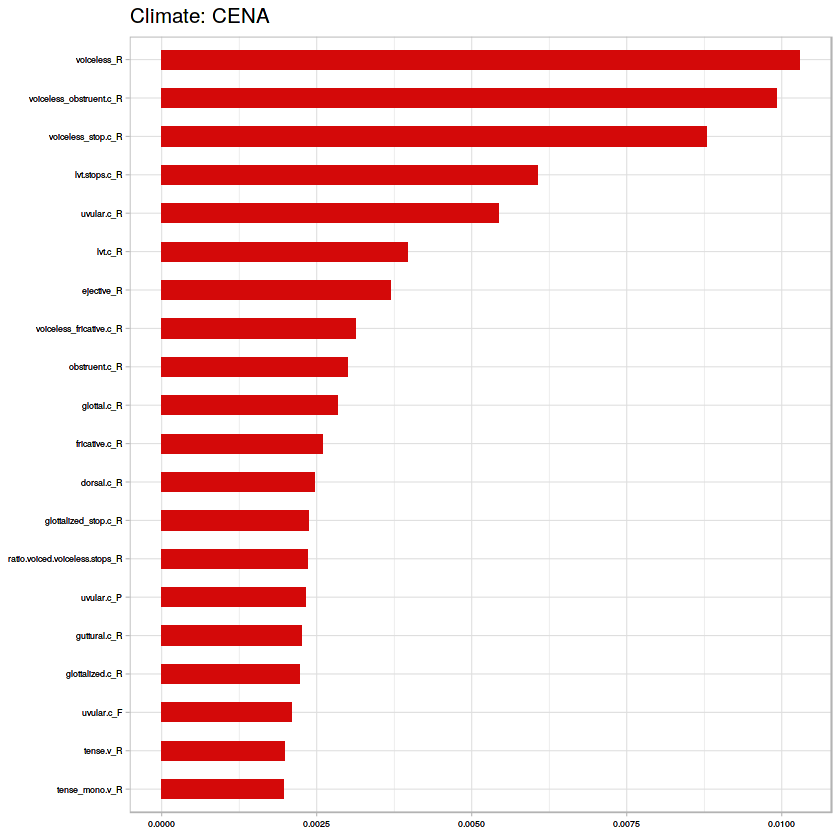

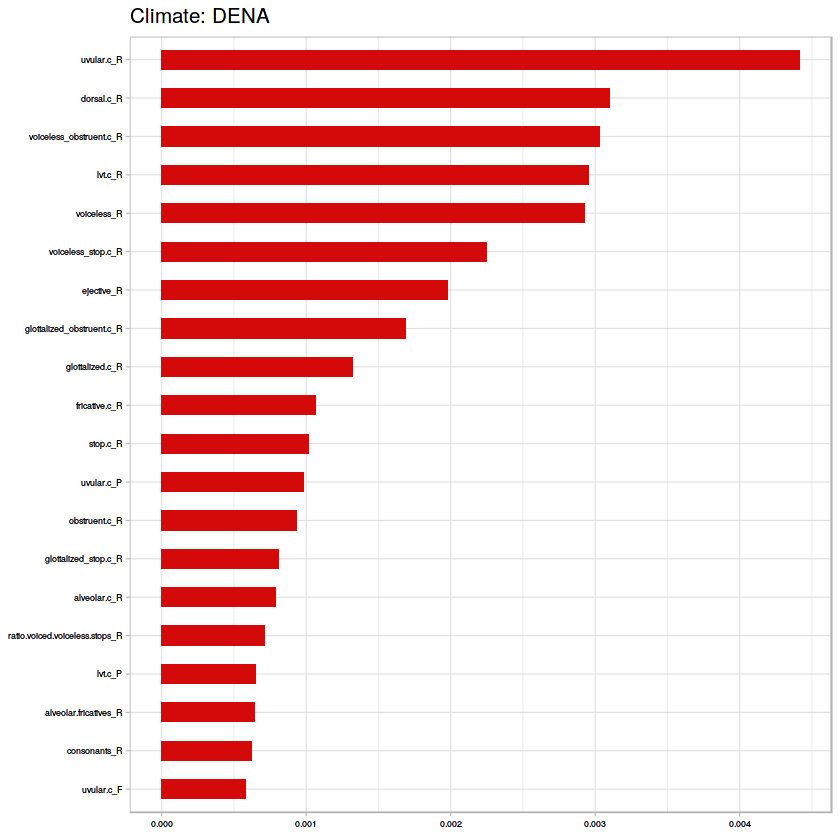

In [190]:
#Strat language family Run 2
bin_tropvs(f_df)

In [203]:
f_df<-f_df[3:ncol(f_df)]

In [202]:
f_df<-stratified(df_fam, "family_id", 1)

In [5]:
df = read.csv("phon_clim.csv", header = TRUE, stringsAsFactors = FALSE)
df<-df[,c(3,15)]
m<-merge(df,dsf, all = FALSE)

In [84]:
#Dummy Classifier Auxilary function
#c is the class vector, v is the real data, and p is the probability distribution for each class
dummy_clas<- function(c,v,p){
rlist<-vector("list", 2000)
for (i in 1:2000){
    s<-sample(c, size = length(v), prob = p, replace = TRUE)
    score <- count_sim_list(v,s)/length(v)
    rlist[[i]] <- score
    }
rlist<-as.numeric(rlist)
print(mean(rlist))
}

#Dummy Classifier for Multi-Class RF
class<-c('A','B','C','D','E')
#vec <- data_mc$Climate
#print(paste0("Dummy classifier for Multi-class ",dummy_clas(class,vec,tg)))

In [34]:
#Aux Function - Climate Distribution
dist<-function(data){
tg<-table(data$Climate)/nrow(data)
return(tg)
}

In [57]:
#Axulilary function - Count similar element-wise between same length vectors
count_sim_list <- function(x,y){
count<-0
for (i in 1:length(x)){
        if (x[[i]] == y[[i]]){
             count<-count+1
        }
}
    return(count)
        }


[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] 0.5375
[1] 0.5375
[1] C-V accuracy for Random Forest is 0.826274509803922
[1] "RF Confusion Matrix:"
   
       A    X
  A 1527  346
  X   97  580
[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] 0.5566337
[1] 0.5566337
[1] C-V accuracy for Random Forest is 0.829218106995885
[1] "RF Confusion Matrix:"
   
       A    X
  A 1552  343
  X   72  463


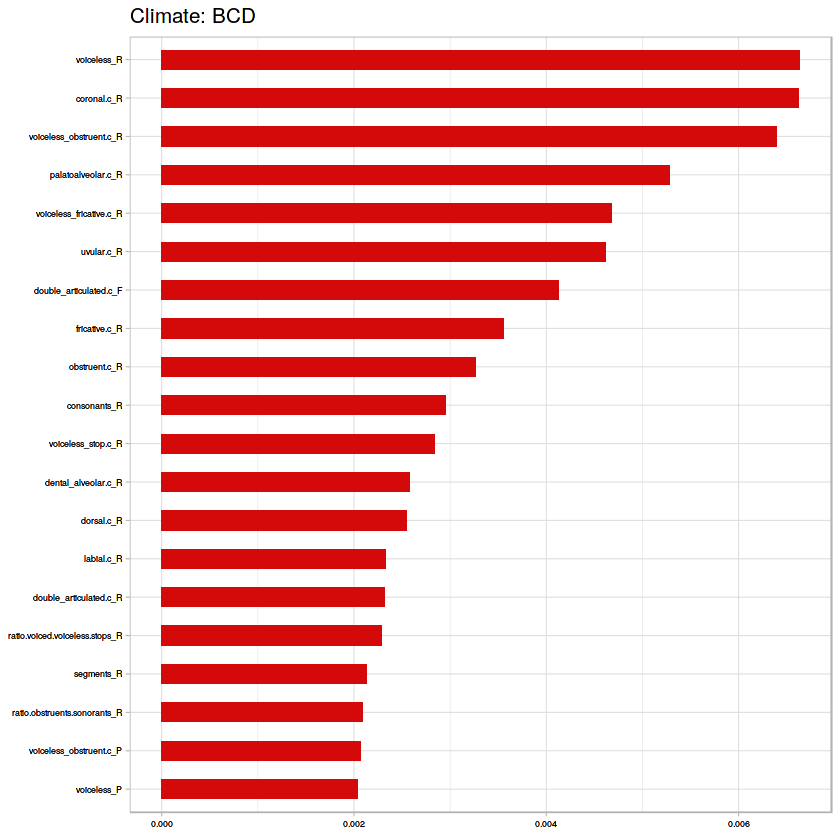

In [ ]:
bin_tropvs(m)

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] 0.5373629
[1] 0.5373629
[1] C-V accuracy for Random Forest is 0.824313725490196
[1] "RF Confusion Matrix:"
   
       A    X
  A 1528  352
  X   96  574
[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] 0.5565681
[1] 0.5565681
[1] C-V accuracy for Random Forest is 0.828395061728395
[1] "RF Confusion Matrix:"
   
       A    X
  A 1553  346
  X   71  460


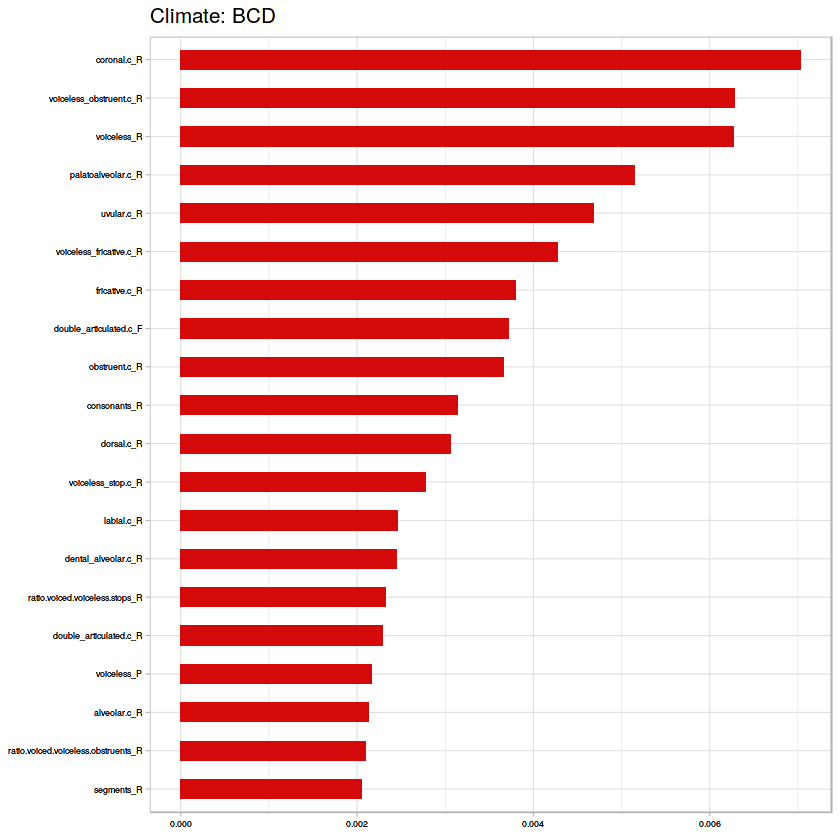

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] 0.6434055
[1] 0.6434055
[1] C-V accuracy for Random Forest is 0.882797731568998
[1] "RF Confusion Matrix:"
   
       A    X
  A 1608  232
  X   16  260


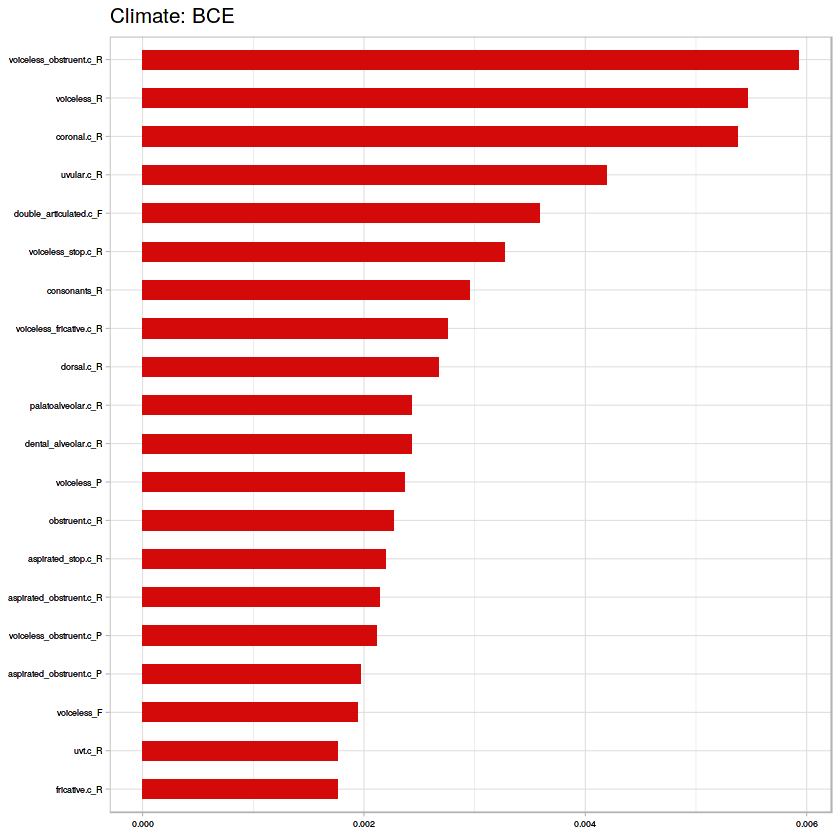

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] 0.5859608
[1] 0.5859608
[1] C-V accuracy for Random Forest is 0.84638816362054
[1] "RF Confusion Matrix:"
   
       A    X
  A 1569  298
  X   55  376


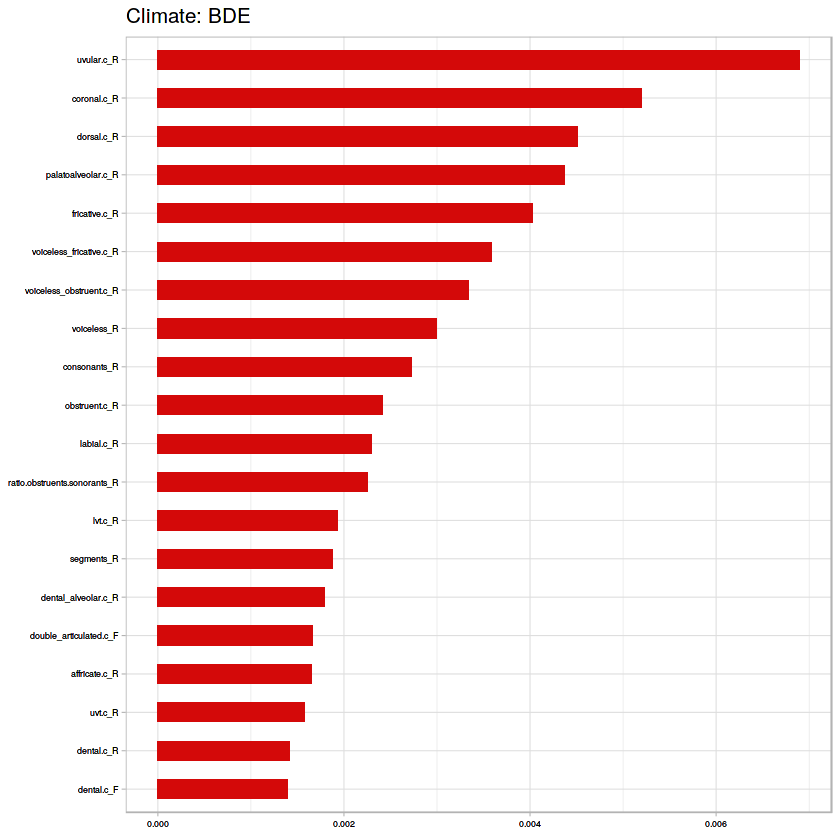

[1] "B" "C"
[1] "Dummy Classifier"
[1] 0.5643805
[1] 0.5643805
[1] C-V accuracy for Random Forest is 0.823430962343096
[1] "RF Confusion Matrix:"
   
       A    X
  A 1558  356
  X   66  410


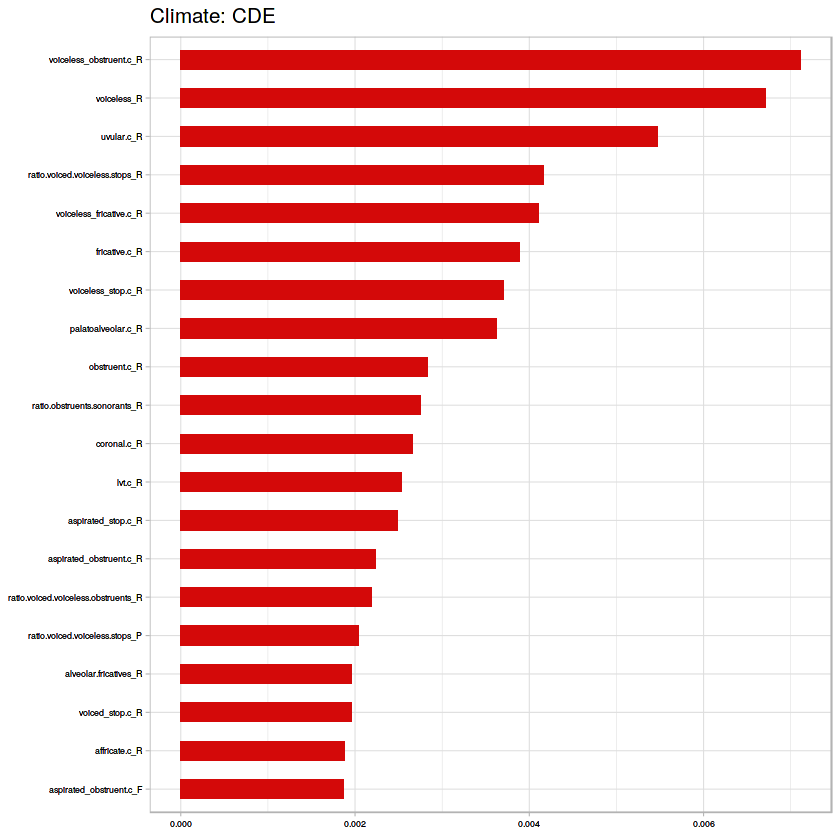

[1] "B" "D"
[1] "Dummy Classifier"
[1] 0.6595014
[1] 0.6595014
[1] C-V accuracy for Random Forest is 0.884393063583815
[1] "RF Confusion Matrix:"
   
       A    X
  A 1610  226
  X   14  226


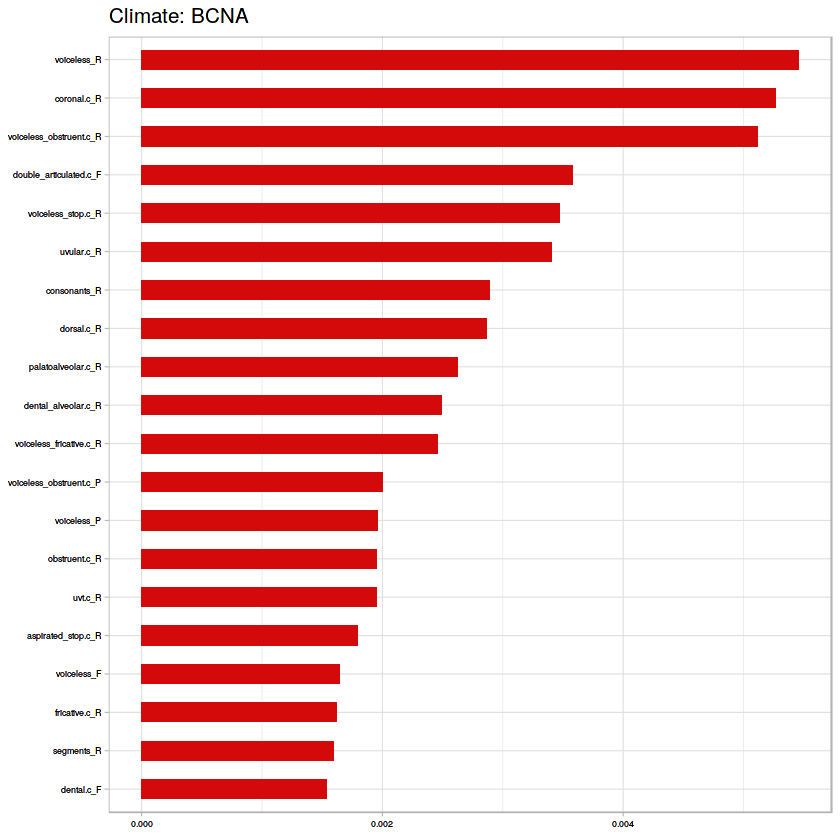

[1] "B" "E"
[1] "Dummy Classifier"
[1] 0.7184427
[1] 0.7184427
[1] C-V accuracy for Random Forest is 0.886503067484663
[1] "RF Confusion Matrix:"
   
       A    X
  A 1614  212
  X   10  120


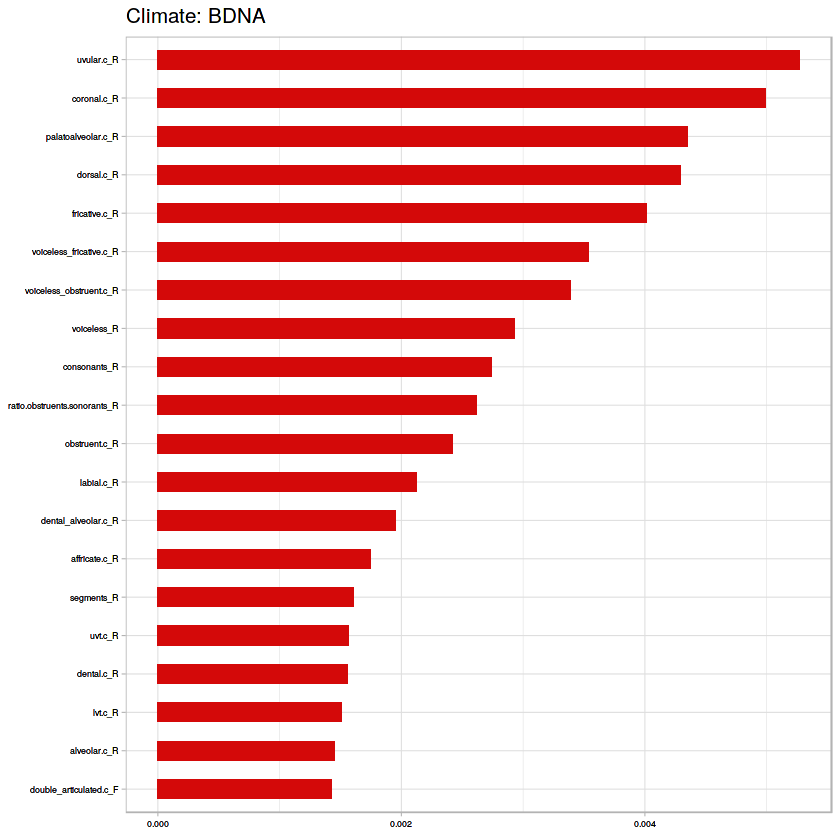

[1] "C" "D"
[1] "Dummy Classifier"
[1] 0.5964223
[1] 0.5964223
[1] C-V accuracy for Random Forest is 0.848095659875996
[1] "RF Confusion Matrix:"
   
       A    X
  A 1587  306
  X   37  328


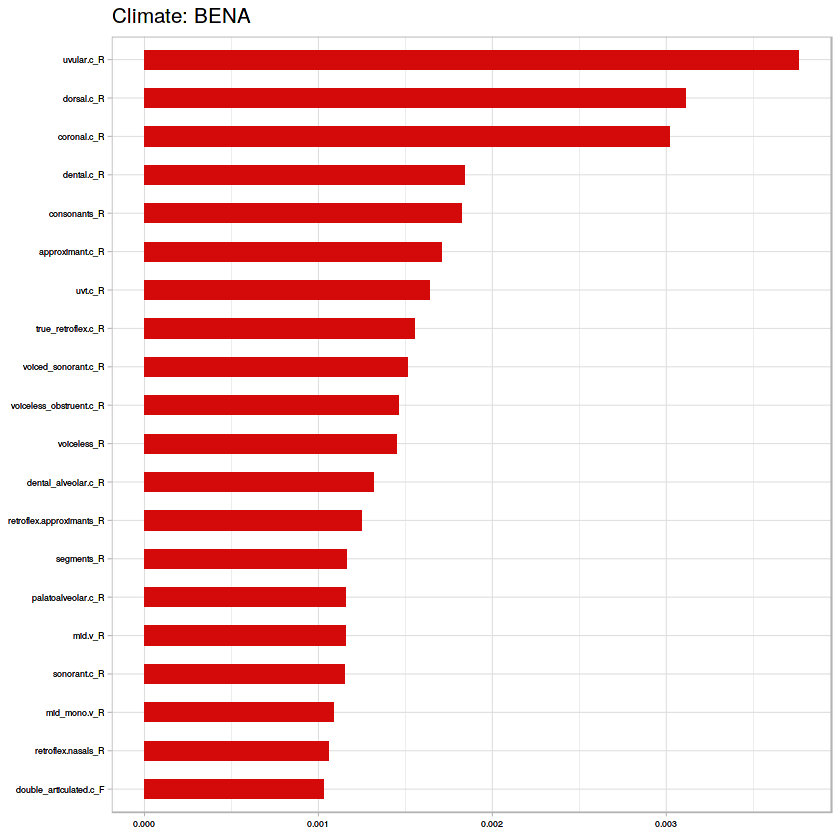

[1] "C" "E"
[1] "Dummy Classifier"
[1] 0.6345893
[1] 0.6345893
[1] C-V accuracy for Random Forest is 0.844714686623012
[1] "RF Confusion Matrix:"
   
       A    X
  A 1589  297
  X   35  217


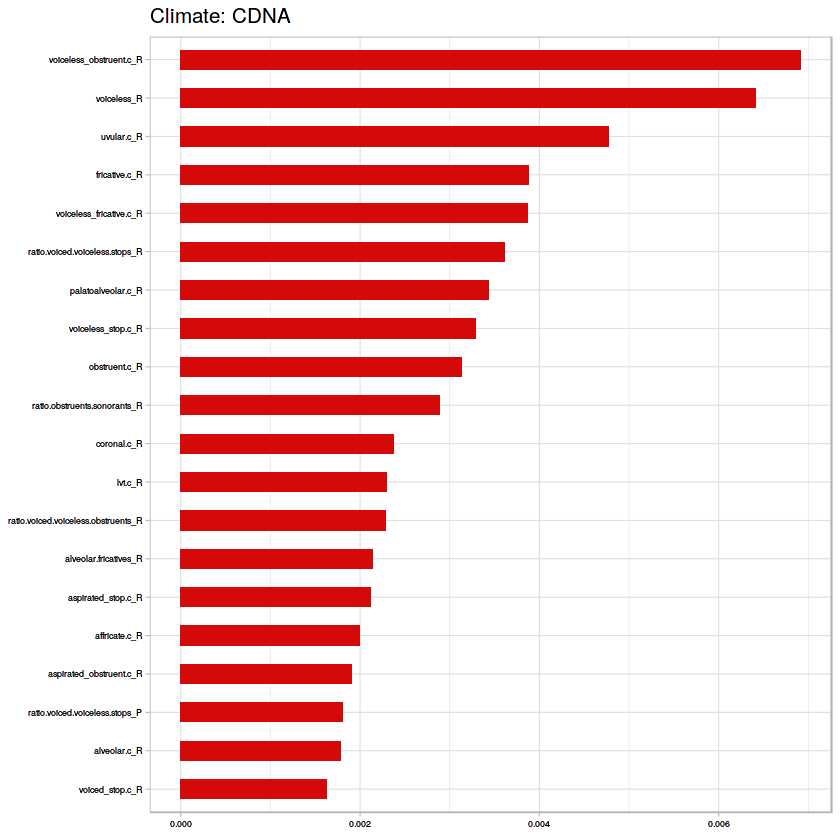

[1] "D" "E"
[1] "Dummy Classifier"
[1] 0.8047015
[1] 0.8047015
[1] C-V accuracy for Random Forest is 0.930372807017544
[1] "RF Confusion Matrix:"
   
       A    X
  A 1624  127
  X    0   73


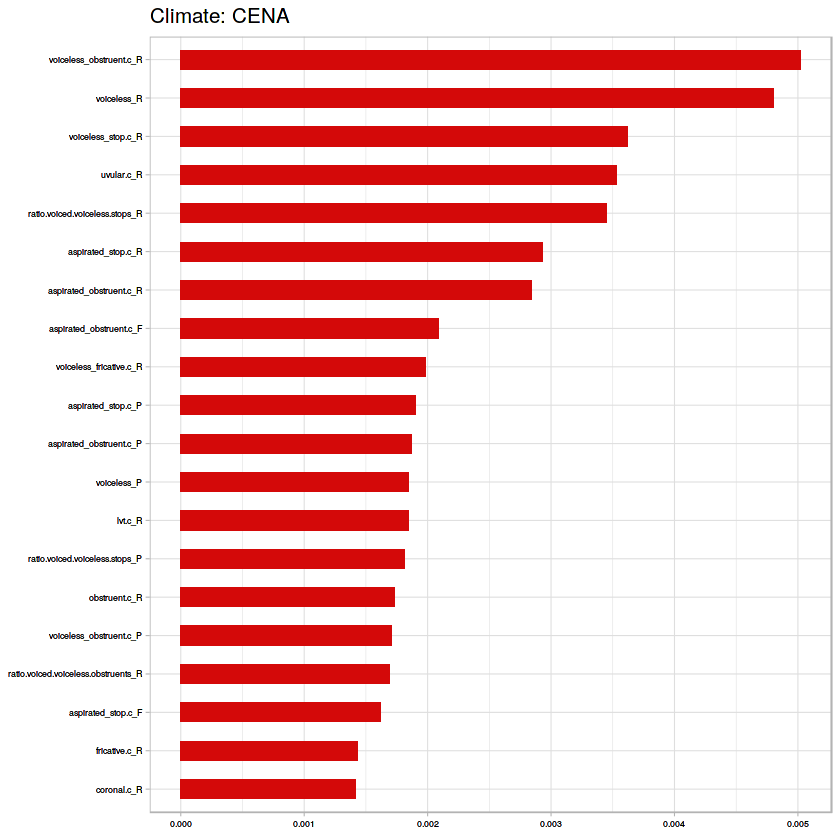

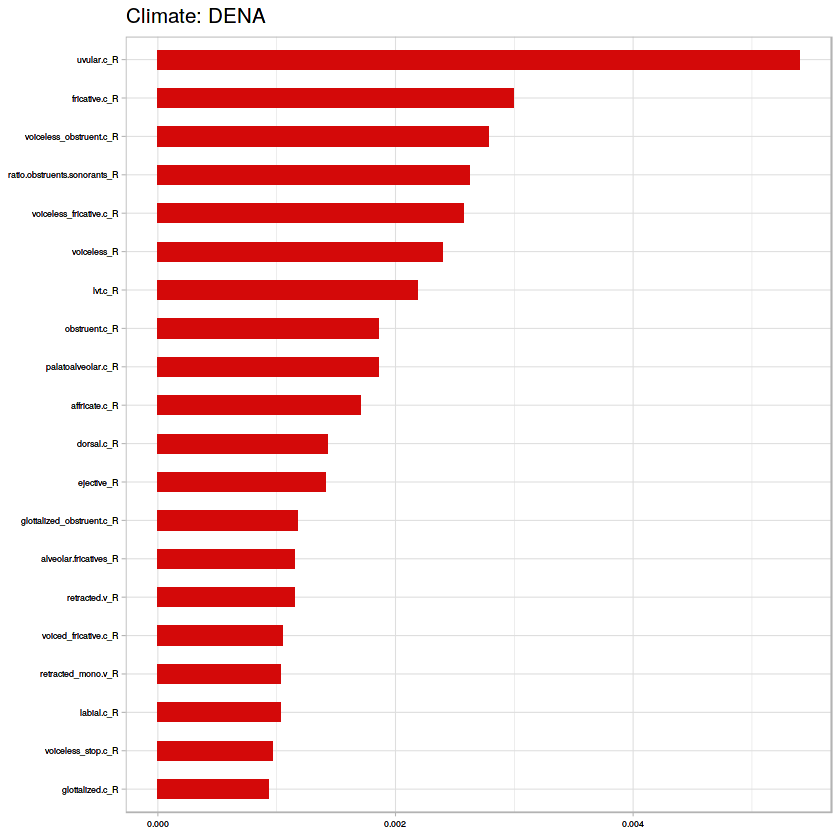

In [78]:
bin_tropvs(m)

In [ ]:
ovsa(m)

Warning message:
: Removed 818 rows containing missing values (geom_point).

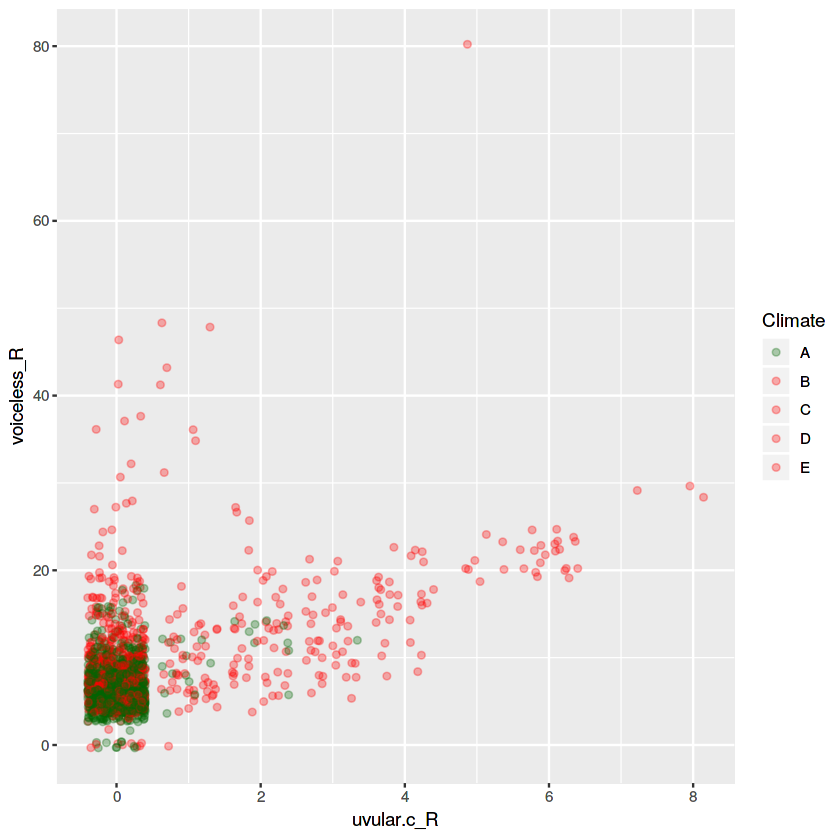

In [82]:
clss<-c('A','B','C','D','E')
p = ggplot(m ,aes(x=uvular.c_R,  
                    y=voiceless_obstruent.c_R, 
                    color=Climate))

p + geom_jitter(alpha=0.3) +  
  scale_color_manual(breaks = clss,
                     values=c('darkgreen','red', 'red', 'red', 'red'))

In [67]:
clss<-c('A','B','C','D','E')

Warning message:
: Removed 37 rows containing missing values (geom_point).

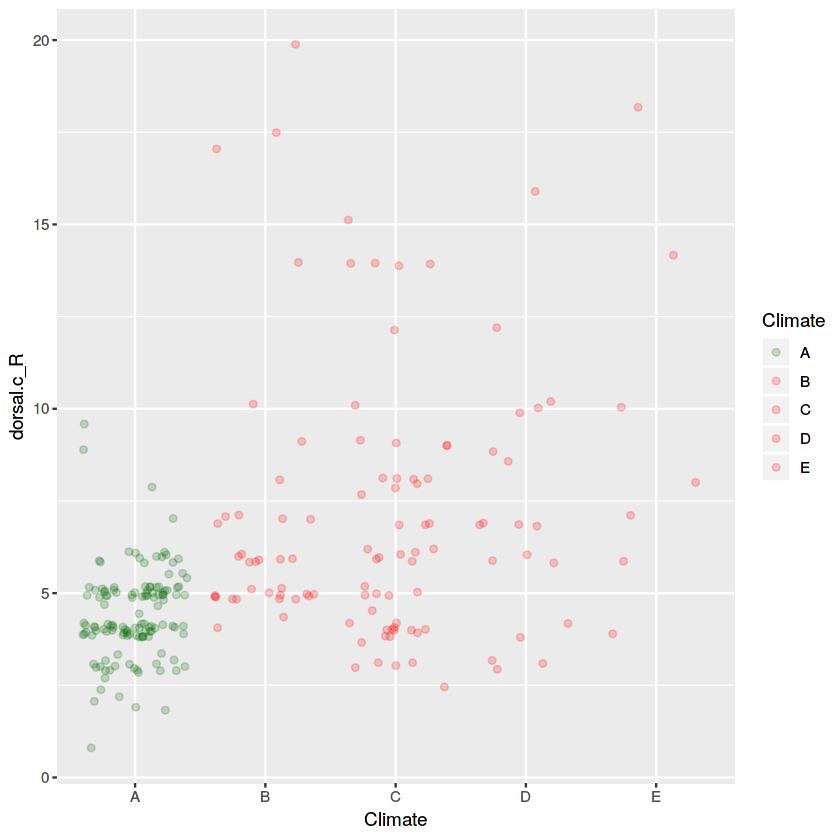

In [105]:
#dorsal.c_R
#uvular.c_R
p = ggplot(family_df,aes(x=Climate,  
                    y= dorsal.c_R, 
                    color = Climate))

p + geom_jitter(alpha=0.2) +  
  scale_color_manual(breaks = clss,
                     values=c('darkgreen','red', 'red', 'red', 'red'))


Warning message:
: Removed 37 rows containing missing values (geom_point).

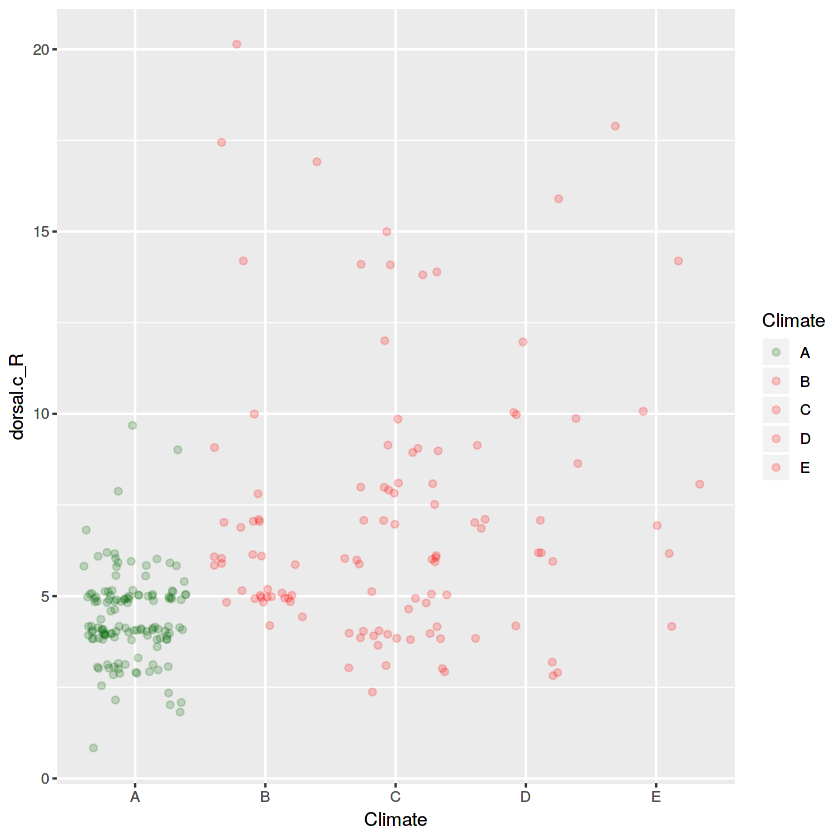

In [83]:
#Figures
p = ggplot(family_df,aes(x=Climate,  
                    y= dorsal.c_R, 
                    color = Climate))

p + geom_jitter(alpha=0.2) +  
  scale_color_manual(breaks = clss,
                     values=c('darkgreen','red', 'red', 'red', 'red'))


Warning message:
: Removed 1011 rows containing missing values (geom_point).

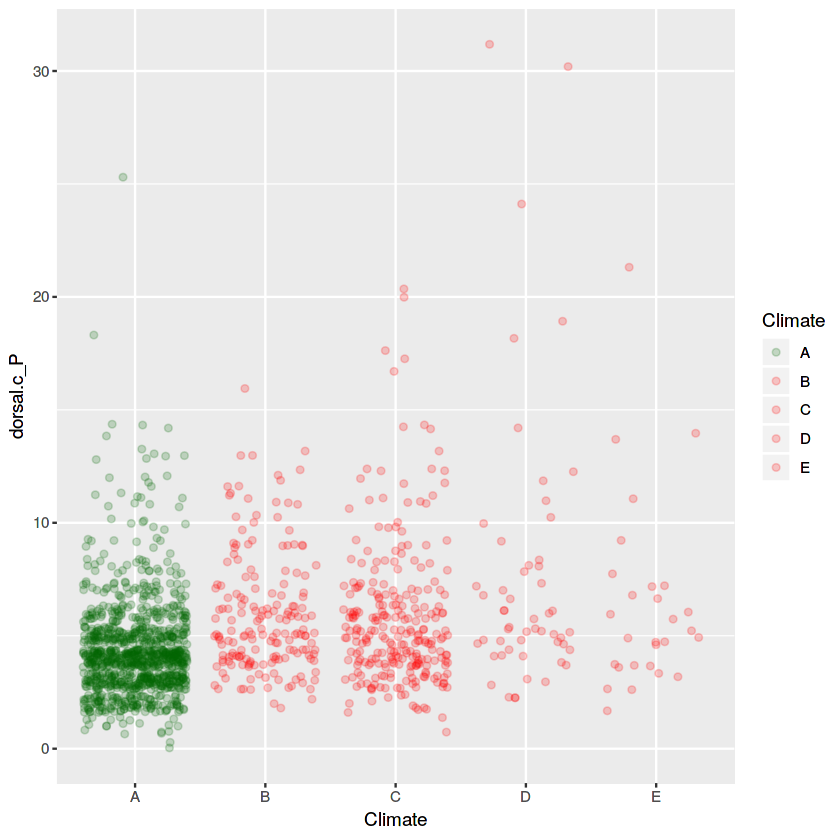

In [80]:
p = ggplot(m,aes(x=Climate,  
                    y= dorsal.c_P, 
                    color = Climate))

p + geom_jitter(alpha=0.2) +  
  scale_color_manual(breaks = clss,
                     values=c('darkgreen','red', 'red', 'red', 'red'))


In [96]:
clss<-c('A','B','C','D','E')

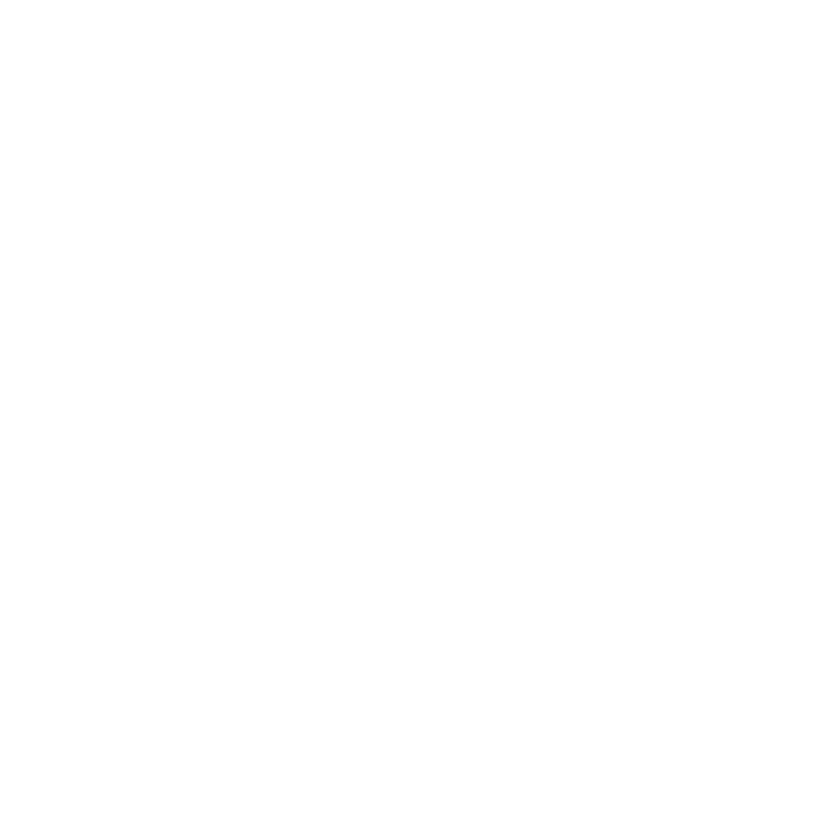

In [97]:
p = ggplot(m,aes(x=Climate,  
                    y= voiceless_obstruent_c_R, 
                    color = Climate))

p + geom_jitter(alpha=0.2) +  
  scale_color_manual(breaks = clss,
                     values=c('darkgreen','red', 'red', 'red', 'red'))


In [85]:
#Auxilary function for binarizing Tropical vs susbsets of 2 and 3 from rest
bin_tropvs <- function(df){
sub = c('B','C','D','E')
t<-combn(sub, 2, simplify = FALSE)
t<-as.list(t)
s<-combn(sub, 3, simplify = FALSE)
s<-as.list(s)
u<-c(s,t)
u<-as.list(u)

Y<-df[,(ncol(df))]
X<-df[,-(ncol(df))]
#print(u)
for (i in u){
v<-c('A',i)
print(i)
T<-ifelse( T %in% v, 'Y', 'Z')
#new dataframe with those two classes
n_df<-df[df$Climate %in% v ,]
n_df$Climate<-as.character(n_df$Climate)
n_df$Climate<-ifelse(n_df$Climate %in% i, 'X', 'A')
n_df$Climate<- as.factor(n_df$Climate)

print("Dummy Classifier")
cl<-c("A","X")
#print(dummy_clas(cl,n_df$Climate,dist(n_df)))
cvrf(n_df,i)
#prob<-table(T)/length(T)
#clim<-c('Tropical','Arid', 'Temperate','Cold','Polar')
#names(clim)<-sub
#D<-X
#D["Climate"] <- as.factor(T)

#print("Climate: ")
#print(i)
#c is the class vector, v is the real data, and p is the probability distribution for each class
#cl<-c("Y","Z")
#print("Dummy Classifier")
#print(dummy_clas(cl,D$Climate,dist(D)))
#cvrf(D,i)
}

}

In [56]:
cvrf <- function(df,t){
    #Tune number of variables considered at each split with random search; original seed=5
    #seed<-6
    #metric <- "Accuracy"
    #control <- trainControl(cforest_unbiased(ntree=750),method="repeatedcv", number=5, repeats=3, search="grid")
    #set.seed(seed)
    #tunegrid <- expand.grid(.mtry=c(1:ncol(yourData)-1))
    #rf_gridsearch <- train(Climate~., data=yourData, method="cforest", metric = metric, tuneGrid=tunegrid, tuneLength=15, trControl=control)
    #n<-as.numeric(rf_gridsearch$bestTune[[1]])
    #fm<-rf_gridsearch$finalModel
    #cv_res<-rf_gridsearch$results[,2]
    #cv_res<-as.numeric(cv_res[n+1])
    #print(cv_res)

    #Best CV with tuned parameter
    #print("C-V accuracy for Random Forest is %i", cv_res)
    lang.crf<-cforest(Climate~., data = df, controls = cforest_unbiased(mtry=20, ntree=4101))
    pred<-predict(lang.crf)
    cv_res<-count_sim_list(df$Climate,pred)/length(pred)
    
    #print(paste("C-V accuracy for Random Forest is", cv_res), quote = FALSE)
    #print(cv_res)
    
    #Variable Importance for Multiclass RF
    #lang.crf<-cforest(Climate~., data = df, controls = cforest_unbiased(mtry=13, ntree=2001))
    
    cv_res<-count_sim_list(df$Climate,pred)/length(pred)
    print(paste("C-V accuracy for Random Forest is", cv_res), quote = FALSE)
    
    #Confusion Matrix
    print("RF Confusion Matrix:")
    print(table(predict(lang.crf), df$Climate))
    
    #Variable Importance
    imp <- varimp(lang.crf)
    imp<-sort(imp, decreasing = TRUE)
    imp<-imp[1:20]
    print(imp_bar(imp,t))
    
    
    }

In [87]:
#Auxilary function - Feature Importance Graph
imp_bar <- function(imp,t){

  
  featureImportance <- data.frame(Feature=names(imp), Importance=imp)
  p <- ggplot(featureImportance, aes(x=reorder(Feature, Importance), y=Importance)) +
        ggtitle(paste0("Climate: ",t[1],t[2], t[3])) + 
       geom_bar(stat="identity", fill="#d40909", width = 0.5) +
       coord_flip() + 
       theme_light(base_size=10) +
       theme(axis.title.x=element_blank(),
             axis.title.y=element_blank(),
             axis.text.x = element_text(size = 5, color = "black"),
             axis.text.y = element_text(size = 5, color = "black"))
  return(p)
}

In [208]:
m

Glottolog,Climate,X,ISO,WALS,AUTOTYP,UULID,segments_P,vowels_P,monophtongs_P,⋯,alveolar.fricatives_R,nonsibilant.dental.fricatives_R,sibilant.dental.fricatives_R,bilabiallabiodental.affricates_R,bilabial.affricates_R,retroflex.stops_R,retroflex.fricatives_R,retroflex.affricates_R,retroflex.nasals_R,retroflex.approximants_R
aari1239,C,48,aiw,aar,865,[i-aiw][w-aar][a-865][g-aari1239],36,10,10,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
abad1241,A,1923,kbt,,NA,[i-kbt][w-][a-][g-abad1241],NA,NA,NA,,1,0,0,0,0,0,0,0,0,0
aban1242,A,1574,abm,,NA,[i-abm][w-][a-][g-aban1242],NA,NA,NA,,1,0,0,0,0,0,0,0,0,0
abar1238,A,903,mij,,NA,[i-mij][w-][a-][g-abar1238],32,8,8,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
abau1245,A,4,aau,aba,820,[i-aau][w-aba][a-820][g-abau1245],14,5,5,,1,0,0,0,0,0,0,0,0,0
abaz1241,D,1575,abq,abz,824,[i-abq][w-abz][a-824][g-abaz1241],NA,NA,NA,,2,0,0,0,0,0,0,0,0,0
abid1235,A,6,abi,abd,823,[i-abi][w-abd][a-823][g-abid1235],36,15,15,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
abip1241,C,127,axb,abi,582,[i-axb][w-abi][a-582][g-abip1241],23,10,10,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
abis1238,A,106,ash,,NA,[i-ash][w-][a-][g-abis1238],27,10,10,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
abkh1244,D,1573,abk,abk,7,[i-abk][w-abk][a-7][g-abkh1244],NA,NA,NA,,2,0,0,0,0,0,0,0,0,0


In [42]:
ovsa <-function(data){

Y<-data['Climate']
X<-subset(data, select=-Climate)

sub <- c('A','B','C','D','E')

for (k in sub){
    T<-Y
    T<-ifelse(T !=k, 'X', k)
    
    #Baseline Classifier
    prob<-table(T)/length(T)
    c<-c(k,'X')
    clim<-c('Tropical','Arid', 'Temperate','Cold','Polar')
    names(clim)<-sub
    print(paste0("All vs ", clim[[(k)]]))
    print(paste0("Dummy Classifier accuracy:"))
    dummy_clas(c,T,prob)
    D<-X
    D["Climate"] <- as.factor(T)
    print(cvrf(D,k))
}
}

In [15]:
#Mode
Mode<-function(x){
    x<-na.omit(x)
    ux<-unique(x)
    ux[which.max(tabulate(match(x, ux)))]
}


In [23]:
Modes <- function(x) {
  ux <- unique(x)
  tab <- tabulate(match(x, ux))
  ux[tab == max(tab)]
}



In [16]:
fam_v<-unique(df_fam['family_id'])


In [17]:
fam_v<-fam_v[-7,]

In [18]:
length(fam_v)

[1] 194

In [19]:
unq<-subset( df_fam, is.na(family_id) )

In [20]:
unq<-unq[c(3,9:ncol(unq))]

In [220]:
fam_v <- fam_v[1:195,]

In [197]:
fam<-fam_v[-7,]

In [101]:
mdf<-mdf[c(3,9:ncol(mdf))]

In [102]:
mdf

Warning message:
In cbind(parts$left, ellip_h, parts$right, deparse.level = 0L): number of rows of result is not a multiple of vector length (arg 2)Warning message:
In cbind(parts$left, ellip_h, parts$right, deparse.level = 0L): number of rows of result is not a multiple of vector length (arg 2)Warning message:
In cbind(parts$left, ellip_h, parts$right, deparse.level = 0L): number of rows of result is not a multiple of vector length (arg 2)Warning message:
In cbind(parts$left, ellip_h, parts$right, deparse.level = 0L): number of rows of result is not a multiple of vector length (arg 2)

Climate,segments_P,vowels_P,monophtongs_P,diphtongs_P,triphtongs_P,heights.v_P,lengths.v_P,long.v_P,nasal.v_P,⋯,alveolar.fricatives_R,nonsibilant.dental.fricatives_R,sibilant.dental.fricatives_R,bilabiallabiodental.affricates_R,bilabial.affricates_R,retroflex.stops_R,retroflex.fricatives_R,retroflex.affricates_R,retroflex.nasals_R,retroflex.approximants_R


In [146]:
df_fam<-apply(df_fam,2, as.character)

In [155]:
df_fam<-data.frame(df_fam)

In [164]:
sapply(df_fam, class)

Glottolog                           family_id 
                        "character"                         "character" 
                            Climate                                   X 
                        "character"                           "integer" 
                                ISO                                WALS 
                        "character"                         "character" 
                            AUTOTYP                               UULID 
                          "integer"                         "character" 
                         segments_P                            vowels_P 
                          "integer"                           "integer" 
                      monophtongs_P                         diphtongs_P 
                          "integer"                           "integer" 
                       triphtongs_P                         heights.v_P 
                          "integer"                           "integer" 
                        lengths.v_P                            long.v_P 
                          "integer"                           "integer" 
                          nasal.v_P                           round.v_P 
                          "integer"                           "integer" 
                           high.v_P                             mid.v_P 
                          "integer"                           "integer" 
                            low.v_P                           front.v_P 
                          "integer"                           "integer" 
                           back.v_P                           tense.v_P 
                          "integer"                           "integer" 
                            lax.v_P                             atr.v_P 
                          "integer"                           "integer" 
                            rtr.v_P                          raised.v_P 
                          "integer"                           "integer" 
                      retracted.v_P                         fronted.v_P 
                          "integer"                           "integer" 
                    glottalized.v_P                   laryngealized.v_P 
                          "integer"                           "logical" 
                         unique.v_P                    unique.nasal.v_P 
                          "integer"                           "integer" 
                   heights_mono.v_P                      heights_di.v_P 
                          "integer"                           "integer" 
                    heights_tri.v_P                    lengths_mono.v_P 
                          "integer"                           "integer" 
                     lengths_di.v_P                     lengths_tri.v_P 
                          "integer"                           "integer" 
                      long_mono.v_P                         long_di.v_P 
                          "integer"                           "integer" 
                       long_tri.v_P                      nasal_mono.v_P 
                          "integer"                           "integer" 
                       nasal_di.v_P                       nasal_tri.v_P 
                          "integer"                           "integer" 
                     round_mono.v_P                        round_di.v_P 
                          "integer"                           "integer" 
                      round_tri.v_P                       high_mono.v_P 
                          "integer"                           "integer" 
                        high_di.v_P                        high_tri.v_P 
                          "integer"                           "integer" 
                       mid_mono.v_P                          mid_di.v_P 
                          "integer"                           "integer" 
                        mid_tri.v_P                        low_mono.v_P 
           

In [151]:
is.data.frame(df_fam)

[1] FALSE

In [136]:
subset(df_fam, family_id == 'sout2845' )

ERROR: Error in subset.matrix(df_fam, family_id == "sout2845"): object 'family_id' not found


In [142]:
df_fam[9:ncol(df_fam)]<-apply(df_fam[9:ncol(df_fam)], 2 , as.factor)

ERROR: Error in apply(df_fam[9:ncol(df_fam)], 2, as.factor): dim(X) must have a positive length


In [64]:
df_fam[9:ncol(df_fam)]<-apply(df_fam[9:ncol(df_fam)], 2 , as.numeric)

In [206]:
fam_v<-fam_v[-7,]

In [34]:
#Median/Average for group of families
lg_df<-df_fam[,2:ncol(df_fam)]
mdf<-df_fam[FALSE,]
mdf<-mdf[c(3,9:ncol(mdf))]
#mdf<-apply(mdf, 2, as.character)
for (name in fam_v) {
    df_f<-subset(lg_df, family_id == name)
    df_f<-df_f[c(2,8:ncol(df_f))]
    c<-df_f[1]
    c<-lapply(c,as.character)
    c<-lapply(c,Mode)
    v<-df_f[,2:ncol(df_f)]
    #v<-apply(v,2, as.numeric)
    v<-apply(v, 2, median, na.rm = TRUE)
    v<-append(c,v)
    #print(names(v))
    colnames(mdf)<-names(v)
    #df_f<-apply(df_f, 2, as.character)
    mdf<-apply(mdf, 2, as.character)
    mdf<-rbind(mdf,v)
}



In [55]:
family_df$Climate<-as.factor(as.character(family_df$Climate))

In [57]:
family_df[2:ncol(family_df)] <- apply(family_df[2:ncol(family_df)],2 , as.character)

family_df[2:ncol(family_df)] <- apply(family_df[2:ncol(family_df)],2 , as.numeric)

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.83271375464684
[1] "RF Confusion Matrix:"
   
      A   X
  A 141  30
  X  15  83
[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.834615384615385
[1] "RF Confusion Matrix:"
   
      A   X
  A 143  30
  X  13  74


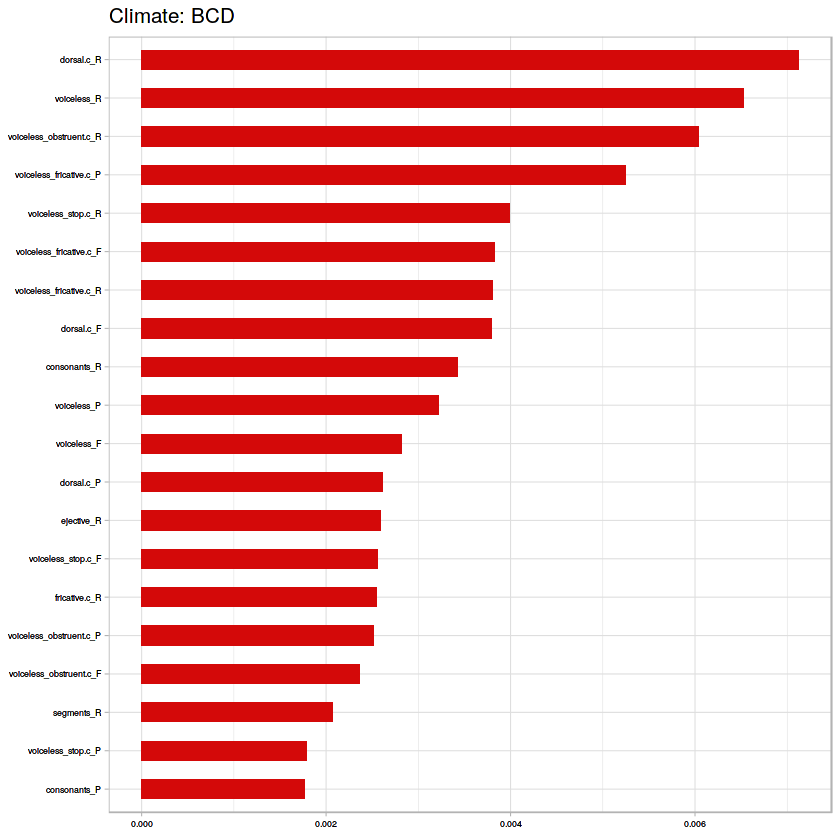

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.856502242152466
[1] "RF Confusion Matrix:"
   
      A   X
  A 154  30
  X   2  37


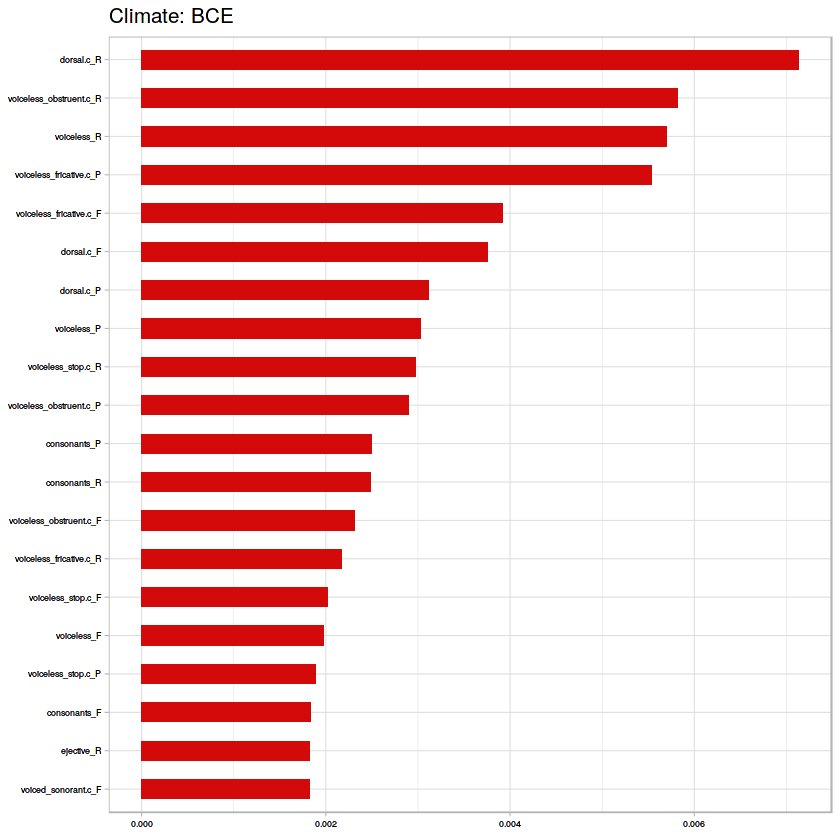

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.838174273858921
[1] "RF Confusion Matrix:"
   
      A   X
  A 149  32
  X   7  53


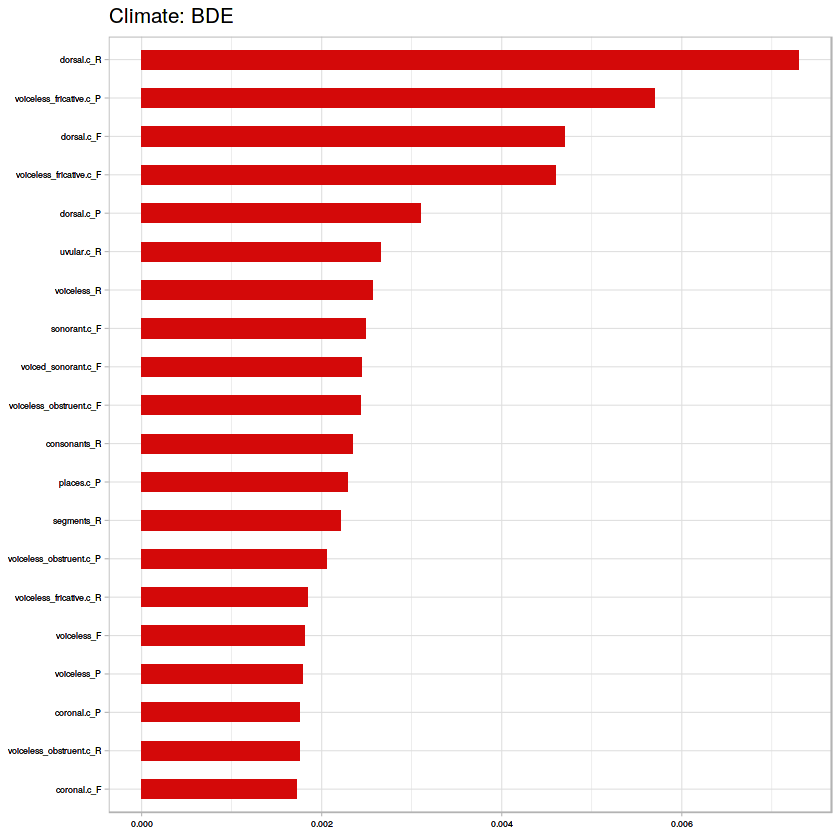

[1] "B" "C"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.816
[1] "RF Confusion Matrix:"
   
      A   X
  A 143  33
  X  13  61


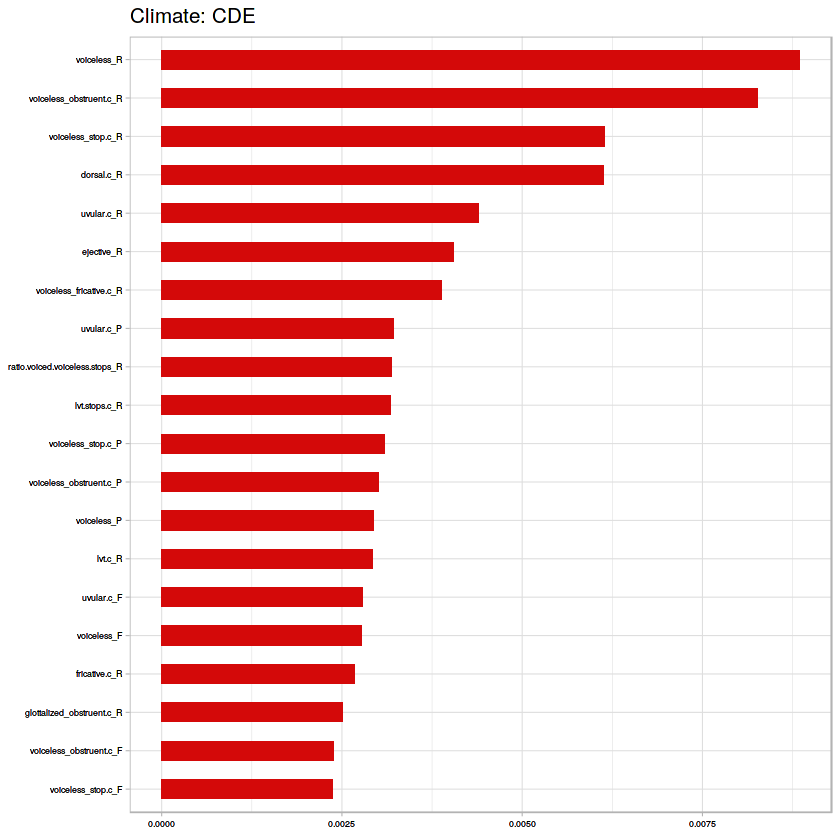

[1] "B" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.849765258215962
[1] "RF Confusion Matrix:"
   
      A   X
  A 155  31
  X   1  26


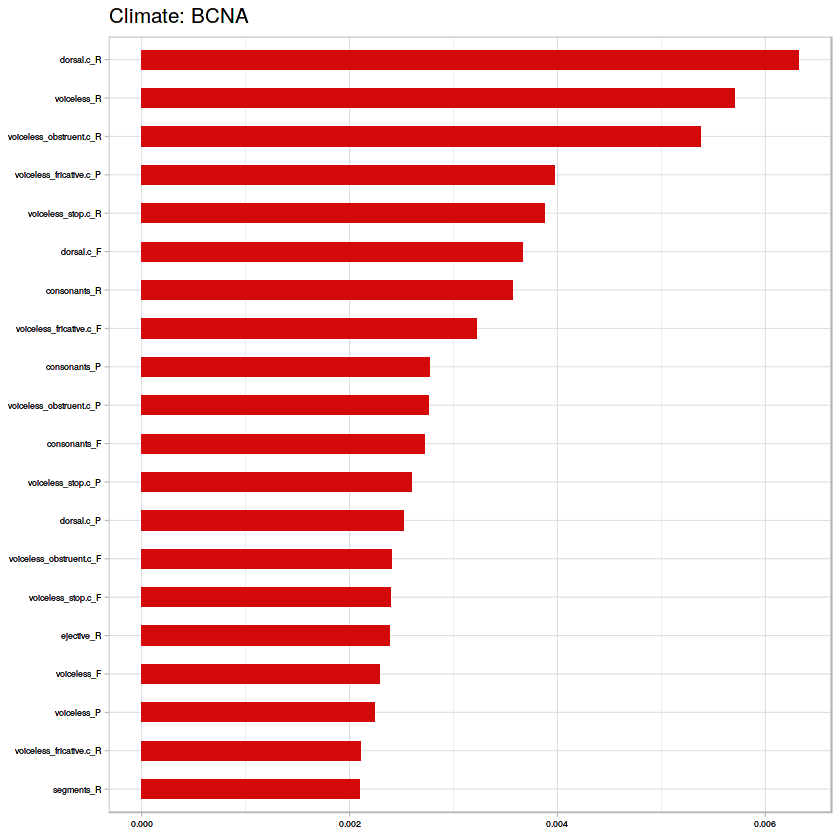

[1] "B" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.857843137254902
[1] "RF Confusion Matrix:"
   
      A   X
  A 154  27
  X   2  21


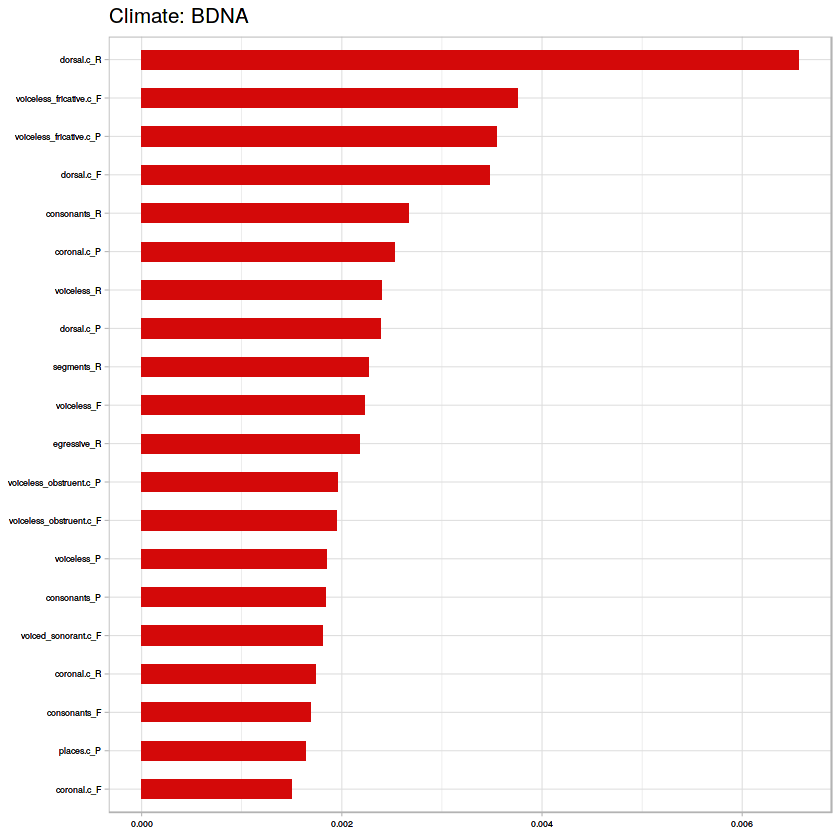

[1] "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.844155844155844
[1] "RF Confusion Matrix:"
   
      A   X
  A 151  31
  X   5  44


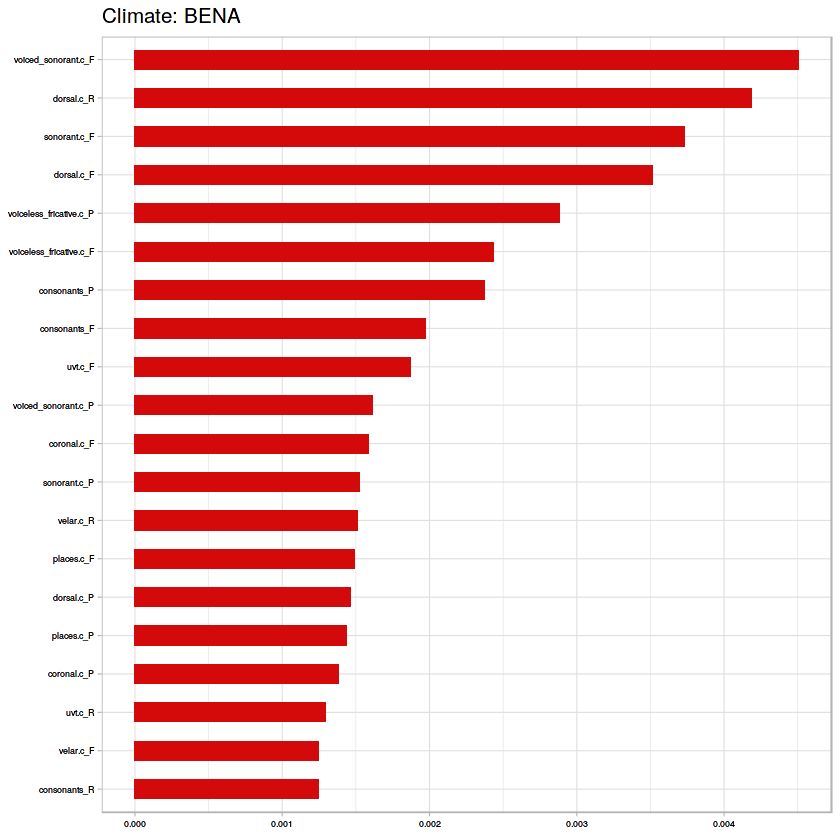

[1] "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.846846846846847
[1] "RF Confusion Matrix:"
   
      A   X
  A 152  30
  X   4  36


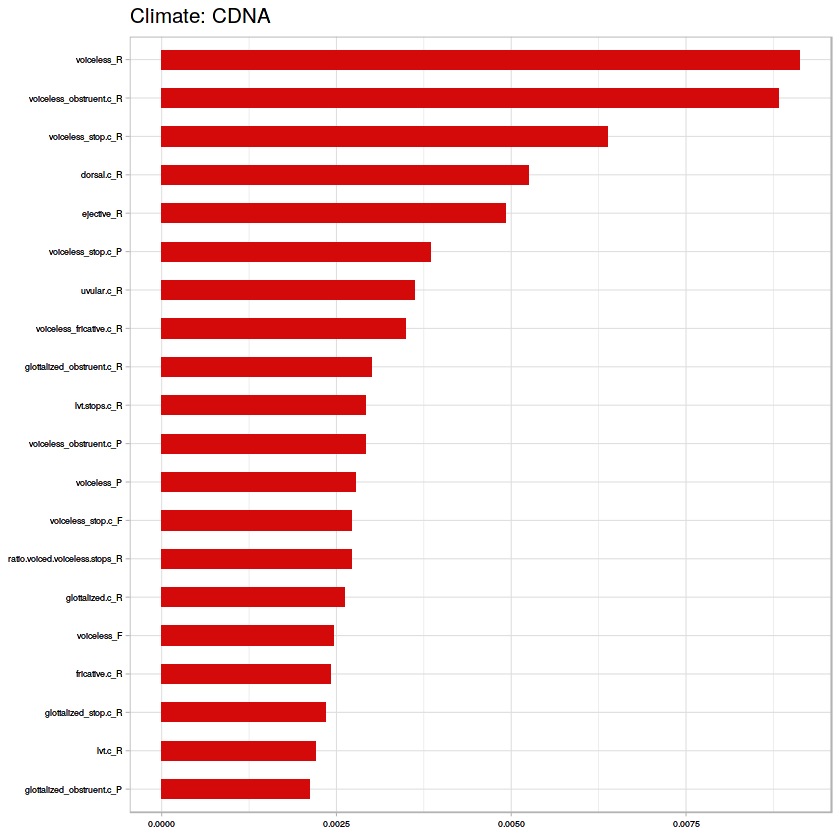

[1] "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.908108108108108
[1] "RF Confusion Matrix:"
   
      A   X
  A 156  17
  X   0  12


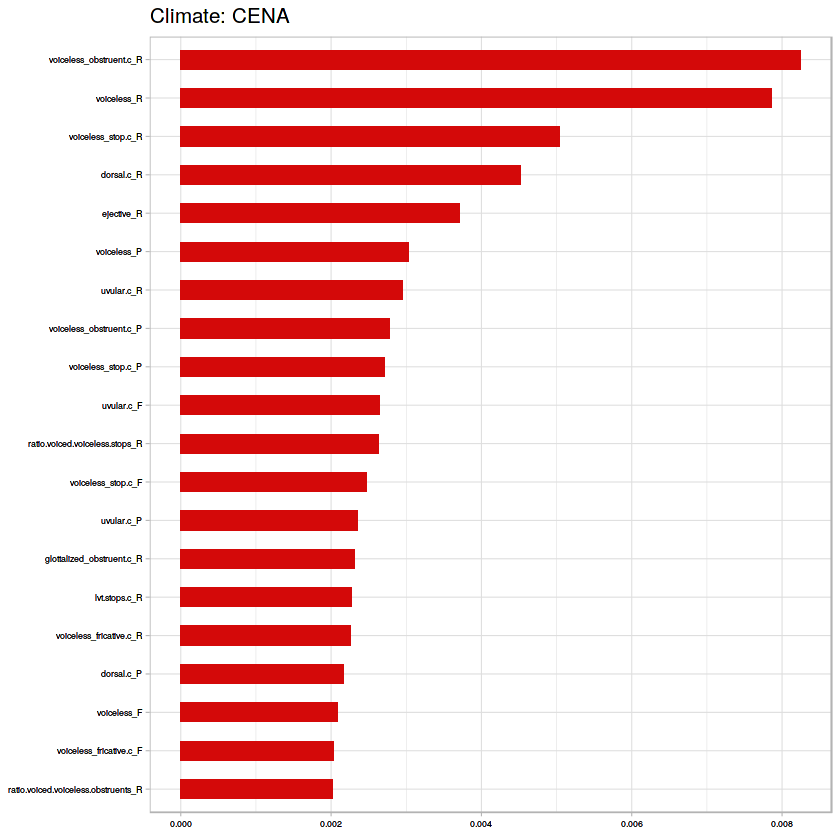

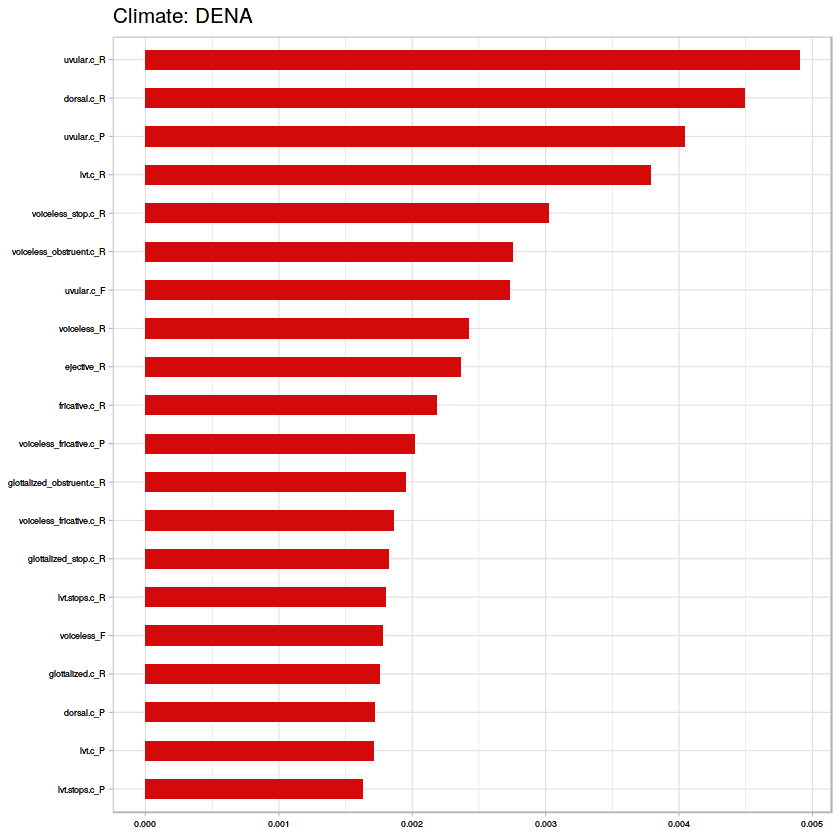

In [60]:
#Figures
bin_tropvs(family_df)

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.5075305
[1] C-V accuracy for Random Forest is 0.853046594982079
[1] "RF Confusion Matrix:"
   
      A   X
  A 141  26
  X  15  97


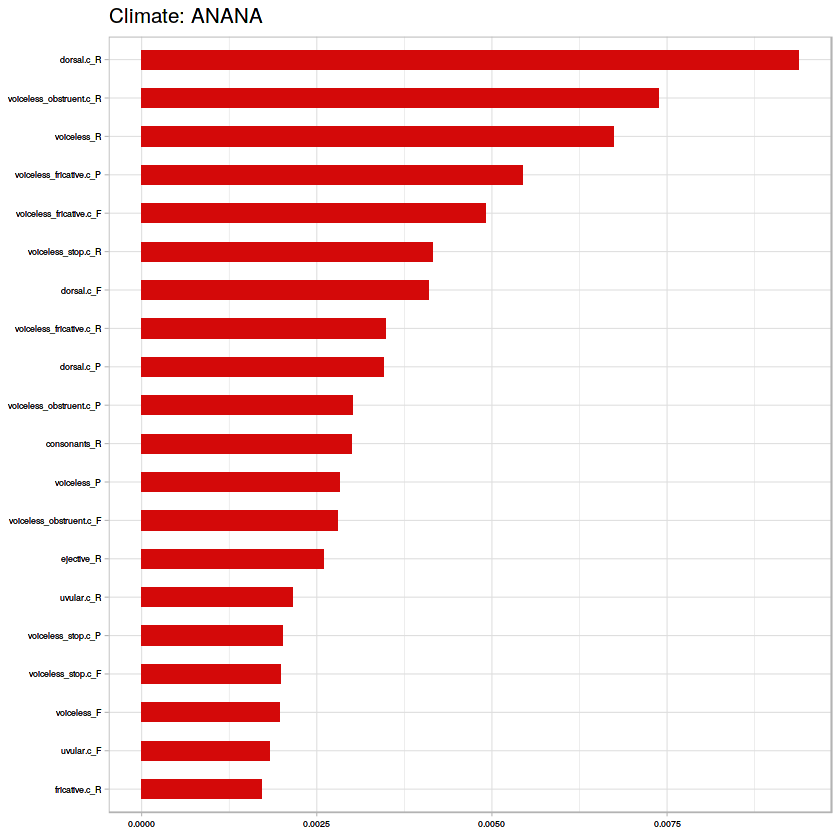

[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.7652706
[1] C-V accuracy for Random Forest is 0.878136200716846
[1] "RF Confusion Matrix:"
   
      B   X
  B   4   0
  X  34 241


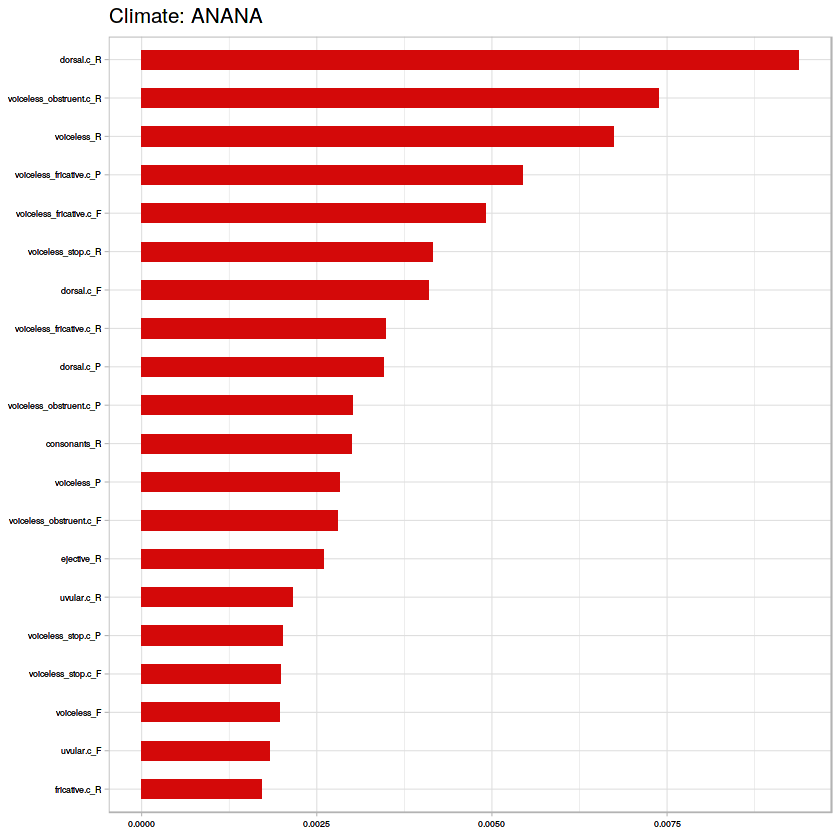

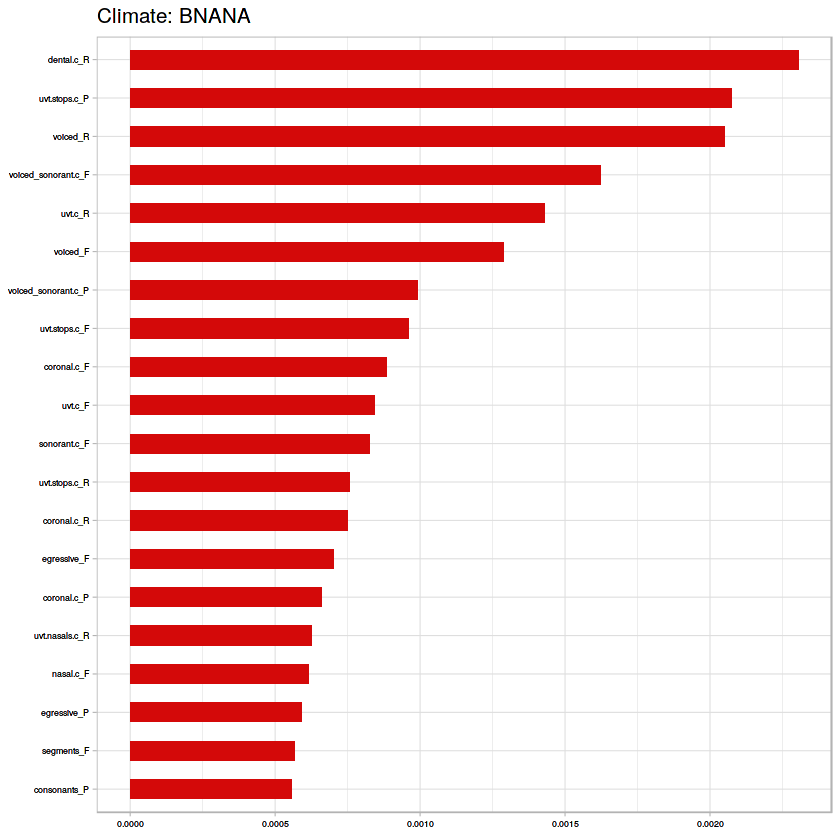

[1] "All vs Temperate"
[1] "Dummy Classifier accuracy:"
[1] 0.679233
[1] C-V accuracy for Random Forest is 0.817204301075269
[1] "RF Confusion Matrix:"
   
      C   X
  C   5   0
  X  51 223


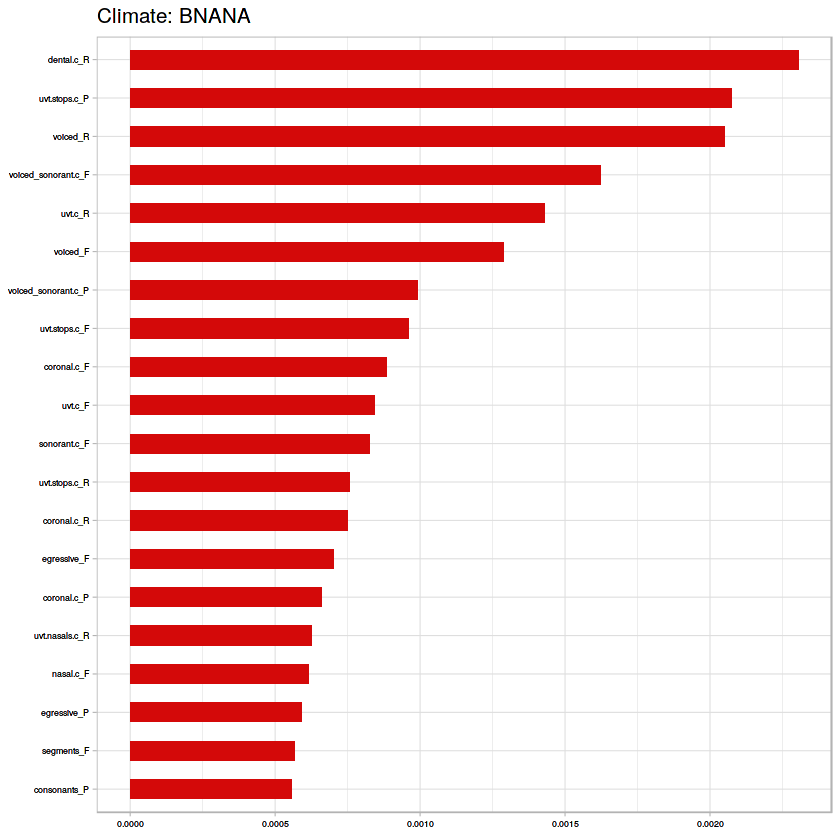

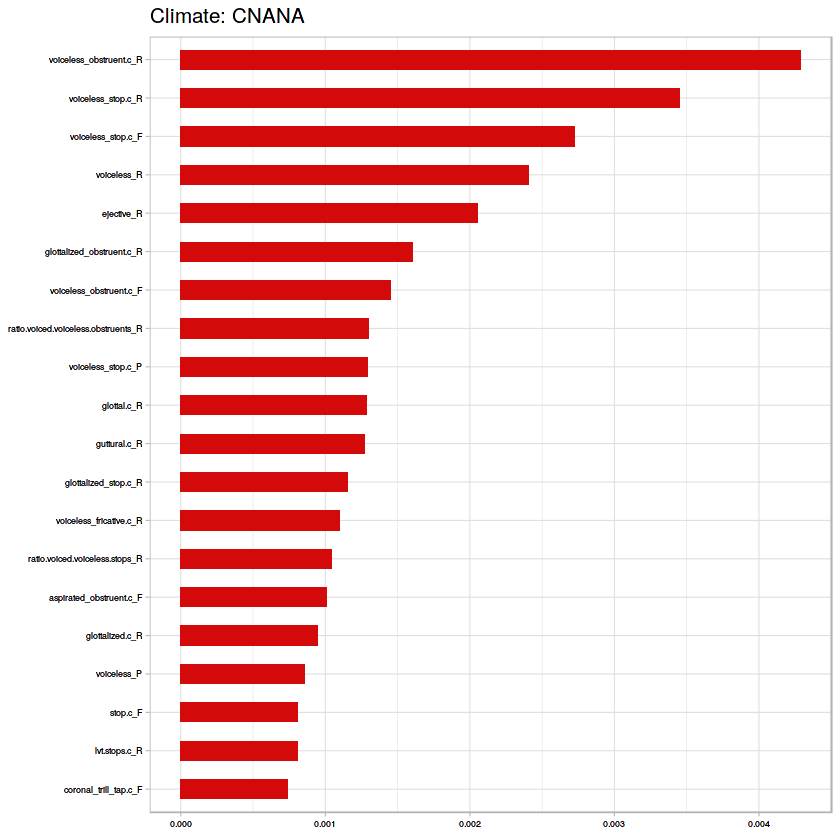

In [ ]:
ovsa(family_df)

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.840148698884758
[1] "RF Confusion Matrix:"
   
      A   X
  A 142  29
  X  14  84
[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.834615384615385
[1] "RF Confusion Matrix:"
   
      A   X
  A 143  30
  X  13  74


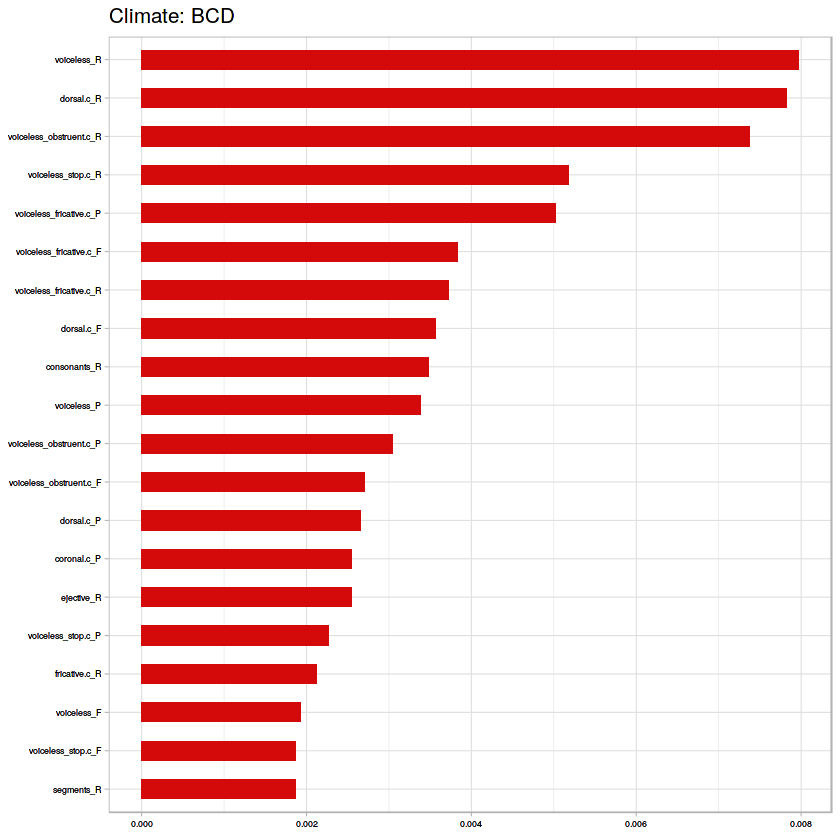

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.869955156950673
[1] "RF Confusion Matrix:"
   
      A   X
  A 155  28
  X   1  39


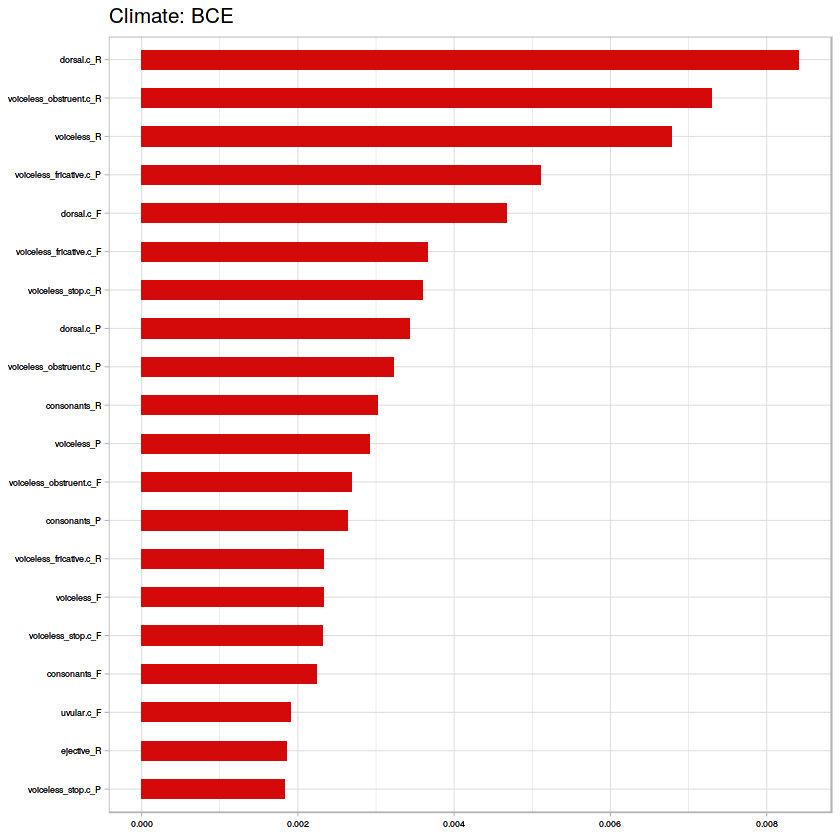

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.842323651452282
[1] "RF Confusion Matrix:"
   
      A   X
  A 149  31
  X   7  54


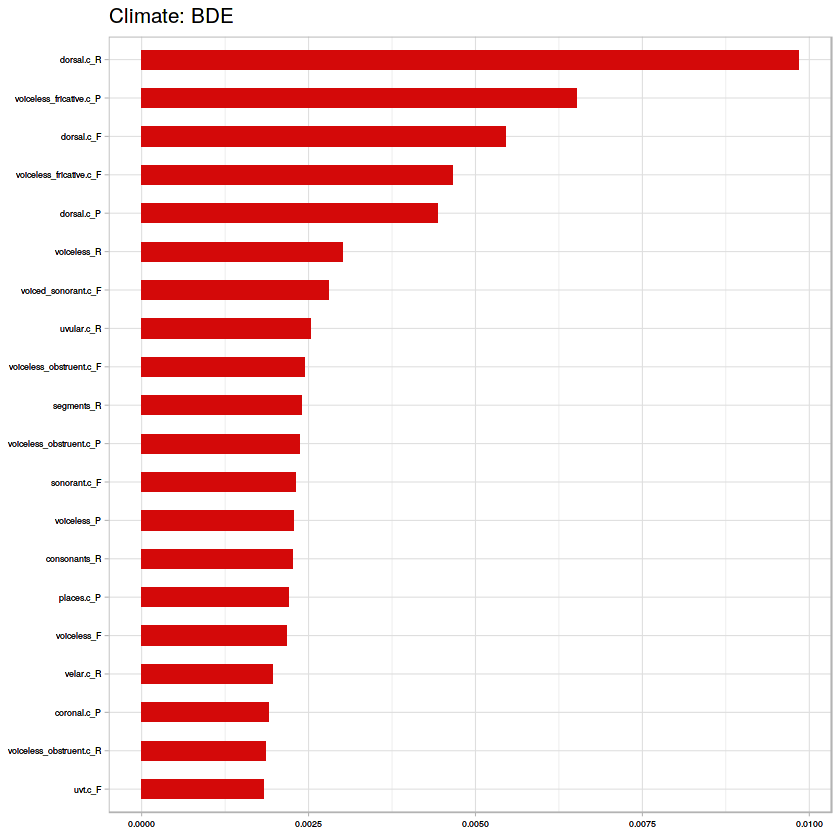

[1] "B" "C"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.832
[1] "RF Confusion Matrix:"
   
      A   X
  A 144  30
  X  12  64


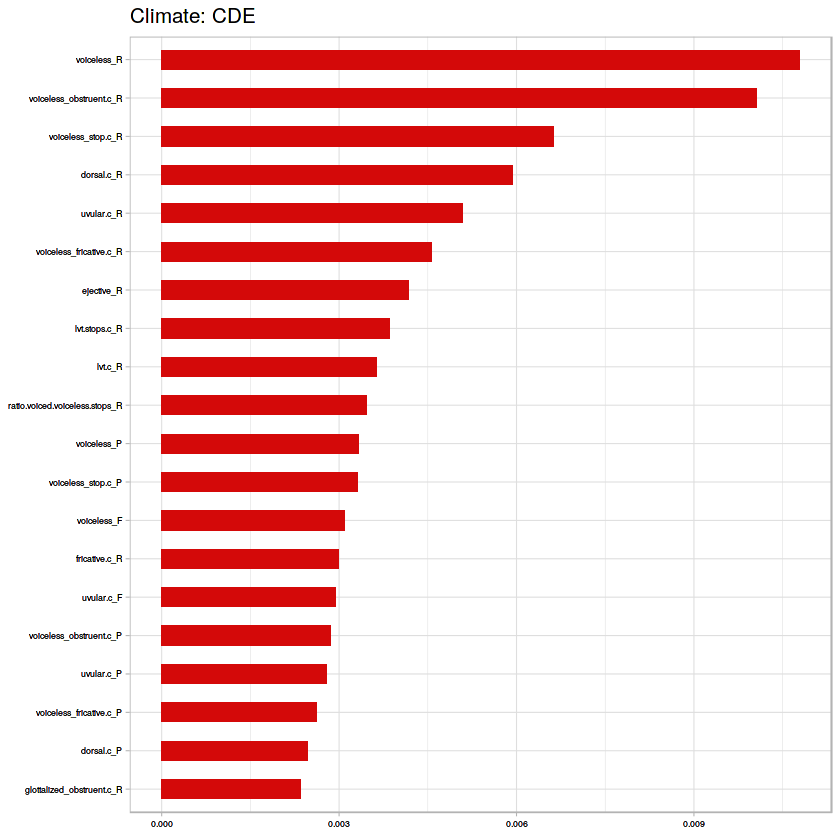

[1] "B" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.863849765258216
[1] "RF Confusion Matrix:"
   
      A   X
  A 155  28
  X   1  29


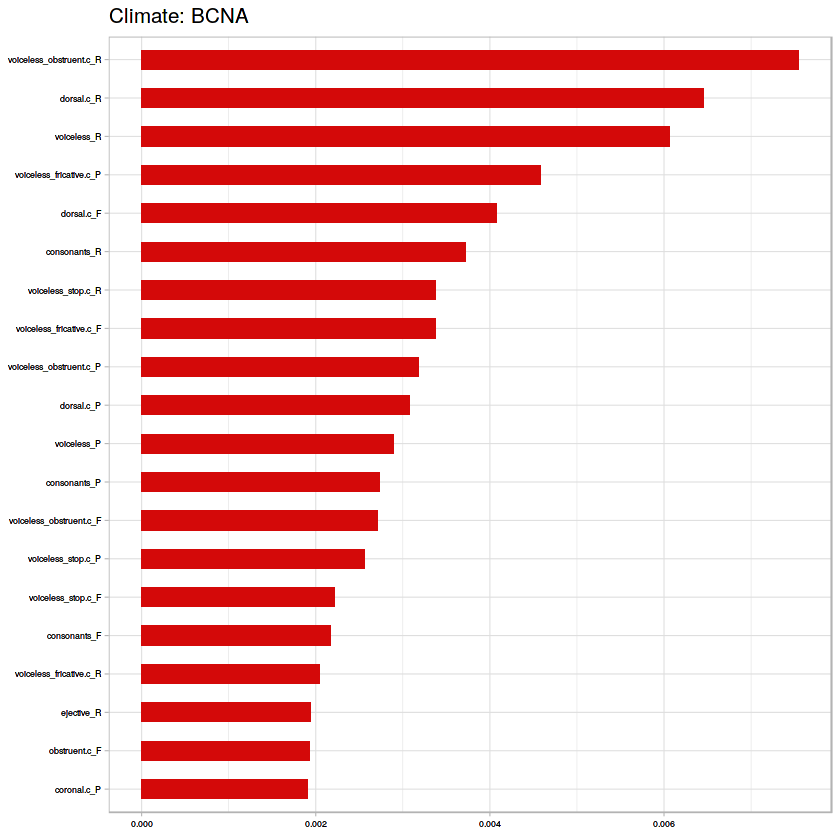

[1] "B" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.857843137254902
[1] "RF Confusion Matrix:"
   
      A   X
  A 154  27
  X   2  21


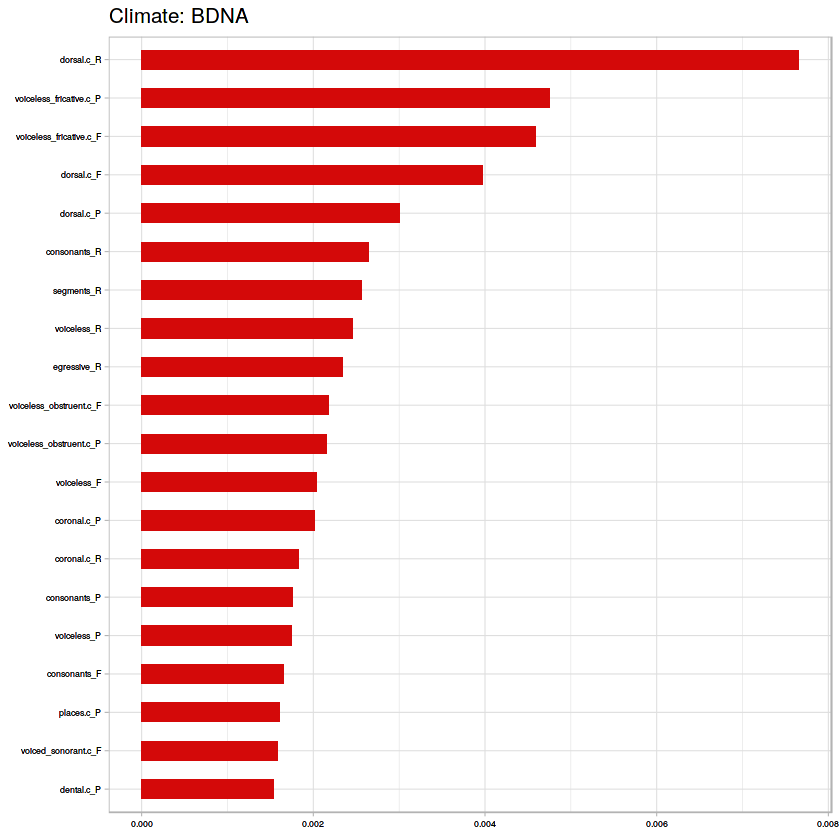

[1] "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.848484848484849
[1] "RF Confusion Matrix:"
   
      A   X
  A 151  30
  X   5  45


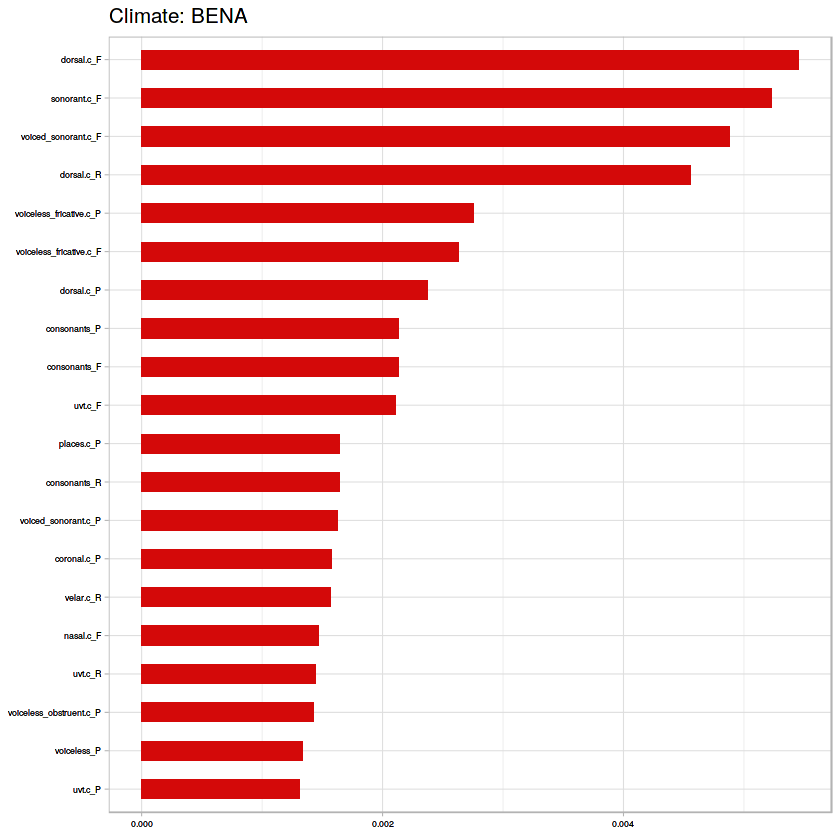

[1] "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.851351351351351
[1] "RF Confusion Matrix:"
   
      A   X
  A 152  29
  X   4  37


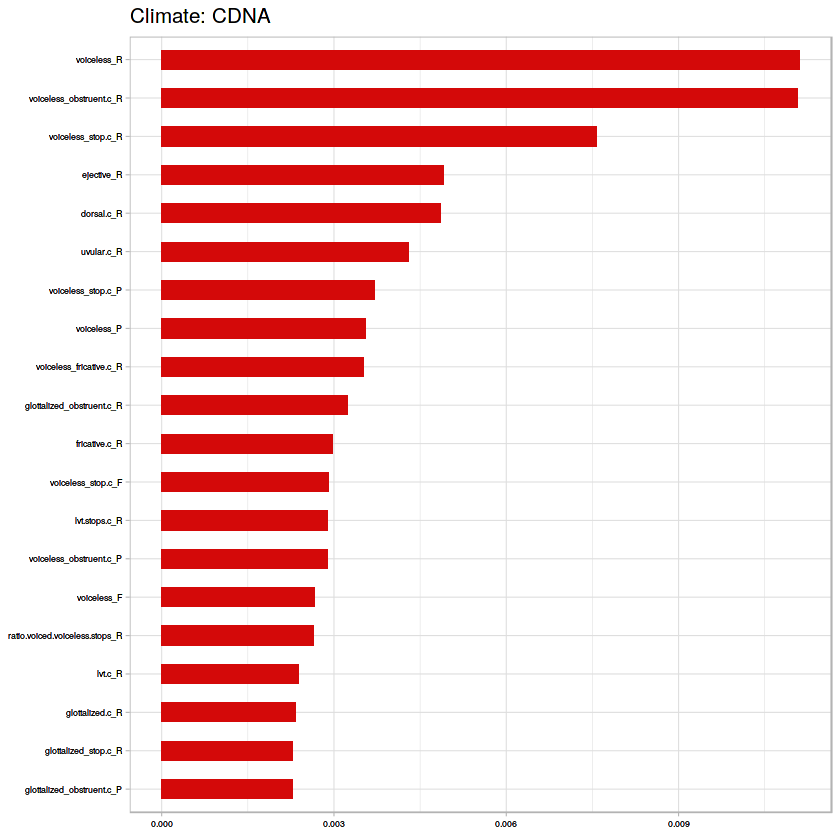

[1] "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.908108108108108
[1] "RF Confusion Matrix:"
   
      A   X
  A 156  17
  X   0  12


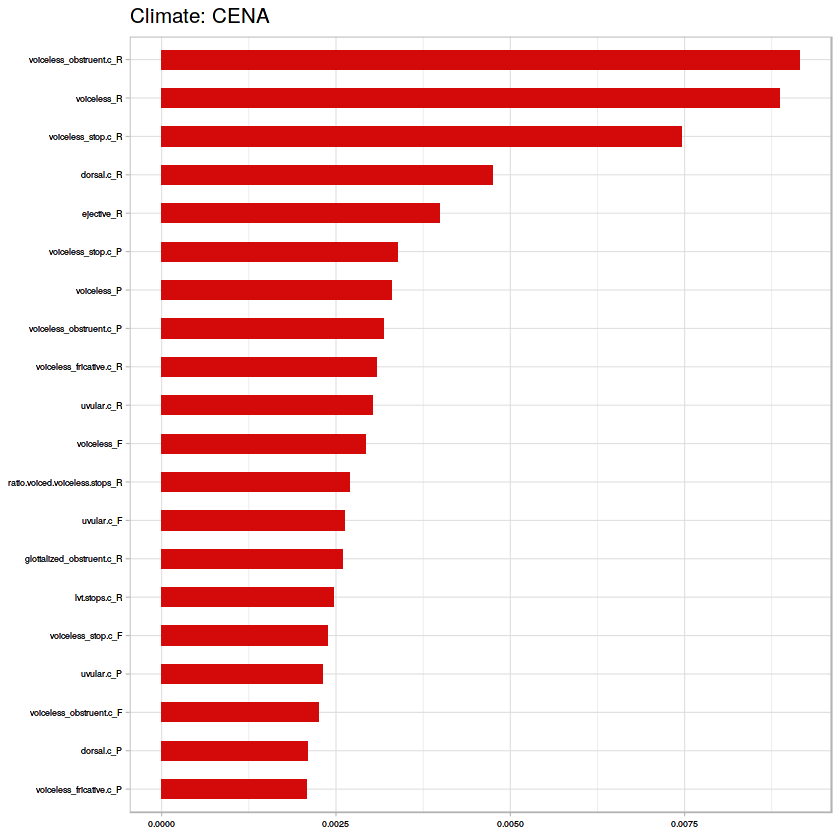

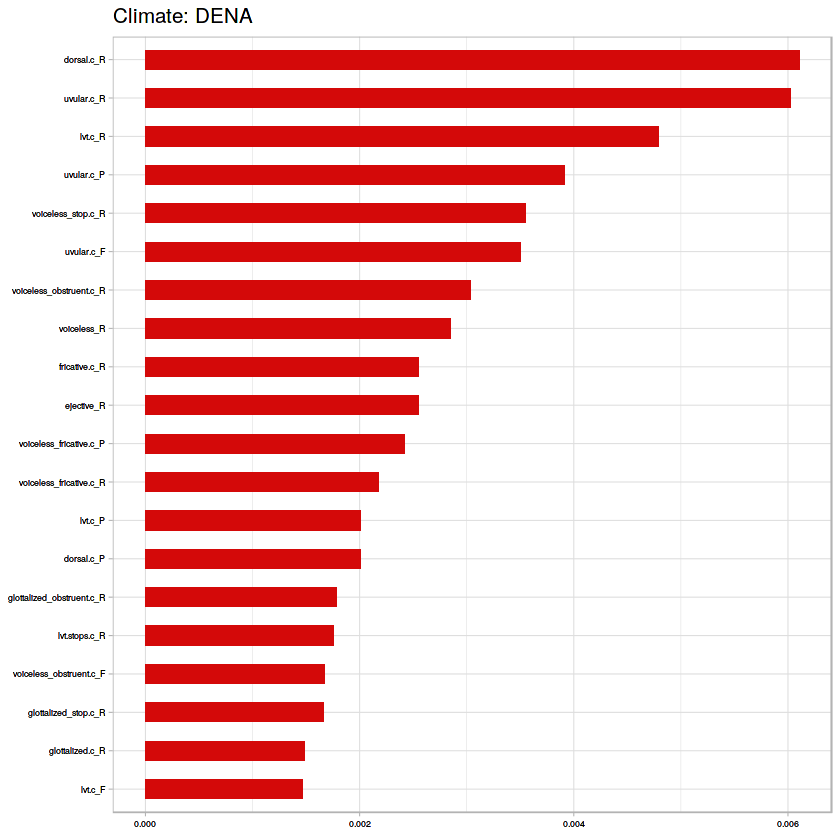

In [65]:
bin_tropvs(family_df)

[1] "B" "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.83271375464684
[1] "RF Confusion Matrix:"
   
      A   X
  A 141  30
  X  15  83
[1] "B" "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.830769230769231
[1] "RF Confusion Matrix:"
   
      A   X
  A 143  31
  X  13  73


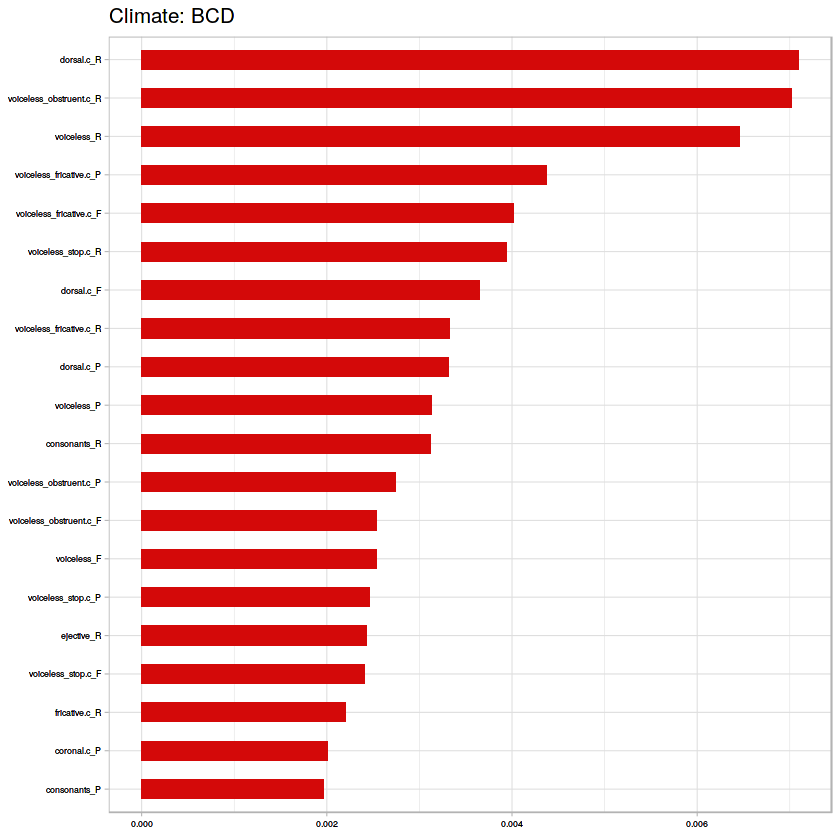

[1] "B" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.865470852017937
[1] "RF Confusion Matrix:"
   
      A   X
  A 154  28
  X   2  39


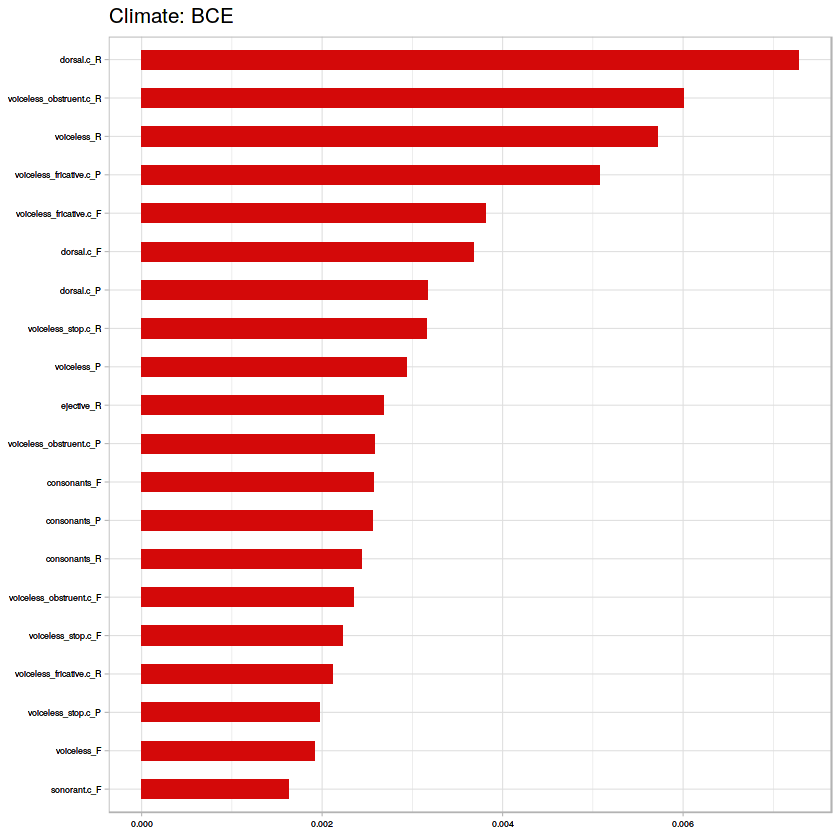

[1] "C" "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.838174273858921
[1] "RF Confusion Matrix:"
   
      A   X
  A 149  32
  X   7  53


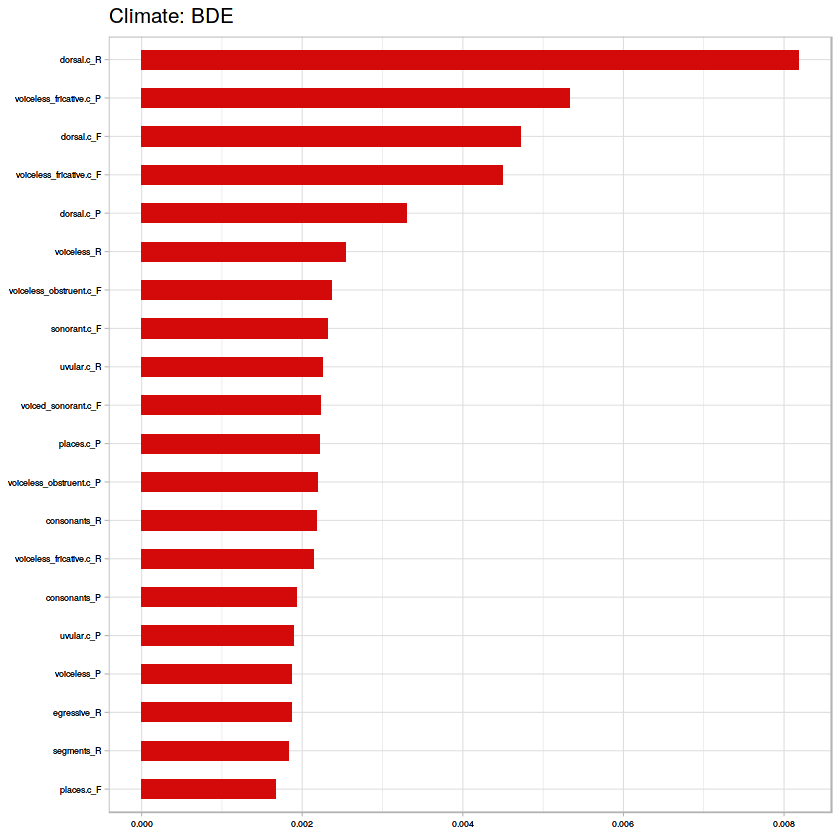

[1] "B" "C"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.812
[1] "RF Confusion Matrix:"
   
      A   X
  A 143  34
  X  13  60


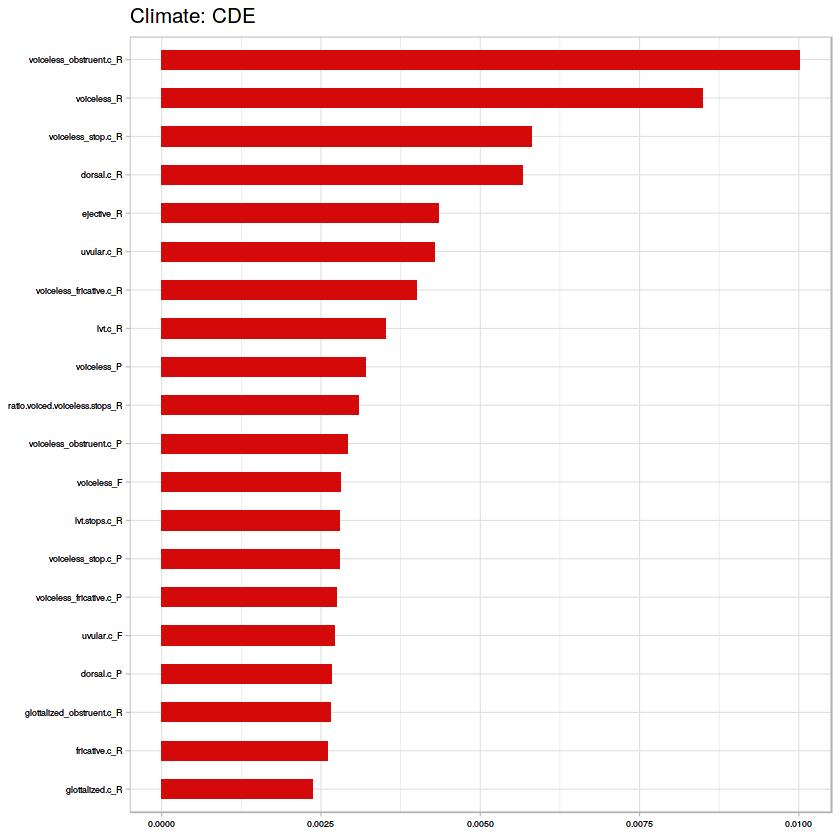

[1] "B" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.854460093896714
[1] "RF Confusion Matrix:"
   
      A   X
  A 155  30
  X   1  27


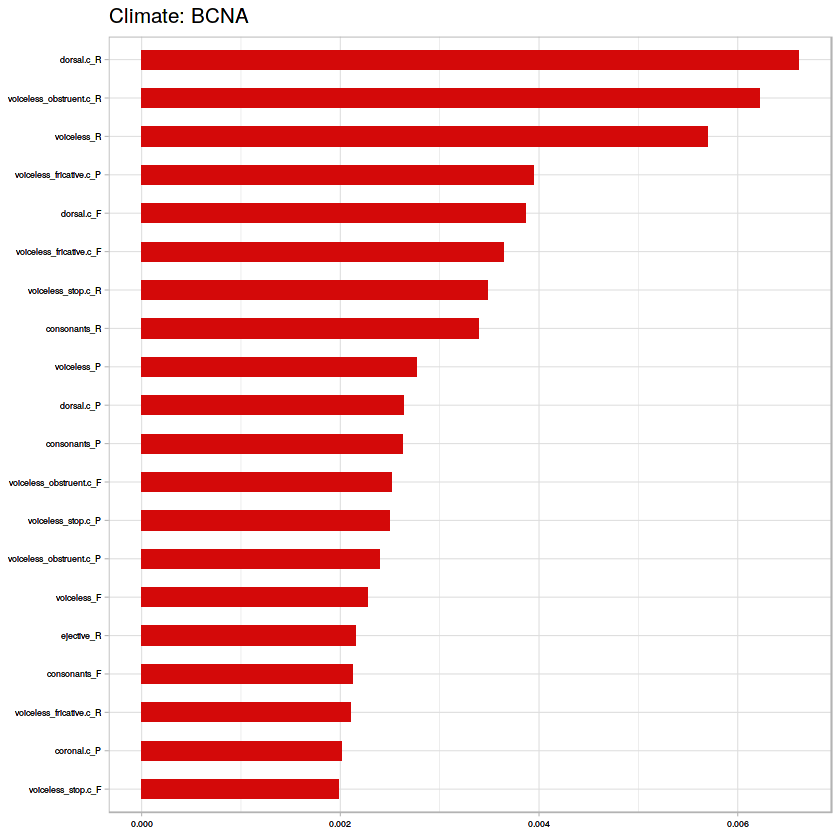

[1] "B" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.857843137254902
[1] "RF Confusion Matrix:"
   
      A   X
  A 154  27
  X   2  21


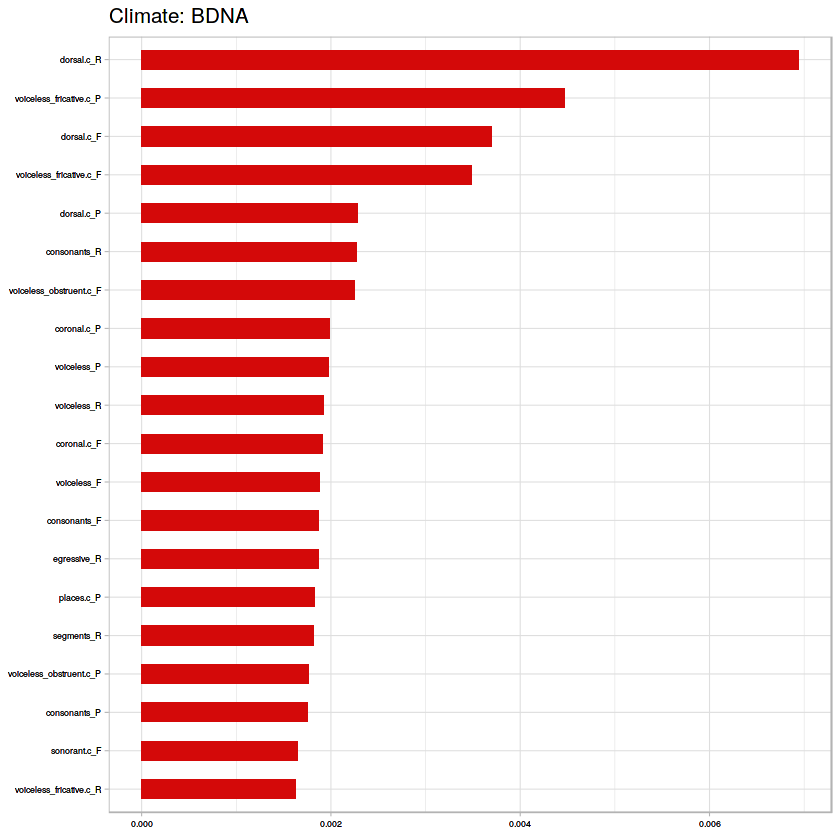

[1] "C" "D"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.835497835497836
[1] "RF Confusion Matrix:"
   
      A   X
  A 150  32
  X   6  43


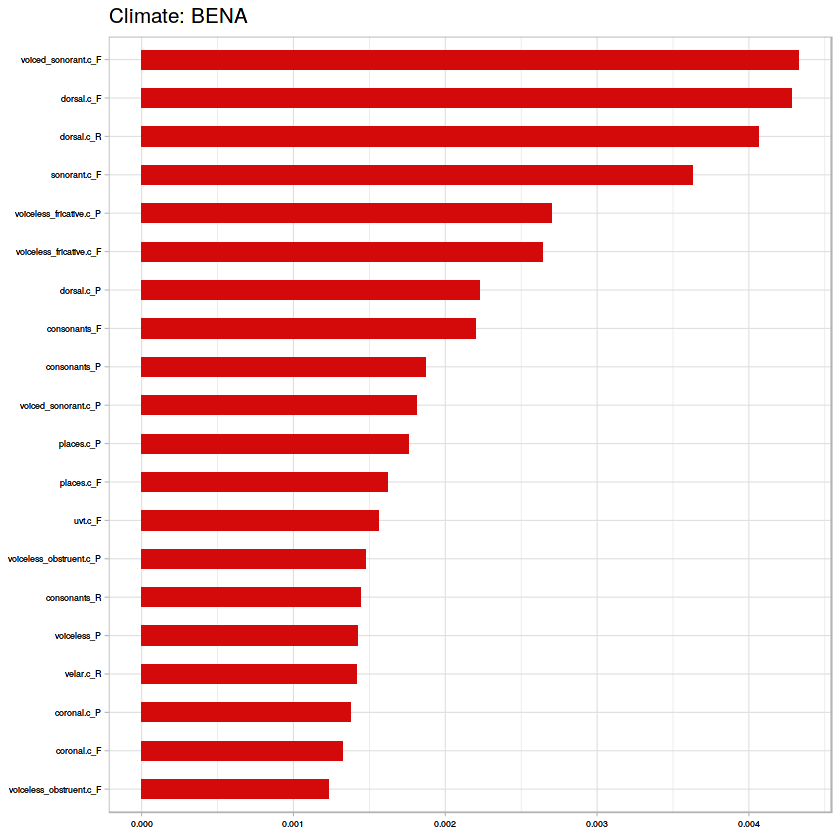

[1] "C" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.851351351351351
[1] "RF Confusion Matrix:"
   
      A   X
  A 153  30
  X   3  36


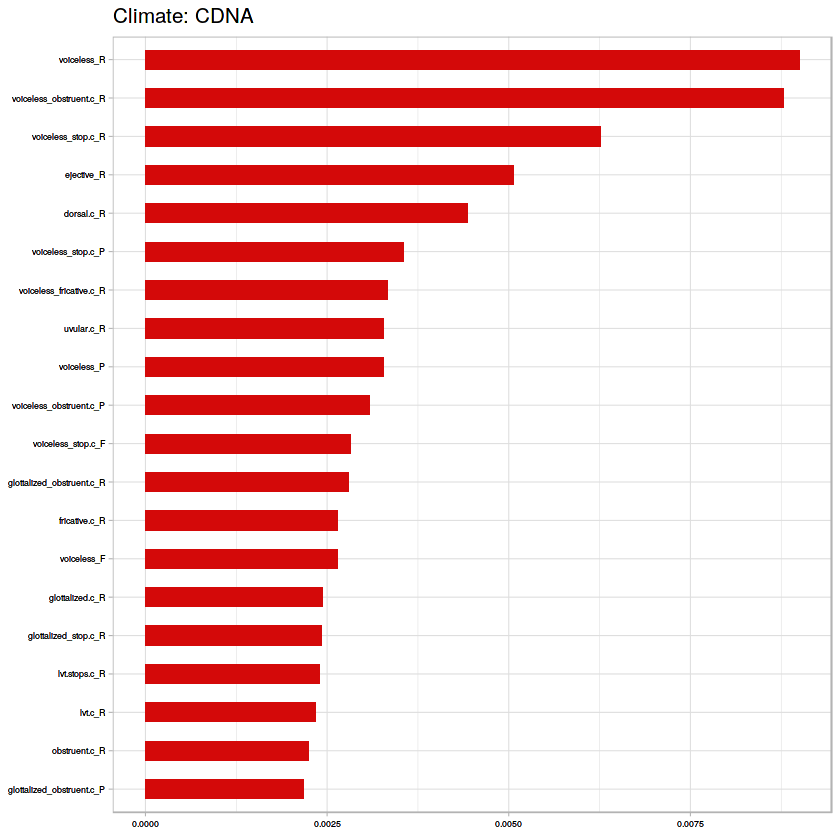

[1] "D" "E"
[1] "Dummy Classifier"
[1] C-V accuracy for Random Forest is 0.908108108108108
[1] "RF Confusion Matrix:"
   
      A   X
  A 156  17
  X   0  12


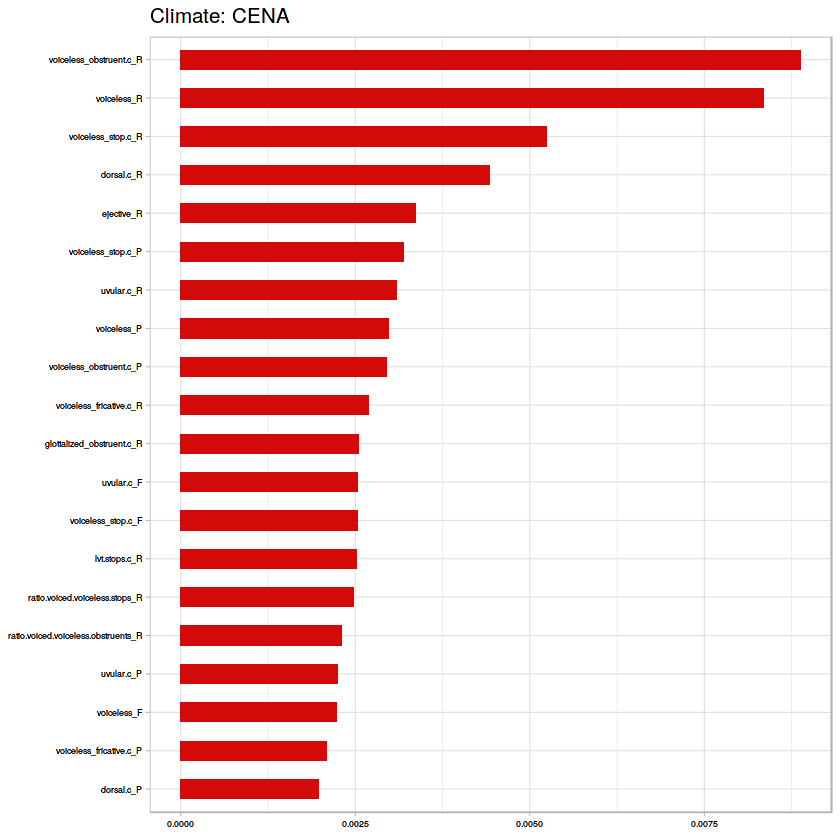

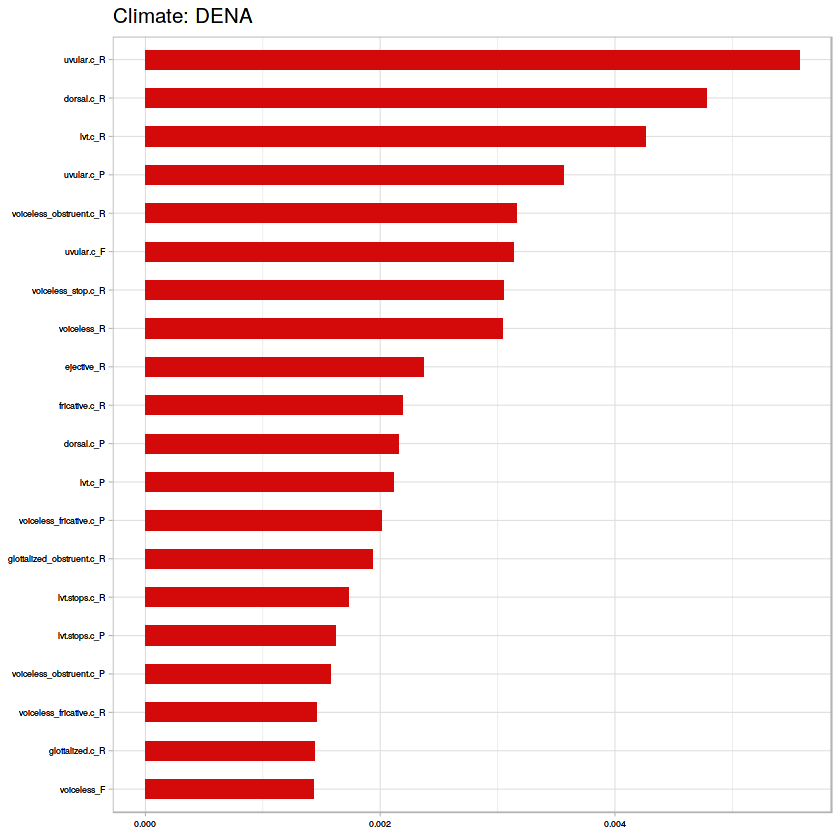

In [59]:
bin_tropvs(family_df) #dorsal.c_R

In [72]:
colnames(family_df)

[1] "Climate"                            
  [2] "segments_P"                         
  [3] "vowels_P"                           
  [4] "monophtongs_P"                      
  [5] "diphtongs_P"                        
  [6] "triphtongs_P"                       
  [7] "heights.v_P"                        
  [8] "lengths.v_P"                        
  [9] "long.v_P"                           
 [10] "nasal.v_P"                          
 [11] "round.v_P"                          
 [12] "high.v_P"                           
 [13] "mid.v_P"                            
 [14] "low.v_P"                            
 [15] "front.v_P"                          
 [16] "back.v_P"                           
 [17] "tense.v_P"                          
 [18] "lax.v_P"                            
 [19] "atr.v_P"                            
 [20] "rtr.v_P"                            
 [21] "raised.v_P"                         
 [22] "retracted.v_P"                      
 [23] "fronted.v_P"                        
 [24] "glottalized.v_P"                    
 [25] "laryngealized.v_P"                  
 [26] "unique.v_P"                         
 [27] "unique.nasal.v_P"                   
 [28] "heights_mono.v_P"                   
 [29] "heights_di.v_P"                     
 [30] "heights_tri.v_P"                    
 [31] "lengths_mono.v_P"                   
 [32] "lengths_di.v_P"                     
 [33] "lengths_tri.v_P"                    
 [34] "long_mono.v_P"                      
 [35] "long_di.v_P"                        
 [36] "long_tri.v_P"                       
 [37] "nasal_mono.v_P"                     
 [38] "nasal_di.v_P"                       
 [39] "nasal_tri.v_P"                      
 [40] "round_mono.v_P"                     
 [41] "round_di.v_P"                       
 [42] "round_tri.v_P"                      
 [43] "high_mono.v_P"                      
 [44] "high_di.v_P"                        
 [45] "high_tri.v_P"                       
 [46] "mid_mono.v_P"                       
 [47] "mid_di.v_P"                         
 [48] "mid_tri.v_P"                        
 [49] "low_mono.v_P"                       
 [50] "low_di.v_P"                         
 [51] "low_tri.v_P"                        
 [52] "front_mono.v_P"                     
 [53] "front_di.v_P"                       
 [54] "front_tri.v_P"                      
 [55] "back_mono.v_P"                      
 [56] "back_di.v_P"                        
 [57] "back_tri.v_P"                       
 [58] "tense_mono.v_P"                     
 [59] "tense_di.v_P"                       
 [60] "tense_tri.v_P"                      
 [61] "lax_mono.v_P"                       
 [62] "lax_di.v_P"                         
 [63] "lax_tri.v_P"                        
 [64] "atr_mono.v_P"                       
 [65] "atr_di.v_P"                         
 [66] "atr_tri.v_P"                        
 [67] "rtr_mono.v_P"                       
 [68] "rtr_di.v_P"                         
 [69] "rtr_tri.v_P"                        
 [70] "raised_mono.v_P"                    
 [71] "raised_di.v_P"                      
 [72] "raised_tri.v_P"                     
 [73] "retracted_mono.v_P"                 
 [74] "retracted_di.v_P"                   
 [75] "retracted_tri.v_P"                  
 [76] "fronted_mono.v_P"                   
 [77] "fronted_di.v_P"                     
 [78] "fronted_tri.v_P"                    
 [79] "glottalized_mono.v_P"               
 [80] "glottalized_di.v_P"                 
 [81] "glottalized_tri.v_P"                
 [82] "laryngealized_mono.v_P"             
 [83] "laryngealized_di.v_P"               
 [84] "laryngealized_tri.v_P"              
 [85] "unique_mono.v_P"                    
 [86] "unique_di.v_P"                      
 [87] "unique_tri.v_P"                     
 [88] "unique.nasal_mono.v_P"              
 [89] "unique.nasal_di.v_P"                
 [90] "unique.nasal_tri.v_P"               
 [91] "consonants_P"                      

In [ ]:
as.factor(as.character(df_f[1]))

In [23]:
df_fam[3]

X
4
6
34
53


In [68]:
df_fam[[3]<-lapply(df_fam[[3]],as.character)

In [82]:
typeof(df_fam[[3]][[1]])

[1] "character"

In [93]:
typeof(df_fam[[3]][1])

[1] "list"

In [51]:
df_fam[3]<-lapply(df_fam[3],as.factor)

In [1]:
df_fam

ERROR: Error in eval(expr, envir, enclos): object 'df_fam' not found


In [249]:
nrow(df_fam[,2:ncol(df_fam)])

[1] 2585

In [244]:
nrow(lg_df)

[1] 532

In [245]:
nrow(df_fam)

[1] 2585

In [218]:
colnames(mdf)<-colnames(df_fam[c(3,9:ncol(df_fam))])

In [43]:
#stratified function
stratified <- function(df, group, size, select = NULL, 
                       replace = FALSE, bothSets = FALSE) {
  if (is.null(select)) {
    df <- df
  } else {
    if (is.null(names(select))) stop("'select' must be a named list")
    if (!all(names(select) %in% names(df)))
      stop("Please verify your 'select' argument")
    temp <- sapply(names(select),
                   function(x) df[[x]] %in% select[[x]])
    df <- df[rowSums(temp) == length(select), ]
  }
  df.interaction <- interaction(df[group], drop = TRUE)
  df.table <- table(df.interaction)
  df.split <- split(df, df.interaction)
  if (length(size) > 1) {
    if (length(size) != length(df.split))
      stop("Number of groups is ", length(df.split),
           " but number of sizes supplied is ", length(size))
    if (is.null(names(size))) {
      n <- setNames(size, names(df.split))
      message(sQuote("size"), " vector entered as:\n\nsize = structure(c(",
              paste(n, collapse = ", "), "),\n.Names = c(",
              paste(shQuote(names(n)), collapse = ", "), ")) \n\n")
    } else {
      ifelse(all(names(size) %in% names(df.split)),
             n <- size[names(df.split)],
             stop("Named vector supplied with names ",
                  paste(names(size), collapse = ", "),
                  "\n but the names for the group levels are ",
                  paste(names(df.split), collapse = ", ")))
    }
  } else if (size < 1) {
    n <- round(df.table * size, digits = 0)
  } else if (size >= 1) {
    if (all(df.table >= size) || isTRUE(replace)) {
      n <- setNames(rep(size, length.out = length(df.split)),
                    names(df.split))
    } else {
      message(
        "Some groups\n---",
        paste(names(df.table[df.table < size]), collapse = ", "),
        "---\ncontain fewer observations",
        " than desired number of samples.\n",
        "All observations have been returned from those groups.")
      n <- c(sapply(df.table[df.table >= size], function(x) x = size),
             df.table[df.table < size])
    }
  }
  temp <- lapply(
    names(df.split),
    function(x) df.split[[x]][sample(df.table[x],
                                     n[x], replace = replace), ])
  set1 <- do.call("rbind", temp)
  
  if (isTRUE(bothSets)) {
    set2 <- df[!rownames(df) %in% rownames(set1), ]
    list(SET1 = set1, SET2 = set2)
  } else {
    set1
  }
}

[1] "All vs Tropical"
[1] "Dummy Classifier accuracy:"
[1] 0.5322519
[1] C-V accuracy for Random Forest is 0.831660231660232
[1] "RF Confusion Matrix:"
   
       A    X
  A 1522  334
  X  102  632


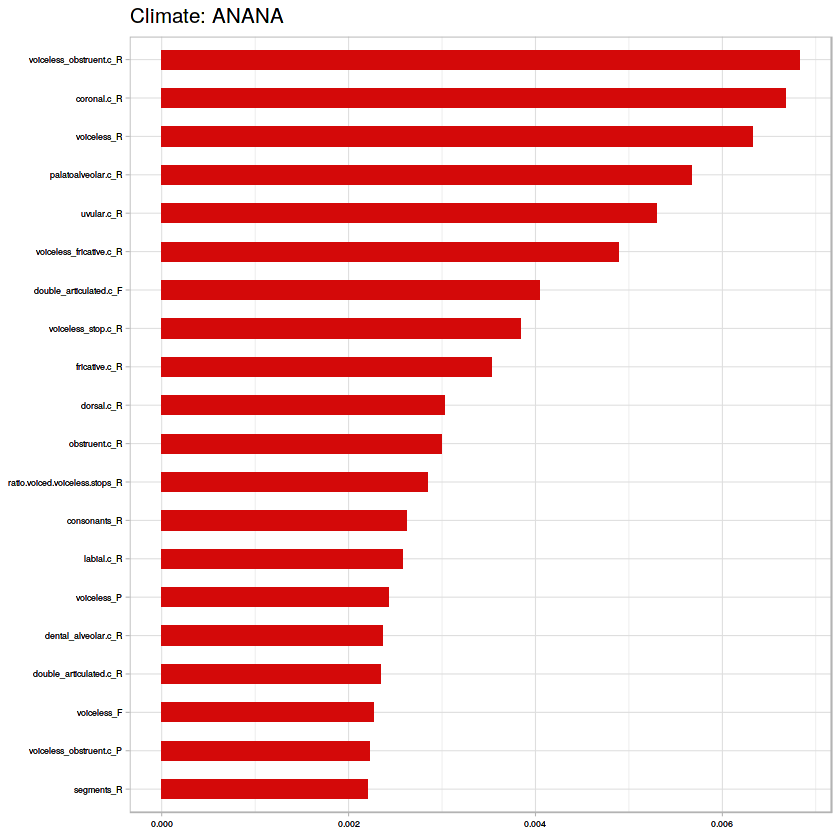

[1] "All vs Arid"
[1] "Dummy Classifier accuracy:"
[1] 0.799861
[1] C-V accuracy for Random Forest is 0.905019305019305
[1] "RF Confusion Matrix:"
   
       B    X
  B   52    6
  X  240 2292


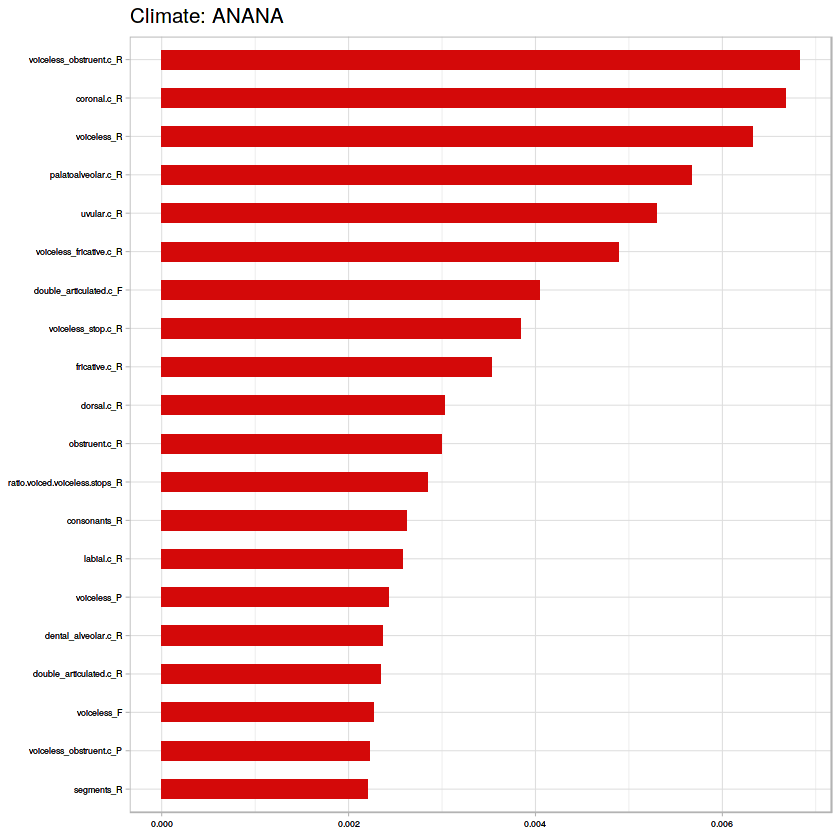

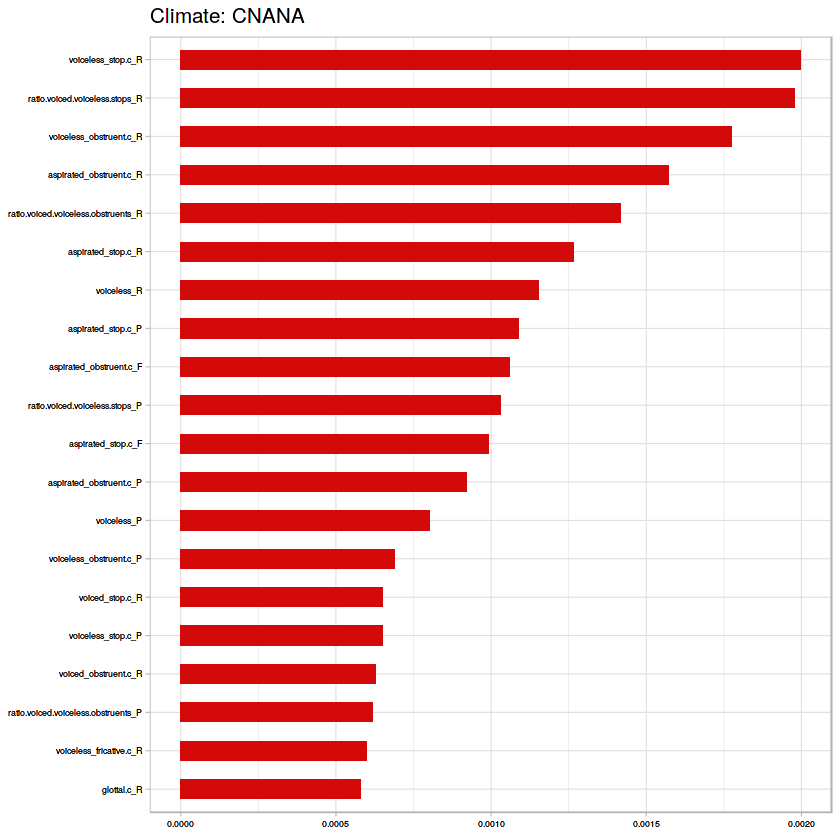

[1] "All vs Cold"
[1] "Dummy Classifier accuracy:"
[1] 0.8840328
[1] C-V accuracy for Random Forest is 0.945173745173745
[1] "RF Confusion Matrix:"
   
       D    X
  D   19    1
  X  141 2429


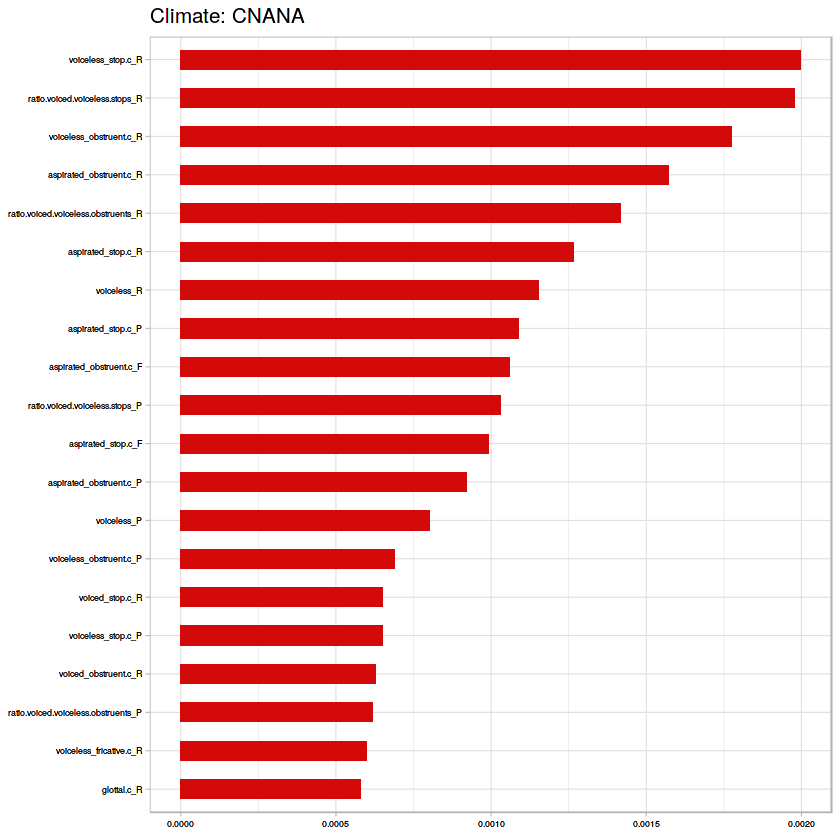

In [ ]:
ovsa(m)

In [1]:
m

ERROR: Error in eval(expr, envir, enclos): object 'm' not found
